In [3]:
from baselines import bench
from baselines.common.vec_env.subproc_vec_env import SubprocVecEnv
from baselines.common.vec_env.dummy_vec_env import DummyVecEnv

from animalai.envs import UnityEnvironment, ArenaConfig
from animalai.envs.gym.environment import AnimalAIEnv

import torch
import gym
import numpy as np


env_path = '../AnimalAI-Olympics/env/AnimalAI.x86_64'
DEVICE = torch.device('cpu')


BATCH_SIZE = 64
ENV = AnimalAIEnv(env_path, worker_id=0, n_arenas=BATCH_SIZE, retro=False)

dir(ENV)

INFO:mlagents.envs:
'Academy' started successfully!
Unity Academy name: Academy
        Number of Brains: 1
        Number of Training Brains : 1
INFO:gym_unity:64 agents within environment.


['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_action_space',
 '_check_agents',
 '_current_state',
 '_env',
 '_flattener',
 '_greyscale',
 '_greyscale_obs_multi',
 '_greyscale_obs_single',
 '_multi_step',
 '_n_agents',
 '_observation_space',
 '_preprocess_multi',
 '_preprocess_single',
 '_resize_observation',
 '_single_step',
 'action_meanings',
 'action_space',
 'arenas_configurations',
 'brain_name',
 'close',
 'flatten_branched',
 'game_over',
 'get_action_meanings',
 'inference',
 'metadata',
 'name',
 'number_agents',
 'observation_space',
 'render',
 'reset',
 'resolution',
 'retro',
 'reward_range',
 'seed',
 'spec',
 'step',
 'uint

In [4]:
from animalai.envs.arena_config import Arena, Item, Vector3
from collections import namedtuple
import os
import numpy as np


object_classes = {
    'Wall': (['Wall'], (0.1, 0.1, 0.1), (40, 10, 40), True),
    'WallTransparent': (['WallTransparent'], (0.1, 0.1, 0.1), (40, 10, 40), False),
    'Ramp': (['Ramp'], (0.5, 0.1, 0.5), (40, 10, 40), True),
    'CylinderTunnel': (['CylinderTunnel'], (2.5,2.5,2.5), (10,10,10), True),
    'CylinderTunnelTransparent': (['CylinderTunnelTransparent'], (2.5, 2.5, 2.5), (10, 10, 10), False),
    'Cardbox': (['Cardbox1', 'Cardbox2'], (0.5, 0.5, 0.5), (10, 10, 10), False),
    'ULObject': (['UObject', 'LObject1', 'LObject2'], (1, 0.3, 3), (5, 2, 20), False),
    'GoodGoal': (['GoodGoal', 'GoodGoalBounce'], 0.5, 5, False),
    'BadGoal': (['BadGoal' ,'BadGoalBounce'], 0.5, 5, False),
    'GoodGoalMulti': (['GoodGoalMulti', 'GoodGoalMultiBounce'], 0.5, 5, False),
    'DeathZone': (['DeathZone'], (1, 0, 1), (40, 0, 40), False),
    'HotZone': (['HotZone'], (1, 0, 1), (40, 0, 40), False),
}


def make_multi_config(classes, n_arenas):
    result = ArenaConfig()
    objects_in_arena = []
    for arena_id in range(n_arenas):
        items = []
        for class_name in classes:
            object_names, min_sizes, max_sizes, can_change_color = object_classes[class_name]
            object_name = np.random.choice(object_names)
            items.append(Item(object_name))
        result.arenas[arena_id] = Arena(items=items)
    return result


def make_config(classes, n_arenas):
    result = ArenaConfig()
    counter = 0
    while counter < n_arenas:
        class_name = classes[counter % len(classes)]
        object_names, min_sizes, max_sizes, can_change_color = object_classes[class_name]
        for object_name in object_names:
            good_values = False
            while not good_values:
                agent_rotation = np.random.rand() * 360
                agent_angle = np.array([np.sin(agent_rotation / 180.0 * np.pi), np.cos(agent_rotation / 180 * np.pi)])
                agent_position = np.array([np.random.rand() * 39, np.random.rand() * 39])
                
                
                if class_name in ('GoodGoal', 'BadGoal', 'GoodGoalMulti'):
                    rnd = np.random.uniform(min_sizes, max_sizes)
                    object_size = np.array([rnd, rnd])
                else:
                    object_size = np.array(
                        [ 
                            np.random.uniform(min_sizes[0], max_sizes[0]),
                            np.random.uniform(min_sizes[2], max_sizes[2])
                        ]
                    ) 
                
                diag = np.sqrt(object_size[0] ** 2 + object_size[1] ** 2)
                
                
                object_position = np.array([np.random.rand() * 39, np.random.rand() * 39])
                object_angle = object_position - agent_position
                object_angle = object_angle / np.sqrt(object_angle[0] ** 2 + object_angle[1] ** 2)
                angle_between = np.arccos(np.clip(np.dot(object_angle, agent_angle), -1.0, 1.0))
                angle_between =  angle_between / np.pi * 180
                #print('agent_rotation', agent_rotation)
                #print('agent_angle', agent_angle)
                #print('agent_position', agent_position)
                #print('object_position', object_position)
                #print('object_angle', object_angle)
                good_values = angle_between < 30
            
            #print('dot', np.dot(object_angle, agent_angle))
            #print('angle_between', angle_between)
            result.arenas[counter] = Arena(
                items=[
                    Item(
                        object_name, 
                        positions=[Vector3(object_position[0], -1, object_position[1])]
                        #sizes=[Vector3(object_size[0], -1, object_size[1])]
                    ),
                    Item('Agent', positions=[Vector3(agent_position[0], -1, agent_position[1])], rotations=[agent_rotation])
                ]
            )
            counter += 1
    return result



def make_empty_config(n_arenas):
    result = ArenaConfig()
    counter = 0
    while counter < n_arenas:
        result.arenas[counter] = Arena(items=[Item('Agent')])
        counter += 1
    return result


CLASSES = list(object_classes.keys())

In [5]:
import gym
import torch
import itertools
import numpy as np


class Wrapper(gym.Wrapper):
    def __init__(self, e, n_envs):
        super().__init__(e)
        self.action_space = gym.spaces.Discrete(9)
        self.observation_space = gym.spaces.Box(0, 255, [n_envs, 3, 84, 84], dtype=float)
        self.lookup = list(itertools.product([0,1,2], repeat=2))
        
    def preproc(self, state):
        state = torch.from_numpy(state.transpose(0, 3, 1, 2) * 255.0)
        state = state.type(torch.uint8)
        return state.to(DEVICE)

    def reset(self, cfg=None):
        obs = self.env.reset(cfg)[0]
        return self.preproc(obs)

    def step(self, actions):
        actions = [self.lookup[a] for a in actions]
        obs, rew, done, info = self.env.step(actions)
        return self.preproc(obs[0]), torch.tensor(rew).reshape(-1, 1), torch.tensor(done).reshape(-1, 1), info
    
    
class FrameStack():
    def __init__(self, e, nstack):
        self.env = e
        self.nstack = nstack

        wos = self.env.observation_space  # wrapped ob space
        print(wos)
        self.shape_dim1 = wos.shape[1]

        low = np.repeat(wos.low, self.nstack, axis=1)
        high = np.repeat(wos.high, self.nstack, axis=1)
        
        self.stacked_obs = torch.zeros(low.shape, dtype=torch.uint8).to(DEVICE)
                
        self.observation_space = gym.spaces.Box(
            low=low, high=high, dtype=self.env.observation_space.dtype)
        self.action_space = self.env.action_space

    def step(self, actions):
        obs, rews, news, infos = self.env.step(actions)
        self.stacked_obs[:, :-self.shape_dim1] = \
            self.stacked_obs[:, self.shape_dim1:]
        for (i, new) in enumerate(news):
            if new:
                self.stacked_obs[i] = 0
        self.stacked_obs[:, -self.shape_dim1:] = obs
        return self.stacked_obs, rews, news, infos

    def reset(self, cfg=None):
        obs = self.env.reset(cfg)
        if torch.backends.cudnn.deterministic:
            self.stacked_obs = torch.zeros(self.stacked_obs.shape)
        else:
            self.stacked_obs.zero_()
        self.stacked_obs[:, -self.shape_dim1:] = obs
        return self.stacked_obs


wrapped_env = Wrapper(ENV, BATCH_SIZE)

In [4]:
conf = make_config(['Wall'], BATCH_SIZE)
obs = wrapped_env.reset(conf)
obs.shape

torch.Size([64, 3, 84, 84])

In [6]:
import copy
import glob
import os
import time
from collections import deque

import gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from a2c_ppo_acktr import algo, utils
from a2c_ppo_acktr.algo import gail
from a2c_ppo_acktr.arguments import get_args
from a2c_ppo_acktr.envs import make_vec_envs
from a2c_ppo_acktr.model import Policy, CNNBase
from a2c_ppo_acktr.storage import RolloutStorage
from evaluation import evaluate


# actor_critic, _ = torch.load('AAI-ppo-nornn-48000.pt')
# actor_critic.train()
# actor_critic.to(DEVICE)



OBS_SHAPE = wrapped_env.reset()[0].shape
ACTION_SPACE = wrapped_env.action_space



class Flatten(nn.Module):
    def forward(self, x):
        return x.view(x.size(0), -1)
    

class Classifier(nn.Module):
    def __init__(self, num_inputs, features_size=12):
        super().__init__()

        self.init_ = lambda m: utils.init(m, nn.init.orthogonal_, lambda x: nn.init.
                               constant_(x, 0), nn.init.calculate_gain('relu'))

        self.main = nn.Sequential(
            self.init_(nn.Conv2d(num_inputs, 32, 8, stride=4)), nn.ReLU(),
            self.init_(nn.Conv2d(32, 64, 4, stride=2)), nn.ReLU(),
            self.init_(nn.Conv2d(64, 32, 3, stride=1)), nn.ReLU(), Flatten(),
            self.init_(nn.Linear(32 * 7 * 7, 512)), nn.ReLU(),
            self.init_(nn.Linear(512, features_size))
        )

    def forward(self, inputs):
        x = self.main(inputs.float() / 255.0)
        return x
    
    def reinit(self):
        modules = list(self.main.modules())
        self.init_(modules[-1])
        self.init_(modules[-3])
    

print(OBS_SHAPE)

classifier = Classifier(OBS_SHAPE[0], len(CLASSES))
state = torch.load('multi_model', map_location='cpu')
classifier.load_state_dict(state)
#classifier.reinit()

#for param in classifier.parameters():
#    param.requires_grad = False
#for param in classifier.dist.parameters():
#    param.requires_grad = True

classifier.train()

classifier.to(DEVICE)


torch.Size([3, 84, 84])


Classifier(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
    (3): ReLU()
    (4): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1))
    (5): ReLU()
    (6): Flatten()
    (7): Linear(in_features=1568, out_features=512, bias=True)
    (8): ReLU()
    (9): Linear(in_features=512, out_features=12, bias=True)
  )
)

In [6]:
classifier(obs).shape

torch.Size([64, 12])

In [ ]:
from tqdm import trange
from tensorboardX import SummaryWriter
from collections import defaultdict

writer = SummaryWriter(
    'tbrd_logs/multi_classifier_BCEWithLogitsLoss',
)

n_frames = int(2e6 / BATCH_SIZE)
optimizer = torch.optim.Adam(classifier.parameters(), lr=2.5e-4, eps=1e-5)
state = torch.load('multi_optim', map_location='cpu')
optimizer.load_state_dict(state)

curr_worker_id = 0

for j in trange(0, n_frames):
    entropis = []
    classes_probs = defaultdict(list)
    cross_entropy = torch.zeros(1, device=DEVICE)
    
    if j % 500 == 0:
        worker_id = (curr_worker_id + 1) % 2
        curr_worker_id = worker_id
        
        torch.save(classifier.state_dict(), 'multi_model_{}'.format(j))
        torch.save(optimizer.state_dict(), 'multi_optim_{}'.format(j))
        
        ENV.close()
        del wrapped_env
        del ENV
        ENV = AnimalAIEnv(env_path, worker_id=worker_id, n_arenas=BATCH_SIZE, retro=False)
        wrapped_env = Wrapper(ENV, BATCH_SIZE)

    for class_id, object_class in enumerate(CLASSES):
        pos_weight = torch.ones([len(CLASSES)])  # All weights are equal to 1
        pos_weight[class_id] = len(CLASSES)
        criterion = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        
        target = torch.zeros([BATCH_SIZE, len(CLASSES)], dtype=torch.float32)  # 12 classes, batch size = 100
        target[:, class_id] = torch.ones(BATCH_SIZE)
        
        cfg = make_config([object_class], BATCH_SIZE)
        obs = wrapped_env.reset(cfg)
        output = classifier(obs)
        
        cross_entropy += criterion(output, target)
            
        #probs = output.cpu().detach().numpy()[:, class_id]
        probs = torch.sigmoid(output.cpu().detach()).numpy() # 64 x 12 
        class_probs = 2 * probs[:, class_id] - np.sum(probs, axis=1)
        classes_probs[object_class].extend(class_probs)
    
    #empty config
    criterion = torch.nn.BCEWithLogitsLoss()
    target = torch.zeros([BATCH_SIZE, len(CLASSES)], dtype=torch.float32)  # 12 classes, batch size = 100
    cfg = make_empty_config(BATCH_SIZE)
    obs = wrapped_env.reset(cfg)
    output = classifier(obs)
    cross_entropy += criterion(output, target)
    probs = torch.sigmoid(output.cpu().detach()).numpy() # 64 x 12 
    classes_probs['empty'].extend(np.sum(probs, axis=1))
    
    
    #train step
    optimizer.zero_grad()
    cross_entropy.backward()
    nn.utils.clip_grad_norm_(classifier.parameters(), 0.5)
    optimizer.step()
    

    writer.add_scalar('cross_entropy', np.mean(cross_entropy.cpu().detach().numpy()), j)
    for class_name in classes_probs:
        writer.add_scalar(class_name, np.mean(classes_probs[class_name]), j)


In [ ]:
torch.save(classifier.state_dict(), 'multi_model')
torch.save(optimizer.state_dict(), 'multi_optim')
j

Wall
Ramp  prob =  0.3486061
WallTransparent  prob =  0.32912582
Wall  prob =  0.32690004
DeathZone  prob =  0.31885594
HotZone  prob =  0.30099946
CylinderTunnel  prob =  0.28283852
Cardbox  prob =  0.26446152
CylinderTunnelTransparent  prob =  0.25734845
ULObject  prob =  0.20191583
GoodGoalMulti  prob =  0.09784526
GoodGoal  prob =  0.082158715
BadGoal  prob =  0.058992222


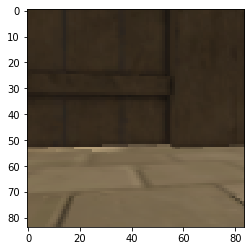

CylinderTunnel  prob =  0.997224
Ramp  prob =  0.1049262
Wall  prob =  0.10368358
HotZone  prob =  9.083955e-28
BadGoal  prob =  5.2049117e-34
GoodGoal  prob =  5.9529883e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


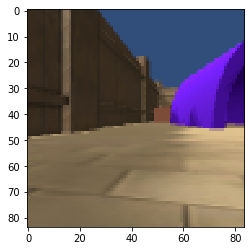

ULObject  prob =  0.9999937
Ramp  prob =  0.008482756
Wall  prob =  0.0023774859
CylinderTunnel  prob =  0.00018738637
BadGoal  prob =  1.4719707e-12
DeathZone  prob =  5.6317045e-16
HotZone  prob =  1.5290961e-19
WallTransparent  prob =  1.3938722e-28
GoodGoal  prob =  9.8574835e-30
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


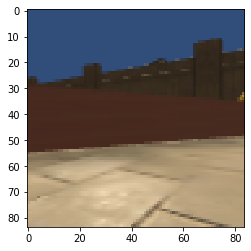

CylinderTunnel  prob =  0.06747369
Ramp  prob =  0.00016233222
Wall  prob =  2.4287272e-07
HotZone  prob =  1.7387153e-07
CylinderTunnelTransparent  prob =  3.9232862e-08
Cardbox  prob =  8.7379694e-17
BadGoal  prob =  1.0969891e-19
WallTransparent  prob =  1.6899542e-20
ULObject  prob =  8.087325e-22
GoodGoal  prob =  1.5580861e-23
GoodGoalMulti  prob =  7.5189654e-24
DeathZone  prob =  5.2137167e-26


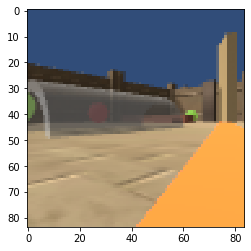

Ramp  prob =  0.9903717
Wall  prob =  0.24650718
CylinderTunnel  prob =  0.051425766
HotZone  prob =  1.1629588e-21
BadGoal  prob =  3.1835232e-32
GoodGoal  prob =  3.3864244e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


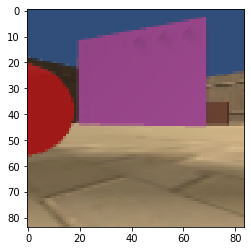

CylinderTunnel  prob =  0.99880373
Ramp  prob =  0.64260375
Wall  prob =  0.0027793306
GoodGoal  prob =  3.019757e-20
HotZone  prob =  2.4742573e-24
BadGoal  prob =  6.043105e-26
Cardbox  prob =  1.2355703e-30
ULObject  prob =  1.7815488e-32
GoodGoalMulti  prob =  5.058076e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


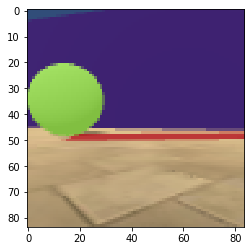

ULObject  prob =  0.8101512
Ramp  prob =  0.5396071
Wall  prob =  0.35844594
CylinderTunnel  prob =  0.27965537
HotZone  prob =  4.5082127e-16
DeathZone  prob =  4.2140434e-16
BadGoal  prob =  5.1140676e-17
WallTransparent  prob =  5.737622e-20
GoodGoal  prob =  2.625859e-23
Cardbox  prob =  8.99228e-28
CylinderTunnelTransparent  prob =  1.6007011e-34
GoodGoalMulti  prob =  5.970545e-38


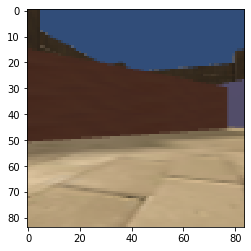

ULObject  prob =  0.99999416
Ramp  prob =  0.045086358
Wall  prob =  0.0100438595
CylinderTunnel  prob =  0.0027892073
BadGoal  prob =  1.9972527e-11
HotZone  prob =  4.979565e-12
DeathZone  prob =  1.8325014e-12
WallTransparent  prob =  2.7316666e-18
GoodGoal  prob =  1.996578e-19
Cardbox  prob =  3.8262953e-28
CylinderTunnelTransparent  prob =  4.1289636e-29
GoodGoalMulti  prob =  1.3496087e-33


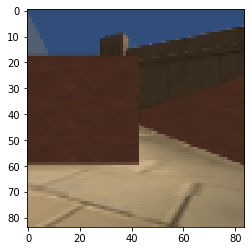

CylinderTunnel  prob =  0.9984036
Ramp  prob =  0.6212408
Wall  prob =  0.064536385
BadGoal  prob =  4.745047e-13
HotZone  prob =  2.7847486e-13
GoodGoal  prob =  1.0555661e-15
ULObject  prob =  4.1967e-17
Cardbox  prob =  1.4677671e-17
CylinderTunnelTransparent  prob =  1.2495226e-18
DeathZone  prob =  1.7793253e-20
WallTransparent  prob =  7.404722e-21
GoodGoalMulti  prob =  6.994085e-22


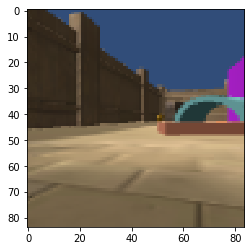

HotZone  prob =  1.0
Ramp  prob =  0.0053435196
Wall  prob =  8.086787e-05
ULObject  prob =  4.0042655e-10
Cardbox  prob =  1.2669113e-11
CylinderTunnel  prob =  2.3517447e-12
BadGoal  prob =  1.6270704e-17
DeathZone  prob =  4.9833163e-20
WallTransparent  prob =  1.5845955e-26
GoodGoal  prob =  7.7187474e-29
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


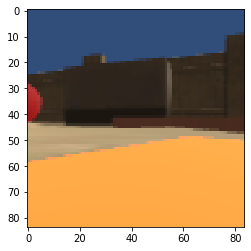

Ramp  prob =  0.9904525
Wall  prob =  0.7469779
CylinderTunnel  prob =  3.035544e-07
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


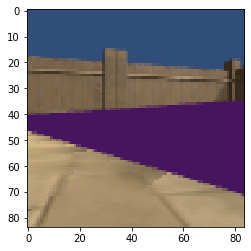

Wall  prob =  0.90267116
Ramp  prob =  0.881286
CylinderTunnel  prob =  0.5586483
CylinderTunnelTransparent  prob =  0.041262064
WallTransparent  prob =  0.037047017
HotZone  prob =  0.000517392
Cardbox  prob =  0.000304762
GoodGoalMulti  prob =  0.0002694455
BadGoal  prob =  0.00025128163
ULObject  prob =  6.8673624e-05
DeathZone  prob =  4.4105705e-05
GoodGoal  prob =  2.6453636e-05


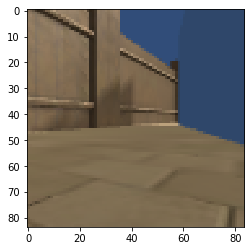

Ramp  prob =  0.99827015
Wall  prob =  0.6419771
CylinderTunnel  prob =  3.7043545e-08
HotZone  prob =  9.3444766e-18
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


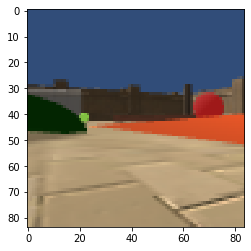

WallTransparent  prob =  0.9999349
Wall  prob =  0.037142396
Ramp  prob =  0.03628306
CylinderTunnelTransparent  prob =  0.0015691597
CylinderTunnel  prob =  6.56279e-05
Cardbox  prob =  1.9153147e-10
BadGoal  prob =  1.6976427e-13
HotZone  prob =  4.6076413e-18
ULObject  prob =  2.244112e-18
DeathZone  prob =  2.4840614e-19
GoodGoalMulti  prob =  4.361786e-22
GoodGoal  prob =  9.00308e-23


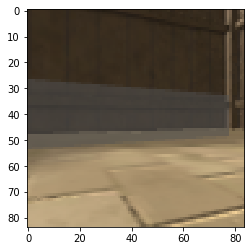

HotZone  prob =  0.9930258
Ramp  prob =  0.76752096
Wall  prob =  0.36909428
CylinderTunnel  prob =  0.0036992992
BadGoal  prob =  8.392628e-15
ULObject  prob =  2.1470007e-16
Cardbox  prob =  1.5839357e-20
GoodGoalMulti  prob =  2.2852119e-21
GoodGoal  prob =  5.0627523e-22
DeathZone  prob =  1.6786443e-22
WallTransparent  prob =  2.612907e-32
CylinderTunnelTransparent  prob =  0.0


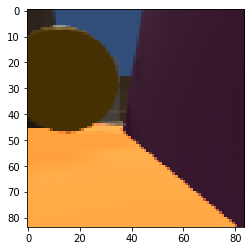

Ramp  prob =  0.9770931
CylinderTunnel  prob =  0.73455524
Wall  prob =  0.2966532
ULObject  prob =  1.828338e-14
BadGoal  prob =  2.9449628e-17
WallTransparent  prob =  9.504737e-20
GoodGoal  prob =  3.993784e-22
Cardbox  prob =  9.8150055e-23
HotZone  prob =  4.3154877e-25
DeathZone  prob =  2.9955063e-25
CylinderTunnelTransparent  prob =  3.2738795e-27
GoodGoalMulti  prob =  4.2419857e-35


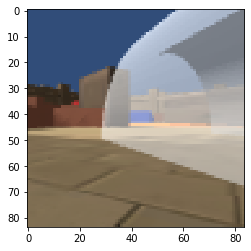

HotZone  prob =  0.42959803
WallTransparent  prob =  0.40232837
Ramp  prob =  0.37241098
DeathZone  prob =  0.35372332
ULObject  prob =  0.34351102
Cardbox  prob =  0.3365839
CylinderTunnel  prob =  0.33502534
CylinderTunnelTransparent  prob =  0.3202388
Wall  prob =  0.29633898
GoodGoalMulti  prob =  0.19574688
GoodGoal  prob =  0.14598379
BadGoal  prob =  0.08124328


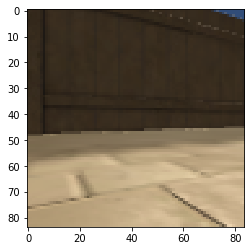

Ramp  prob =  0.99257165
Wall  prob =  0.89026934
CylinderTunnel  prob =  3.784137e-08
ULObject  prob =  1.08047085e-29
DeathZone  prob =  7.551704e-32
BadGoal  prob =  2.0422177e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


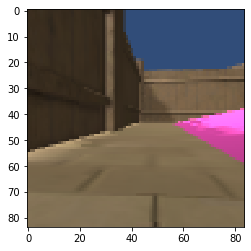

CylinderTunnel  prob =  0.99769336
Ramp  prob =  1.2597788e-05
GoodGoalMulti  prob =  1.7858644e-06
Wall  prob =  1.757822e-07
BadGoal  prob =  6.811375e-23
WallTransparent  prob =  2.3598364e-24
GoodGoal  prob =  3.171298e-29
HotZone  prob =  1.0929688e-30
CylinderTunnelTransparent  prob =  4.9609897e-36
Cardbox  prob =  1.4721427e-37
ULObject  prob =  0.0
DeathZone  prob =  0.0


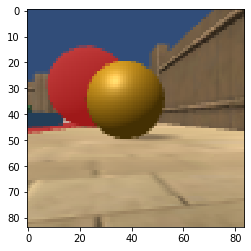

WallTransparent  prob =  0.14313924
Wall  prob =  0.12520984
Ramp  prob =  0.1155742
DeathZone  prob =  0.101689935
CylinderTunnelTransparent  prob =  0.09446597
HotZone  prob =  0.0939484
CylinderTunnel  prob =  0.08831417
ULObject  prob =  0.08005513
BadGoal  prob =  0.07141025
GoodGoal  prob =  0.045753095
GoodGoalMulti  prob =  0.035281003
Cardbox  prob =  0.027653841


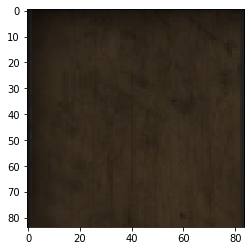

HotZone  prob =  0.5386153
WallTransparent  prob =  0.50833803
Ramp  prob =  0.4812575
ULObject  prob =  0.4808041
DeathZone  prob =  0.47883123
Wall  prob =  0.448428
CylinderTunnelTransparent  prob =  0.41847527
CylinderTunnel  prob =  0.39977476
Cardbox  prob =  0.2343603
GoodGoalMulti  prob =  0.117092565
GoodGoal  prob =  0.10731123
BadGoal  prob =  0.102113955


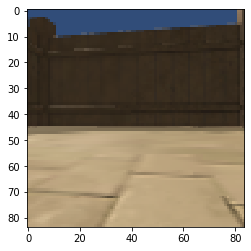

Ramp  prob =  0.91241586
CylinderTunnel  prob =  0.7826375
Wall  prob =  0.7770405
Cardbox  prob =  1.9408927e-07
BadGoal  prob =  1.6576822e-08
WallTransparent  prob =  1.5974212e-09
HotZone  prob =  9.563464e-11
ULObject  prob =  3.12978e-11
CylinderTunnelTransparent  prob =  2.9553027e-11
GoodGoalMulti  prob =  6.7090114e-12
GoodGoal  prob =  2.644864e-12
DeathZone  prob =  8.259771e-15


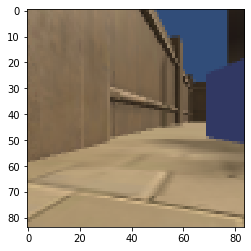

ULObject  prob =  0.9915541
CylinderTunnel  prob =  0.6362957
Ramp  prob =  0.2182738
Wall  prob =  0.05175045
HotZone  prob =  4.1513842e-17
DeathZone  prob =  1.1814547e-18
BadGoal  prob =  4.2277072e-19
GoodGoal  prob =  8.60216e-27
WallTransparent  prob =  6.585072e-27
Cardbox  prob =  8.149363e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


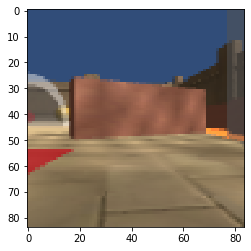

Wall  prob =  0.051630087
Ramp  prob =  0.04945569
CylinderTunnel  prob =  0.048592646
ULObject  prob =  0.032605834
BadGoal  prob =  0.025896598
WallTransparent  prob =  0.024061736
HotZone  prob =  0.019542685
CylinderTunnelTransparent  prob =  0.018296232
GoodGoal  prob =  0.013707504
DeathZone  prob =  0.013194455
GoodGoalMulti  prob =  0.0057164216
Cardbox  prob =  0.0023916457


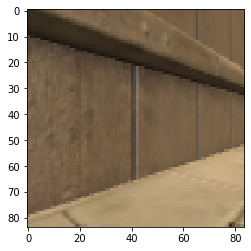

ULObject  prob =  0.3052202
DeathZone  prob =  0.26825416
HotZone  prob =  0.23981825
WallTransparent  prob =  0.21312912
CylinderTunnelTransparent  prob =  0.200086
Cardbox  prob =  0.19924524
Ramp  prob =  0.18800431
Wall  prob =  0.1640391
GoodGoalMulti  prob =  0.16319898
CylinderTunnel  prob =  0.13011466
GoodGoal  prob =  0.095562056
BadGoal  prob =  0.06975226


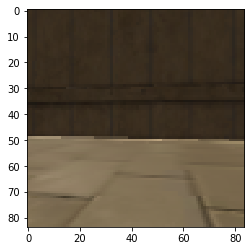

Ramp  prob =  0.9936639
Wall  prob =  0.50033665
CylinderTunnel  prob =  0.35441172
GoodGoal  prob =  1.6795808e-13
HotZone  prob =  2.5797818e-14
ULObject  prob =  1.2050504e-19
BadGoal  prob =  5.853823e-20
Cardbox  prob =  1.2302431e-20
GoodGoalMulti  prob =  2.1436765e-25
DeathZone  prob =  1.5916707e-27
WallTransparent  prob =  9.182651e-37
CylinderTunnelTransparent  prob =  0.0


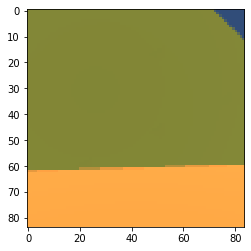

Ramp  prob =  0.95698476
Wall  prob =  0.32875475
HotZone  prob =  0.07565078
CylinderTunnel  prob =  1.2367627e-06
BadGoal  prob =  5.61372e-08
DeathZone  prob =  9.1774025e-21
GoodGoal  prob =  1.2909797e-23
ULObject  prob =  3.992257e-24
WallTransparent  prob =  1.10915246e-29
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


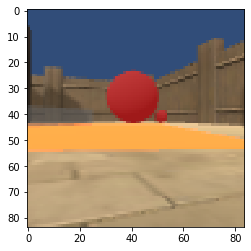

DeathZone  prob =  0.4396501
HotZone  prob =  0.43609905
Ramp  prob =  0.37569985
WallTransparent  prob =  0.37088436
ULObject  prob =  0.36840376
CylinderTunnelTransparent  prob =  0.3356043
CylinderTunnel  prob =  0.32957238
Wall  prob =  0.3290055
Cardbox  prob =  0.16591391
GoodGoal  prob =  0.0866706
GoodGoalMulti  prob =  0.07655542
BadGoal  prob =  0.04953682


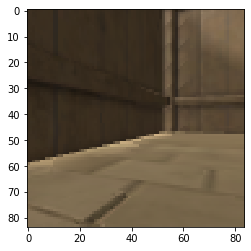

Ramp  prob =  0.9909406
CylinderTunnel  prob =  0.38196954
Wall  prob =  0.117046334
ULObject  prob =  4.5322557e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


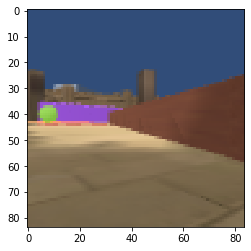

Ramp  prob =  0.8881503
WallTransparent  prob =  0.82698447
Wall  prob =  0.69750595
CylinderTunnelTransparent  prob =  0.16502701
CylinderTunnel  prob =  0.0914737
GoodGoalMulti  prob =  4.4141775e-06
BadGoal  prob =  3.462871e-06
GoodGoal  prob =  2.100705e-06
HotZone  prob =  1.9525771e-06
DeathZone  prob =  1.2968192e-07
Cardbox  prob =  4.2718913e-08
ULObject  prob =  3.3273963e-08


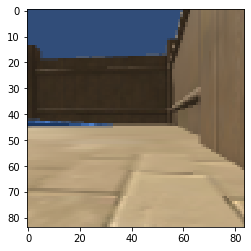

GoodGoalMulti  prob =  0.9999999
WallTransparent  prob =  7.326627e-06
CylinderTunnel  prob =  5.226646e-06
Ramp  prob =  2.3504458e-06
Wall  prob =  1.3844295e-06
BadGoal  prob =  7.629659e-08
GoodGoal  prob =  3.261998e-09
HotZone  prob =  7.995501e-10
CylinderTunnelTransparent  prob =  8.4158834e-12
ULObject  prob =  6.1439796e-13
Cardbox  prob =  3.3633561e-13
DeathZone  prob =  9.981392e-14


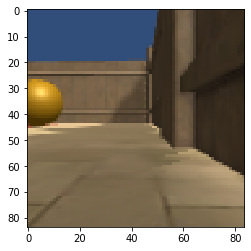

Ramp  prob =  0.27430665
CylinderTunnelTransparent  prob =  0.2566879
CylinderTunnel  prob =  0.25397655
ULObject  prob =  0.2485557
WallTransparent  prob =  0.23889756
HotZone  prob =  0.23475286
Wall  prob =  0.228639
Cardbox  prob =  0.2021788
DeathZone  prob =  0.1987243
GoodGoalMulti  prob =  0.12309267
BadGoal  prob =  0.10544729
GoodGoal  prob =  0.099117786


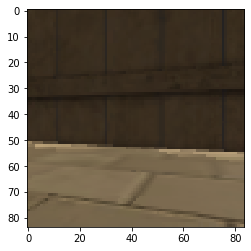

Ramp  prob =  3.9505667e-06
ULObject  prob =  3.411063e-07
Wall  prob =  3.988415e-08
DeathZone  prob =  3.1820335e-11
HotZone  prob =  1.0998066e-12
CylinderTunnel  prob =  4.029366e-13
Cardbox  prob =  2.4711653e-15
WallTransparent  prob =  1.8594633e-17
GoodGoal  prob =  1.5917848e-21
BadGoal  prob =  1.5613304e-21
CylinderTunnelTransparent  prob =  2.3841412e-23
GoodGoalMulti  prob =  0.0


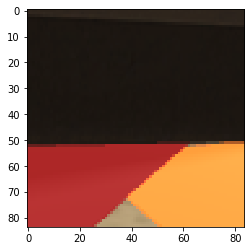

GoodGoalMulti  prob =  0.9976761
Ramp  prob =  0.43813327
Wall  prob =  0.230759
CylinderTunnel  prob =  0.22384594
WallTransparent  prob =  8.7306655e-11
HotZone  prob =  5.676977e-13
GoodGoal  prob =  5.931252e-15
CylinderTunnelTransparent  prob =  1.7982342e-19
BadGoal  prob =  6.134122e-20
Cardbox  prob =  2.9174902e-24
DeathZone  prob =  2.029777e-26
ULObject  prob =  6.1362066e-27


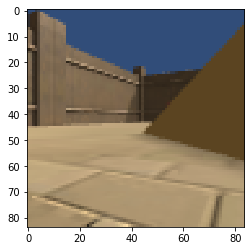

DeathZone  prob =  0.9973769
Ramp  prob =  0.16247399
Wall  prob =  4.1364437e-06
ULObject  prob =  4.474667e-08
CylinderTunnel  prob =  1.6324396e-12
BadGoal  prob =  3.199559e-16
GoodGoal  prob =  9.4914406e-20
WallTransparent  prob =  2.8229337e-23
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


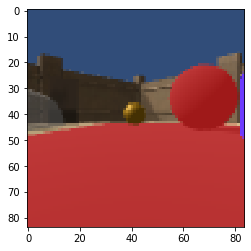

Ramp  prob =  0.98518145
CylinderTunnel  prob =  0.86696047
Wall  prob =  0.2986727
Cardbox  prob =  2.088849e-17
BadGoal  prob =  1.0109541e-23
ULObject  prob =  7.7956664e-26
HotZone  prob =  2.5387632e-26
GoodGoal  prob =  3.8162976e-27
WallTransparent  prob =  1.5974659e-29
DeathZone  prob =  7.158263e-34
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


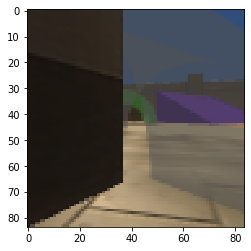

CylinderTunnel  prob =  0.8165836
BadGoal  prob =  0.09033445
Ramp  prob =  0.00050525373
Wall  prob =  0.0003537015
GoodGoal  prob =  3.0019707e-13
WallTransparent  prob =  5.197445e-14
Cardbox  prob =  7.818463e-15
DeathZone  prob =  7.64842e-17
HotZone  prob =  4.8289878e-18
ULObject  prob =  2.2214368e-20
GoodGoalMulti  prob =  5.785908e-21
CylinderTunnelTransparent  prob =  1.63789405e-24


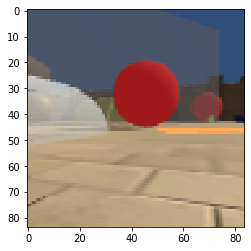

Wall  prob =  0.89469945
Ramp  prob =  0.73435247
CylinderTunnel  prob =  0.71603644
Cardbox  prob =  9.956323e-12
HotZone  prob =  3.3633964e-12
BadGoal  prob =  1.6386679e-14
GoodGoal  prob =  5.471485e-16
GoodGoalMulti  prob =  3.8817866e-17
ULObject  prob =  1.9957796e-18
WallTransparent  prob =  3.1834453e-20
DeathZone  prob =  3.1098434e-20
CylinderTunnelTransparent  prob =  9.176397e-34


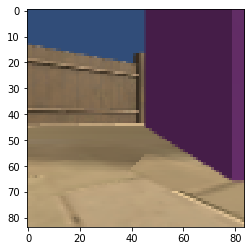

Ramp  prob =  0.998154
Wall  prob =  0.39096102
CylinderTunnel  prob =  0.009944646
ULObject  prob =  9.995522e-19
DeathZone  prob =  6.305434e-22
BadGoal  prob =  5.483938e-24
Cardbox  prob =  6.6922754e-25
HotZone  prob =  3.8114983e-26
GoodGoal  prob =  3.392405e-29
WallTransparent  prob =  7.095255e-39
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


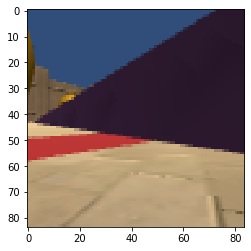

Ramp  prob =  0.99502915
Wall  prob =  0.31732473
CylinderTunnel  prob =  0.050291594
GoodGoal  prob =  7.468847e-18
GoodGoalMulti  prob =  6.6743494e-26
BadGoal  prob =  1.2391641e-27
HotZone  prob =  1.6121898e-28
ULObject  prob =  9.3214536e-38
WallTransparent  prob =  1.2756327e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
DeathZone  prob =  0.0


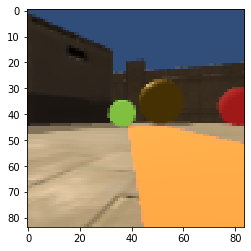

CylinderTunnelTransparent  prob =  0.999974
CylinderTunnel  prob =  0.06309053
Ramp  prob =  0.023612814
Wall  prob =  0.019556224
WallTransparent  prob =  9.3924136e-05
Cardbox  prob =  2.4384834e-08
BadGoal  prob =  7.264266e-15
HotZone  prob =  1.30730096e-20
ULObject  prob =  8.588546e-21
DeathZone  prob =  3.6314155e-24
GoodGoalMulti  prob =  6.3994216e-25
GoodGoal  prob =  3.1035055e-26


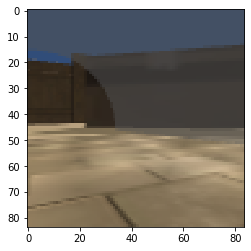

CylinderTunnel  prob =  0.9940614
Ramp  prob =  0.6006807
Wall  prob =  0.085451335
BadGoal  prob =  0.00177192
HotZone  prob =  2.41987e-09
ULObject  prob =  2.548273e-10
DeathZone  prob =  2.620069e-13
GoodGoal  prob =  1.1119703e-13
WallTransparent  prob =  2.2663424e-14
Cardbox  prob =  1.6435469e-15
CylinderTunnelTransparent  prob =  1.4198941e-22
GoodGoalMulti  prob =  2.7980928e-23


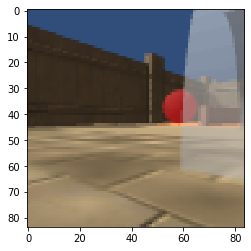

CylinderTunnel  prob =  0.9329667
Wall  prob =  0.27943894
Ramp  prob =  0.059143297
CylinderTunnelTransparent  prob =  0.00020784087
BadGoal  prob =  6.1191586e-06
WallTransparent  prob =  3.4043651e-07
GoodGoalMulti  prob =  1.9563821e-07
Cardbox  prob =  1.7677669e-08
GoodGoal  prob =  4.169251e-11
HotZone  prob =  2.6229968e-11
ULObject  prob =  1.6419162e-13
DeathZone  prob =  5.4057555e-14


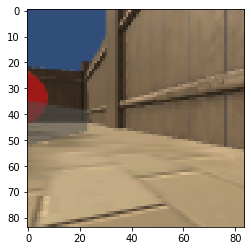

CylinderTunnel  prob =  0.55064
Wall  prob =  0.52833045
Ramp  prob =  0.24383518
GoodGoalMulti  prob =  1.7329725e-13
HotZone  prob =  1.7523385e-15
GoodGoal  prob =  7.164925e-20
BadGoal  prob =  3.944352e-21
WallTransparent  prob =  7.280472e-29
Cardbox  prob =  1.4599556e-31
ULObject  prob =  4.3074398e-35
DeathZone  prob =  1.1037213e-35
CylinderTunnelTransparent  prob =  0.0


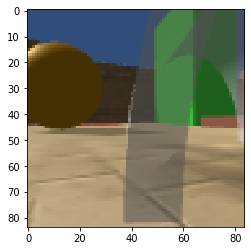

DeathZone  prob =  0.9999949
GoodGoal  prob =  0.9346773
Ramp  prob =  0.03654655
Wall  prob =  1.1578664e-05
CylinderTunnel  prob =  3.2022868e-13
ULObject  prob =  3.274001e-14
WallTransparent  prob =  4.7626884e-18
BadGoal  prob =  3.6666652e-29
HotZone  prob =  1.4588915e-32
Cardbox  prob =  1.5327212e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


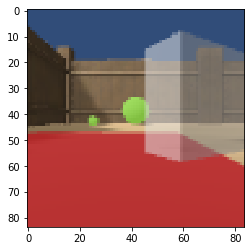

DeathZone  prob =  0.60320884
Wall  prob =  0.5302123
Ramp  prob =  0.5285214
HotZone  prob =  0.5274162
ULObject  prob =  0.501661
WallTransparent  prob =  0.453667
CylinderTunnel  prob =  0.40767568
CylinderTunnelTransparent  prob =  0.3317901
Cardbox  prob =  0.11200043
BadGoal  prob =  0.038680892
GoodGoalMulti  prob =  0.02501425
GoodGoal  prob =  0.013067088


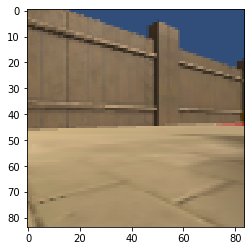

Cardbox  prob =  0.12704839
ULObject  prob =  0.06300371
CylinderTunnel  prob =  0.0589941
WallTransparent  prob =  0.05586055
Ramp  prob =  0.0375049
Wall  prob =  0.03099046
HotZone  prob =  0.021699505
CylinderTunnelTransparent  prob =  0.020596672
GoodGoalMulti  prob =  0.013561269
GoodGoal  prob =  0.012821154
DeathZone  prob =  0.011775413
BadGoal  prob =  0.0038822666


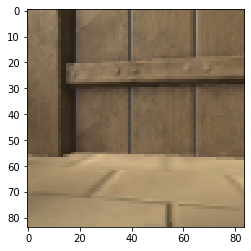

HotZone  prob =  0.0025011732
Ramp  prob =  0.0012763767
Wall  prob =  0.00026657138
ULObject  prob =  1.5176648e-05
WallTransparent  prob =  3.8529593e-06
DeathZone  prob =  1.0261851e-08
CylinderTunnel  prob =  3.1989416e-09
Cardbox  prob =  3.4251067e-11
GoodGoal  prob =  2.188725e-12
BadGoal  prob =  7.532813e-14
CylinderTunnelTransparent  prob =  1.0631466e-16
GoodGoalMulti  prob =  2.8735272e-26


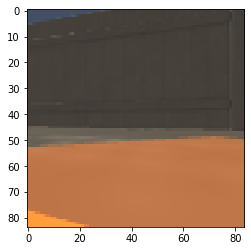

ULObject  prob =  0.9999995
Ramp  prob =  0.0025145414
Wall  prob =  0.0016685089
BadGoal  prob =  0.00012489299
DeathZone  prob =  1.3964176e-07
CylinderTunnel  prob =  4.4588266e-09
HotZone  prob =  1.4274072e-19
WallTransparent  prob =  1.1430839e-19
GoodGoal  prob =  2.1072505e-23
CylinderTunnelTransparent  prob =  3.2385975e-30
Cardbox  prob =  6.59213e-36
GoodGoalMulti  prob =  0.0


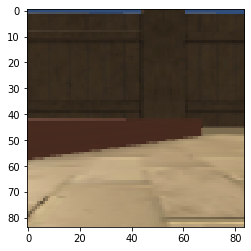

ULObject  prob =  0.9999511
CylinderTunnel  prob =  0.11726354
Ramp  prob =  0.00438927
Wall  prob =  0.002416374
DeathZone  prob =  1.0871367e-08
BadGoal  prob =  9.452388e-11
HotZone  prob =  1.3707869e-13
GoodGoal  prob =  5.1340057e-17
WallTransparent  prob =  2.3399686e-19
Cardbox  prob =  2.603213e-20
CylinderTunnelTransparent  prob =  1.2684788e-25
GoodGoalMulti  prob =  9.201964e-31


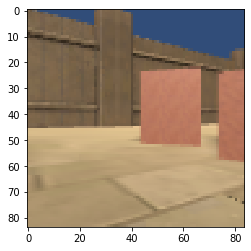

Ramp  prob =  0.99511516
Wall  prob =  0.7676349
CylinderTunnel  prob =  2.8754035e-10
ULObject  prob =  1.7945415e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


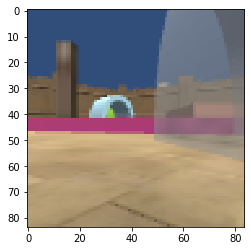

Ramp  prob =  0.9867486
CylinderTunnel  prob =  0.9486592
Wall  prob =  0.6605871
GoodGoal  prob =  2.7328211e-12
HotZone  prob =  3.2993017e-14
Cardbox  prob =  1.7887e-16
ULObject  prob =  5.150065e-19
BadGoal  prob =  1.7404029e-20
DeathZone  prob =  5.85893e-23
GoodGoalMulti  prob =  1.2457307e-31
WallTransparent  prob =  2.0408917e-37
CylinderTunnelTransparent  prob =  0.0


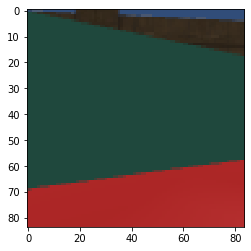

ULObject  prob =  0.98435634
Ramp  prob =  0.44651967
Wall  prob =  0.3292934
CylinderTunnel  prob =  0.13355389
HotZone  prob =  1.0810175e-05
BadGoal  prob =  8.6329635e-08
DeathZone  prob =  7.512504e-08
WallTransparent  prob =  2.00716e-10
GoodGoal  prob =  3.7210894e-11
GoodGoalMulti  prob =  1.1598554e-17
Cardbox  prob =  9.243224e-18
CylinderTunnelTransparent  prob =  9.151423e-22


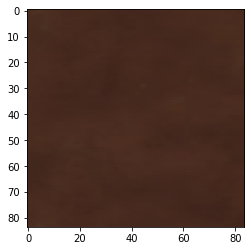

CylinderTunnelTransparent  prob =  0.9999914
WallTransparent  prob =  0.00094255357
Ramp  prob =  0.00012539382
CylinderTunnel  prob =  3.1676936e-05
Wall  prob =  1.0980325e-05
BadGoal  prob =  2.1952123e-07
GoodGoalMulti  prob =  1.7941039e-10
DeathZone  prob =  1.0869086e-12
HotZone  prob =  1.0775906e-12
GoodGoal  prob =  2.1901079e-15
Cardbox  prob =  1.2750006e-15
ULObject  prob =  5.9799123e-16


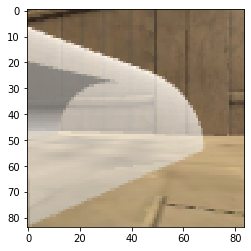

Ramp  prob =  0.39852512
HotZone  prob =  0.37053367
WallTransparent  prob =  0.34125087
Wall  prob =  0.32529637
DeathZone  prob =  0.30617848
CylinderTunnel  prob =  0.2964436
ULObject  prob =  0.28699943
CylinderTunnelTransparent  prob =  0.23508093
Cardbox  prob =  0.043219443
GoodGoal  prob =  0.013215992
GoodGoalMulti  prob =  0.01273386
BadGoal  prob =  0.009559598


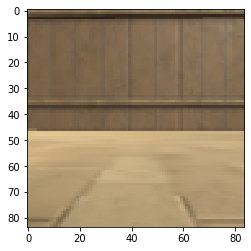

CylinderTunnel  prob =  1.0
Ramp  prob =  0.0051922197
Wall  prob =  9.571207e-06
GoodGoal  prob =  1.6366857e-20
ULObject  prob =  5.3323144e-24
BadGoal  prob =  5.917007e-25
HotZone  prob =  2.706731e-25
DeathZone  prob =  1.9921562e-28
GoodGoalMulti  prob =  1.0588408e-30
Cardbox  prob =  7.739599e-35
CylinderTunnelTransparent  prob =  3.498235e-37
WallTransparent  prob =  0.0


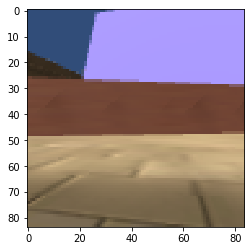

GoodGoalMulti  prob =  0.99993587
CylinderTunnel  prob =  0.0063817683
Wall  prob =  0.0018036076
Ramp  prob =  0.0011952963
HotZone  prob =  7.2337935e-15
WallTransparent  prob =  4.903892e-18
BadGoal  prob =  2.609758e-18
GoodGoal  prob =  1.3225307e-18
CylinderTunnelTransparent  prob =  1.4722226e-28
Cardbox  prob =  1.2062474e-32
ULObject  prob =  2.9813422e-36
DeathZone  prob =  4.9645646e-37


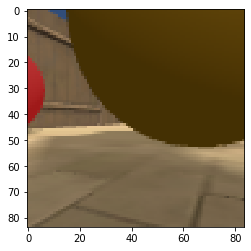

CylinderTunnel  prob =  0.9768242
Ramp  prob =  0.7524283
Wall  prob =  0.47074753
CylinderTunnelTransparent  prob =  3.839948e-07
Cardbox  prob =  5.3665463e-09
BadGoal  prob =  2.3572224e-09
WallTransparent  prob =  1.275865e-10
ULObject  prob =  1.4038334e-15
GoodGoal  prob =  1.0963381e-16
HotZone  prob =  2.4774678e-17
DeathZone  prob =  3.9098875e-18
GoodGoalMulti  prob =  4.3768558e-21


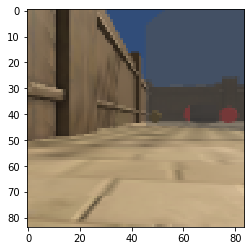

Cardbox  prob =  0.9998431
CylinderTunnel  prob =  0.0456861
Wall  prob =  0.03748276
Ramp  prob =  0.020179195
WallTransparent  prob =  0.00012142941
CylinderTunnelTransparent  prob =  2.1242382e-05
ULObject  prob =  5.6394083e-06
GoodGoal  prob =  3.4471311e-06
HotZone  prob =  1.6230877e-06
BadGoal  prob =  1.158165e-06
DeathZone  prob =  7.017444e-07
GoodGoalMulti  prob =  8.971042e-08


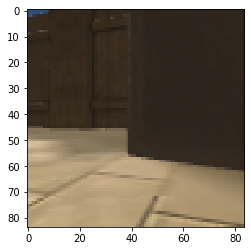

Cardbox  prob =  0.9989661
Ramp  prob =  0.03750471
Wall  prob =  0.01900403
CylinderTunnel  prob =  0.015131432
CylinderTunnelTransparent  prob =  4.324713e-07
WallTransparent  prob =  1.0262125e-08
BadGoal  prob =  6.3219965e-17
ULObject  prob =  1.9768283e-19
HotZone  prob =  6.686806e-20
GoodGoal  prob =  2.5314115e-20
DeathZone  prob =  1.7882102e-22
GoodGoalMulti  prob =  1.5050749e-25


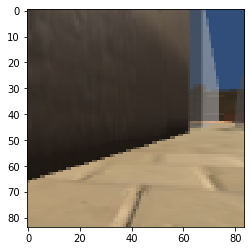

Ramp  prob =  0.7369835
Wall  prob =  0.46250865
CylinderTunnel  prob =  0.10263361
GoodGoalMulti  prob =  0.00020880264
WallTransparent  prob =  3.6735693e-28
HotZone  prob =  3.8149687e-29
GoodGoal  prob =  4.132788e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0


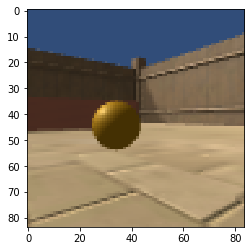

HotZone  prob =  0.9999982
Ramp  prob =  7.619015e-06
ULObject  prob =  4.0660403e-08
Wall  prob =  2.3733703e-08
Cardbox  prob =  1.1771621e-12
DeathZone  prob =  2.188205e-14
CylinderTunnel  prob =  1.1512081e-15
WallTransparent  prob =  3.152065e-19
BadGoal  prob =  4.7167774e-20
GoodGoal  prob =  2.0688092e-25
GoodGoalMulti  prob =  2.2940883e-34
CylinderTunnelTransparent  prob =  0.0


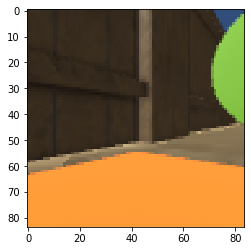

Wall  prob =  0.8841996
Ramp  prob =  0.75789696
CylinderTunnel  prob =  0.55670303
GoodGoal  prob =  0.2543441
BadGoal  prob =  0.027997138
HotZone  prob =  0.023103848
DeathZone  prob =  0.010587228
ULObject  prob =  0.007847672
WallTransparent  prob =  0.0074415547
Cardbox  prob =  0.0006701841
CylinderTunnelTransparent  prob =  0.00044854064
GoodGoalMulti  prob =  0.00027303514


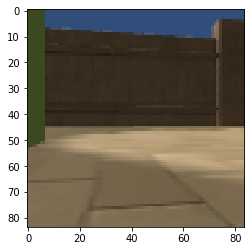

Ramp  prob =  0.41670752
WallTransparent  prob =  0.3886782
HotZone  prob =  0.3878785
DeathZone  prob =  0.36275122
Wall  prob =  0.36100343
CylinderTunnel  prob =  0.34523624
ULObject  prob =  0.2695898
CylinderTunnelTransparent  prob =  0.252756
Cardbox  prob =  0.09542466
GoodGoal  prob =  0.0340317
GoodGoalMulti  prob =  0.01710365
BadGoal  prob =  0.012745699


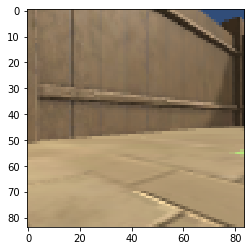

WallTransparent
CylinderTunnel  prob =  0.9078103
Ramp  prob =  3.7170782e-09
GoodGoalMulti  prob =  1.1143464e-09
Wall  prob =  4.5819923e-13
BadGoal  prob =  5.7871806e-16
CylinderTunnelTransparent  prob =  1.5771554e-24
GoodGoal  prob =  4.250002e-28
Cardbox  prob =  1.1390214e-29
HotZone  prob =  1.7586643e-33
WallTransparent  prob =  8.5737746e-38
ULObject  prob =  0.0
DeathZone  prob =  0.0


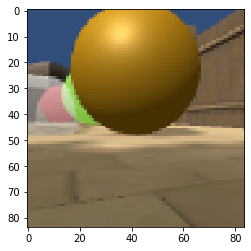

WallTransparent  prob =  0.5439236
ULObject  prob =  0.4444762
Cardbox  prob =  0.42234612
Ramp  prob =  0.40423754
Wall  prob =  0.3704713
HotZone  prob =  0.36037266
DeathZone  prob =  0.32729656
CylinderTunnel  prob =  0.2694279
CylinderTunnelTransparent  prob =  0.25379398
BadGoal  prob =  0.051406026
GoodGoalMulti  prob =  0.04001553
GoodGoal  prob =  0.022441357


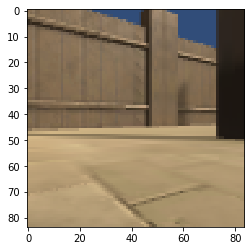

CylinderTunnel  prob =  0.9945656
Ramp  prob =  0.45677525
Wall  prob =  0.14277887
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


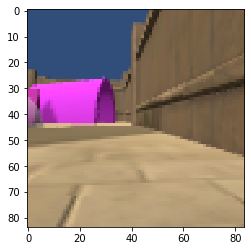

CylinderTunnel  prob =  0.51236343
Ramp  prob =  0.033745687
Wall  prob =  0.0027791297
CylinderTunnelTransparent  prob =  1.2425944e-05
BadGoal  prob =  5.387688e-15
Cardbox  prob =  1.5572488e-15
WallTransparent  prob =  4.1806116e-16
GoodGoalMulti  prob =  8.4005285e-25
GoodGoal  prob =  5.0595206e-25
HotZone  prob =  1.7078497e-25
DeathZone  prob =  2.506246e-28
ULObject  prob =  2.724769e-31


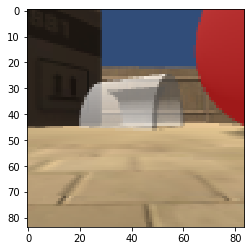

HotZone  prob =  0.3748432
Ramp  prob =  0.35764354
DeathZone  prob =  0.3428672
CylinderTunnel  prob =  0.33263165
ULObject  prob =  0.32622886
Wall  prob =  0.30836105
WallTransparent  prob =  0.27783927
CylinderTunnelTransparent  prob =  0.26434937
Cardbox  prob =  0.077553935
GoodGoalMulti  prob =  0.035691835
GoodGoal  prob =  0.022705052
BadGoal  prob =  0.018706221


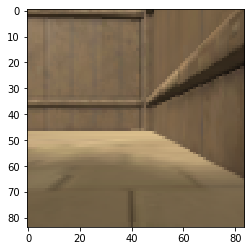

Ramp  prob =  0.91625243
CylinderTunnel  prob =  0.9010136
Wall  prob =  0.15741968
BadGoal  prob =  3.0747025e-13
WallTransparent  prob =  5.569433e-14
HotZone  prob =  1.6838573e-16
ULObject  prob =  1.7441007e-17
GoodGoal  prob =  8.662957e-18
Cardbox  prob =  2.32315e-19
CylinderTunnelTransparent  prob =  1.096189e-21
GoodGoalMulti  prob =  1.1411782e-22
DeathZone  prob =  6.058691e-24


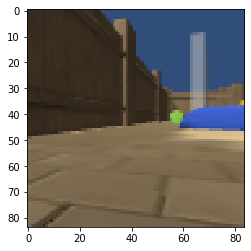

GoodGoal  prob =  1.0
BadGoal  prob =  9.297662e-05
CylinderTunnel  prob =  8.7576274e-07
Ramp  prob =  4.233953e-07
Wall  prob =  1.935862e-08
Cardbox  prob =  2.87863e-10
DeathZone  prob =  3.0633827e-12
HotZone  prob =  2.1997815e-20
ULObject  prob =  4.1553283e-25
WallTransparent  prob =  2.3877237e-26
GoodGoalMulti  prob =  1.4097714e-34
CylinderTunnelTransparent  prob =  0.0


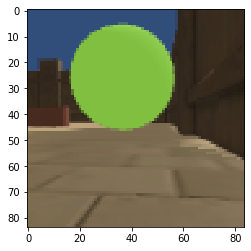

Ramp  prob =  0.3930294
Wall  prob =  0.0055628004
GoodGoal  prob =  8.247899e-05
DeathZone  prob =  2.1677937e-05
CylinderTunnel  prob =  2.7412365e-12
WallTransparent  prob =  9.3725056e-17
ULObject  prob =  2.7375486e-19
BadGoal  prob =  3.410208e-28
HotZone  prob =  3.0210157e-33
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


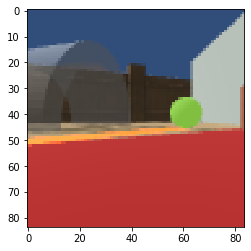

WallTransparent  prob =  0.32711375
Cardbox  prob =  0.16225025
CylinderTunnelTransparent  prob =  0.1550774
Wall  prob =  0.08292508
Ramp  prob =  0.07112595
BadGoal  prob =  0.055346243
CylinderTunnel  prob =  0.037482284
DeathZone  prob =  0.034718703
ULObject  prob =  0.031399366
HotZone  prob =  0.02693391
GoodGoalMulti  prob =  0.014328105
GoodGoal  prob =  0.010288883


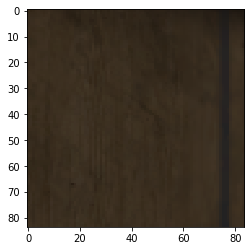

Ramp  prob =  0.88164324
CylinderTunnel  prob =  0.79559445
Wall  prob =  0.73999286
GoodGoal  prob =  2.2870305e-32
HotZone  prob =  1.4315773e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


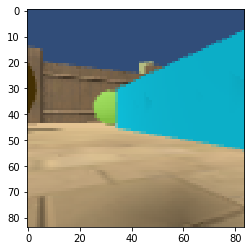

CylinderTunnel  prob =  0.99999976
Wall  prob =  0.0013849785
Ramp  prob =  0.00062370655
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


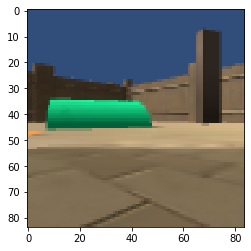

CylinderTunnel  prob =  0.89077246
Ramp  prob =  0.6839071
Wall  prob =  0.31920105
ULObject  prob =  2.74418e-32
HotZone  prob =  1.2297195e-32
Cardbox  prob =  6.2481433e-35
BadGoal  prob =  5.395296e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


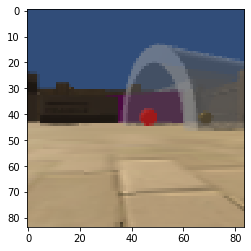

ULObject  prob =  0.9996966
CylinderTunnel  prob =  0.23544808
Ramp  prob =  0.024347343
Wall  prob =  0.00020550596
BadGoal  prob =  3.524425e-20
DeathZone  prob =  7.747596e-22
HotZone  prob =  3.084071e-24
GoodGoal  prob =  6.436314e-33
WallTransparent  prob =  1.0321079e-33
Cardbox  prob =  1.1926323e-37
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


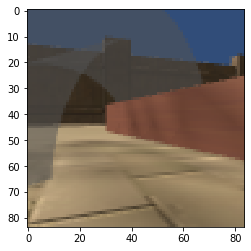

Ramp  prob =  0.5368895
Wall  prob =  0.4976602
WallTransparent  prob =  0.48027006
HotZone  prob =  0.4770426
DeathZone  prob =  0.43892416
CylinderTunnel  prob =  0.41647542
ULObject  prob =  0.4077206
CylinderTunnelTransparent  prob =  0.3137818
Cardbox  prob =  0.0790179
GoodGoalMulti  prob =  0.019668588
BadGoal  prob =  0.01961087
GoodGoal  prob =  0.015193058


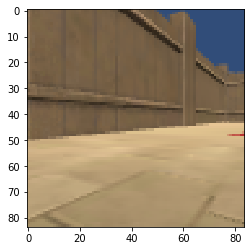

CylinderTunnelTransparent  prob =  0.1679799
WallTransparent  prob =  0.005196692
Ramp  prob =  0.0005110211
Wall  prob =  0.00020629988
CylinderTunnel  prob =  0.00017146705
GoodGoalMulti  prob =  2.045208e-12
Cardbox  prob =  1.9459333e-21
BadGoal  prob =  4.1083338e-22
HotZone  prob =  1.5077018e-24
GoodGoal  prob =  1.3458816e-25
DeathZone  prob =  4.197335e-27
ULObject  prob =  5.172997e-29


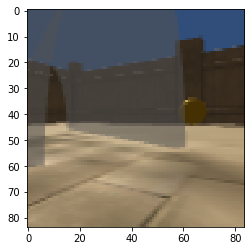

Ramp  prob =  0.9632306
CylinderTunnel  prob =  0.6065626
Wall  prob =  0.50304884
GoodGoal  prob =  7.2277877e-13
HotZone  prob =  1.2247493e-22
BadGoal  prob =  2.2904697e-25
ULObject  prob =  1.7483363e-33
DeathZone  prob =  4.8118005e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


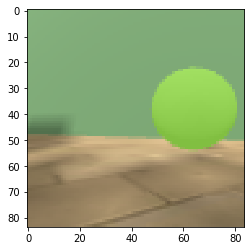

WallTransparent  prob =  0.12475125
Ramp  prob =  0.0986541
Wall  prob =  0.084783815
CylinderTunnelTransparent  prob =  0.06437592
DeathZone  prob =  0.059545994
HotZone  prob =  0.057849515
CylinderTunnel  prob =  0.053059652
ULObject  prob =  0.045180753
BadGoal  prob =  0.024949312
Cardbox  prob =  0.014964395
GoodGoal  prob =  0.012656694
GoodGoalMulti  prob =  0.008442569


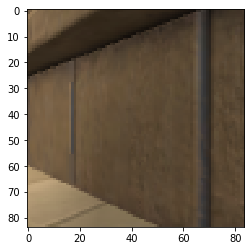

CylinderTunnel  prob =  0.9498199
Ramp  prob =  0.8986331
Wall  prob =  0.3527641
BadGoal  prob =  7.169321e-07
ULObject  prob =  1.1400746e-08
Cardbox  prob =  6.238505e-10
GoodGoal  prob =  3.923859e-10
DeathZone  prob =  3.4705874e-11
HotZone  prob =  4.5206276e-13
WallTransparent  prob =  2.296954e-17
GoodGoalMulti  prob =  1.8385514e-23
CylinderTunnelTransparent  prob =  1.1655002e-34


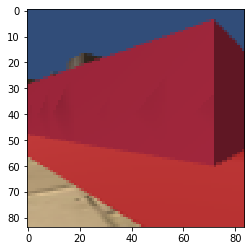

GoodGoalMulti  prob =  1.0
WallTransparent  prob =  3.4482775e-07
CylinderTunnel  prob =  2.1819233e-07
Wall  prob =  1.0632402e-08
Ramp  prob =  7.2871034e-09
GoodGoal  prob =  9.859557e-14
HotZone  prob =  4.645915e-14
CylinderTunnelTransparent  prob =  3.3470676e-14
BadGoal  prob =  1.1068194e-14
Cardbox  prob =  8.801589e-19
DeathZone  prob =  2.1851297e-19
ULObject  prob =  6.649314e-27


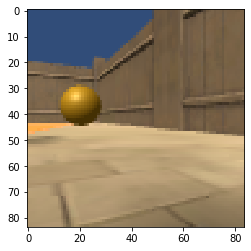

HotZone  prob =  0.99979645
Ramp  prob =  0.13779323
Wall  prob =  0.005778277
CylinderTunnel  prob =  3.2684716e-11
BadGoal  prob =  9.437971e-27
ULObject  prob =  6.968415e-29
GoodGoal  prob =  2.2848276e-29
Cardbox  prob =  2.8624575e-32
GoodGoalMulti  prob =  1.0800683e-34
WallTransparent  prob =  1.4808293e-35
DeathZone  prob =  1.3838096e-38
CylinderTunnelTransparent  prob =  0.0


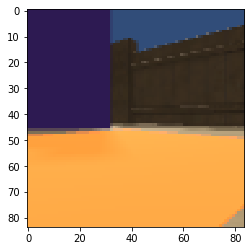

ULObject  prob =  0.99039817
BadGoal  prob =  0.31204474
DeathZone  prob =  0.13244814
Ramp  prob =  0.109024644
Wall  prob =  0.0676289
CylinderTunnel  prob =  0.0011526198
WallTransparent  prob =  8.659884e-07
HotZone  prob =  3.853639e-07
GoodGoal  prob =  1.6843684e-08
CylinderTunnelTransparent  prob =  4.500872e-10
Cardbox  prob =  7.9867055e-14
GoodGoalMulti  prob =  4.2568128e-15


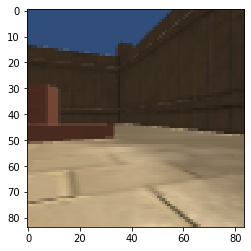

ULObject  prob =  0.16101903
CylinderTunnel  prob =  0.12266406
Ramp  prob =  0.12146199
HotZone  prob =  0.121329404
Cardbox  prob =  0.10425678
DeathZone  prob =  0.100227684
Wall  prob =  0.09778056
WallTransparent  prob =  0.095709614
CylinderTunnelTransparent  prob =  0.06635158
GoodGoal  prob =  0.06066258
BadGoal  prob =  0.041375402
GoodGoalMulti  prob =  0.03921491


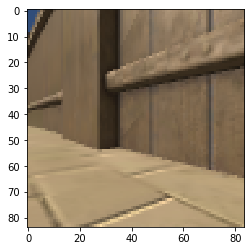

WallTransparent  prob =  0.99980885
CylinderTunnelTransparent  prob =  0.045010336
Wall  prob =  0.009680149
Ramp  prob =  0.008208039
CylinderTunnel  prob =  6.984026e-05
Cardbox  prob =  3.571076e-08
GoodGoalMulti  prob =  1.116231e-09
BadGoal  prob =  6.276004e-10
HotZone  prob =  1.2078674e-11
DeathZone  prob =  3.7839398e-13
ULObject  prob =  3.5386756e-14
GoodGoal  prob =  1.3403377e-14


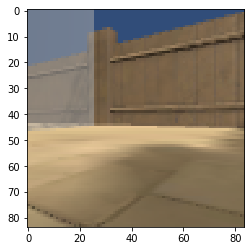

DeathZone  prob =  0.9999919
Ramp  prob =  0.001908029
Wall  prob =  0.00027802167
ULObject  prob =  7.730306e-08
CylinderTunnel  prob =  2.6903555e-08
GoodGoal  prob =  5.9842775e-10
BadGoal  prob =  1.3372193e-11
WallTransparent  prob =  3.959534e-13
HotZone  prob =  1.554664e-26
CylinderTunnelTransparent  prob =  8.961706e-34
Cardbox  prob =  5.395996e-38
GoodGoalMulti  prob =  0.0


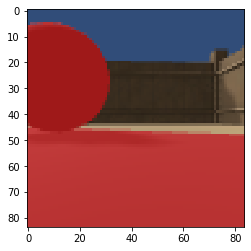

Ramp  prob =  0.99092114
Wall  prob =  0.9902796
HotZone  prob =  0.8607625
CylinderTunnel  prob =  0.0016776801
Cardbox  prob =  9.8327305e-08
DeathZone  prob =  1.3417095e-09
BadGoal  prob =  1.2270669e-10
GoodGoal  prob =  2.8553486e-12
ULObject  prob =  7.0579795e-15
WallTransparent  prob =  3.926829e-15
GoodGoalMulti  prob =  1.3995651e-17
CylinderTunnelTransparent  prob =  2.7808404e-18


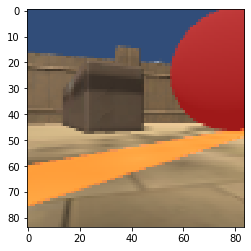

ULObject  prob =  0.1710987
GoodGoalMulti  prob =  0.14253972
DeathZone  prob =  0.13453676
Cardbox  prob =  0.11647458
Ramp  prob =  0.10607439
GoodGoal  prob =  0.10243186
HotZone  prob =  0.08461129
Wall  prob =  0.081213206
CylinderTunnel  prob =  0.0790575
CylinderTunnelTransparent  prob =  0.066721395
WallTransparent  prob =  0.055280577
BadGoal  prob =  0.05498644


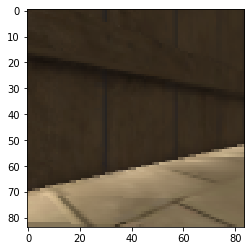

Ramp  prob =  0.92364186
CylinderTunnel  prob =  0.3777049
ULObject  prob =  0.18249473
Wall  prob =  0.078381784
BadGoal  prob =  6.7307025e-18
DeathZone  prob =  9.356135e-19
HotZone  prob =  1.0165325e-19
GoodGoal  prob =  2.4731947e-21
WallTransparent  prob =  9.811435e-26
Cardbox  prob =  5.8400166e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


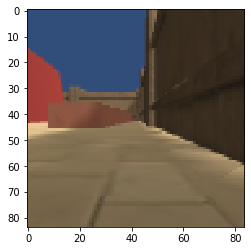

DeathZone  prob =  0.38784617
CylinderTunnel  prob =  0.3737284
Wall  prob =  0.27434653
Ramp  prob =  0.21689239
Cardbox  prob =  0.21611644
HotZone  prob =  0.17124674
ULObject  prob =  0.16611664
WallTransparent  prob =  0.059268262
CylinderTunnelTransparent  prob =  0.010442721
GoodGoalMulti  prob =  0.009666583
GoodGoal  prob =  0.006270562
BadGoal  prob =  0.0021903745


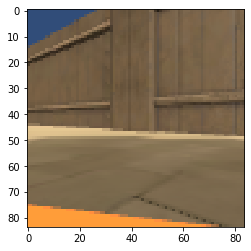

DeathZone  prob =  0.38189557
ULObject  prob =  0.32566366
HotZone  prob =  0.28886458
Ramp  prob =  0.26767313
CylinderTunnel  prob =  0.23870105
GoodGoal  prob =  0.23288153
Wall  prob =  0.2288839
GoodGoalMulti  prob =  0.2110595
Cardbox  prob =  0.20769441
WallTransparent  prob =  0.1311244
CylinderTunnelTransparent  prob =  0.10499116
BadGoal  prob =  0.092223726


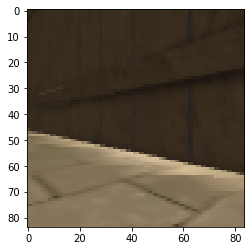

CylinderTunnel  prob =  0.6555839
Ramp  prob =  0.57403934
Wall  prob =  0.088588804
Cardbox  prob =  3.8924695e-06
BadGoal  prob =  2.8575076e-11
ULObject  prob =  3.2347714e-14
GoodGoal  prob =  1.7384697e-15
WallTransparent  prob =  4.492522e-16
HotZone  prob =  1.04509215e-16
DeathZone  prob =  1.8702476e-17
CylinderTunnelTransparent  prob =  1.0677987e-19
GoodGoalMulti  prob =  7.89742e-22


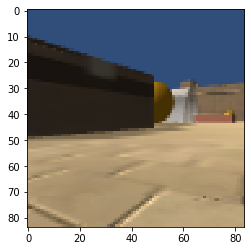

Ramp  prob =  0.91691184
CylinderTunnel  prob =  0.75422823
Wall  prob =  0.13440162
GoodGoal  prob =  4.8084954e-09
WallTransparent  prob =  1.4814893e-14
BadGoal  prob =  2.7413537e-18
CylinderTunnelTransparent  prob =  1.3994889e-19
HotZone  prob =  1.2016254e-20
ULObject  prob =  6.676909e-22
GoodGoalMulti  prob =  1.02679644e-22
DeathZone  prob =  6.329427e-25
Cardbox  prob =  2.1932726e-26


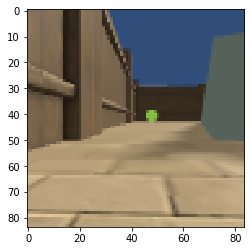

Cardbox  prob =  0.9999684
CylinderTunnel  prob =  0.010025575
Wall  prob =  0.0075274226
Ramp  prob =  0.007330165
ULObject  prob =  9.8975315e-06
HotZone  prob =  2.2658733e-06
BadGoal  prob =  1.581083e-06
DeathZone  prob =  1.4268961e-06
GoodGoal  prob =  4.481714e-07
WallTransparent  prob =  3.8404644e-07
CylinderTunnelTransparent  prob =  9.3563834e-08
GoodGoalMulti  prob =  2.1535964e-08


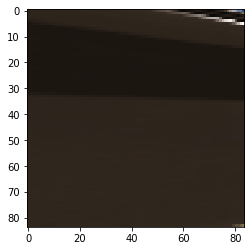

WallTransparent  prob =  0.09092958
BadGoal  prob =  0.07508949
CylinderTunnelTransparent  prob =  0.06528888
Cardbox  prob =  0.064222835
Wall  prob =  0.063708596
Ramp  prob =  0.05432348
CylinderTunnel  prob =  0.050163217
ULObject  prob =  0.046794757
HotZone  prob =  0.040398948
DeathZone  prob =  0.033980105
GoodGoalMulti  prob =  0.032664787
GoodGoal  prob =  0.025637513


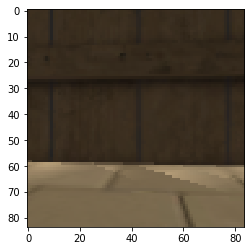

Ramp  prob =  0.9807984
Wall  prob =  0.07791285
CylinderTunnel  prob =  0.0009258528
GoodGoalMulti  prob =  4.1467913e-26
GoodGoal  prob =  3.9259942e-28
WallTransparent  prob =  2.75651e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


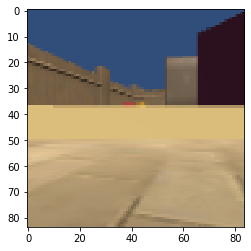

Ramp  prob =  0.8768274
CylinderTunnel  prob =  0.7052657
Wall  prob =  0.033833668
ULObject  prob =  1.3350585e-05
DeathZone  prob =  5.552604e-09
BadGoal  prob =  1.8460622e-10
HotZone  prob =  5.161613e-14
GoodGoal  prob =  6.9634235e-20
WallTransparent  prob =  7.7400436e-27
Cardbox  prob =  1.989056e-30
GoodGoalMulti  prob =  2.1735126e-37
CylinderTunnelTransparent  prob =  2.2070573e-38


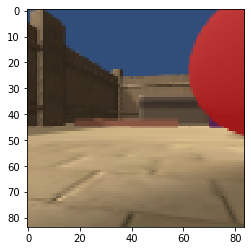

DeathZone  prob =  1.0
Ramp  prob =  0.0015451515
GoodGoal  prob =  2.0081508e-05
Wall  prob =  7.529415e-07
CylinderTunnel  prob =  2.1176903e-19
ULObject  prob =  1.5490398e-19
BadGoal  prob =  6.1281685e-24
WallTransparent  prob =  1.6323861e-24
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


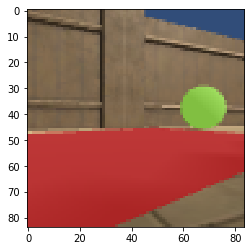

CylinderTunnelTransparent  prob =  0.05264644
CylinderTunnel  prob =  0.037238542
Ramp  prob =  0.03499808
Wall  prob =  0.029665323
Cardbox  prob =  0.015677646
WallTransparent  prob =  0.008881667
GoodGoalMulti  prob =  0.005132024
DeathZone  prob =  0.004842872
ULObject  prob =  0.00467618
HotZone  prob =  0.004425249
BadGoal  prob =  0.0018584376
GoodGoal  prob =  0.0011239435


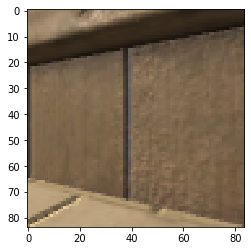

Ramp  prob =  0.22549352
Wall  prob =  0.0011333843
CylinderTunnel  prob =  5.5894383e-11
Cardbox  prob =  1.6058219e-13
ULObject  prob =  3.3227802e-15
DeathZone  prob =  1.2602707e-16
WallTransparent  prob =  5.618502e-18
BadGoal  prob =  2.6242497e-21
HotZone  prob =  3.6517007e-22
GoodGoal  prob =  2.7366774e-22
CylinderTunnelTransparent  prob =  5.392085e-31
GoodGoalMulti  prob =  2.0545097e-34


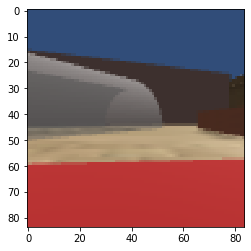

Ramp  prob =  0.8562607
CylinderTunnel  prob =  0.8091854
Wall  prob =  0.14194149
ULObject  prob =  9.195407e-05
HotZone  prob =  5.0422544e-26
BadGoal  prob =  3.730057e-26
DeathZone  prob =  5.3784964e-27
GoodGoal  prob =  3.0145754e-29
WallTransparent  prob =  6.6958515e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


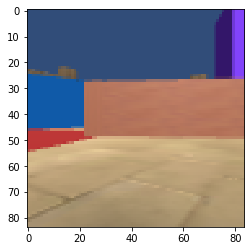

CylinderTunnel  prob =  0.9823063
Ramp  prob =  0.66774356
Wall  prob =  0.00686765
ULObject  prob =  2.9216638e-26
BadGoal  prob =  4.4544864e-30
HotZone  prob =  3.9504626e-30
WallTransparent  prob =  5.234815e-36
GoodGoal  prob =  1.7291436e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


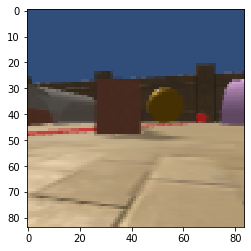

CylinderTunnel  prob =  0.8260881
Ramp  prob =  0.80676544
Wall  prob =  0.40705636
Cardbox  prob =  9.746543e-15
WallTransparent  prob =  8.875094e-18
BadGoal  prob =  7.410773e-20
ULObject  prob =  1.9038248e-20
GoodGoalMulti  prob =  1.51829e-20
HotZone  prob =  1.9780558e-21
GoodGoal  prob =  2.9237054e-25
CylinderTunnelTransparent  prob =  5.406661e-26
DeathZone  prob =  1.4996912e-28


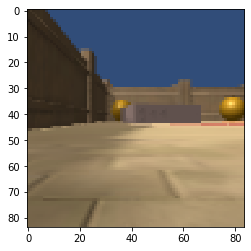

Ramp  prob =  0.9973023
Wall  prob =  0.065803386
CylinderTunnel  prob =  0.013636771
ULObject  prob =  3.824099e-17
BadGoal  prob =  1.1710476e-21
HotZone  prob =  2.2897886e-25
DeathZone  prob =  1.4905452e-25
GoodGoal  prob =  9.455795e-30
WallTransparent  prob =  2.0968793e-33
Cardbox  prob =  1.3313275e-34
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


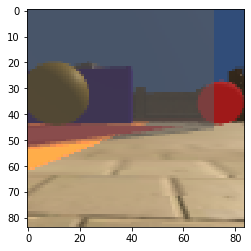

CylinderTunnel  prob =  0.99900216
Ramp  prob =  0.6265694
Wall  prob =  0.033834714
BadGoal  prob =  3.8882512e-23
GoodGoal  prob =  6.169512e-27
Cardbox  prob =  1.0674478e-28
HotZone  prob =  4.1843654e-29
ULObject  prob =  6.816689e-35
GoodGoalMulti  prob =  2.74977e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


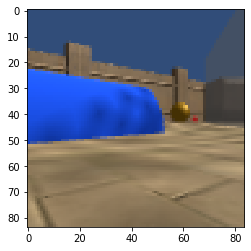

ULObject  prob =  0.2096954
WallTransparent  prob =  0.18344435
CylinderTunnel  prob =  0.17819914
Ramp  prob =  0.16656977
DeathZone  prob =  0.15640756
HotZone  prob =  0.15453427
CylinderTunnelTransparent  prob =  0.15204105
Wall  prob =  0.14693674
GoodGoalMulti  prob =  0.10006327
Cardbox  prob =  0.098079026
BadGoal  prob =  0.06431984
GoodGoal  prob =  0.06430729


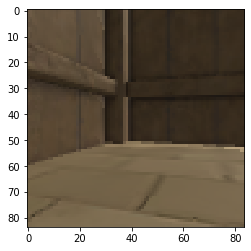

CylinderTunnel  prob =  0.99328595
Ramp  prob =  0.66916305
Wall  prob =  0.03251014
ULObject  prob =  8.543972e-14
HotZone  prob =  9.148045e-28
BadGoal  prob =  2.4079783e-31
DeathZone  prob =  1.6737379e-32
Cardbox  prob =  8.561932e-33
GoodGoal  prob =  5.8668114e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


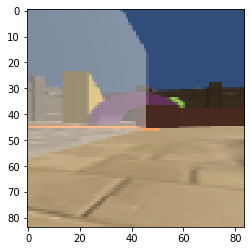

GoodGoal  prob =  0.99999976
Ramp  prob =  0.0023419645
Wall  prob =  0.00035215597
CylinderTunnel  prob =  0.0001528138
BadGoal  prob =  2.4338225e-12
WallTransparent  prob =  2.3440332e-12
HotZone  prob =  6.2687384e-15
DeathZone  prob =  7.171167e-18
ULObject  prob =  2.5907925e-18
GoodGoalMulti  prob =  2.6951758e-21
Cardbox  prob =  6.3092918e-27
CylinderTunnelTransparent  prob =  1.7013558e-30


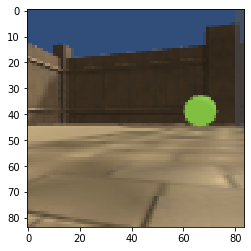

WallTransparent  prob =  0.39429393
Ramp  prob =  0.3697599
DeathZone  prob =  0.36202735
CylinderTunnelTransparent  prob =  0.33556345
Wall  prob =  0.33007494
HotZone  prob =  0.3219313
CylinderTunnel  prob =  0.3157709
Cardbox  prob =  0.3058899
ULObject  prob =  0.29599082
GoodGoalMulti  prob =  0.14639758
GoodGoal  prob =  0.09717319
BadGoal  prob =  0.056854285


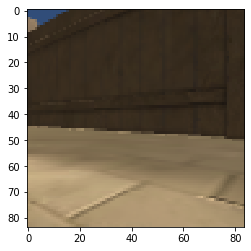

DeathZone  prob =  0.08802795
ULObject  prob =  0.000371235
Ramp  prob =  0.00017696909
CylinderTunnel  prob =  4.8616614e-05
Wall  prob =  4.529552e-06
WallTransparent  prob =  2.783883e-13
BadGoal  prob =  2.2463007e-14
HotZone  prob =  3.5844708e-16
GoodGoalMulti  prob =  2.7830051e-18
GoodGoal  prob =  2.302708e-18
CylinderTunnelTransparent  prob =  1.1156135e-32
Cardbox  prob =  5.951334e-37


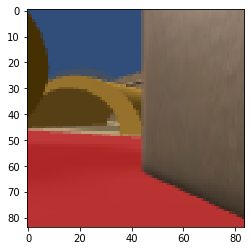

ULObject  prob =  0.99992454
Ramp  prob =  0.013918593
Wall  prob =  0.0070485976
CylinderTunnel  prob =  0.0043524564
BadGoal  prob =  2.4312245e-08
DeathZone  prob =  4.13066e-09
HotZone  prob =  6.914996e-16
WallTransparent  prob =  8.299083e-17
GoodGoal  prob =  7.650667e-17
Cardbox  prob =  6.675206e-21
CylinderTunnelTransparent  prob =  5.0468565e-25
GoodGoalMulti  prob =  2.0650991e-29


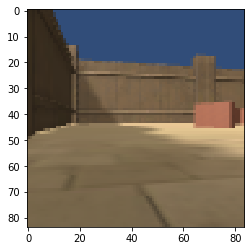

Ramp  prob =  0.9994141
CylinderTunnel  prob =  0.6746894
Wall  prob =  7.667144e-06
ULObject  prob =  6.1228646e-24
HotZone  prob =  2.3307333e-24
BadGoal  prob =  6.461237e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


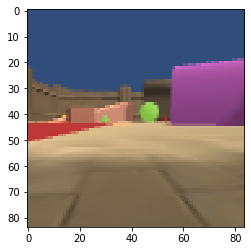

ULObject  prob =  0.3703897
WallTransparent  prob =  0.34707934
HotZone  prob =  0.34190956
Ramp  prob =  0.33982795
CylinderTunnelTransparent  prob =  0.33237842
DeathZone  prob =  0.32358384
Wall  prob =  0.30497622
CylinderTunnel  prob =  0.28351945
Cardbox  prob =  0.22389418
GoodGoalMulti  prob =  0.16594373
BadGoal  prob =  0.13047487
GoodGoal  prob =  0.08124751


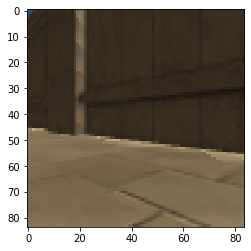

CylinderTunnel  prob =  0.061511215
Wall  prob =  0.053852793
Ramp  prob =  0.047311164
ULObject  prob =  0.035327725
WallTransparent  prob =  0.035245195
HotZone  prob =  0.032352295
GoodGoalMulti  prob =  0.030138602
GoodGoal  prob =  0.027723296
BadGoal  prob =  0.019289184
CylinderTunnelTransparent  prob =  0.014309457
DeathZone  prob =  0.012242128
Cardbox  prob =  0.00966498


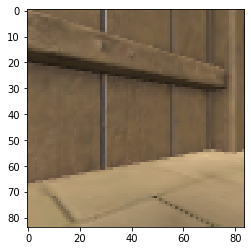

Cardbox  prob =  0.9999714
CylinderTunnel  prob =  0.03593467
Ramp  prob =  0.027810594
Wall  prob =  0.025022788
WallTransparent  prob =  0.00087716896
CylinderTunnelTransparent  prob =  0.00012171969
BadGoal  prob =  2.3219784e-05
HotZone  prob =  1.3033068e-05
ULObject  prob =  8.448101e-06
GoodGoal  prob =  8.8839516e-07
GoodGoalMulti  prob =  6.316968e-07
DeathZone  prob =  4.1841787e-07


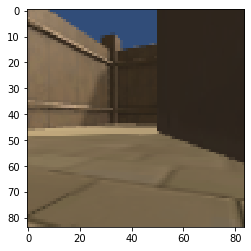

CylinderTunnelTransparent  prob =  0.9794742
Ramp  prob =  0.221394
Wall  prob =  0.033637337
WallTransparent  prob =  0.008344388
CylinderTunnel  prob =  0.0046887426
BadGoal  prob =  3.10418e-11
HotZone  prob =  1.3500167e-16
DeathZone  prob =  2.8603711e-18
Cardbox  prob =  7.3411943e-19
ULObject  prob =  1.30751535e-20
GoodGoal  prob =  2.0675108e-22
GoodGoalMulti  prob =  2.889128e-23


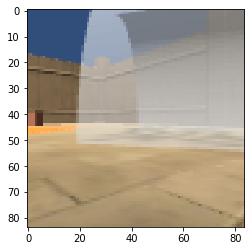

DeathZone  prob =  0.99995947
Ramp  prob =  2.0867897e-06
Wall  prob =  4.22909e-07
CylinderTunnel  prob =  1.7972755e-10
GoodGoal  prob =  5.157311e-11
ULObject  prob =  1.9224836e-15
GoodGoalMulti  prob =  1.0914095e-17
WallTransparent  prob =  1.0600683e-17
Cardbox  prob =  2.6986725e-22
BadGoal  prob =  1.5472493e-28
HotZone  prob =  9.879435e-29
CylinderTunnelTransparent  prob =  0.0


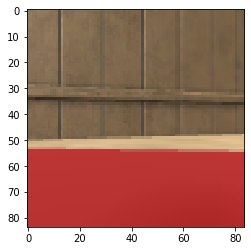

WallTransparent  prob =  0.34505087
Ramp  prob =  0.33408087
DeathZone  prob =  0.31775317
Wall  prob =  0.3061584
CylinderTunnelTransparent  prob =  0.30158675
ULObject  prob =  0.2939275
HotZone  prob =  0.2855861
Cardbox  prob =  0.2847561
CylinderTunnel  prob =  0.28291398
GoodGoalMulti  prob =  0.21895446
GoodGoal  prob =  0.10267673
BadGoal  prob =  0.055075496


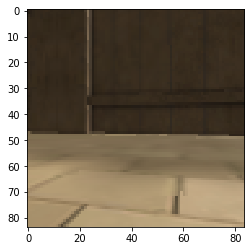

CylinderTunnel  prob =  0.936029
Ramp  prob =  0.6056851
Wall  prob =  0.21524143
HotZone  prob =  6.3745724e-09
GoodGoal  prob =  6.970954e-10
BadGoal  prob =  2.6361008e-12
ULObject  prob =  4.009305e-16
GoodGoalMulti  prob =  5.999648e-18
DeathZone  prob =  2.9369273e-19
WallTransparent  prob =  4.0408944e-21
Cardbox  prob =  2.4467307e-22
CylinderTunnelTransparent  prob =  0.0


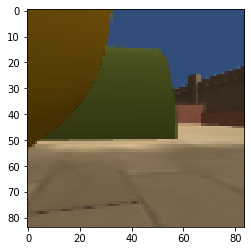

HotZone  prob =  1.0
Ramp  prob =  0.0018741934
Wall  prob =  0.00050569006
CylinderTunnel  prob =  1.489211e-12
ULObject  prob =  1.3699887e-18
BadGoal  prob =  5.2513406e-19
Cardbox  prob =  3.056705e-20
DeathZone  prob =  8.22337e-21
WallTransparent  prob =  1.6638394e-24
GoodGoal  prob =  5.083876e-26
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


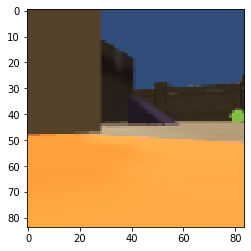

Ramp  prob =  0.15111773
CylinderTunnel  prob =  0.054395627
Wall  prob =  0.0039465986
ULObject  prob =  8.1474345e-13
GoodGoal  prob =  9.182254e-17
BadGoal  prob =  2.341586e-18
DeathZone  prob =  2.7137287e-26
HotZone  prob =  1.903398e-26
WallTransparent  prob =  1.9172608e-31
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


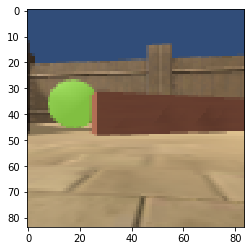

GoodGoalMulti  prob =  0.9999999
CylinderTunnel  prob =  1.328994e-05
Wall  prob =  1.0104962e-05
Ramp  prob =  1.3965337e-06
WallTransparent  prob =  2.3303488e-11
HotZone  prob =  2.5268157e-15
GoodGoal  prob =  2.1585613e-18
CylinderTunnelTransparent  prob =  1.5086895e-19
BadGoal  prob =  4.542173e-21
Cardbox  prob =  6.0118894e-23
DeathZone  prob =  1.7045156e-27
ULObject  prob =  1.3855344e-34


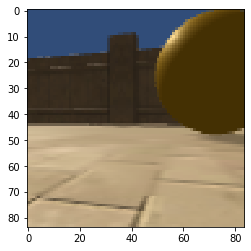

Cardbox  prob =  0.99996674
Ramp  prob =  0.05899655
Wall  prob =  0.037619095
CylinderTunnel  prob =  0.03014608
WallTransparent  prob =  1.7948875e-14
CylinderTunnelTransparent  prob =  5.5541966e-15
BadGoal  prob =  2.2298879e-17
ULObject  prob =  1.762821e-19
HotZone  prob =  2.369728e-20
GoodGoal  prob =  2.553931e-22
DeathZone  prob =  4.0975947e-23
GoodGoalMulti  prob =  4.612733e-29


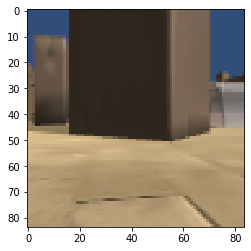

ULObject  prob =  0.38689157
DeathZone  prob =  0.37199548
WallTransparent  prob =  0.3518287
Wall  prob =  0.33970708
CylinderTunnelTransparent  prob =  0.33369482
Ramp  prob =  0.3323659
CylinderTunnel  prob =  0.32898974
HotZone  prob =  0.30546188
Cardbox  prob =  0.19913621
GoodGoalMulti  prob =  0.15741926
GoodGoal  prob =  0.1344459
BadGoal  prob =  0.08914842


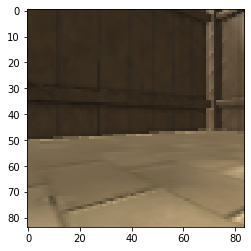

ULObject  prob =  0.9999999
Ramp  prob =  0.0046241535
Wall  prob =  0.00059300184
CylinderTunnel  prob =  1.5917482e-05
DeathZone  prob =  5.8318287e-26
BadGoal  prob =  1.8927196e-32
HotZone  prob =  1.6181212e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


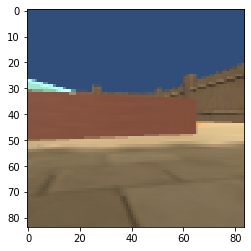

ULObject  prob =  0.504779
Ramp  prob =  0.0008387019
Wall  prob =  1.3533731e-05
CylinderTunnel  prob =  6.197594e-07
DeathZone  prob =  4.4837753e-15
BadGoal  prob =  8.683275e-17
HotZone  prob =  4.52187e-24
GoodGoal  prob =  4.744427e-26
WallTransparent  prob =  7.517205e-27
Cardbox  prob =  1.6825264e-33
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


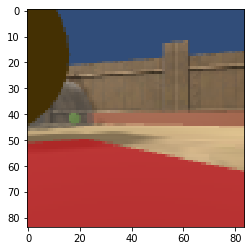

Ramp
WallTransparent  prob =  0.10015808
CylinderTunnelTransparent  prob =  0.07086479
Wall  prob =  0.056656133
Ramp  prob =  0.056485664
CylinderTunnel  prob =  0.044531286
HotZone  prob =  0.031014686
Cardbox  prob =  0.025946973
GoodGoalMulti  prob =  0.0212614
ULObject  prob =  0.013940285
DeathZone  prob =  0.013460017
BadGoal  prob =  0.006935281
GoodGoal  prob =  0.0021680014


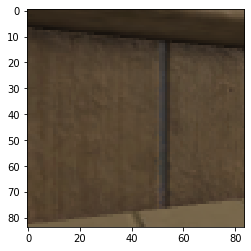

Ramp  prob =  0.9925101
CylinderTunnel  prob =  0.80307436
Wall  prob =  0.78480375
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


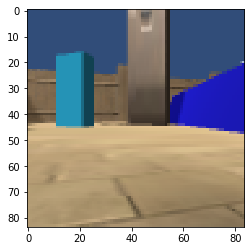

CylinderTunnel  prob =  0.9997491
Ramp  prob =  0.04918492
Wall  prob =  0.016618624
HotZone  prob =  1.9619986e-26
GoodGoal  prob =  2.6920324e-28
BadGoal  prob =  3.8638958e-32
GoodGoalMulti  prob =  5.2842507e-36
Cardbox  prob =  5.1515503e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


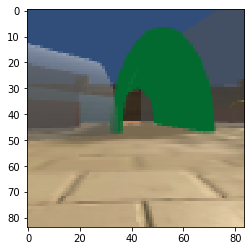

Ramp  prob =  0.9739783
CylinderTunnel  prob =  0.9684704
Wall  prob =  1.0456412e-05
ULObject  prob =  6.1387284e-29
HotZone  prob =  5.692565e-33
BadGoal  prob =  1.2776027e-34
Cardbox  prob =  8.349461e-36
GoodGoal  prob =  2.949105e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


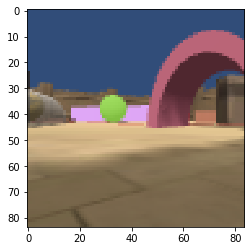

Cardbox  prob =  0.9999976
Wall  prob =  1.8445883e-07
Ramp  prob =  9.585373e-08
CylinderTunnel  prob =  8.422195e-08
WallTransparent  prob =  1.129579e-08
DeathZone  prob =  5.914863e-10
HotZone  prob =  5.016721e-10
ULObject  prob =  2.7092203e-10
CylinderTunnelTransparent  prob =  2.6672278e-10
GoodGoal  prob =  3.4911835e-14
BadGoal  prob =  1.5001482e-14
GoodGoalMulti  prob =  3.1280499e-18


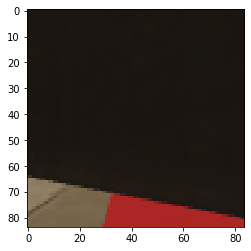

CylinderTunnel  prob =  0.9876155
Ramp  prob =  0.58223355
Wall  prob =  0.09056796
CylinderTunnelTransparent  prob =  2.7512923e-13
BadGoal  prob =  2.2968536e-13
Cardbox  prob =  6.45218e-15
WallTransparent  prob =  2.4170814e-15
HotZone  prob =  6.031683e-18
GoodGoal  prob =  2.7676498e-21
ULObject  prob =  6.268118e-22
DeathZone  prob =  1.9306702e-23
GoodGoalMulti  prob =  7.0511385e-24


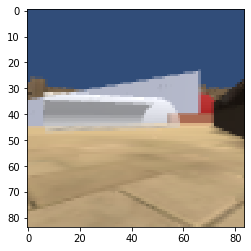

Ramp  prob =  0.9817197
CylinderTunnel  prob =  0.5241373
Wall  prob =  0.0784204
HotZone  prob =  5.7262667e-30
GoodGoal  prob =  1.9408526e-31
BadGoal  prob =  4.607083e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


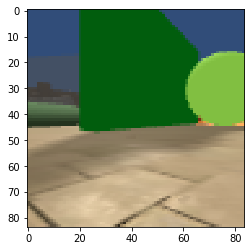

CylinderTunnel  prob =  0.9891712
Ramp  prob =  0.75563097
Wall  prob =  0.10419895
BadGoal  prob =  1.3828619e-06
HotZone  prob =  1.6837018e-10
WallTransparent  prob =  6.1875127e-14
ULObject  prob =  3.137306e-14
DeathZone  prob =  1.4200441e-17
GoodGoal  prob =  6.4702613e-18
GoodGoalMulti  prob =  4.035899e-23
Cardbox  prob =  2.7067335e-23
CylinderTunnelTransparent  prob =  1.5504267e-37


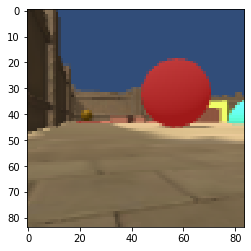

Ramp  prob =  0.9053475
Wall  prob =  0.18401153
BadGoal  prob =  0.024152339
CylinderTunnel  prob =  0.013192004
WallTransparent  prob =  6.2155825e-10
DeathZone  prob =  1.2524051e-10
ULObject  prob =  9.9420014e-11
HotZone  prob =  8.9525335e-15
GoodGoal  prob =  3.1731656e-19
Cardbox  prob =  8.925617e-25
CylinderTunnelTransparent  prob =  2.5095046e-31
GoodGoalMulti  prob =  7.1347324e-35


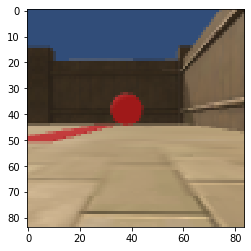

WallTransparent  prob =  0.35674173
ULObject  prob =  0.33495656
Ramp  prob =  0.3315075
Wall  prob =  0.3068892
CylinderTunnelTransparent  prob =  0.2950846
HotZone  prob =  0.28704587
DeathZone  prob =  0.2789315
CylinderTunnel  prob =  0.23031132
GoodGoalMulti  prob =  0.16801192
Cardbox  prob =  0.16153464
GoodGoal  prob =  0.12255723
BadGoal  prob =  0.099994734


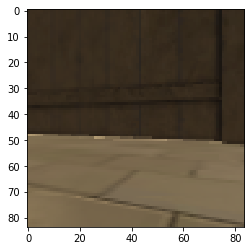

Wall  prob =  0.9527939
Ramp  prob =  0.8841331
CylinderTunnel  prob =  0.0040999274
HotZone  prob =  3.3587392e-25
Cardbox  prob =  2.1220873e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


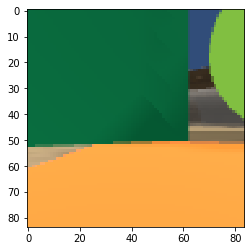

Ramp  prob =  0.9787749
Wall  prob =  0.7332598
CylinderTunnel  prob =  0.035152964
ULObject  prob =  2.5807625e-13
BadGoal  prob =  8.007465e-18
DeathZone  prob =  3.1751014e-20
Cardbox  prob =  3.937656e-24
GoodGoal  prob =  6.8319715e-27
HotZone  prob =  1.5693872e-27
WallTransparent  prob =  7.8593185e-28
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


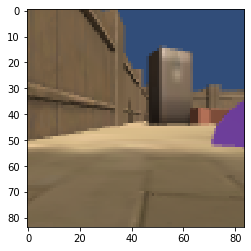

CylinderTunnel  prob =  0.70730346
Ramp  prob =  0.3800876
Wall  prob =  0.06741609
BadGoal  prob =  2.9123218e-15
HotZone  prob =  1.1434665e-21
GoodGoal  prob =  7.1140867e-25
GoodGoalMulti  prob =  7.7341e-30
Cardbox  prob =  1.2376703e-36
DeathZone  prob =  6.6890697e-37
WallTransparent  prob =  3.59688e-39
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0


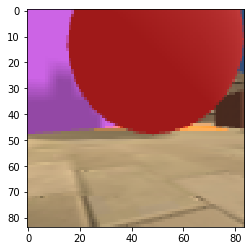

ULObject  prob =  0.22015257
Ramp  prob =  0.19161464
CylinderTunnel  prob =  0.18476835
Wall  prob =  0.1764237
HotZone  prob =  0.17559585
DeathZone  prob =  0.17207679
WallTransparent  prob =  0.17196469
CylinderTunnelTransparent  prob =  0.11706938
Cardbox  prob =  0.087293
GoodGoal  prob =  0.06988129
GoodGoalMulti  prob =  0.058724448
BadGoal  prob =  0.05059906


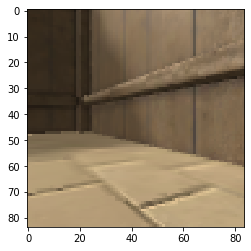

DeathZone  prob =  0.008328966
CylinderTunnel  prob =  1.0083899e-05
GoodGoal  prob =  3.5932615e-07
Ramp  prob =  1.0767088e-09
Wall  prob =  8.806075e-11
GoodGoalMulti  prob =  3.4823954e-12
Cardbox  prob =  1.5434969e-17
HotZone  prob =  2.0160827e-23
ULObject  prob =  1.3594419e-25
BadGoal  prob =  2.6362314e-27
WallTransparent  prob =  1.306354e-27
CylinderTunnelTransparent  prob =  5.7383185e-29


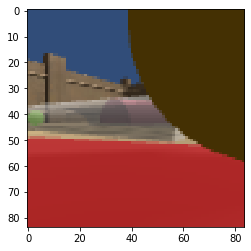

WallTransparent  prob =  0.34749755
ULObject  prob =  0.31343058
Ramp  prob =  0.26247618
Wall  prob =  0.24947189
Cardbox  prob =  0.22875024
HotZone  prob =  0.21817867
GoodGoalMulti  prob =  0.2024975
DeathZone  prob =  0.19252251
CylinderTunnelTransparent  prob =  0.18595327
CylinderTunnel  prob =  0.17575206
GoodGoal  prob =  0.056264117
BadGoal  prob =  0.04268471


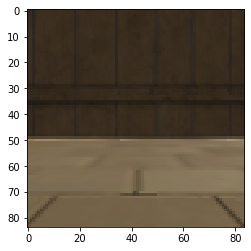

ULObject  prob =  0.98550516
Ramp  prob =  0.28888535
Wall  prob =  0.23581305
CylinderTunnel  prob =  0.086321406
HotZone  prob =  1.2370858e-05
BadGoal  prob =  9.760134e-07
DeathZone  prob =  1.154522e-07
WallTransparent  prob =  1.1475423e-08
GoodGoal  prob =  4.447886e-09
Cardbox  prob =  5.4069184e-15
GoodGoalMulti  prob =  5.3307324e-15
CylinderTunnelTransparent  prob =  5.324624e-19


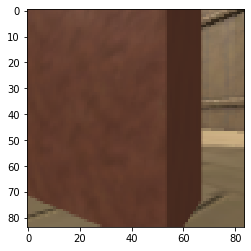

Wall  prob =  0.9625295
Ramp  prob =  0.7704798
CylinderTunnel  prob =  0.4318699
Cardbox  prob =  1.7502411e-11
GoodGoal  prob =  1.7761741e-25
BadGoal  prob =  5.1118596e-26
HotZone  prob =  6.584645e-27
ULObject  prob =  6.7081527e-31
WallTransparent  prob =  5.2572786e-32
GoodGoalMulti  prob =  1.9295917e-34
DeathZone  prob =  1.3810386e-34
CylinderTunnelTransparent  prob =  0.0


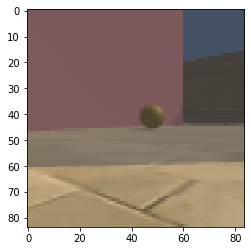

Ramp  prob =  0.8915068
Wall  prob =  0.53026503
CylinderTunnel  prob =  0.0012040231
HotZone  prob =  6.010156e-20
GoodGoal  prob =  8.321052e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


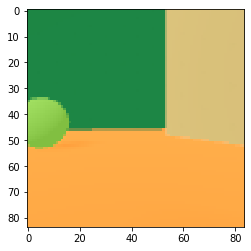

Ramp  prob =  0.99396247
CylinderTunnel  prob =  0.92892605
Wall  prob =  0.00013966124
ULObject  prob =  2.2369407e-26
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


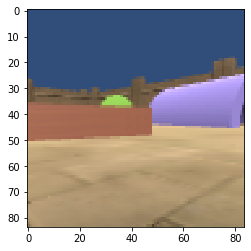

Ramp  prob =  0.90615964
Wall  prob =  0.7103167
CylinderTunnel  prob =  0.2699421
HotZone  prob =  2.93064e-06
ULObject  prob =  1.2737059e-10
BadGoal  prob =  4.9191716e-14
WallTransparent  prob =  1.761775e-16
DeathZone  prob =  5.887109e-17
GoodGoal  prob =  3.2801522e-21
GoodGoalMulti  prob =  1.2043543e-30
Cardbox  prob =  6.1666263e-32
CylinderTunnelTransparent  prob =  1.8325125e-34


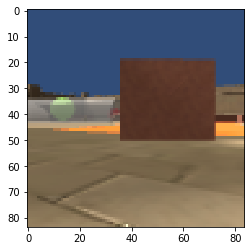

CylinderTunnel  prob =  0.9999995
Ramp  prob =  0.0009187616
Wall  prob =  0.0005334472
Cardbox  prob =  3.0201778e-16
GoodGoal  prob =  1.1440884e-17
BadGoal  prob =  3.727311e-19
HotZone  prob =  1.5240914e-22
GoodGoalMulti  prob =  1.11993e-22
DeathZone  prob =  1.7214818e-24
ULObject  prob =  6.961865e-25
WallTransparent  prob =  2.0195383e-31
CylinderTunnelTransparent  prob =  8.2854336e-36


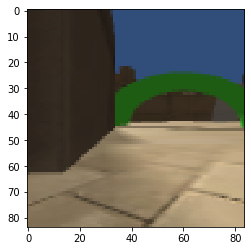

BadGoal  prob =  0.99999726
CylinderTunnel  prob =  0.0032232318
Ramp  prob =  0.0013091977
Wall  prob =  0.0007974633
GoodGoal  prob =  1.4665389e-07
HotZone  prob =  2.7312828e-09
WallTransparent  prob =  1.2491743e-11
DeathZone  prob =  1.0018462e-11
ULObject  prob =  8.792192e-12
Cardbox  prob =  1.6884103e-17
GoodGoalMulti  prob =  2.4000122e-21
CylinderTunnelTransparent  prob =  4.7920566e-22


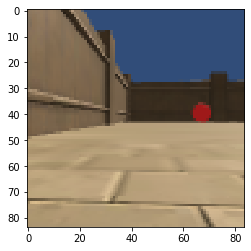

Ramp  prob =  0.9665359
Wall  prob =  0.3026677
CylinderTunnel  prob =  0.0016179796
DeathZone  prob =  4.357942e-08
BadGoal  prob =  1.6644852e-11
ULObject  prob =  6.977492e-12
HotZone  prob =  1.4341036e-12
WallTransparent  prob =  8.3004255e-14
GoodGoal  prob =  1.835964e-17
Cardbox  prob =  5.6375176e-20
CylinderTunnelTransparent  prob =  2.3049121e-27
GoodGoalMulti  prob =  4.3308113e-31


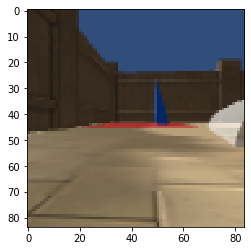

CylinderTunnel  prob =  0.99879885
Wall  prob =  0.45324677
Ramp  prob =  0.36249098
GoodGoalMulti  prob =  1.0912584e-06
WallTransparent  prob =  5.630364e-19
HotZone  prob =  3.495637e-20
GoodGoal  prob =  1.8231941e-22
BadGoal  prob =  5.0462966e-33
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


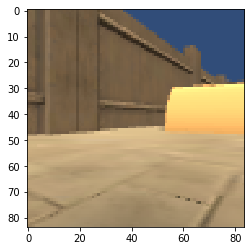

Ramp  prob =  0.9242431
CylinderTunnel  prob =  0.2723225
Wall  prob =  0.068314984
BadGoal  prob =  5.941517e-09
DeathZone  prob =  1.5228803e-10
ULObject  prob =  4.3502177e-12
GoodGoal  prob =  2.856958e-18
WallTransparent  prob =  5.311293e-20
Cardbox  prob =  4.0839048e-25
HotZone  prob =  3.4528987e-26
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


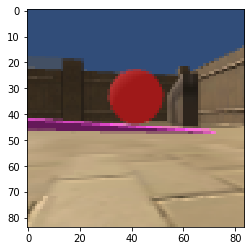

Ramp  prob =  0.98656565
CylinderTunnel  prob =  0.29750374
Wall  prob =  0.11190748
BadGoal  prob =  3.6586935e-18
HotZone  prob =  1.5365958e-22
ULObject  prob =  1.1022638e-23
GoodGoal  prob =  3.1384869e-24
WallTransparent  prob =  4.2367328e-26
DeathZone  prob =  5.6159262e-27
Cardbox  prob =  4.9415305e-38
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


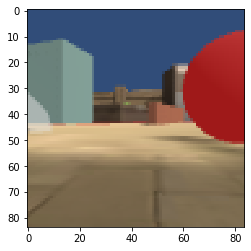

DeathZone  prob =  0.42839137
HotZone  prob =  0.42271367
CylinderTunnelTransparent  prob =  0.40136242
ULObject  prob =  0.39477888
Ramp  prob =  0.38861364
WallTransparent  prob =  0.37806454
CylinderTunnel  prob =  0.3674597
Wall  prob =  0.33898056
Cardbox  prob =  0.29638812
GoodGoalMulti  prob =  0.17785022
GoodGoal  prob =  0.11019331
BadGoal  prob =  0.070646636


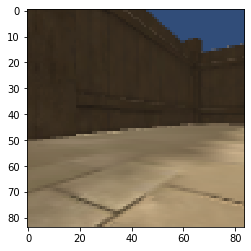

Cardbox  prob =  0.996967
Wall  prob =  0.06942468
Ramp  prob =  0.032305114
CylinderTunnel  prob =  0.027202437
WallTransparent  prob =  0.0015915199
CylinderTunnelTransparent  prob =  0.0010889061
GoodGoalMulti  prob =  0.00024913275
HotZone  prob =  8.841033e-06
GoodGoal  prob =  4.598947e-06
ULObject  prob =  1.2758198e-06
BadGoal  prob =  1.2140184e-06
DeathZone  prob =  1.6780007e-07


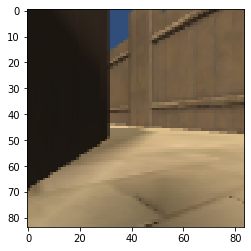

Ramp  prob =  0.8896593
Wall  prob =  0.7138625
WallTransparent  prob =  0.7024037
HotZone  prob =  0.008145852
CylinderTunnel  prob =  1.749535e-05
DeathZone  prob =  1.066828e-05
BadGoal  prob =  1.4466322e-06
GoodGoal  prob =  3.884034e-07
Cardbox  prob =  1.7649207e-07
ULObject  prob =  6.608337e-08
GoodGoalMulti  prob =  5.12855e-11
CylinderTunnelTransparent  prob =  2.3779477e-11


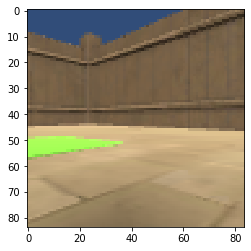

BadGoal  prob =  0.99927574
CylinderTunnel  prob =  0.0014912622
Wall  prob =  1.9316047e-05
Ramp  prob =  8.742026e-06
ULObject  prob =  8.292123e-09
DeathZone  prob =  6.5392225e-09
GoodGoal  prob =  1.4354139e-09
WallTransparent  prob =  3.6870945e-10
HotZone  prob =  1.4767448e-13
Cardbox  prob =  1.260578e-13
GoodGoalMulti  prob =  1.0862362e-21
CylinderTunnelTransparent  prob =  6.1406947e-22


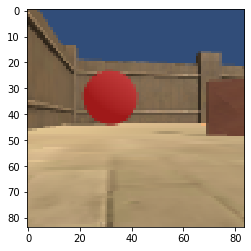

CylinderTunnel  prob =  0.041050483
Ramp  prob =  0.038300574
Wall  prob =  0.03266019
WallTransparent  prob =  0.030091556
CylinderTunnelTransparent  prob =  0.01402237
HotZone  prob =  0.008843217
DeathZone  prob =  0.007767457
GoodGoalMulti  prob =  0.005820291
ULObject  prob =  0.0051423227
Cardbox  prob =  0.0043715145
GoodGoal  prob =  0.0027690148
BadGoal  prob =  0.002297079


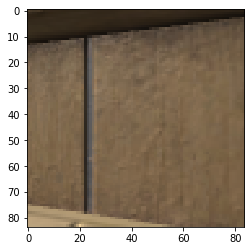

GoodGoal  prob =  0.9999995
CylinderTunnel  prob =  0.09637844
Ramp  prob =  0.010401798
Wall  prob =  0.0035382574
BadGoal  prob =  1.3382921e-13
DeathZone  prob =  1.4344595e-19
WallTransparent  prob =  5.00335e-22
HotZone  prob =  3.7555342e-23
ULObject  prob =  9.625818e-25
Cardbox  prob =  2.6087707e-27
GoodGoalMulti  prob =  2.119395e-27
CylinderTunnelTransparent  prob =  0.0


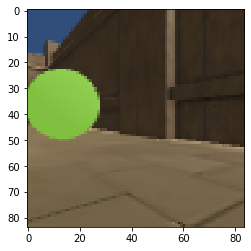

WallTransparent  prob =  0.0021753802
CylinderTunnelTransparent  prob =  0.00059871556
Ramp  prob =  1.2804338e-05
Wall  prob =  3.6133304e-06
CylinderTunnel  prob =  1.8022603e-06
GoodGoalMulti  prob =  6.009427e-11
BadGoal  prob =  1.03408816e-22
Cardbox  prob =  4.621408e-25
HotZone  prob =  2.8872148e-28
GoodGoal  prob =  1.2214229e-29
DeathZone  prob =  3.412348e-32
ULObject  prob =  9.930944e-35


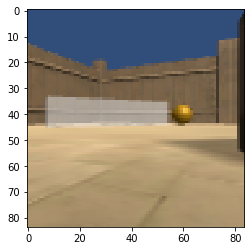

Ramp  prob =  0.33801386
Wall  prob =  0.0010995393
GoodGoal  prob =  1.0415139e-09
CylinderTunnel  prob =  8.2965135e-11
GoodGoalMulti  prob =  1.3974745e-16
HotZone  prob =  8.5902215e-20
BadGoal  prob =  3.804604e-23
WallTransparent  prob =  1.5325785e-24
ULObject  prob =  7.503437e-31
Cardbox  prob =  2.545437e-32
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


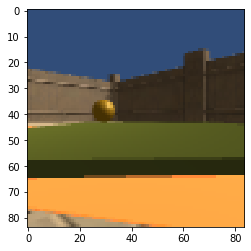

GoodGoal  prob =  0.628626
CylinderTunnel  prob =  0.18853754
Wall  prob =  0.03384434
Ramp  prob =  0.02301342
BadGoal  prob =  3.999521e-05
ULObject  prob =  6.609623e-08
WallTransparent  prob =  3.9093292e-10
HotZone  prob =  1.712351e-10
DeathZone  prob =  5.4668336e-12
Cardbox  prob =  4.6550424e-14
GoodGoalMulti  prob =  3.4883295e-17
CylinderTunnelTransparent  prob =  6.348592e-21


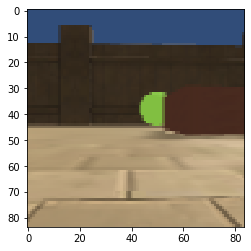

Ramp  prob =  0.99759406
CylinderTunnel  prob =  0.12610134
Wall  prob =  0.050282564
Cardbox  prob =  2.9654655e-34
BadGoal  prob =  4.4931983e-35
GoodGoal  prob =  3.7783283e-36
HotZone  prob =  6.22019e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


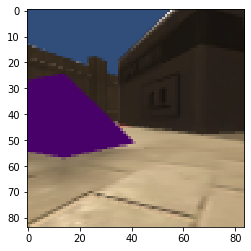

WallTransparent  prob =  0.4953244
DeathZone  prob =  0.48210922
ULObject  prob =  0.43658286
HotZone  prob =  0.42652053
CylinderTunnelTransparent  prob =  0.38084155
Ramp  prob =  0.35560668
Wall  prob =  0.31035405
Cardbox  prob =  0.30467972
CylinderTunnel  prob =  0.2846572
GoodGoalMulti  prob =  0.14492062
GoodGoal  prob =  0.09410319
BadGoal  prob =  0.06008077


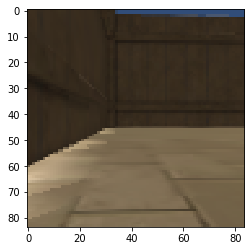

ULObject  prob =  0.40019763
HotZone  prob =  0.39563864
WallTransparent  prob =  0.37651917
DeathZone  prob =  0.3697057
Ramp  prob =  0.34837812
Wall  prob =  0.34239328
CylinderTunnel  prob =  0.3035374
Cardbox  prob =  0.2972004
GoodGoalMulti  prob =  0.25935045
CylinderTunnelTransparent  prob =  0.24723458
GoodGoal  prob =  0.13653482
BadGoal  prob =  0.05483684


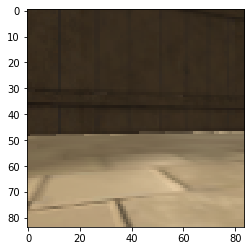

HotZone  prob =  0.28094828
Ramp  prob =  0.25084725
DeathZone  prob =  0.22815268
Wall  prob =  0.22544254
WallTransparent  prob =  0.21340229
CylinderTunnel  prob =  0.20036086
ULObject  prob =  0.19980176
CylinderTunnelTransparent  prob =  0.11552594
Cardbox  prob =  0.043651093
GoodGoalMulti  prob =  0.019280232
GoodGoal  prob =  0.012866067
BadGoal  prob =  0.0056758304


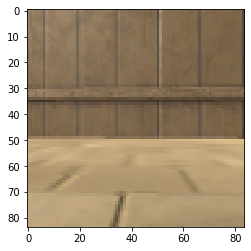

CylinderTunnel  prob =  0.960281
Ramp  prob =  0.78609896
Wall  prob =  0.022994746
HotZone  prob =  6.772319e-19
BadGoal  prob =  5.078312e-19
Cardbox  prob =  1.1655886e-20
ULObject  prob =  3.3787804e-21
GoodGoal  prob =  2.2347702e-22
WallTransparent  prob =  4.5655266e-26
GoodGoalMulti  prob =  7.552091e-29
DeathZone  prob =  5.542659e-31
CylinderTunnelTransparent  prob =  0.0


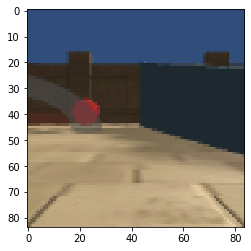

BadGoal  prob =  0.9948965
CylinderTunnel  prob =  0.019278754
Ramp  prob =  0.012540574
Wall  prob =  0.0043006744
GoodGoal  prob =  1.5464306e-05
Cardbox  prob =  3.449139e-08
HotZone  prob =  7.66949e-12
DeathZone  prob =  1.5891634e-14
WallTransparent  prob =  5.739949e-18
GoodGoalMulti  prob =  3.6361373e-19
ULObject  prob =  3.4506144e-22
CylinderTunnelTransparent  prob =  0.0


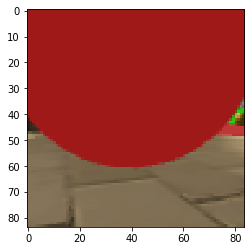

WallTransparent  prob =  0.3323435
ULObject  prob =  0.27977318
Ramp  prob =  0.27865785
DeathZone  prob =  0.26852813
HotZone  prob =  0.26795253
Wall  prob =  0.26216048
CylinderTunnel  prob =  0.24556887
Cardbox  prob =  0.19454828
CylinderTunnelTransparent  prob =  0.19445907
GoodGoalMulti  prob =  0.17035584
GoodGoal  prob =  0.0827171
BadGoal  prob =  0.073480695


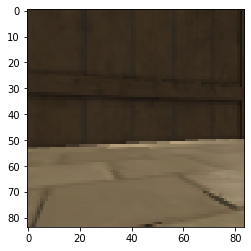

Ramp  prob =  0.8543734
Wall  prob =  0.85137016
CylinderTunnel  prob =  0.3374199
GoodGoal  prob =  4.0171594e-12
HotZone  prob =  3.473128e-16
BadGoal  prob =  5.684381e-19
ULObject  prob =  9.475597e-27
DeathZone  prob =  2.6322984e-30
GoodGoalMulti  prob =  1.879741e-30
Cardbox  prob =  6.899996e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


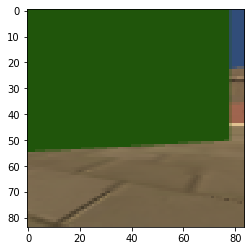

CylinderTunnel  prob =  0.98513687
Wall  prob =  0.79351056
Ramp  prob =  0.55984336
BadGoal  prob =  6.2551737e-14
Cardbox  prob =  1.2883118e-14
GoodGoalMulti  prob =  8.078029e-18
WallTransparent  prob =  3.959403e-18
GoodGoal  prob =  2.1773427e-18
HotZone  prob =  1.3943898e-18
CylinderTunnelTransparent  prob =  6.817339e-20
ULObject  prob =  4.4673647e-24
DeathZone  prob =  5.8782602e-27


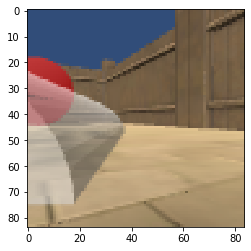

ULObject  prob =  0.9997925
Ramp  prob =  0.047861684
Wall  prob =  0.015364707
CylinderTunnel  prob =  0.002591884
DeathZone  prob =  1.6392973e-09
BadGoal  prob =  5.6884636e-10
HotZone  prob =  1.5381653e-10
WallTransparent  prob =  4.0954416e-14
GoodGoal  prob =  1.0428779e-16
Cardbox  prob =  7.0741234e-23
CylinderTunnelTransparent  prob =  3.7337298e-26
GoodGoalMulti  prob =  1.2160816e-28


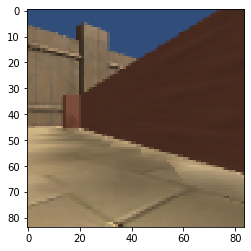

Ramp  prob =  0.9609939
Wall  prob =  0.37564075
CylinderTunnel  prob =  0.0038289332
GoodGoal  prob =  1.7644814e-28
HotZone  prob =  1.6189383e-28
BadGoal  prob =  1.677873e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


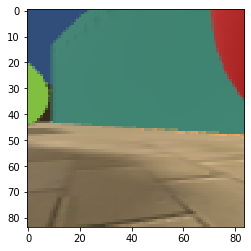

GoodGoal  prob =  0.8630825
Ramp  prob =  0.2751286
Wall  prob =  0.008480703
CylinderTunnel  prob =  0.0025850232
DeathZone  prob =  1.2385142e-16
BadGoal  prob =  8.9209083e-20
ULObject  prob =  2.340039e-20
HotZone  prob =  2.4352217e-22
WallTransparent  prob =  6.84547e-24
Cardbox  prob =  5.0036655e-33
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


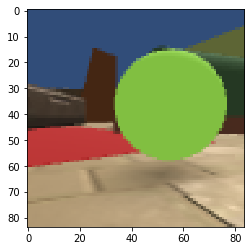

CylinderTunnel  prob =  0.9999969
Ramp  prob =  0.9197885
Wall  prob =  9.116549e-05
ULObject  prob =  1.2973631e-08
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


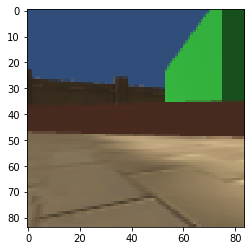

ULObject  prob =  0.99996674
Ramp  prob =  0.010614982
Wall  prob =  0.000626662
CylinderTunnel  prob =  6.791177e-08
DeathZone  prob =  1.8697607e-19
BadGoal  prob =  1.3448585e-20
HotZone  prob =  6.451977e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


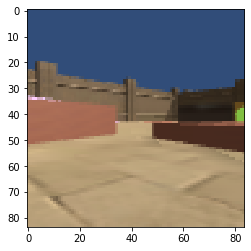

Cardbox  prob =  0.9982212
CylinderTunnel  prob =  0.4579049
Ramp  prob =  0.10034195
Wall  prob =  0.062431313
ULObject  prob =  0.0004506645
HotZone  prob =  0.00043779155
DeathZone  prob =  0.00038503192
GoodGoal  prob =  0.00028341793
BadGoal  prob =  6.27665e-05
CylinderTunnelTransparent  prob =  2.0661907e-06
GoodGoalMulti  prob =  9.740515e-07
WallTransparent  prob =  2.836503e-07


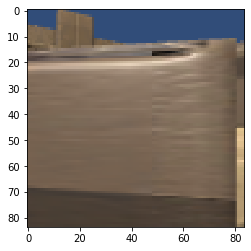

Ramp  prob =  0.95439607
Wall  prob =  0.32072598
CylinderTunnel  prob =  0.09469056
Cardbox  prob =  1.8359363e-24
WallTransparent  prob =  4.6337403e-28
BadGoal  prob =  7.944313e-30
GoodGoal  prob =  2.4211657e-33
HotZone  prob =  2.6627616e-35
ULObject  prob =  3.8137187e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


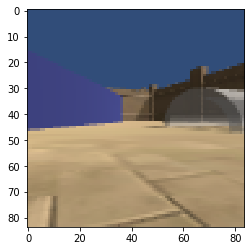

Ramp  prob =  0.40599623
WallTransparent  prob =  0.40548387
CylinderTunnel  prob =  0.35801938
HotZone  prob =  0.35166922
Wall  prob =  0.3453954
ULObject  prob =  0.325571
DeathZone  prob =  0.3235249
CylinderTunnelTransparent  prob =  0.2764854
Cardbox  prob =  0.1045098
GoodGoalMulti  prob =  0.023765909
GoodGoal  prob =  0.01711465
BadGoal  prob =  0.0134261325


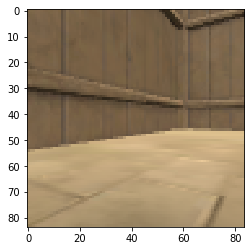

CylinderTunnel  prob =  0.9992587
Ramp  prob =  0.94317037
Wall  prob =  0.0005693237
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


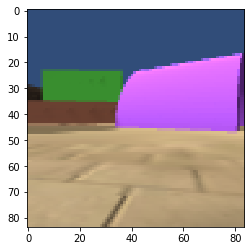

HotZone  prob =  1.0
Ramp  prob =  0.0076731797
Wall  prob =  0.0018602455
WallTransparent  prob =  9.558933e-07
CylinderTunnel  prob =  8.407259e-07
GoodGoal  prob =  7.3576215e-12
BadGoal  prob =  2.711761e-12
DeathZone  prob =  6.796201e-13
GoodGoalMulti  prob =  5.8866724e-13
ULObject  prob =  1.4496735e-14
Cardbox  prob =  2.1161824e-17
CylinderTunnelTransparent  prob =  5.233562e-19


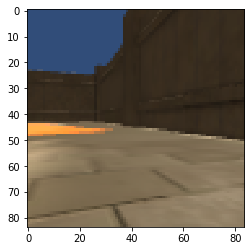

Ramp  prob =  0.48872477
HotZone  prob =  0.43766028
Wall  prob =  0.43180057
DeathZone  prob =  0.39558822
WallTransparent  prob =  0.392137
CylinderTunnel  prob =  0.3680902
ULObject  prob =  0.35281655
CylinderTunnelTransparent  prob =  0.26645923
Cardbox  prob =  0.059704095
BadGoal  prob =  0.01844133
GoodGoalMulti  prob =  0.013856831
GoodGoal  prob =  0.011646455


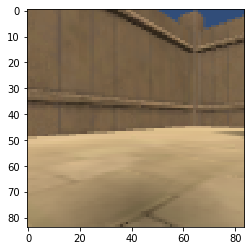

WallTransparent  prob =  0.53860074
Wall  prob =  0.52197486
Ramp  prob =  0.51912147
HotZone  prob =  0.503496
DeathZone  prob =  0.46393356
ULObject  prob =  0.39743748
CylinderTunnel  prob =  0.36249486
CylinderTunnelTransparent  prob =  0.31517106
Cardbox  prob =  0.109958924
BadGoal  prob =  0.025090441
GoodGoalMulti  prob =  0.024761274
GoodGoal  prob =  0.017681735


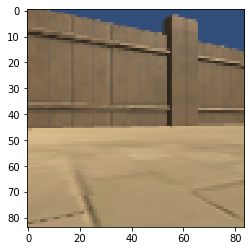

Wall  prob =  0.8617414
Ramp  prob =  0.83567053
CylinderTunnel  prob =  0.28360912
ULObject  prob =  2.933621e-21
Cardbox  prob =  2.9465788e-26
HotZone  prob =  1.256955e-28
BadGoal  prob =  2.5959606e-30
GoodGoal  prob =  3.7069405e-31
DeathZone  prob =  9.659905e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


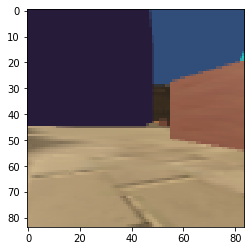

DeathZone  prob =  0.51288354
HotZone  prob =  0.504967
ULObject  prob =  0.47072557
WallTransparent  prob =  0.46144038
Ramp  prob =  0.43382174
Wall  prob =  0.43225333
CylinderTunnelTransparent  prob =  0.36080208
CylinderTunnel  prob =  0.35845193
Cardbox  prob =  0.2451489
GoodGoalMulti  prob =  0.11501848
BadGoal  prob =  0.06951239
GoodGoal  prob =  0.06695967


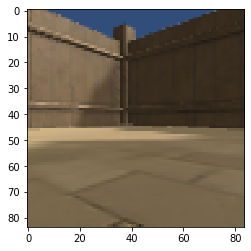

GoodGoal  prob =  1.0
Ramp  prob =  7.991414e-05
CylinderTunnel  prob =  9.56077e-06
Wall  prob =  1.9428608e-06
BadGoal  prob =  5.2759488e-11
WallTransparent  prob =  2.9972793e-13
HotZone  prob =  1.803446e-14
DeathZone  prob =  1.1052156e-15
ULObject  prob =  2.975838e-17
GoodGoalMulti  prob =  3.289547e-23
Cardbox  prob =  2.976304e-24
CylinderTunnelTransparent  prob =  1.1080882e-34


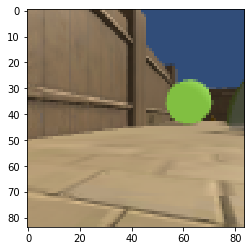

Ramp  prob =  0.99914944
Wall  prob =  0.997589
CylinderTunnel  prob =  0.0682432
HotZone  prob =  6.7160795e-06
Cardbox  prob =  8.09664e-07
ULObject  prob =  4.7936606e-09
DeathZone  prob =  1.3445521e-18
GoodGoal  prob =  2.9068993e-19
BadGoal  prob =  9.664586e-20
WallTransparent  prob =  1.6581262e-29
GoodGoalMulti  prob =  1.5574298e-34
CylinderTunnelTransparent  prob =  0.0


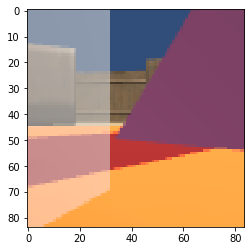

CylinderTunnelTransparent  prob =  0.99451077
WallTransparent  prob =  0.43904197
Ramp  prob =  0.025589254
Wall  prob =  0.01591494
CylinderTunnel  prob =  0.014128396
BadGoal  prob =  1.7227899e-08
Cardbox  prob =  4.4974394e-10
GoodGoalMulti  prob =  3.3896094e-11
HotZone  prob =  1.2352947e-11
DeathZone  prob =  8.3581675e-12
ULObject  prob =  6.3252207e-12
GoodGoal  prob =  6.1832948e-12


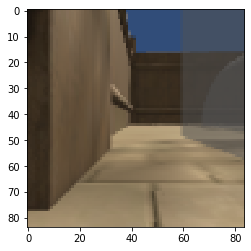

ULObject  prob =  1.0
Ramp  prob =  0.0033923825
Wall  prob =  4.4979348e-05
CylinderTunnel  prob =  2.0777501e-05
DeathZone  prob =  1.8585587e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


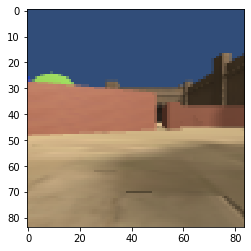

CylinderTunnel  prob =  0.9977187
Ramp  prob =  0.2591021
Wall  prob =  0.006375147
ULObject  prob =  0.0036922111
BadGoal  prob =  1.2153333e-12
DeathZone  prob =  1.2648179e-15
HotZone  prob =  3.8724276e-23
GoodGoal  prob =  2.061539e-24
Cardbox  prob =  5.1591677e-27
WallTransparent  prob =  3.176989e-29
CylinderTunnelTransparent  prob =  4.943534e-36
GoodGoalMulti  prob =  0.0


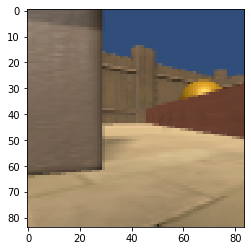

CylinderTunnel
Ramp  prob =  0.14775333
Wall  prob =  0.11771796
CylinderTunnel  prob =  0.0006672903
HotZone  prob =  5.0822766e-11
GoodGoal  prob =  3.065395e-11
WallTransparent  prob =  3.5355668e-17
DeathZone  prob =  1.3405622e-26
ULObject  prob =  1.9400912e-30
BadGoal  prob =  3.1624035e-31
Cardbox  prob =  2.0320242e-33
GoodGoalMulti  prob =  7.987031e-39
CylinderTunnelTransparent  prob =  0.0


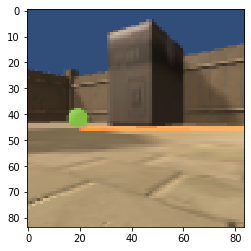

Ramp  prob =  0.09458216
Wall  prob =  0.0021675094
DeathZone  prob =  0.00016497371
CylinderTunnel  prob =  1.0062336e-07
ULObject  prob =  6.7688828e-12
Cardbox  prob =  1.6879251e-12
GoodGoal  prob =  8.407488e-13
WallTransparent  prob =  1.9068029e-22
BadGoal  prob =  9.137675e-23
HotZone  prob =  7.090036e-23
GoodGoalMulti  prob =  6.7952333e-23
CylinderTunnelTransparent  prob =  0.0


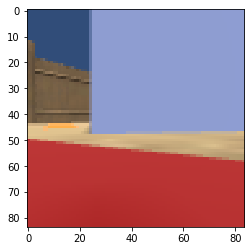

Wall  prob =  0.95013446
Ramp  prob =  0.80976105
CylinderTunnel  prob =  0.11622929
HotZone  prob =  2.9678473e-12
BadGoal  prob =  6.160868e-16
GoodGoal  prob =  3.6898396e-17
DeathZone  prob =  1.8369006e-19
ULObject  prob =  3.1412464e-21
Cardbox  prob =  1.3721931e-22
WallTransparent  prob =  3.489528e-24
GoodGoalMulti  prob =  4.4066313e-26
CylinderTunnelTransparent  prob =  0.0


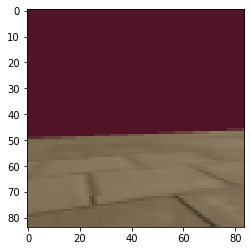

Ramp  prob =  0.7135483
Wall  prob =  0.33568245
HotZone  prob =  0.019320324
CylinderTunnel  prob =  4.670374e-05
ULObject  prob =  6.3930344e-08
DeathZone  prob =  3.4734777e-13
BadGoal  prob =  2.9390302e-14
WallTransparent  prob =  1.0435806e-19
GoodGoal  prob =  7.211265e-20
Cardbox  prob =  1.19991045e-23
GoodGoalMulti  prob =  6.3657193e-34
CylinderTunnelTransparent  prob =  0.0


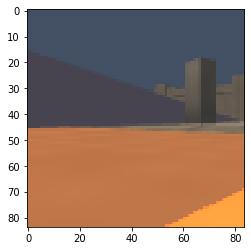

Wall  prob =  0.7288502
CylinderTunnel  prob =  0.55522674
Ramp  prob =  0.49918154
GoodGoal  prob =  0.33665362
DeathZone  prob =  0.25153702
ULObject  prob =  0.082811795
BadGoal  prob =  0.0052053663
CylinderTunnelTransparent  prob =  0.0051290453
HotZone  prob =  0.002036902
Cardbox  prob =  0.0008462753
WallTransparent  prob =  0.00075410167
GoodGoalMulti  prob =  7.819234e-05


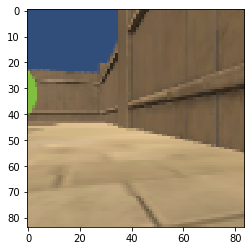

HotZone  prob =  0.40274268
Ramp  prob =  0.3920284
WallTransparent  prob =  0.36626646
ULObject  prob =  0.36431482
DeathZone  prob =  0.34765968
Wall  prob =  0.3370708
CylinderTunnel  prob =  0.32155085
CylinderTunnelTransparent  prob =  0.29704773
Cardbox  prob =  0.14946568
GoodGoalMulti  prob =  0.09008683
BadGoal  prob =  0.055518705
GoodGoal  prob =  0.038984288


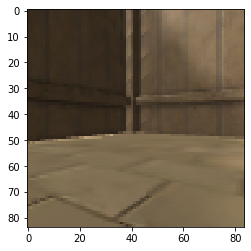

Wall  prob =  0.9339446
Ramp  prob =  0.8643041
CylinderTunnel  prob =  0.023657473
HotZone  prob =  1.1115991e-17
BadGoal  prob =  1.7316594e-22
GoodGoal  prob =  2.4571492e-23
Cardbox  prob =  8.036254e-27
ULObject  prob =  4.597066e-28
DeathZone  prob =  1.0178967e-30
GoodGoalMulti  prob =  1.0643136e-34
WallTransparent  prob =  3.6314645e-35
CylinderTunnelTransparent  prob =  0.0


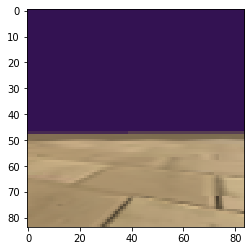

HotZone  prob =  0.9994062
Ramp  prob =  0.35671103
Wall  prob =  0.000108677195
CylinderTunnel  prob =  1.74721e-10
ULObject  prob =  8.1598374e-11
BadGoal  prob =  2.3391452e-21
Cardbox  prob =  5.808129e-22
GoodGoal  prob =  1.6311015e-27
DeathZone  prob =  3.192334e-28
WallTransparent  prob =  2.0743773e-28
GoodGoalMulti  prob =  1.9204795e-33
CylinderTunnelTransparent  prob =  0.0


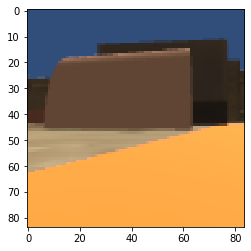

CylinderTunnel  prob =  0.9999944
Ramp  prob =  0.012774669
Wall  prob =  0.003223195
HotZone  prob =  3.4971935e-30
BadGoal  prob =  3.346964e-30
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


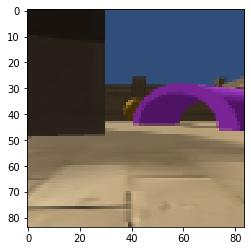

DeathZone  prob =  0.99102813
GoodGoal  prob =  6.512495e-10
Ramp  prob =  1.4668936e-10
ULObject  prob =  5.7497155e-13
Wall  prob =  9.882206e-14
HotZone  prob =  9.591947e-14
WallTransparent  prob =  5.979137e-16
Cardbox  prob =  1.2554436e-16
CylinderTunnel  prob =  2.8121163e-19
BadGoal  prob =  1.599822e-19
GoodGoalMulti  prob =  1.0688374e-20
CylinderTunnelTransparent  prob =  4.086469e-36


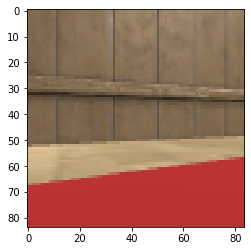

Cardbox  prob =  0.99999976
CylinderTunnel  prob =  0.008503532
Ramp  prob =  0.007025637
Wall  prob =  0.0059101665
CylinderTunnelTransparent  prob =  7.22221e-12
WallTransparent  prob =  2.0033512e-13
BadGoal  prob =  1.9405576e-15
ULObject  prob =  1.9053389e-17
HotZone  prob =  1.0594775e-18
DeathZone  prob =  3.641315e-19
GoodGoal  prob =  3.6506876e-20
GoodGoalMulti  prob =  1.7307644e-26


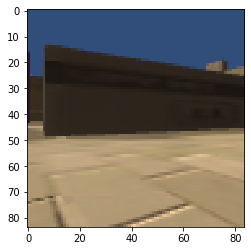

GoodGoal  prob =  0.99863917
CylinderTunnel  prob =  2.7661286e-05
Ramp  prob =  1.5220942e-05
Wall  prob =  1.47254e-09
DeathZone  prob =  7.336625e-13
BadGoal  prob =  1.434414e-14
Cardbox  prob =  3.6164055e-15
ULObject  prob =  7.288039e-19
HotZone  prob =  6.6004366e-20
WallTransparent  prob =  1.299715e-32
GoodGoalMulti  prob =  5.609144e-33
CylinderTunnelTransparent  prob =  0.0


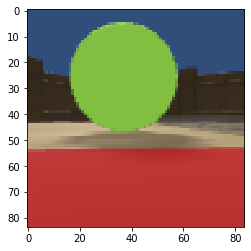

Ramp  prob =  0.511998
Wall  prob =  0.48501158
WallTransparent  prob =  0.48432148
ULObject  prob =  0.47997227
HotZone  prob =  0.46833548
DeathZone  prob =  0.4462147
CylinderTunnelTransparent  prob =  0.43585488
CylinderTunnel  prob =  0.4210741
Cardbox  prob =  0.31498232
GoodGoalMulti  prob =  0.119645104
GoodGoal  prob =  0.10850056
BadGoal  prob =  0.0995264


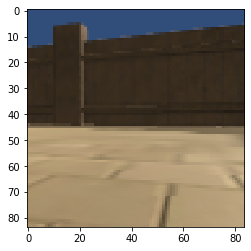

GoodGoal  prob =  0.99999976
CylinderTunnel  prob =  0.0004906209
BadGoal  prob =  4.6568687e-07
Ramp  prob =  6.155091e-08
Wall  prob =  8.2648816e-10
DeathZone  prob =  5.6064137e-15
Cardbox  prob =  1.4973779e-18
HotZone  prob =  1.0370287e-19
ULObject  prob =  3.718452e-25
WallTransparent  prob =  3.5879637e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


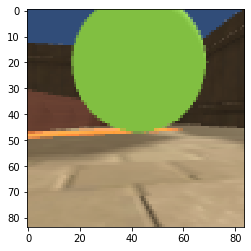

Ramp  prob =  0.9964998
Wall  prob =  0.65880555
GoodGoal  prob =  7.0595506e-06
CylinderTunnel  prob =  1.6662814e-06
GoodGoalMulti  prob =  1.0000041e-22
BadGoal  prob =  9.051932e-26
WallTransparent  prob =  2.1864518e-30
HotZone  prob =  8.6348044e-35
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


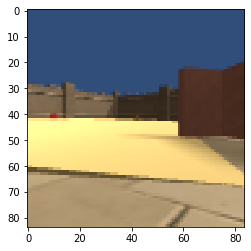

Ramp  prob =  0.6472044
CylinderTunnel  prob =  0.5336204
BadGoal  prob =  0.43677342
Wall  prob =  0.09476872
HotZone  prob =  3.0434595e-08
GoodGoal  prob =  1.9537233e-11
DeathZone  prob =  1.6895154e-13
WallTransparent  prob =  3.3181967e-14
ULObject  prob =  5.125459e-15
Cardbox  prob =  1.4271084e-18
GoodGoalMulti  prob =  1.623635e-25
CylinderTunnelTransparent  prob =  1.5201584e-32


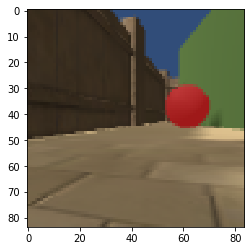

Ramp  prob =  0.999253
Wall  prob =  0.0107367635
CylinderTunnel  prob =  5.2046926e-07
GoodGoal  prob =  1.5409357e-12
BadGoal  prob =  4.889484e-13
DeathZone  prob =  2.9411583e-16
WallTransparent  prob =  4.244551e-24
ULObject  prob =  7.1543314e-34
Cardbox  prob =  7.1366374e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


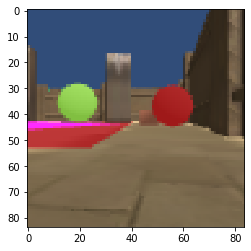

Cardbox  prob =  0.99999976
Wall  prob =  0.0006107751
Ramp  prob =  0.00029962778
CylinderTunnel  prob =  0.00011461544
WallTransparent  prob =  4.2636217e-15
CylinderTunnelTransparent  prob =  9.755689e-16
HotZone  prob =  6.7005757e-18
ULObject  prob =  6.274638e-18
BadGoal  prob =  7.5506597e-19
DeathZone  prob =  5.445989e-19
GoodGoal  prob =  1.9318508e-21
GoodGoalMulti  prob =  2.276168e-25


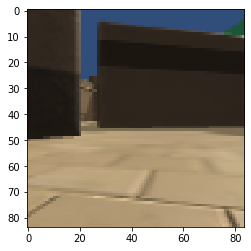

Ramp  prob =  0.97378755
Wall  prob =  0.00024067202
DeathZone  prob =  7.069934e-07
ULObject  prob =  5.8303745e-10
CylinderTunnel  prob =  5.613942e-13
BadGoal  prob =  3.3827594e-17
WallTransparent  prob =  2.373192e-28
GoodGoal  prob =  5.632909e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


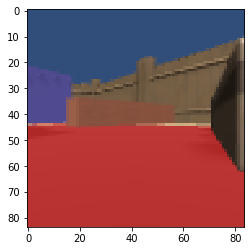

CylinderTunnelTransparent  prob =  0.999995
Ramp  prob =  0.078560695
CylinderTunnel  prob =  0.05314661
Wall  prob =  0.0078004245
WallTransparent  prob =  3.8262247e-08
BadGoal  prob =  6.4099595e-15
Cardbox  prob =  1.92513e-18
HotZone  prob =  6.002494e-23
DeathZone  prob =  2.363575e-24
GoodGoalMulti  prob =  5.8523564e-25
ULObject  prob =  2.3253862e-25
GoodGoal  prob =  1.6500317e-28


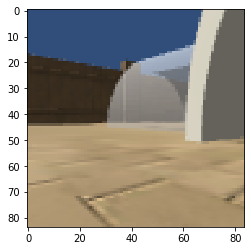

Wall  prob =  0.7569586
Ramp  prob =  0.2842712
CylinderTunnel  prob =  0.19996656
HotZone  prob =  2.6778619e-06
BadGoal  prob =  5.752187e-08
GoodGoal  prob =  4.2774125e-11
Cardbox  prob =  6.4592906e-17
GoodGoalMulti  prob =  3.1607481e-18
DeathZone  prob =  8.718906e-21
WallTransparent  prob =  2.9516597e-21
ULObject  prob =  1.03240245e-27
CylinderTunnelTransparent  prob =  0.0


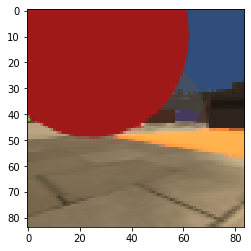

WallTransparent  prob =  0.08355
Ramp  prob =  0.054875936
Wall  prob =  0.047005687
CylinderTunnel  prob =  0.04676157
CylinderTunnelTransparent  prob =  0.031607453
HotZone  prob =  0.014143774
ULObject  prob =  0.008666973
DeathZone  prob =  0.006879088
Cardbox  prob =  0.006428188
GoodGoalMulti  prob =  0.0030711829
BadGoal  prob =  0.0027624655
GoodGoal  prob =  0.0013957128


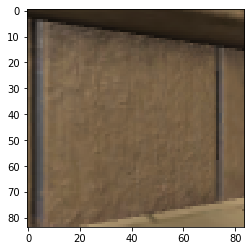

CylinderTunnel  prob =  0.9949561
Ramp  prob =  0.24442554
Wall  prob =  0.15611391
Cardbox  prob =  3.221531e-08
GoodGoalMulti  prob =  3.316193e-09
WallTransparent  prob =  5.2066133e-14
HotZone  prob =  1.814847e-14
CylinderTunnelTransparent  prob =  1.7667469e-14
GoodGoal  prob =  1.3824963e-15
BadGoal  prob =  5.071447e-16
ULObject  prob =  3.864056e-18
DeathZone  prob =  1.3131632e-21


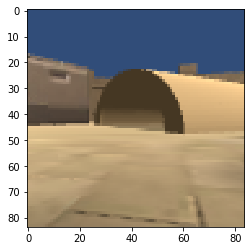

Ramp  prob =  0.9926819
Wall  prob =  0.7209963
CylinderTunnel  prob =  0.0028887924
WallTransparent  prob =  2.3165989e-21
HotZone  prob =  1.3144407e-29
GoodGoal  prob =  1.5584603e-31
BadGoal  prob =  6.2545816e-35
ULObject  prob =  1.2352972e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


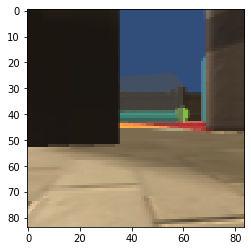

Wall  prob =  0.16045205
Ramp  prob =  0.14600511
CylinderTunnel  prob =  0.1292003
ULObject  prob =  0.09072107
CylinderTunnelTransparent  prob =  0.08873145
WallTransparent  prob =  0.08780572
BadGoal  prob =  0.06986259
DeathZone  prob =  0.05959806
GoodGoal  prob =  0.049619727
HotZone  prob =  0.047026884
GoodGoalMulti  prob =  0.02647869
Cardbox  prob =  0.015563434


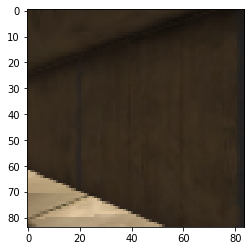

CylinderTunnelTransparent  prob =  0.47360417
WallTransparent  prob =  0.009981308
Ramp  prob =  0.00029063292
Wall  prob =  8.7699245e-06
CylinderTunnel  prob =  7.1078057e-07
BadGoal  prob =  2.8631348e-13
GoodGoal  prob =  3.2901529e-21
HotZone  prob =  2.1086516e-21
DeathZone  prob =  5.7279695e-23
GoodGoalMulti  prob =  9.915518e-24
Cardbox  prob =  3.5257475e-25
ULObject  prob =  2.7511033e-28


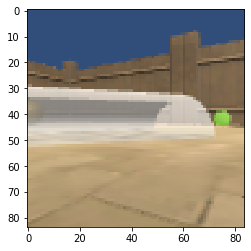

ULObject  prob =  0.9999689
Ramp  prob =  0.022742894
Wall  prob =  0.009500855
CylinderTunnel  prob =  0.0003112324
BadGoal  prob =  5.8400937e-09
HotZone  prob =  2.2633918e-14
DeathZone  prob =  3.0620696e-15
WallTransparent  prob =  7.057796e-21
GoodGoal  prob =  9.521929e-22
Cardbox  prob =  6.027776e-32
CylinderTunnelTransparent  prob =  1.0347797e-35
GoodGoalMulti  prob =  1.2561241e-38


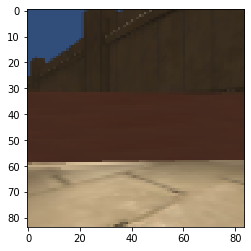

Ramp  prob =  0.15097803
CylinderTunnel  prob =  0.116060786
Wall  prob =  0.036843974
GoodGoal  prob =  1.9106763e-11
BadGoal  prob =  1.1119692e-15
DeathZone  prob =  6.862262e-22
HotZone  prob =  2.011605e-22
WallTransparent  prob =  5.8656773e-25
ULObject  prob =  2.189988e-25
Cardbox  prob =  3.878913e-33
GoodGoalMulti  prob =  1.9396921e-37
CylinderTunnelTransparent  prob =  0.0


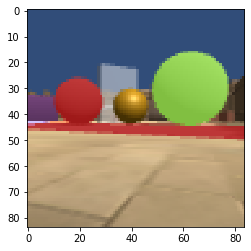

Ramp  prob =  0.9671245
CylinderTunnel  prob =  0.62615186
Wall  prob =  0.006060819
HotZone  prob =  5.5875554e-17
BadGoal  prob =  1.24942126e-20
Cardbox  prob =  1.7407604e-21
GoodGoal  prob =  8.590504e-23
ULObject  prob =  1.4603549e-26
DeathZone  prob =  8.830588e-32
WallTransparent  prob =  2.2778707e-32
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


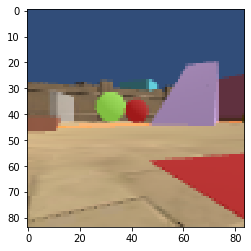

ULObject  prob =  0.096712686
GoodGoalMulti  prob =  0.09141295
BadGoal  prob =  0.0909989
Cardbox  prob =  0.08402526
WallTransparent  prob =  0.07386027
CylinderTunnelTransparent  prob =  0.06947867
HotZone  prob =  0.058657117
Ramp  prob =  0.054267813
DeathZone  prob =  0.049144197
Wall  prob =  0.04307675
CylinderTunnel  prob =  0.03972217
GoodGoal  prob =  0.03810025


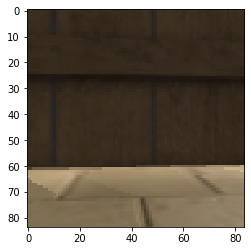

CylinderTunnel  prob =  0.5823885
BadGoal  prob =  0.10048801
Ramp  prob =  0.028951297
Wall  prob =  0.004895291
DeathZone  prob =  1.2259485e-06
GoodGoal  prob =  2.4659954e-07
HotZone  prob =  2.2363048e-07
Cardbox  prob =  4.7203166e-08
GoodGoalMulti  prob =  2.0786433e-09
CylinderTunnelTransparent  prob =  2.7789057e-10
ULObject  prob =  4.3830266e-11
WallTransparent  prob =  6.525367e-13


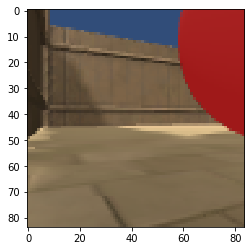

BadGoal  prob =  0.999943
CylinderTunnel  prob =  0.0114026815
Ramp  prob =  0.009727227
Wall  prob =  0.0036883627
ULObject  prob =  4.6080568e-06
GoodGoal  prob =  3.5631027e-07
HotZone  prob =  1.4504778e-07
DeathZone  prob =  2.3951199e-09
WallTransparent  prob =  2.1498914e-11
GoodGoalMulti  prob =  1.6583223e-14
Cardbox  prob =  7.905609e-17
CylinderTunnelTransparent  prob =  7.101182e-17


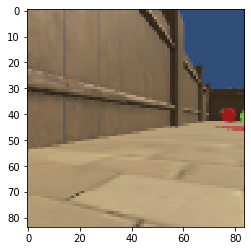

Ramp  prob =  0.95545727
Wall  prob =  0.6214961
CylinderTunnel  prob =  0.037915573
HotZone  prob =  2.913906e-11
BadGoal  prob =  3.0128547e-19
WallTransparent  prob =  8.659569e-22
GoodGoal  prob =  6.93435e-26
GoodGoalMulti  prob =  1.3827447e-29
DeathZone  prob =  8.232764e-34
ULObject  prob =  2.5185994e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


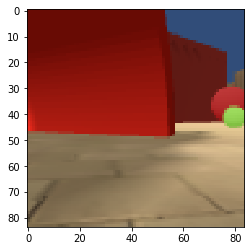

CylinderTunnel  prob =  0.99493366
Wall  prob =  0.78310466
Ramp  prob =  0.1329835
HotZone  prob =  2.8323394e-23
BadGoal  prob =  1.17967554e-26
GoodGoal  prob =  4.4079575e-27
ULObject  prob =  7.382013e-30
DeathZone  prob =  4.92746e-34
Cardbox  prob =  4.8709243e-35
GoodGoalMulti  prob =  5.4785932e-36
WallTransparent  prob =  3.2541525e-37
CylinderTunnelTransparent  prob =  0.0


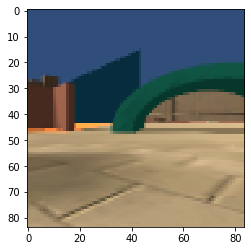

CylinderTunnelTransparent  prob =  0.91356593
WallTransparent  prob =  0.74132085
Wall  prob =  0.34825155
Ramp  prob =  0.2581662
CylinderTunnel  prob =  0.2160232
Cardbox  prob =  0.049440123
GoodGoalMulti  prob =  0.0012789828
HotZone  prob =  0.0011872867
DeathZone  prob =  0.00054676173
BadGoal  prob =  0.00040036865
ULObject  prob =  0.00035645918
GoodGoal  prob =  5.6469173e-05


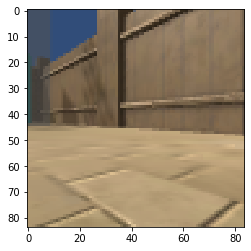

Ramp  prob =  0.9089582
Wall  prob =  0.59836525
HotZone  prob =  0.3722249
CylinderTunnel  prob =  0.00076086493
Cardbox  prob =  1.9362153e-07
DeathZone  prob =  1.2726478e-09
WallTransparent  prob =  3.3210273e-10
GoodGoal  prob =  6.3650654e-11
ULObject  prob =  5.469663e-11
BadGoal  prob =  9.508279e-15
GoodGoalMulti  prob =  7.8397855e-23
CylinderTunnelTransparent  prob =  2.1405818e-23


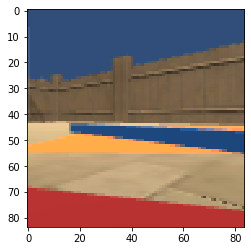

ULObject  prob =  0.36200383
WallTransparent  prob =  0.32134748
DeathZone  prob =  0.3196947
Ramp  prob =  0.30394483
CylinderTunnel  prob =  0.29608175
CylinderTunnelTransparent  prob =  0.28160888
HotZone  prob =  0.27402303
Wall  prob =  0.2709968
GoodGoalMulti  prob =  0.248956
Cardbox  prob =  0.22064869
GoodGoal  prob =  0.10786301
BadGoal  prob =  0.06358237


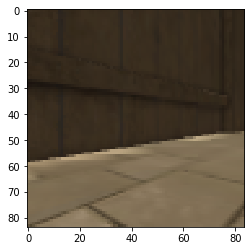

WallTransparent  prob =  0.108541556
CylinderTunnelTransparent  prob =  0.07481634
Ramp  prob =  0.051458135
Wall  prob =  0.05062657
CylinderTunnel  prob =  0.037335046
BadGoal  prob =  0.024345879
Cardbox  prob =  0.023087295
HotZone  prob =  0.020695359
ULObject  prob =  0.014993
DeathZone  prob =  0.013850961
GoodGoal  prob =  0.008570753
GoodGoalMulti  prob =  0.0038921414


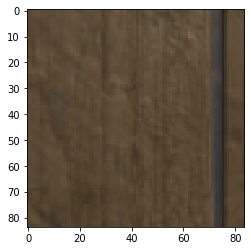

HotZone  prob =  1.0
Ramp  prob =  1.1462294e-05
Wall  prob =  5.2822397e-08
CylinderTunnel  prob =  2.0769612e-18
BadGoal  prob =  1.015242e-19
ULObject  prob =  1.7927306e-23
DeathZone  prob =  2.8397772e-27
GoodGoal  prob =  6.50361e-28
WallTransparent  prob =  6.2609537e-28
Cardbox  prob =  1.348212e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


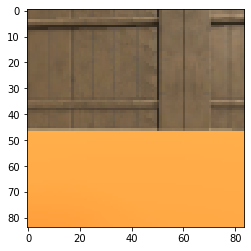

Wall  prob =  0.97097945
Ramp  prob =  0.83890015
CylinderTunnel  prob =  0.6881387
BadGoal  prob =  1.9540925e-22
Cardbox  prob =  2.2135495e-23
WallTransparent  prob =  3.1096828e-24
GoodGoalMulti  prob =  6.7996833e-26
CylinderTunnelTransparent  prob =  3.4136868e-26
HotZone  prob =  3.9391353e-28
GoodGoal  prob =  3.984681e-31
ULObject  prob =  1.372288e-36
DeathZone  prob =  0.0


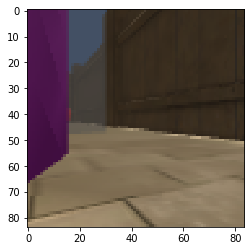

ULObject  prob =  0.99998736
Ramp  prob =  0.01751397
Wall  prob =  0.009297473
CylinderTunnel  prob =  0.0026710886
HotZone  prob =  1.20470595e-11
DeathZone  prob =  1.7812271e-12
BadGoal  prob =  5.94849e-13
WallTransparent  prob =  3.1986632e-19
GoodGoal  prob =  2.4116608e-19
Cardbox  prob =  7.559361e-27
CylinderTunnelTransparent  prob =  1.698138e-32
GoodGoalMulti  prob =  1.6528002e-32


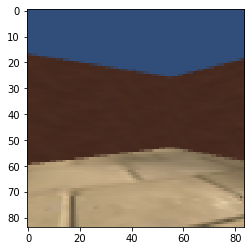

Ramp  prob =  0.7490242
Wall  prob =  0.7175713
ULObject  prob =  0.43663132
CylinderTunnel  prob =  0.36446574
DeathZone  prob =  2.1718288e-08
BadGoal  prob =  6.0637895e-09
HotZone  prob =  1.1409202e-09
GoodGoal  prob =  4.8632785e-11
WallTransparent  prob =  2.333549e-13
Cardbox  prob =  2.0472372e-16
GoodGoalMulti  prob =  1.642883e-22
CylinderTunnelTransparent  prob =  3.2985536e-25


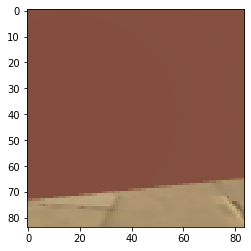

ULObject  prob =  0.66696995
Ramp  prob =  0.0018095503
Wall  prob =  1.0653721e-07
CylinderTunnel  prob =  1.1384682e-09
HotZone  prob =  1.6489542e-11
BadGoal  prob =  5.5723053e-13
GoodGoal  prob =  3.6621204e-30
Cardbox  prob =  1.8354887e-31
DeathZone  prob =  9.870656e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


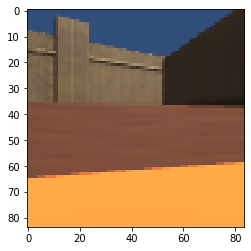

HotZone  prob =  0.9999989
Wall  prob =  0.37283158
Ramp  prob =  0.29309973
CylinderTunnel  prob =  4.0267867e-12
BadGoal  prob =  7.850643e-17
DeathZone  prob =  3.879867e-22
GoodGoal  prob =  6.3318595e-27
WallTransparent  prob =  9.99062e-31
Cardbox  prob =  9.742824e-38
ULObject  prob =  8.5775043e-38
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


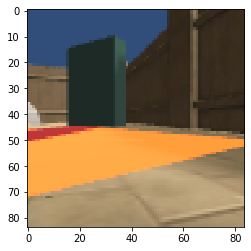

Ramp  prob =  0.9996197
Wall  prob =  0.0038481276
CylinderTunnel  prob =  0.0017460064
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


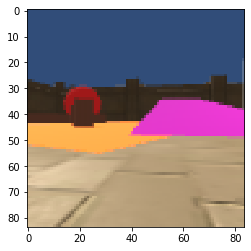

Ramp  prob =  0.86395943
Wall  prob =  0.58288604
CylinderTunnel  prob =  0.0097725
WallTransparent  prob =  3.0373253e-11
GoodGoalMulti  prob =  8.261388e-20
CylinderTunnelTransparent  prob =  8.823419e-24
GoodGoal  prob =  1.7893341e-24
BadGoal  prob =  5.430849e-25
HotZone  prob =  1.2960552e-26
Cardbox  prob =  9.809633e-27
DeathZone  prob =  6.8596396e-31
ULObject  prob =  3.7485e-34


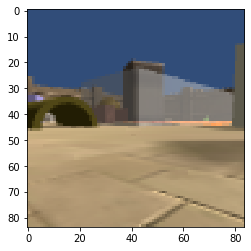

Ramp  prob =  0.6502812
Wall  prob =  0.47315368
CylinderTunnel  prob =  0.037769895
Cardbox  prob =  0.005831286
WallTransparent  prob =  1.4067462e-06
CylinderTunnelTransparent  prob =  1.02074885e-11
BadGoal  prob =  2.1148842e-16
ULObject  prob =  1.2857873e-19
DeathZone  prob =  5.1633008e-20
HotZone  prob =  4.8572307e-20
GoodGoal  prob =  4.237566e-22
GoodGoalMulti  prob =  1.1854323e-25


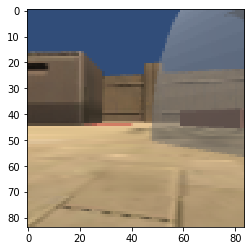

ULObject  prob =  0.9981188
Ramp  prob =  0.016012805
Wall  prob =  0.013320867
CylinderTunnel  prob =  0.00051520456
BadGoal  prob =  5.710161e-10
DeathZone  prob =  8.174012e-11
WallTransparent  prob =  4.2318097e-17
HotZone  prob =  4.0998256e-18
GoodGoal  prob =  5.226793e-21
Cardbox  prob =  1.8737499e-29
CylinderTunnelTransparent  prob =  2.9270345e-30
GoodGoalMulti  prob =  2.0100105e-36


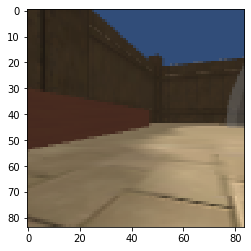

CylinderTunnel  prob =  0.9999999
Cardbox  prob =  0.9850568
CylinderTunnelTransparent  prob =  1.0701071e-05
Ramp  prob =  2.7901524e-06
Wall  prob =  1.4234361e-10
BadGoal  prob =  8.3839245e-15
ULObject  prob =  3.5356827e-20
GoodGoal  prob =  4.0014874e-21
DeathZone  prob =  2.9721202e-22
HotZone  prob =  6.1926997e-24
GoodGoalMulti  prob =  2.069195e-26
WallTransparent  prob =  1.6421884e-36


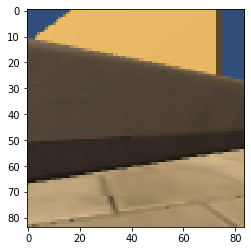

CylinderTunnel  prob =  0.9999292
Ramp  prob =  0.10455933
Wall  prob =  0.014211166
BadGoal  prob =  2.0250366e-18
HotZone  prob =  8.017286e-23
ULObject  prob =  1.6071405e-23
GoodGoal  prob =  6.621126e-32
DeathZone  prob =  9.001145e-33
WallTransparent  prob =  2.9646387e-35
Cardbox  prob =  4.2825455e-38
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


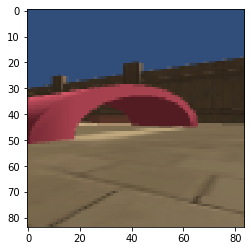

Ramp  prob =  0.9989951
Wall  prob =  0.49459574
ULObject  prob =  6.496748e-11
CylinderTunnel  prob =  4.369752e-12
DeathZone  prob =  3.6044276e-20
BadGoal  prob =  6.2574424e-21
HotZone  prob =  9.833961e-32
WallTransparent  prob =  5.433276e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


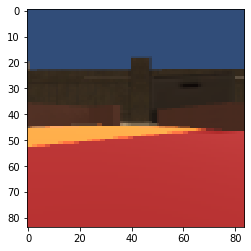

CylinderTunnel  prob =  0.9648362
Wall  prob =  0.49622405
Ramp  prob =  0.2923695
GoodGoal  prob =  0.00012841776
BadGoal  prob =  3.1627952e-20
HotZone  prob =  1.2073314e-21
ULObject  prob =  6.4972123e-28
DeathZone  prob =  5.9827044e-28
WallTransparent  prob =  5.950859e-29
GoodGoalMulti  prob =  4.9184937e-30
Cardbox  prob =  1.669531e-30
CylinderTunnelTransparent  prob =  0.0


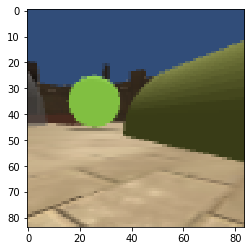

Ramp  prob =  0.09142083
Wall  prob =  0.0045372234
CylinderTunnel  prob =  0.0045303646
ULObject  prob =  3.048252e-12
GoodGoal  prob =  3.373719e-21
BadGoal  prob =  8.223255e-26
HotZone  prob =  9.2588047e-29
WallTransparent  prob =  1.09460586e-35
DeathZone  prob =  6.251945e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


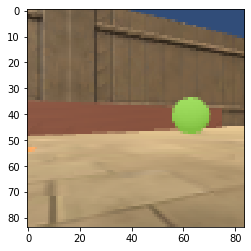

Ramp  prob =  0.89772135
Wall  prob =  0.8918916
CylinderTunnel  prob =  0.7663114
GoodGoalMulti  prob =  1.3977462e-06
WallTransparent  prob =  2.93951e-12
HotZone  prob =  1.30278e-21
GoodGoal  prob =  8.582376e-24
BadGoal  prob =  1.045968e-34
DeathZone  prob =  4.359403e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0


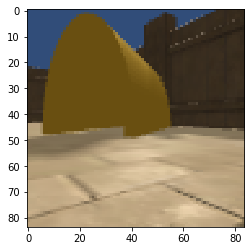

Cardbox  prob =  0.9999982
Wall  prob =  0.0064445296
Ramp  prob =  0.0030602582
CylinderTunnel  prob =  0.0006240324
WallTransparent  prob =  1.2924744e-13
CylinderTunnelTransparent  prob =  3.729324e-15
HotZone  prob =  5.7744476e-19
BadGoal  prob =  4.4690976e-19
ULObject  prob =  3.1761567e-19
DeathZone  prob =  4.934756e-20
GoodGoal  prob =  8.594179e-22
GoodGoalMulti  prob =  2.7966906e-26


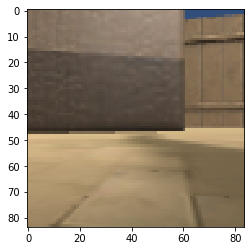

CylinderTunnel  prob =  0.9643029
Ramp  prob =  0.13926807
Wall  prob =  0.0695172
GoodGoalMulti  prob =  9.8550786e-11
HotZone  prob =  9.2439294e-14
BadGoal  prob =  2.5366352e-17
WallTransparent  prob =  4.0675324e-18
GoodGoal  prob =  3.7103102e-22
ULObject  prob =  1.3389287e-23
DeathZone  prob =  1.865121e-29
Cardbox  prob =  4.4527534e-30
CylinderTunnelTransparent  prob =  4.4379044e-35


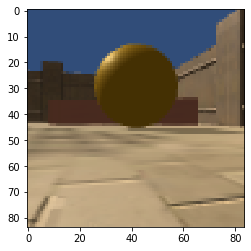

Ramp  prob =  0.97698057
Wall  prob =  0.92214084
CylinderTunnelTransparent  prob =  0.39017254
CylinderTunnel  prob =  0.120010816
WallTransparent  prob =  0.09407565
BadGoal  prob =  1.0830615e-08
Cardbox  prob =  3.394526e-15
DeathZone  prob =  3.9080835e-18
ULObject  prob =  2.1398116e-18
HotZone  prob =  4.0420088e-19
GoodGoal  prob =  5.310848e-20
GoodGoalMulti  prob =  2.8995523e-22


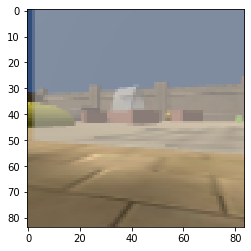

Wall  prob =  0.066217184
Ramp  prob =  0.06384369
CylinderTunnel  prob =  0.05112845
WallTransparent  prob =  0.04799394
CylinderTunnelTransparent  prob =  0.029485732
HotZone  prob =  0.027040163
ULObject  prob =  0.025415855
DeathZone  prob =  0.02425003
GoodGoal  prob =  0.014858992
BadGoal  prob =  0.0143445255
GoodGoalMulti  prob =  0.004719962
Cardbox  prob =  0.002665197


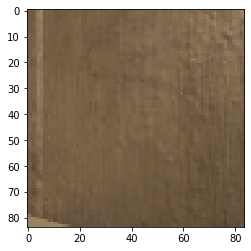

Ramp  prob =  0.05376953
Wall  prob =  0.0508417
CylinderTunnel  prob =  0.04061568
WallTransparent  prob =  0.030982457
CylinderTunnelTransparent  prob =  0.021592394
HotZone  prob =  0.017016325
DeathZone  prob =  0.015268067
ULObject  prob =  0.015149599
BadGoal  prob =  0.009635063
GoodGoal  prob =  0.0074063293
GoodGoalMulti  prob =  0.0020412935
Cardbox  prob =  0.0013092166


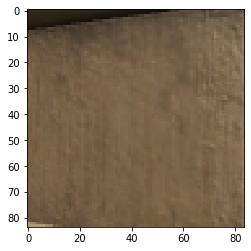

Ramp  prob =  0.99641234
HotZone  prob =  0.83531356
Wall  prob =  0.72343403
ULObject  prob =  1.8741237e-05
CylinderTunnel  prob =  1.0220664e-06
DeathZone  prob =  1.4188968e-16
BadGoal  prob =  2.703411e-23
Cardbox  prob =  6.5555087e-31
WallTransparent  prob =  1.237058e-34
GoodGoal  prob =  2.6046134e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


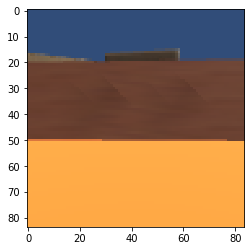

Ramp  prob =  0.3344955
Wall  prob =  0.0029879936
BadGoal  prob =  6.425052e-05
CylinderTunnel  prob =  9.37045e-06
HotZone  prob =  4.292406e-06
ULObject  prob =  1.3992841e-06
Cardbox  prob =  1.93669e-07
GoodGoal  prob =  4.6333543e-08
WallTransparent  prob =  1.4599469e-09
DeathZone  prob =  1.34448e-11
GoodGoalMulti  prob =  7.297383e-20
CylinderTunnelTransparent  prob =  1.5462116e-27


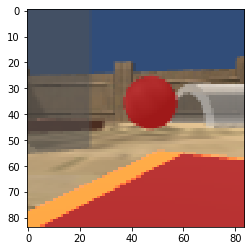

Cardbox  prob =  0.9997894
Wall  prob =  0.059073698
CylinderTunnel  prob =  0.038232844
Ramp  prob =  0.031032639
WallTransparent  prob =  1.9467132e-05
CylinderTunnelTransparent  prob =  4.314324e-07
BadGoal  prob =  3.1035998e-07
HotZone  prob =  1.4639342e-07
ULObject  prob =  2.334472e-08
GoodGoal  prob =  9.616885e-09
DeathZone  prob =  4.109999e-09
GoodGoalMulti  prob =  2.696478e-09


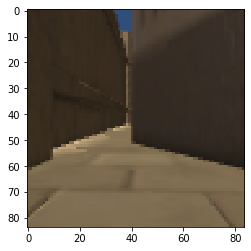

Wall  prob =  0.44042766
Ramp  prob =  0.41481504
CylinderTunnel  prob =  0.37263104
GoodGoal  prob =  0.078268975
BadGoal  prob =  1.7906414e-06
Cardbox  prob =  1.067546e-06
DeathZone  prob =  4.295682e-09
WallTransparent  prob =  9.404684e-10
GoodGoalMulti  prob =  2.5639083e-10
ULObject  prob =  1.6652449e-10
HotZone  prob =  1.5457524e-11
CylinderTunnelTransparent  prob =  1.3372293e-15


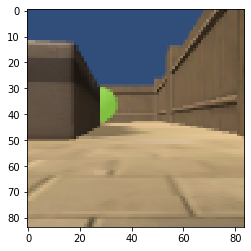

WallTransparent  prob =  0.9883929
CylinderTunnelTransparent  prob =  0.58293724
Ramp  prob =  0.035033617
Wall  prob =  0.006151225
CylinderTunnel  prob =  0.0058819386
BadGoal  prob =  2.5361148e-08
DeathZone  prob =  2.1209987e-10
HotZone  prob =  2.2669467e-11
ULObject  prob =  8.510249e-12
Cardbox  prob =  6.712105e-13
GoodGoal  prob =  1.2503506e-13
GoodGoalMulti  prob =  8.653892e-14


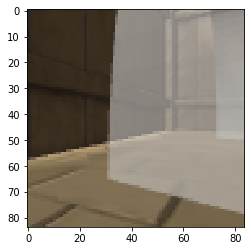

CylinderTunnelTransparent
HotZone  prob =  0.42731416
DeathZone  prob =  0.27570483
Ramp  prob =  0.27316737
WallTransparent  prob =  0.26855257
ULObject  prob =  0.25204816
Wall  prob =  0.24469806
CylinderTunnel  prob =  0.21965954
CylinderTunnelTransparent  prob =  0.18342781
Cardbox  prob =  0.16395842
GoodGoalMulti  prob =  0.1174068
BadGoal  prob =  0.06369086
GoodGoal  prob =  0.05299826


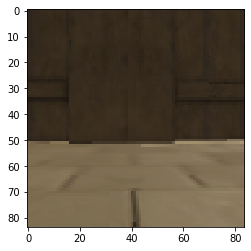

HotZone  prob =  0.3708914
WallTransparent  prob =  0.34877077
Ramp  prob =  0.34688124
ULObject  prob =  0.31752282
CylinderTunnel  prob =  0.30787265
DeathZone  prob =  0.3040557
Wall  prob =  0.2957324
CylinderTunnelTransparent  prob =  0.24404955
Cardbox  prob =  0.06559684
GoodGoalMulti  prob =  0.015771424
GoodGoal  prob =  0.01381918
BadGoal  prob =  0.009792575


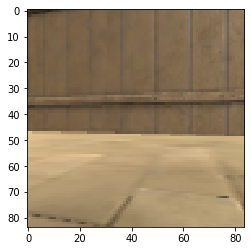

CylinderTunnel  prob =  0.017126983
Ramp  prob =  0.0053155776
Wall  prob =  0.00016088971
ULObject  prob =  3.6417968e-14
BadGoal  prob =  1.9229142e-17
HotZone  prob =  2.8445808e-19
WallTransparent  prob =  2.6701945e-22
DeathZone  prob =  1.3705178e-24
GoodGoal  prob =  1.9115995e-25
GoodGoalMulti  prob =  4.09693e-27
Cardbox  prob =  3.7084163e-36
CylinderTunnelTransparent  prob =  1.2090274e-36


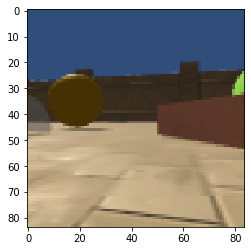

CylinderTunnel  prob =  1.0
Ramp  prob =  0.35917112
Wall  prob =  0.0014908761
Cardbox  prob =  1.1941521e-06
BadGoal  prob =  4.0547833e-25
ULObject  prob =  3.8697784e-26
DeathZone  prob =  3.5025374e-28
GoodGoal  prob =  2.322448e-28
CylinderTunnelTransparent  prob =  2.264647e-34
HotZone  prob =  9.85305e-37
WallTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


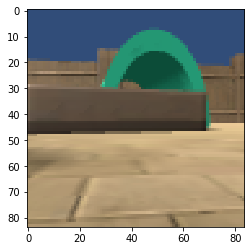

GoodGoalMulti  prob =  0.07370268
CylinderTunnel  prob =  0.07128858
Wall  prob =  0.061762497
Ramp  prob =  0.053990558
WallTransparent  prob =  0.04103432
Cardbox  prob =  0.031181067
ULObject  prob =  0.029490603
GoodGoal  prob =  0.022844547
HotZone  prob =  0.021243704
BadGoal  prob =  0.017517408
CylinderTunnelTransparent  prob =  0.016397247
DeathZone  prob =  0.0068735066


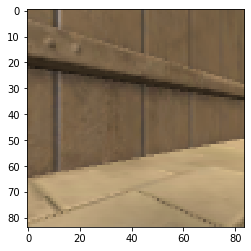

CylinderTunnel  prob =  0.97210455
Ramp  prob =  0.8636429
Wall  prob =  0.66232157
ULObject  prob =  1.9801365e-09
BadGoal  prob =  1.1089607e-24
DeathZone  prob =  1.033983e-27
HotZone  prob =  6.9855934e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


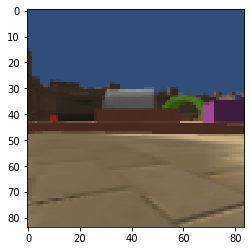

Ramp  prob =  0.4449247
CylinderTunnel  prob =  0.4439871
CylinderTunnelTransparent  prob =  0.42836735
Wall  prob =  0.42505637
DeathZone  prob =  0.42300507
ULObject  prob =  0.4202929
WallTransparent  prob =  0.4147203
HotZone  prob =  0.40989685
Cardbox  prob =  0.255519
GoodGoalMulti  prob =  0.13892664
GoodGoal  prob =  0.11312379
BadGoal  prob =  0.0835049


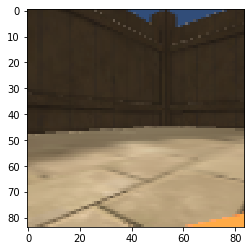

HotZone  prob =  0.99902475
Ramp  prob =  0.0118188895
Wall  prob =  0.0077905743
CylinderTunnel  prob =  2.8921697e-05
Cardbox  prob =  1.8370763e-05
WallTransparent  prob =  1.01011416e-07
GoodGoalMulti  prob =  4.0688056e-10
ULObject  prob =  3.571895e-11
BadGoal  prob =  7.1944646e-12
GoodGoal  prob =  4.2145024e-12
DeathZone  prob =  4.797776e-13
CylinderTunnelTransparent  prob =  2.8609305e-16


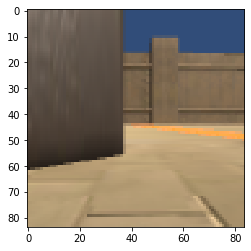

CylinderTunnel  prob =  0.99999297
Ramp  prob =  0.04045187
Wall  prob =  0.0019760036
BadGoal  prob =  7.5941917e-19
Cardbox  prob =  2.0254992e-19
GoodGoal  prob =  6.685964e-20
HotZone  prob =  1.068805e-27
DeathZone  prob =  6.18817e-30
ULObject  prob =  6.0948348e-30
GoodGoalMulti  prob =  1.5661774e-32
WallTransparent  prob =  2.0127882e-36
CylinderTunnelTransparent  prob =  4.336731e-38


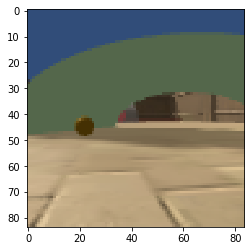

Cardbox  prob =  1.0
CylinderTunnel  prob =  0.00047325465
Wall  prob =  7.014682e-05
Ramp  prob =  4.2651616e-05
ULObject  prob =  5.4607585e-07
WallTransparent  prob =  7.36019e-08
DeathZone  prob =  2.3322022e-08
HotZone  prob =  9.084424e-09
CylinderTunnelTransparent  prob =  9.1997476e-10
GoodGoal  prob =  1.6412079e-10
BadGoal  prob =  9.9020514e-11
GoodGoalMulti  prob =  2.0346832e-12


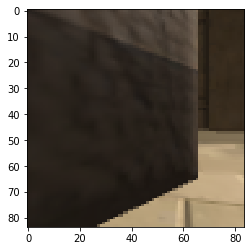

HotZone  prob =  0.39018577
DeathZone  prob =  0.2742732
Ramp  prob =  0.26761487
WallTransparent  prob =  0.25611266
ULObject  prob =  0.251663
Wall  prob =  0.2337751
CylinderTunnelTransparent  prob =  0.17839226
CylinderTunnel  prob =  0.17756994
Cardbox  prob =  0.055566855
GoodGoalMulti  prob =  0.02586802
GoodGoal  prob =  0.019924864
BadGoal  prob =  0.013214835


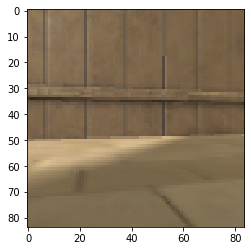

Ramp  prob =  0.4541556
HotZone  prob =  0.4414582
DeathZone  prob =  0.4376712
WallTransparent  prob =  0.42640367
Wall  prob =  0.4038069
ULObject  prob =  0.38995308
CylinderTunnel  prob =  0.36993548
CylinderTunnelTransparent  prob =  0.36921188
Cardbox  prob =  0.2599421
GoodGoalMulti  prob =  0.13220716
BadGoal  prob =  0.11639925
GoodGoal  prob =  0.09621175


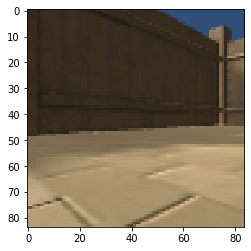

CylinderTunnel  prob =  0.944394
Ramp  prob =  0.2089929
Wall  prob =  0.12643944
BadGoal  prob =  7.8685176e-08
GoodGoal  prob =  1.2513718e-13
Cardbox  prob =  3.408787e-15
ULObject  prob =  8.493627e-16
HotZone  prob =  3.2989585e-16
WallTransparent  prob =  1.3186531e-16
DeathZone  prob =  2.0881766e-20
GoodGoalMulti  prob =  9.678554e-23
CylinderTunnelTransparent  prob =  3.2104852e-26


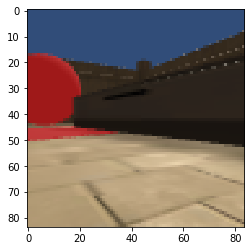

Ramp  prob =  0.98559475
CylinderTunnel  prob =  0.24216698
Wall  prob =  0.22137633
BadGoal  prob =  6.0085847e-24
HotZone  prob =  3.1310116e-25
GoodGoal  prob =  2.0045254e-31
Cardbox  prob =  1.4112793e-32
ULObject  prob =  1.8698089e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


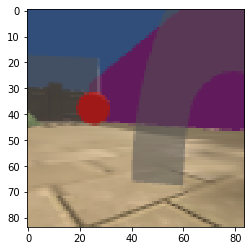

Ramp  prob =  0.042161383
ULObject  prob =  0.004226812
Wall  prob =  0.00094333244
DeathZone  prob =  0.00084038585
CylinderTunnel  prob =  3.6430806e-11
BadGoal  prob =  6.1863085e-14
WallTransparent  prob =  6.628672e-20
GoodGoal  prob =  3.2885115e-27
HotZone  prob =  1.4339599e-29
CylinderTunnelTransparent  prob =  1.1658724e-29
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


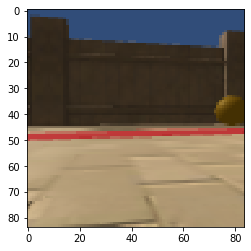

WallTransparent  prob =  0.86076725
Ramp  prob =  0.7255763
Wall  prob =  0.4946351
CylinderTunnel  prob =  0.041478824
GoodGoal  prob =  0.0026506481
Cardbox  prob =  0.0025271212
CylinderTunnelTransparent  prob =  0.0003783251
ULObject  prob =  0.00018406815
DeathZone  prob =  2.6372954e-05
BadGoal  prob =  1.2959533e-05
GoodGoalMulti  prob =  1.6597567e-06
HotZone  prob =  1.3644838e-06


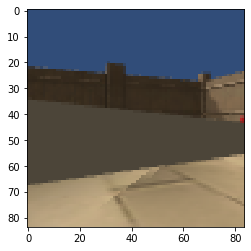

BadGoal  prob =  0.53901803
CylinderTunnel  prob =  0.029588288
Ramp  prob =  0.0005351627
Wall  prob =  0.00015506486
Cardbox  prob =  1.4721484e-06
GoodGoal  prob =  4.3628822e-07
DeathZone  prob =  2.7607197e-07
HotZone  prob =  2.3872542e-07
GoodGoalMulti  prob =  5.0769554e-08
CylinderTunnelTransparent  prob =  2.5217946e-11
ULObject  prob =  1.0628324e-12
WallTransparent  prob =  1.8529454e-13


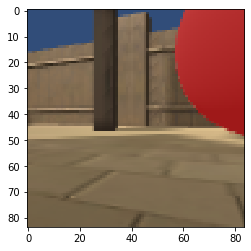

WallTransparent  prob =  0.57564557
Cardbox  prob =  0.55
Ramp  prob =  0.36127383
Wall  prob =  0.32009706
CylinderTunnel  prob =  0.21020989
ULObject  prob =  0.18499368
GoodGoalMulti  prob =  0.14718509
CylinderTunnelTransparent  prob =  0.13063824
HotZone  prob =  0.11299987
GoodGoal  prob =  0.09590323
DeathZone  prob =  0.09259152
BadGoal  prob =  0.043412615


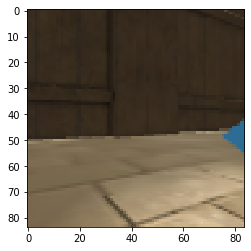

CylinderTunnel  prob =  0.99688536
Ramp  prob =  0.2799684
Wall  prob =  0.01297995
GoodGoal  prob =  1.4268239e-20
WallTransparent  prob =  6.9379117e-29
GoodGoalMulti  prob =  1.0208397e-31
BadGoal  prob =  4.978137e-32
HotZone  prob =  2.8185062e-34
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


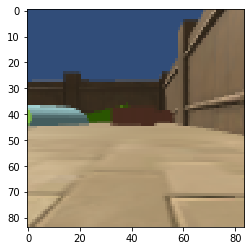

Ramp  prob =  0.9502728
CylinderTunnel  prob =  0.7669731
Wall  prob =  0.6061946
CylinderTunnelTransparent  prob =  0.0004364367
WallTransparent  prob =  1.346334e-09
Cardbox  prob =  8.452272e-12
BadGoal  prob =  3.036426e-12
HotZone  prob =  2.0716834e-18
ULObject  prob =  6.792785e-19
DeathZone  prob =  7.0577454e-20
GoodGoal  prob =  8.030578e-21
GoodGoalMulti  prob =  2.5814716e-24


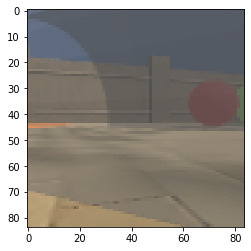

Wall  prob =  0.09821002
Ramp  prob =  0.08965393
CylinderTunnel  prob =  0.08045527
WallTransparent  prob =  0.05085122
HotZone  prob =  0.04167411
ULObject  prob =  0.034870878
CylinderTunnelTransparent  prob =  0.032480374
DeathZone  prob =  0.02848095
GoodGoal  prob =  0.014340993
BadGoal  prob =  0.012151897
Cardbox  prob =  0.008496866
GoodGoalMulti  prob =  0.007358905


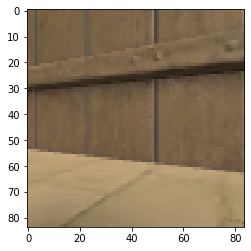

CylinderTunnel  prob =  0.961395
Ramp  prob =  0.90236294
Wall  prob =  0.8743144
ULObject  prob =  8.578907e-24
BadGoal  prob =  8.785951e-28
HotZone  prob =  7.9578183e-28
Cardbox  prob =  3.1625289e-28
GoodGoal  prob =  1.8317335e-30
DeathZone  prob =  1.4745611e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


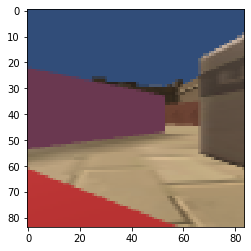

Ramp  prob =  0.43263832
ULObject  prob =  0.42142707
DeathZone  prob =  0.41328022
WallTransparent  prob =  0.41242447
HotZone  prob =  0.40289095
Wall  prob =  0.3870586
CylinderTunnel  prob =  0.3858925
CylinderTunnelTransparent  prob =  0.35595295
Cardbox  prob =  0.256824
GoodGoalMulti  prob =  0.14588016
BadGoal  prob =  0.08286333
GoodGoal  prob =  0.06675819


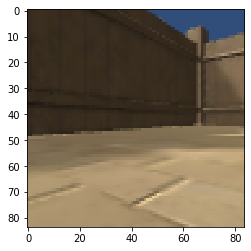

CylinderTunnel  prob =  0.9999999
Ramp  prob =  0.030626947
Wall  prob =  4.7001743e-07
BadGoal  prob =  1.008351e-37
Cardbox  prob =  5.044625e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


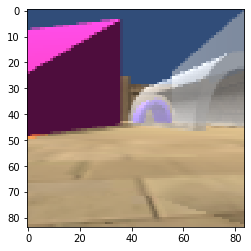

Wall  prob =  0.94132084
Ramp  prob =  0.87039095
CylinderTunnel  prob =  0.19546084
HotZone  prob =  1.3004086e-18
GoodGoal  prob =  2.5324256e-20
BadGoal  prob =  3.3875562e-21
ULObject  prob =  2.6580416e-28
Cardbox  prob =  5.86949e-30
GoodGoalMulti  prob =  3.048804e-31
DeathZone  prob =  6.452862e-32
WallTransparent  prob =  1.6270375e-34
CylinderTunnelTransparent  prob =  0.0


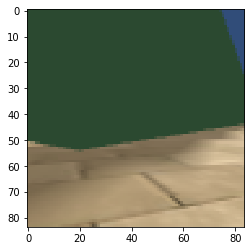

HotZone  prob =  1.0
Ramp  prob =  0.00020096585
Wall  prob =  1.7998533e-05
CylinderTunnel  prob =  6.373781e-13
BadGoal  prob =  1.7218854e-13
GoodGoal  prob =  2.720813e-15
DeathZone  prob =  5.650509e-17
WallTransparent  prob =  1.5385607e-22
ULObject  prob =  4.4628875e-23
Cardbox  prob =  2.3802209e-26
GoodGoalMulti  prob =  6.3326766e-36
CylinderTunnelTransparent  prob =  0.0


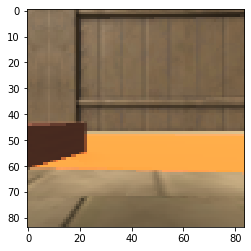

Wall  prob =  0.032155227
Ramp  prob =  0.030980326
WallTransparent  prob =  0.030259006
CylinderTunnel  prob =  0.021047445
CylinderTunnelTransparent  prob =  0.015727991
BadGoal  prob =  0.012194007
HotZone  prob =  0.012130622
DeathZone  prob =  0.010841758
ULObject  prob =  0.009364442
GoodGoal  prob =  0.009139117
GoodGoalMulti  prob =  0.0023914808
Cardbox  prob =  0.00094923924


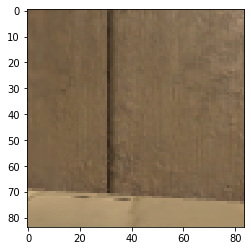

Ramp  prob =  0.8872526
Wall  prob =  0.80185634
CylinderTunnel  prob =  0.75892276
HotZone  prob =  0.0007458427
WallTransparent  prob =  4.5646292e-15
GoodGoalMulti  prob =  6.78554e-17
BadGoal  prob =  6.151847e-17
ULObject  prob =  5.017332e-18
DeathZone  prob =  3.679908e-21
GoodGoal  prob =  3.403462e-21
Cardbox  prob =  1.001512e-37
CylinderTunnelTransparent  prob =  0.0


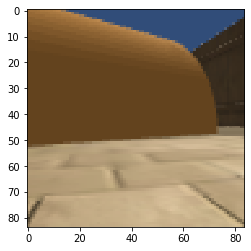

BadGoal  prob =  0.9999951
CylinderTunnel  prob =  0.00027308695
Ramp  prob =  8.354056e-05
Wall  prob =  6.7703135e-05
HotZone  prob =  3.80914e-09
WallTransparent  prob =  5.7163368e-11
DeathZone  prob =  9.301987e-12
GoodGoal  prob =  1.9815048e-12
ULObject  prob =  1.7565491e-14
Cardbox  prob =  6.836334e-17
CylinderTunnelTransparent  prob =  2.974428e-26
GoodGoalMulti  prob =  1.1895086e-26


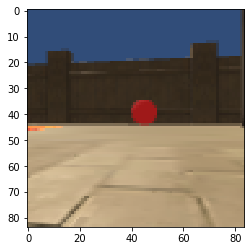

WallTransparent  prob =  0.12876411
Wall  prob =  0.12436588
Ramp  prob =  0.12346245
CylinderTunnelTransparent  prob =  0.106664196
CylinderTunnel  prob =  0.10585014
ULObject  prob =  0.092145085
DeathZone  prob =  0.0802339
HotZone  prob =  0.07568035
BadGoal  prob =  0.061478727
GoodGoal  prob =  0.06139095
GoodGoalMulti  prob =  0.040732846
Cardbox  prob =  0.040008444


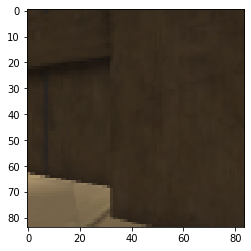

CylinderTunnel  prob =  0.97017485
Wall  prob =  0.6419587
Ramp  prob =  0.55847865
ULObject  prob =  2.5632409e-12
HotZone  prob =  1.2821968e-12
BadGoal  prob =  2.7508116e-19
WallTransparent  prob =  9.067429e-23
DeathZone  prob =  1.6745056e-23
GoodGoal  prob =  1.8400633e-27
GoodGoalMulti  prob =  6.2994766e-28
Cardbox  prob =  4.35584e-34
CylinderTunnelTransparent  prob =  2.8203842e-37


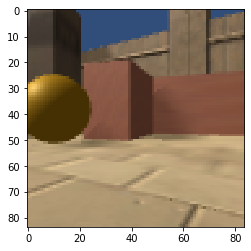

CylinderTunnel  prob =  0.9633946
Ramp  prob =  0.58147115
Wall  prob =  0.55153763
ULObject  prob =  4.1459406e-13
HotZone  prob =  4.0187956e-14
BadGoal  prob =  3.1102667e-15
Cardbox  prob =  2.4918476e-16
GoodGoal  prob =  4.941451e-17
DeathZone  prob =  1.9938751e-20
WallTransparent  prob =  1.7453485e-21
GoodGoalMulti  prob =  2.4938831e-23
CylinderTunnelTransparent  prob =  1.4498138e-34


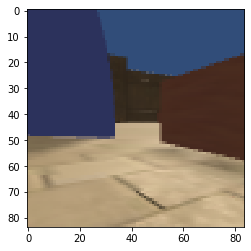

CylinderTunnel  prob =  0.91999114
Ramp  prob =  0.8534819
Wall  prob =  0.7986668
HotZone  prob =  9.442093e-16
GoodGoal  prob =  1.9741187e-23
BadGoal  prob =  9.687145e-26
Cardbox  prob =  1.7261226e-26
ULObject  prob =  8.287331e-28
DeathZone  prob =  1.6988878e-34
GoodGoalMulti  prob =  6.615385e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


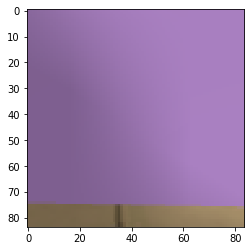

Ramp  prob =  0.9947708
HotZone  prob =  0.17380731
Wall  prob =  0.08099217
CylinderTunnel  prob =  8.043001e-08
BadGoal  prob =  2.210237e-20
ULObject  prob =  8.9752445e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


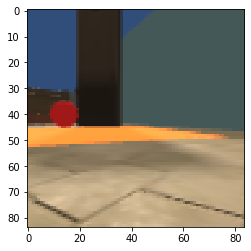

CylinderTunnel  prob =  0.8869059
Wall  prob =  0.88075614
Ramp  prob =  0.7599612
HotZone  prob =  2.1159417e-23
BadGoal  prob =  1.9123517e-24
Cardbox  prob =  1.4976354e-25
GoodGoalMulti  prob =  1.6359182e-27
GoodGoal  prob =  1.4795352e-29
WallTransparent  prob =  1.2182324e-34
ULObject  prob =  5.517099e-36
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


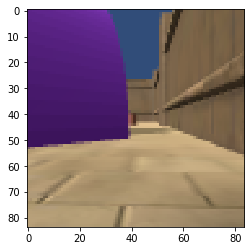

HotZone  prob =  1.0
Ramp  prob =  2.3185201e-05
Wall  prob =  4.628303e-06
CylinderTunnel  prob =  1.037512e-18
BadGoal  prob =  4.7230538e-23
WallTransparent  prob =  2.9077115e-25
Cardbox  prob =  1.736011e-30
DeathZone  prob =  1.7908292e-32
ULObject  prob =  3.1913643e-33
GoodGoal  prob =  1.7213344e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


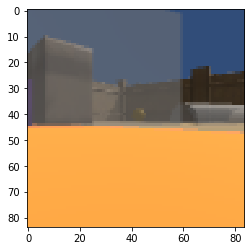

HotZone  prob =  0.43060425
Ramp  prob =  0.40841126
WallTransparent  prob =  0.36722577
Wall  prob =  0.35272324
DeathZone  prob =  0.33551323
ULObject  prob =  0.29985237
CylinderTunnel  prob =  0.29297346
CylinderTunnelTransparent  prob =  0.2217784
Cardbox  prob =  0.03452462
GoodGoalMulti  prob =  0.013609623
GoodGoal  prob =  0.011492424
BadGoal  prob =  0.009512093


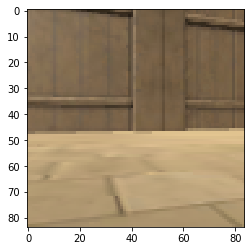

CylinderTunnel  prob =  0.00080545404
Ramp  prob =  0.00012659415
Wall  prob =  2.4853745e-07
GoodGoalMulti  prob =  1.54644e-14
GoodGoal  prob =  1.7591406e-18
BadGoal  prob =  8.5697044e-19
WallTransparent  prob =  1.7314816e-29
HotZone  prob =  3.900432e-31
Cardbox  prob =  8.159263e-33
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


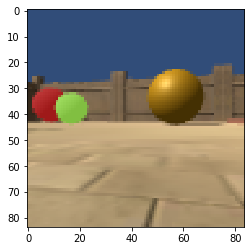

GoodGoal  prob =  0.9999876
Ramp  prob =  0.004051936
CylinderTunnel  prob =  0.0018530258
Wall  prob =  0.001081002
BadGoal  prob =  1.0048766e-13
HotZone  prob =  1.27811686e-23
DeathZone  prob =  2.1489995e-24
ULObject  prob =  2.5226302e-27
WallTransparent  prob =  5.748835e-29
Cardbox  prob =  1.0434071e-31
GoodGoalMulti  prob =  2.1107383e-34
CylinderTunnelTransparent  prob =  0.0


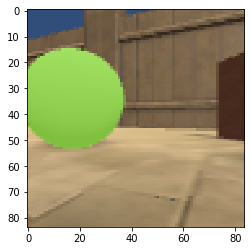

Ramp  prob =  0.9876766
Wall  prob =  0.9405492
CylinderTunnel  prob =  0.23735349
HotZone  prob =  5.7146295e-17
BadGoal  prob =  6.6147403e-24
GoodGoal  prob =  9.829266e-26
ULObject  prob =  8.9570256e-26
DeathZone  prob =  1.6181526e-30
WallTransparent  prob =  6.1938666e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


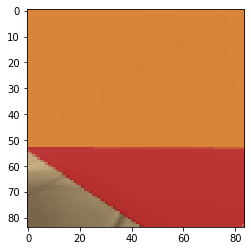

Ramp  prob =  0.47314334
Wall  prob =  0.46920475
WallTransparent  prob =  0.43853372
HotZone  prob =  0.43069488
DeathZone  prob =  0.4241536
CylinderTunnel  prob =  0.3810869
ULObject  prob =  0.3668271
CylinderTunnelTransparent  prob =  0.29672927
Cardbox  prob =  0.1704558
GoodGoalMulti  prob =  0.020903746
BadGoal  prob =  0.01493632
GoodGoal  prob =  0.013368003


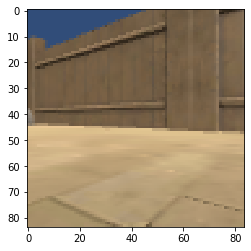

GoodGoal  prob =  0.20534228
Ramp  prob =  0.0870557
Wall  prob =  0.0044936845
CylinderTunnel  prob =  0.0027831076
BadGoal  prob =  7.920358e-20
HotZone  prob =  1.5814831e-29
Cardbox  prob =  5.8607835e-31
DeathZone  prob =  2.3338925e-31
ULObject  prob =  5.2663808e-36
GoodGoalMulti  prob =  3.02124e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


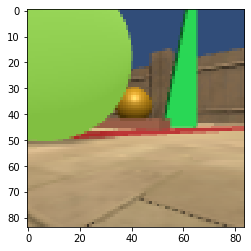

CylinderTunnelTransparent  prob =  0.99779105
CylinderTunnel  prob =  0.038814537
Ramp  prob =  0.028228926
Wall  prob =  0.010770668
WallTransparent  prob =  0.00060148555
Cardbox  prob =  1.6476394e-08
BadGoal  prob =  5.3281055e-09
ULObject  prob =  7.931113e-11
HotZone  prob =  3.1725494e-11
GoodGoalMulti  prob =  1.7709906e-11
GoodGoal  prob =  2.3760742e-12
DeathZone  prob =  1.2273746e-12


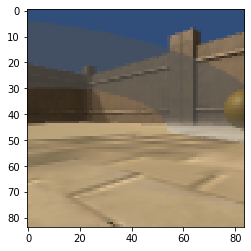

Cardbox  prob =  0.9908495
CylinderTunnelTransparent  prob =  0.52783257
WallTransparent  prob =  0.18251343
CylinderTunnel  prob =  0.13578688
Ramp  prob =  0.114784524
Wall  prob =  0.11258676
ULObject  prob =  0.00037155647
GoodGoalMulti  prob =  0.0003300822
DeathZone  prob =  0.0001714435
BadGoal  prob =  0.00014496974
HotZone  prob =  7.346772e-05
GoodGoal  prob =  6.706787e-05


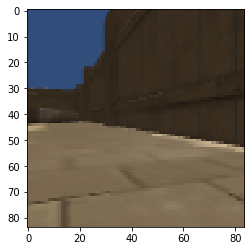

HotZone  prob =  0.4290198
WallTransparent  prob =  0.3735966
Ramp  prob =  0.3715891
DeathZone  prob =  0.35420436
Wall  prob =  0.33175096
ULObject  prob =  0.29928276
CylinderTunnel  prob =  0.2869521
CylinderTunnelTransparent  prob =  0.2383481
Cardbox  prob =  0.049496472
GoodGoalMulti  prob =  0.019630091
BadGoal  prob =  0.011288409
GoodGoal  prob =  0.010900359


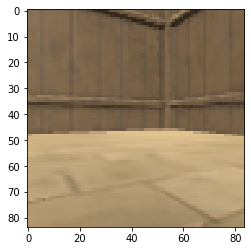

CylinderTunnelTransparent  prob =  0.9446336
Ramp  prob =  0.07295227
Wall  prob =  0.057322513
CylinderTunnel  prob =  0.0063776695
WallTransparent  prob =  0.0039356914
Cardbox  prob =  3.9014547e-05
ULObject  prob =  2.9473052e-10
BadGoal  prob =  2.6102265e-10
HotZone  prob =  1.3498707e-11
DeathZone  prob =  7.153075e-12
GoodGoal  prob =  3.5063489e-12
GoodGoalMulti  prob =  1.1207979e-14


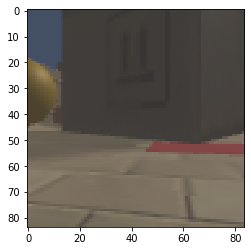

CylinderTunnel  prob =  0.047351547
Wall  prob =  0.0371455
BadGoal  prob =  0.031721517
Ramp  prob =  0.0287983
ULObject  prob =  0.021921564
GoodGoal  prob =  0.021913234
WallTransparent  prob =  0.02126321
CylinderTunnelTransparent  prob =  0.021216257
Cardbox  prob =  0.016935367
GoodGoalMulti  prob =  0.016931033
HotZone  prob =  0.011664384
DeathZone  prob =  0.0065422454


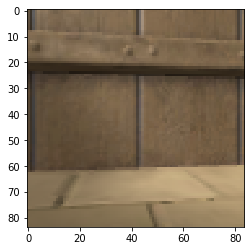

Wall  prob =  0.028901847
Ramp  prob =  0.026634032
CylinderTunnel  prob =  0.025313558
WallTransparent  prob =  0.017740179
HotZone  prob =  0.010862396
ULObject  prob =  0.009968321
GoodGoal  prob =  0.00869151
DeathZone  prob =  0.008605225
CylinderTunnelTransparent  prob =  0.008319433
BadGoal  prob =  0.006590561
GoodGoalMulti  prob =  0.0017178236
Cardbox  prob =  0.00084591337


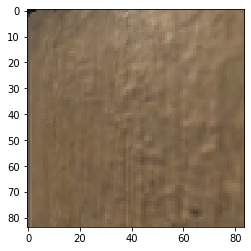

Wall  prob =  0.70024973
Ramp  prob =  0.6205244
CylinderTunnel  prob =  0.22987057
BadGoal  prob =  3.131598e-07
WallTransparent  prob =  5.232575e-15
GoodGoal  prob =  3.031767e-16
HotZone  prob =  1.0233039e-16
Cardbox  prob =  3.8175834e-17
GoodGoalMulti  prob =  1.7847118e-17
ULObject  prob =  3.6990385e-19
DeathZone  prob =  6.560517e-22
CylinderTunnelTransparent  prob =  1.8876738e-23


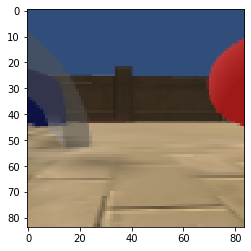

CylinderTunnel  prob =  0.99956053
Ramp  prob =  0.023445243
Wall  prob =  3.5625184e-05
BadGoal  prob =  2.8266566e-05
GoodGoal  prob =  3.707902e-16
HotZone  prob =  8.449586e-22
GoodGoalMulti  prob =  1.59151e-23
Cardbox  prob =  1.633772e-28
DeathZone  prob =  1.1020455e-30
WallTransparent  prob =  9.90689e-33
ULObject  prob =  2.8041234e-35
CylinderTunnelTransparent  prob =  0.0


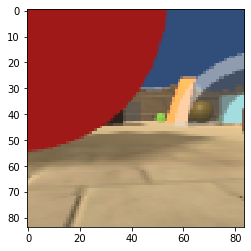

Ramp  prob =  0.7503501
CylinderTunnel  prob =  0.50475013
Wall  prob =  0.0019131674
ULObject  prob =  9.435195e-13
GoodGoal  prob =  1.1018154e-13
DeathZone  prob =  3.2371262e-16
BadGoal  prob =  2.8713333e-20
HotZone  prob =  4.4337257e-27
Cardbox  prob =  2.0526294e-27
GoodGoalMulti  prob =  5.147347e-37
WallTransparent  prob =  1.2413383e-38
CylinderTunnelTransparent  prob =  0.0


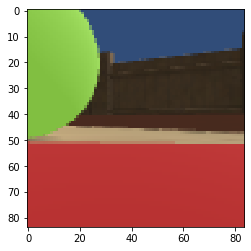

Ramp  prob =  0.37872285
WallTransparent  prob =  0.3366307
Wall  prob =  0.3165288
HotZone  prob =  0.31384763
ULObject  prob =  0.2888954
CylinderTunnel  prob =  0.27630994
DeathZone  prob =  0.25792697
CylinderTunnelTransparent  prob =  0.20185715
Cardbox  prob =  0.033705797
GoodGoalMulti  prob =  0.026682187
GoodGoal  prob =  0.016646171
BadGoal  prob =  0.008642421


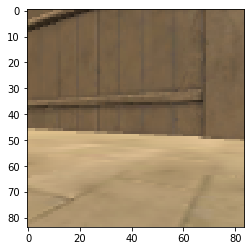

Ramp  prob =  0.96706945
Wall  prob =  0.38554347
CylinderTunnel  prob =  0.02060587
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


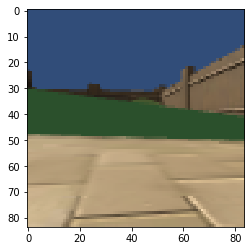

CylinderTunnel  prob =  0.99731356
Wall  prob =  0.11409379
Ramp  prob =  0.03675054
BadGoal  prob =  1.7983033e-11
Cardbox  prob =  1.830595e-15
HotZone  prob =  2.8202194e-17
GoodGoal  prob =  2.0418292e-19
WallTransparent  prob =  2.3683362e-20
ULObject  prob =  4.4036345e-21
GoodGoalMulti  prob =  2.5177802e-23
DeathZone  prob =  4.240537e-24
CylinderTunnelTransparent  prob =  7.071005e-35


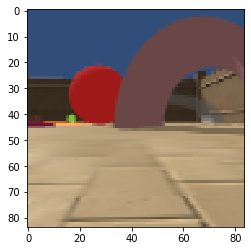

HotZone  prob =  0.40592495
DeathZone  prob =  0.37552005
WallTransparent  prob =  0.3720803
ULObject  prob =  0.37077218
Ramp  prob =  0.35486415
CylinderTunnelTransparent  prob =  0.33392406
Wall  prob =  0.31595948
CylinderTunnel  prob =  0.31261933
Cardbox  prob =  0.22970018
GoodGoalMulti  prob =  0.19028628
GoodGoal  prob =  0.12096663
BadGoal  prob =  0.06931029


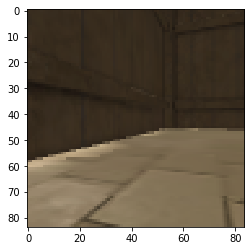

Ramp  prob =  0.9096086
Wall  prob =  0.8735307
CylinderTunnel  prob =  0.562591
CylinderTunnelTransparent  prob =  0.068807326
WallTransparent  prob =  0.005464696
BadGoal  prob =  7.1969875e-09
Cardbox  prob =  1.336392e-09
GoodGoal  prob =  1.300575e-10
DeathZone  prob =  2.66564e-11
ULObject  prob =  1.5385606e-11
HotZone  prob =  1.1507714e-11
GoodGoalMulti  prob =  3.7825835e-13


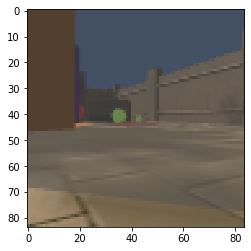

Ramp  prob =  0.23321027
WallTransparent  prob =  0.22021066
HotZone  prob =  0.21966097
ULObject  prob =  0.21536827
Wall  prob =  0.21240456
CylinderTunnel  prob =  0.18736024
DeathZone  prob =  0.17930387
CylinderTunnelTransparent  prob =  0.12399469
Cardbox  prob =  0.075799495
GoodGoalMulti  prob =  0.012782423
GoodGoal  prob =  0.011569186
BadGoal  prob =  0.010380934


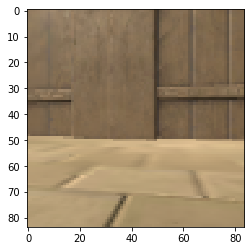

Ramp  prob =  0.78724515
CylinderTunnel  prob =  0.5687608
Wall  prob =  0.023023607
BadGoal  prob =  3.343111e-05
GoodGoal  prob =  5.8912692e-12
ULObject  prob =  2.9277368e-16
HotZone  prob =  2.6402618e-16
DeathZone  prob =  3.8214972e-20
WallTransparent  prob =  1.8828508e-20
Cardbox  prob =  6.3946995e-21
GoodGoalMulti  prob =  1.5608366e-28
CylinderTunnelTransparent  prob =  0.0


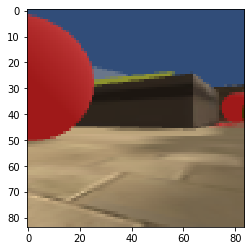

Ramp  prob =  0.40825784
WallTransparent  prob =  0.40583736
HotZone  prob =  0.39665443
DeathZone  prob =  0.38953543
ULObject  prob =  0.3854641
Wall  prob =  0.38393924
CylinderTunnelTransparent  prob =  0.36252224
CylinderTunnel  prob =  0.357807
Cardbox  prob =  0.20818971
GoodGoalMulti  prob =  0.15466356
BadGoal  prob =  0.11102484
GoodGoal  prob =  0.09122615


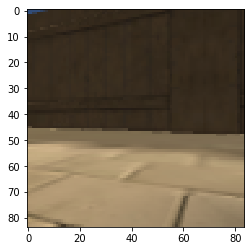

CylinderTunnel  prob =  0.998176
Wall  prob =  0.7184376
Ramp  prob =  0.4278249
BadGoal  prob =  4.9365387e-30
GoodGoal  prob =  1.6479415e-30
HotZone  prob =  4.433021e-32
ULObject  prob =  5.289782e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


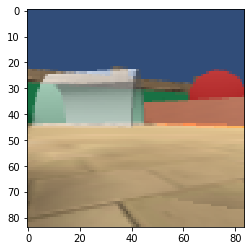

Ramp  prob =  0.07764249
Wall  prob =  0.07231368
CylinderTunnel  prob =  0.06739419
BadGoal  prob =  0.043230712
ULObject  prob =  0.039931957
CylinderTunnelTransparent  prob =  0.034464877
HotZone  prob =  0.02759731
WallTransparent  prob =  0.027381327
GoodGoal  prob =  0.021685682
DeathZone  prob =  0.01804706
Cardbox  prob =  0.014518458
GoodGoalMulti  prob =  0.009648062


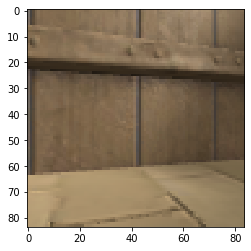

ULObject  prob =  0.50340223
Wall  prob =  0.4753417
Ramp  prob =  0.47395152
HotZone  prob =  0.4570135
WallTransparent  prob =  0.45270205
DeathZone  prob =  0.42936194
CylinderTunnelTransparent  prob =  0.42405096
CylinderTunnel  prob =  0.42136174
Cardbox  prob =  0.29086336
GoodGoalMulti  prob =  0.21502174
GoodGoal  prob =  0.11902215
BadGoal  prob =  0.09984584


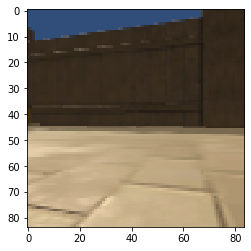

Ramp  prob =  0.8172076
Wall  prob =  0.81554747
CylinderTunnel  prob =  0.6129104
GoodGoal  prob =  3.7219237e-09
BadGoal  prob =  1.8505912e-15
HotZone  prob =  3.03179e-16
GoodGoalMulti  prob =  1.9400566e-20
Cardbox  prob =  7.766526e-24
ULObject  prob =  6.052108e-24
DeathZone  prob =  2.9982585e-27
WallTransparent  prob =  4.891219e-28
CylinderTunnelTransparent  prob =  0.0


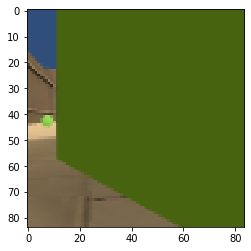

Ramp  prob =  0.8147295
CylinderTunnel  prob =  0.77362573
Wall  prob =  0.24361163
ULObject  prob =  5.011143e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


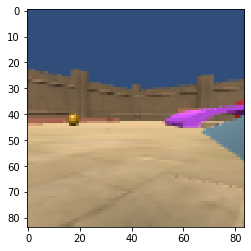

Cardbox
Ramp  prob =  0.90275425
Wall  prob =  0.5634468
ULObject  prob =  0.41333112
CylinderTunnel  prob =  0.06382223
DeathZone  prob =  1.1905603e-21
BadGoal  prob =  9.0788506e-23
HotZone  prob =  8.66108e-24
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


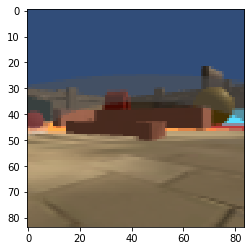

ULObject  prob =  0.999874
Ramp  prob =  0.00911213
Wall  prob =  0.004603638
CylinderTunnel  prob =  0.0043681
BadGoal  prob =  0.00010584155
DeathZone  prob =  9.2982503e-07
HotZone  prob =  3.6720775e-09
GoodGoal  prob =  4.5581677e-10
WallTransparent  prob =  7.985956e-11
Cardbox  prob =  8.1140484e-16
CylinderTunnelTransparent  prob =  3.6580676e-17
GoodGoalMulti  prob =  4.0102016e-19


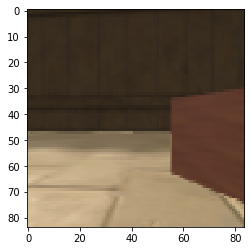

Wall  prob =  0.9441409
Ramp  prob =  0.762093
CylinderTunnel  prob =  0.5269029
HotZone  prob =  3.8165915e-18
BadGoal  prob =  1.6107609e-24
GoodGoal  prob =  1.0793242e-24
Cardbox  prob =  1.0959854e-26
ULObject  prob =  2.1674109e-29
GoodGoalMulti  prob =  1.0424602e-31
DeathZone  prob =  5.1436672e-33
WallTransparent  prob =  3.4571398e-35
CylinderTunnelTransparent  prob =  0.0


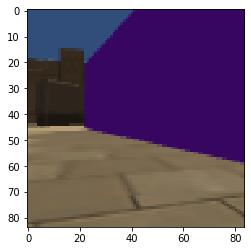

HotZone  prob =  0.45798716
WallTransparent  prob =  0.44093072
ULObject  prob =  0.43500128
DeathZone  prob =  0.42924413
Ramp  prob =  0.42808658
Wall  prob =  0.40545633
CylinderTunnel  prob =  0.38872465
CylinderTunnelTransparent  prob =  0.36501944
Cardbox  prob =  0.26123416
GoodGoalMulti  prob =  0.13821478
GoodGoal  prob =  0.09771481
BadGoal  prob =  0.0749008


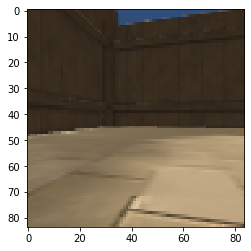

Ramp  prob =  0.90636915
CylinderTunnel  prob =  0.89785933
Wall  prob =  0.5931342
WallTransparent  prob =  1.3491391e-27
Cardbox  prob =  5.4316045e-29
BadGoal  prob =  3.2711923e-29
HotZone  prob =  2.1431925e-34
CylinderTunnelTransparent  prob =  7.722662e-37
GoodGoal  prob =  2.718727e-38
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


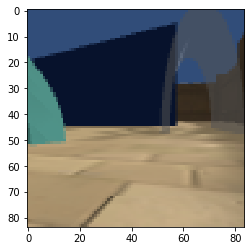

Ramp  prob =  0.9988895
Wall  prob =  0.017324505
CylinderTunnel  prob =  2.3924379e-06
ULObject  prob =  1.7350872e-19
DeathZone  prob =  7.7031337e-20
BadGoal  prob =  3.4430078e-26
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


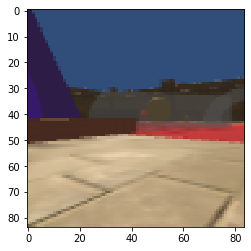

Ramp  prob =  0.9834192
Wall  prob =  0.8982554
CylinderTunnel  prob =  0.009910853
GoodGoal  prob =  1.4191404e-16
HotZone  prob =  2.2456073e-21
BadGoal  prob =  1.8371021e-21
ULObject  prob =  3.0136714e-26
WallTransparent  prob =  5.096723e-29
GoodGoalMulti  prob =  6.861292e-30
DeathZone  prob =  4.0699555e-32
Cardbox  prob =  2.7651846e-33
CylinderTunnelTransparent  prob =  0.0


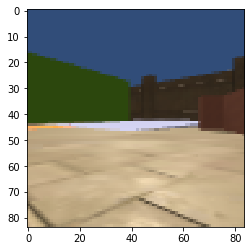

Ramp  prob =  0.95615226
CylinderTunnel  prob =  0.352061
Wall  prob =  0.08199027
GoodGoal  prob =  1.4596048e-16
HotZone  prob =  1.5810705e-17
WallTransparent  prob =  4.620844e-25
BadGoal  prob =  3.366474e-25
GoodGoalMulti  prob =  9.480081e-27
ULObject  prob =  3.953327e-30
DeathZone  prob =  5.35492e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


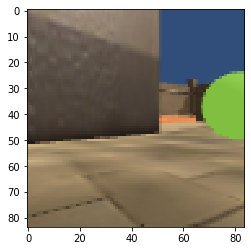

ULObject  prob =  0.9881749
Ramp  prob =  0.96193105
Wall  prob =  0.036153905
CylinderTunnel  prob =  0.00015877574
DeathZone  prob =  6.050991e-07
BadGoal  prob =  2.703637e-16
WallTransparent  prob =  1.7886712e-25
GoodGoal  prob =  1.9262156e-27
HotZone  prob =  8.908153e-28
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


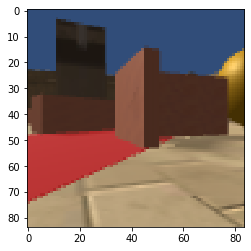

Ramp  prob =  0.0822967
Wall  prob =  0.0797256
ULObject  prob =  0.07823085
DeathZone  prob =  0.07566612
CylinderTunnel  prob =  0.054241177
WallTransparent  prob =  0.0498252
HotZone  prob =  0.048572853
Cardbox  prob =  0.038240414
BadGoal  prob =  0.030534685
GoodGoal  prob =  0.02846385
CylinderTunnelTransparent  prob =  0.022524407
GoodGoalMulti  prob =  0.0140636675


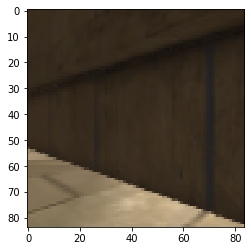

DeathZone  prob =  1.0
Ramp  prob =  0.0011242892
Wall  prob =  7.303882e-05
BadGoal  prob =  1.2683869e-10
CylinderTunnel  prob =  1.3426982e-12
ULObject  prob =  3.5129815e-13
GoodGoal  prob =  3.0226025e-13
WallTransparent  prob =  1.5734677e-14
CylinderTunnelTransparent  prob =  2.2670724e-22
Cardbox  prob =  2.1759936e-29
HotZone  prob =  2.0427517e-31
GoodGoalMulti  prob =  0.0


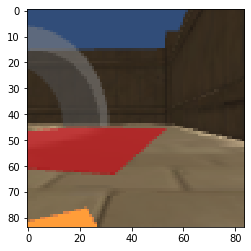

Ramp  prob =  0.95072556
CylinderTunnel  prob =  0.64010245
Wall  prob =  0.298902
BadGoal  prob =  3.3779352e-14
GoodGoal  prob =  2.4340174e-27
HotZone  prob =  5.26144e-29
ULObject  prob =  2.6023148e-31
Cardbox  prob =  1.9581187e-33
DeathZone  prob =  4.4233353e-35
WallTransparent  prob =  2.1752473e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


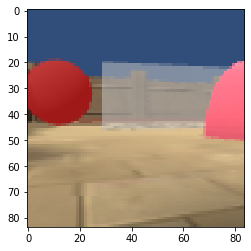

Ramp  prob =  0.89972186
ULObject  prob =  0.6244358
Wall  prob =  0.14188181
CylinderTunnel  prob =  1.9020908e-06
BadGoal  prob =  1.5984462e-08
DeathZone  prob =  7.2227304e-13
GoodGoal  prob =  8.706602e-15
WallTransparent  prob =  2.0697935e-20
HotZone  prob =  4.0405183e-24
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


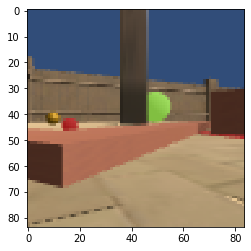

DeathZone  prob =  0.9999999
Ramp  prob =  2.2393628e-05
Wall  prob =  1.5998147e-06
ULObject  prob =  2.1018824e-09
CylinderTunnel  prob =  1.2822023e-11
CylinderTunnelTransparent  prob =  8.299745e-14
WallTransparent  prob =  8.129082e-14
BadGoal  prob =  7.063328e-18
GoodGoal  prob =  4.284452e-18
HotZone  prob =  4.464957e-19
Cardbox  prob =  1.30920735e-20
GoodGoalMulti  prob =  1.3748331e-38


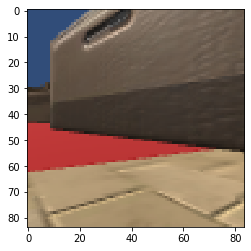

Ramp  prob =  0.58465457
Wall  prob =  0.0005580793
HotZone  prob =  2.1891289e-09
ULObject  prob =  9.42679e-10
CylinderTunnel  prob =  2.0666922e-13
BadGoal  prob =  7.0086947e-22
DeathZone  prob =  2.789762e-28
WallTransparent  prob =  7.0293884e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


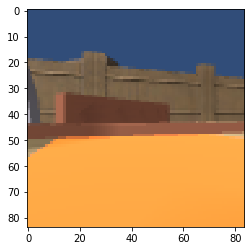

CylinderTunnel  prob =  0.9856871
Wall  prob =  0.7072715
Ramp  prob =  0.5919975
HotZone  prob =  1.5594796e-28
GoodGoal  prob =  4.1863323e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


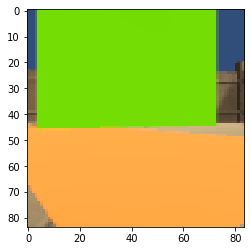

CylinderTunnel  prob =  1.0
Ramp  prob =  0.9994369
Wall  prob =  0.001629928
ULObject  prob =  7.803329e-22
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


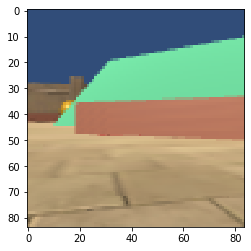

Ramp  prob =  0.0669541
HotZone  prob =  0.03929718
Wall  prob =  0.0010844268
CylinderTunnel  prob =  7.239443e-10
ULObject  prob =  6.7274783e-15
GoodGoal  prob =  4.655473e-16
WallTransparent  prob =  1.7236423e-18
BadGoal  prob =  7.532219e-19
DeathZone  prob =  1.3580327e-24
Cardbox  prob =  3.6053672e-25
GoodGoalMulti  prob =  4.9211912e-32
CylinderTunnelTransparent  prob =  3.5864976e-37


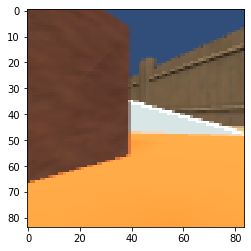

ULObject  prob =  0.40020213
WallTransparent  prob =  0.3612623
HotZone  prob =  0.3358258
CylinderTunnel  prob =  0.3312666
CylinderTunnelTransparent  prob =  0.32863212
Ramp  prob =  0.32744676
Wall  prob =  0.30237925
DeathZone  prob =  0.29903343
GoodGoalMulti  prob =  0.24992584
Cardbox  prob =  0.1872305
BadGoal  prob =  0.0854138
GoodGoal  prob =  0.07455887


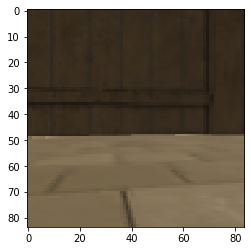

ULObject  prob =  0.32385388
HotZone  prob =  0.3052893
DeathZone  prob =  0.3049604
CylinderTunnelTransparent  prob =  0.26237392
WallTransparent  prob =  0.25591382
Ramp  prob =  0.24152552
Cardbox  prob =  0.23629221
CylinderTunnel  prob =  0.22447346
Wall  prob =  0.22385159
GoodGoalMulti  prob =  0.17084679
BadGoal  prob =  0.1324244
GoodGoal  prob =  0.121540405


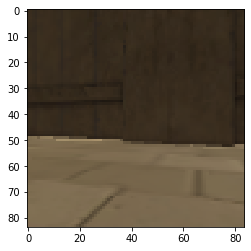

Ramp  prob =  0.43700755
Wall  prob =  0.3993572
HotZone  prob =  0.3965772
WallTransparent  prob =  0.37902278
ULObject  prob =  0.34743765
CylinderTunnel  prob =  0.3298307
DeathZone  prob =  0.31922948
CylinderTunnelTransparent  prob =  0.24378872
Cardbox  prob =  0.08021969
GoodGoalMulti  prob =  0.03195769
GoodGoal  prob =  0.018574316
BadGoal  prob =  0.010587618


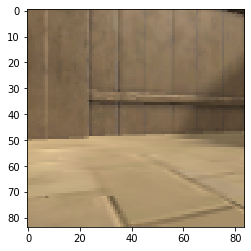

ULObject  prob =  0.78604853
Wall  prob =  0.5251667
Ramp  prob =  0.41596165
CylinderTunnel  prob =  0.24937393
BadGoal  prob =  0.17282785
DeathZone  prob =  0.021506129
HotZone  prob =  0.004876572
WallTransparent  prob =  0.001265067
CylinderTunnelTransparent  prob =  0.00013153905
GoodGoal  prob =  1.6728967e-05
Cardbox  prob =  5.7765787e-06
GoodGoalMulti  prob =  1.1464462e-06


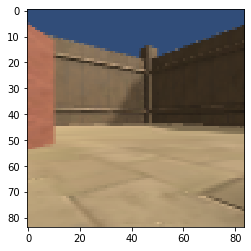

Cardbox  prob =  0.99972516
Ramp  prob =  0.011767252
Wall  prob =  0.007591486
CylinderTunnel  prob =  0.0032566045
ULObject  prob =  1.258359e-08
GoodGoal  prob =  5.137962e-10
BadGoal  prob =  1.7987194e-10
HotZone  prob =  8.246816e-11
WallTransparent  prob =  2.8139522e-11
DeathZone  prob =  2.477759e-11
GoodGoalMulti  prob =  5.488908e-13
CylinderTunnelTransparent  prob =  5.4203417e-15


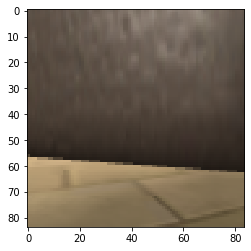

CylinderTunnel  prob =  0.9726467
Ramp  prob =  0.37302384
Wall  prob =  0.19411495
HotZone  prob =  1.945098e-25
BadGoal  prob =  2.064551e-26
WallTransparent  prob =  4.719566e-28
GoodGoal  prob =  2.6877534e-28
Cardbox  prob =  1.3899005e-28
GoodGoalMulti  prob =  9.9395397e-29
ULObject  prob =  3.208943e-33
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


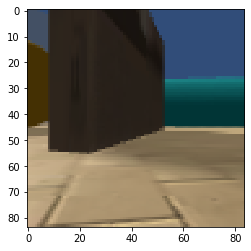

Ramp  prob =  0.9722391
CylinderTunnel  prob =  0.6858087
Wall  prob =  0.023128727
GoodGoal  prob =  4.9425726e-21
HotZone  prob =  4.965278e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


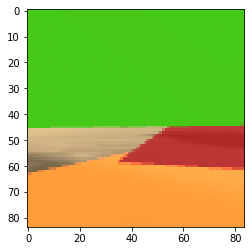

CylinderTunnel  prob =  0.96833783
Ramp  prob =  0.4921374
Wall  prob =  0.035357118
BadGoal  prob =  6.1956046e-17
HotZone  prob =  4.6314368e-23
GoodGoal  prob =  1.0404576e-24
WallTransparent  prob =  2.7930749e-27
ULObject  prob =  2.6526832e-28
Cardbox  prob =  2.4159646e-31
GoodGoalMulti  prob =  1.8820864e-31
DeathZone  prob =  6.769548e-36
CylinderTunnelTransparent  prob =  0.0


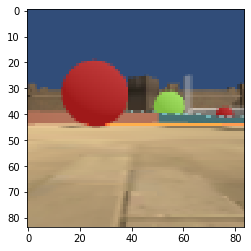

CylinderTunnel  prob =  0.9958079
Ramp  prob =  0.24570021
Wall  prob =  0.08195419
GoodGoal  prob =  7.6026044e-17
Cardbox  prob =  7.70958e-18
BadGoal  prob =  6.946884e-23
HotZone  prob =  9.685529e-24
GoodGoalMulti  prob =  3.0644947e-26
DeathZone  prob =  3.0236767e-27
WallTransparent  prob =  6.9892094e-28
ULObject  prob =  3.0556534e-29
CylinderTunnelTransparent  prob =  0.0


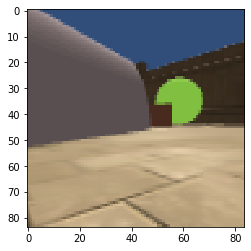

Ramp  prob =  0.98778594
CylinderTunnel  prob =  0.16807713
Wall  prob =  0.10319268
GoodGoal  prob =  3.927441e-16
HotZone  prob =  1.6189997e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


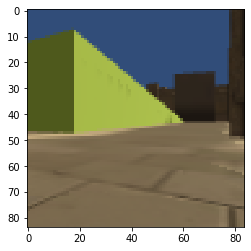

Ramp  prob =  0.9710543
Wall  prob =  0.05102346
HotZone  prob =  1.4504004e-05
CylinderTunnel  prob =  3.7210736e-08
ULObject  prob =  1.1204622e-18
BadGoal  prob =  1.1320766e-23
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


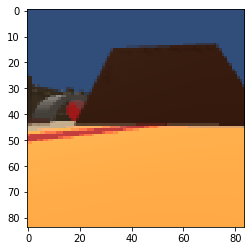

Ramp  prob =  0.9978206
Wall  prob =  0.22981596
CylinderTunnel  prob =  5.7814395e-06
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


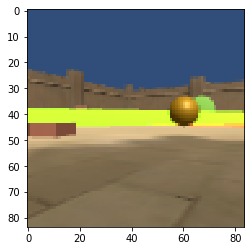

Ramp  prob =  0.98964334
Wall  prob =  0.16941382
CylinderTunnel  prob =  0.06587651
ULObject  prob =  1.2902595e-25
BadGoal  prob =  6.089941e-27
HotZone  prob =  6.905203e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


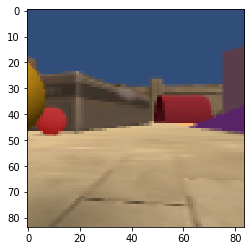

ULObject  prob =  0.23409584
HotZone  prob =  0.17169918
GoodGoalMulti  prob =  0.1676517
DeathZone  prob =  0.14589567
CylinderTunnelTransparent  prob =  0.1440343
Ramp  prob =  0.14389533
WallTransparent  prob =  0.13181534
CylinderTunnel  prob =  0.13032979
Cardbox  prob =  0.11691202
Wall  prob =  0.116128534
BadGoal  prob =  0.09559728
GoodGoal  prob =  0.06237457


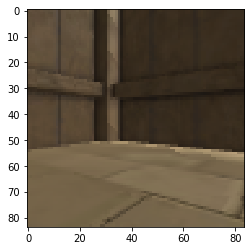

Ramp  prob =  0.28610817
HotZone  prob =  0.28331727
ULObject  prob =  0.27262464
Wall  prob =  0.26645213
WallTransparent  prob =  0.23676787
DeathZone  prob =  0.2358358
CylinderTunnel  prob =  0.21895514
CylinderTunnelTransparent  prob =  0.1433622
Cardbox  prob =  0.05232952
GoodGoalMulti  prob =  0.018481232
BadGoal  prob =  0.01657864
GoodGoal  prob =  0.012431358


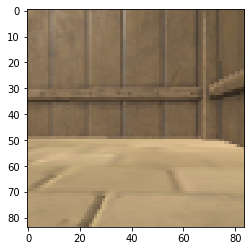

Wall  prob =  0.037409477
Ramp  prob =  0.037132163
WallTransparent  prob =  0.036072716
CylinderTunnel  prob =  0.029908558
CylinderTunnelTransparent  prob =  0.021976389
HotZone  prob =  0.015134098
BadGoal  prob =  0.012768393
DeathZone  prob =  0.012058362
ULObject  prob =  0.011724482
GoodGoal  prob =  0.008024746
GoodGoalMulti  prob =  0.002415288
Cardbox  prob =  0.0015785701


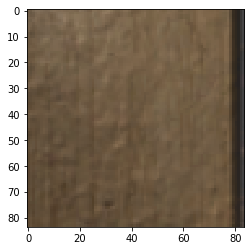

Ramp  prob =  0.45463437
Wall  prob =  0.4277841
HotZone  prob =  0.41811347
DeathZone  prob =  0.4029473
WallTransparent  prob =  0.39941826
ULObject  prob =  0.37530047
CylinderTunnel  prob =  0.36025494
CylinderTunnelTransparent  prob =  0.24865691
Cardbox  prob =  0.07585672
GoodGoalMulti  prob =  0.018882522
BadGoal  prob =  0.0127635
GoodGoal  prob =  0.011936699


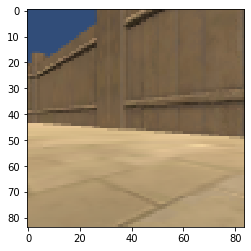

CylinderTunnel  prob =  0.99456596
Ramp  prob =  0.56808865
Wall  prob =  0.29937962
BadGoal  prob =  4.581208e-27
ULObject  prob =  2.8939272e-30
HotZone  prob =  8.053173e-32
GoodGoal  prob =  1.3019268e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


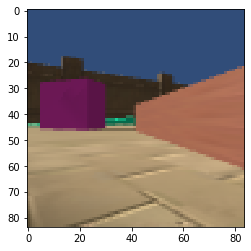

Ramp  prob =  0.91103923
CylinderTunnel  prob =  0.6437331
Wall  prob =  0.2193567
BadGoal  prob =  2.1937915e-11
GoodGoal  prob =  3.312717e-12
HotZone  prob =  1.0868778e-15
ULObject  prob =  4.9233645e-19
DeathZone  prob =  2.2213741e-23
WallTransparent  prob =  1.542484e-25
GoodGoalMulti  prob =  6.0271978e-33
Cardbox  prob =  4.644552e-36
CylinderTunnelTransparent  prob =  0.0


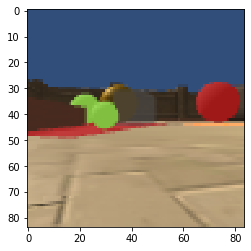

Ramp  prob =  0.83696926
Wall  prob =  0.514273
CylinderTunnel  prob =  0.025966076
GoodGoalMulti  prob =  3.0819965e-08
HotZone  prob =  2.3090085e-31
WallTransparent  prob =  1.2821377e-35
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0


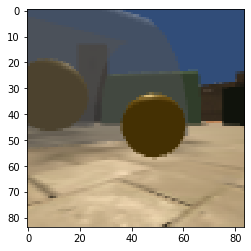

HotZone  prob =  0.0013089055
Cardbox  prob =  0.0005554675
Ramp  prob =  6.89803e-07
Wall  prob =  4.1924068e-08
CylinderTunnel  prob =  3.55512e-11
ULObject  prob =  2.1560936e-17
BadGoal  prob =  1.1472426e-19
WallTransparent  prob =  1.8197775e-20
DeathZone  prob =  2.7949643e-25
GoodGoal  prob =  2.5393068e-25
GoodGoalMulti  prob =  6.648634e-33
CylinderTunnelTransparent  prob =  5.6076587e-36


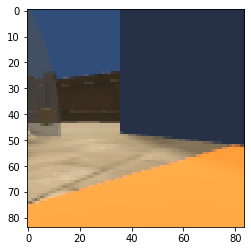

Ramp  prob =  0.9835195
CylinderTunnel  prob =  0.5925394
Wall  prob =  0.31088874
ULObject  prob =  6.8194695e-28
HotZone  prob =  6.094117e-29
BadGoal  prob =  2.0829418e-35
GoodGoal  prob =  1.4036785e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


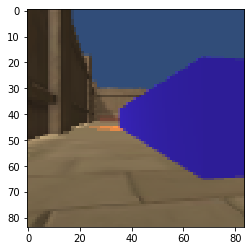

ULObject  prob =  0.18599656
WallTransparent  prob =  0.13834523
HotZone  prob =  0.13415381
Wall  prob =  0.12668888
Ramp  prob =  0.12475319
DeathZone  prob =  0.12278977
CylinderTunnel  prob =  0.121317774
CylinderTunnelTransparent  prob =  0.10962472
Cardbox  prob =  0.107027456
GoodGoalMulti  prob =  0.08721062
BadGoal  prob =  0.08482783
GoodGoal  prob =  0.06287097


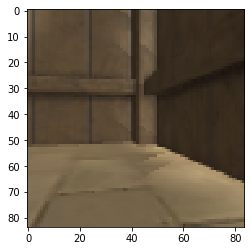

Wall  prob =  0.12968118
Ramp  prob =  0.1161664
WallTransparent  prob =  0.11379847
CylinderTunnel  prob =  0.09625088
CylinderTunnelTransparent  prob =  0.09230834
DeathZone  prob =  0.089635484
BadGoal  prob =  0.08544629
ULObject  prob =  0.08422407
HotZone  prob =  0.07853476
GoodGoal  prob =  0.060223173
GoodGoalMulti  prob =  0.042137258
Cardbox  prob =  0.024190113


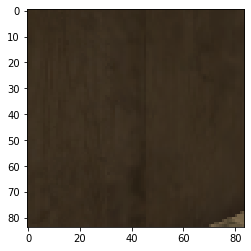

CylinderTunnel  prob =  0.9744042
Ramp  prob =  0.68522525
Wall  prob =  0.42388967
BadGoal  prob =  2.108019e-11
Cardbox  prob =  1.6273299e-11
ULObject  prob =  5.8122723e-15
GoodGoal  prob =  6.021941e-16
WallTransparent  prob =  7.0728495e-17
CylinderTunnelTransparent  prob =  1.9339931e-17
DeathZone  prob =  1.2055529e-17
HotZone  prob =  6.95958e-18
GoodGoalMulti  prob =  1.5845935e-21


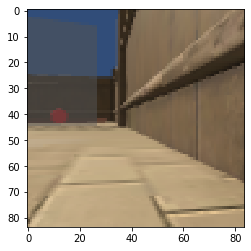

Ramp  prob =  0.9018075
Wall  prob =  0.85024816
CylinderTunnel  prob =  0.6941287
GoodGoalMulti  prob =  6.141187e-06
WallTransparent  prob =  2.6049724e-19
GoodGoal  prob =  8.955541e-22
HotZone  prob =  3.2885332e-29
BadGoal  prob =  4.4590766e-30
DeathZone  prob =  8.725247e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0


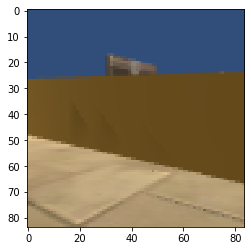

ULObject  prob =  0.99999905
Ramp  prob =  0.04125414
Wall  prob =  0.012046763
CylinderTunnel  prob =  0.00069542456
DeathZone  prob =  2.6360612e-19
HotZone  prob =  2.5489395e-21
BadGoal  prob =  3.5367045e-22
WallTransparent  prob =  3.7505995e-28
GoodGoal  prob =  1.8389088e-31
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


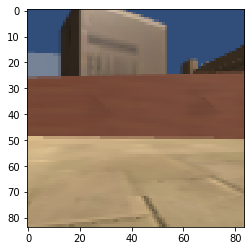

ULObject  prob =  0.4121189
DeathZone  prob =  0.40479738
WallTransparent  prob =  0.39438593
CylinderTunnelTransparent  prob =  0.3835922
HotZone  prob =  0.37865862
Ramp  prob =  0.36560568
Wall  prob =  0.35792696
CylinderTunnel  prob =  0.35331365
Cardbox  prob =  0.30750743
GoodGoalMulti  prob =  0.1755971
BadGoal  prob =  0.08202697
GoodGoal  prob =  0.076922484


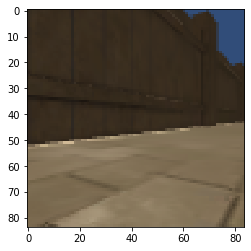

ULObject  prob =  0.99999905
Wall  prob =  0.0048626964
Ramp  prob =  0.0033101768
CylinderTunnel  prob =  3.687594e-05
BadGoal  prob =  2.7509594e-11
DeathZone  prob =  1.1000737e-11
HotZone  prob =  1.2240611e-17
GoodGoal  prob =  1.400332e-20
WallTransparent  prob =  3.2213624e-21
Cardbox  prob =  5.8641515e-34
CylinderTunnelTransparent  prob =  2.322565e-34
GoodGoalMulti  prob =  1.7525604e-36


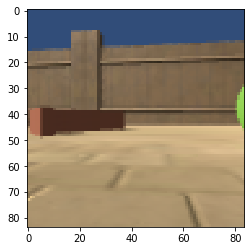

Ramp  prob =  0.9979818
Wall  prob =  0.9818205
CylinderTunnel  prob =  0.15345584
ULObject  prob =  1.8197805e-13
DeathZone  prob =  5.667321e-26
HotZone  prob =  2.7275617e-27
BadGoal  prob =  8.377617e-32
GoodGoal  prob =  8.370609e-35
WallTransparent  prob =  4.3502e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


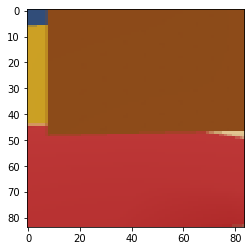

Ramp  prob =  0.042713072
Wall  prob =  0.009203163
CylinderTunnel  prob =  0.00036731857
ULObject  prob =  3.9298698e-06
Cardbox  prob =  4.6064082e-07
DeathZone  prob =  1.1795833e-07
HotZone  prob =  9.148717e-11
BadGoal  prob =  1.47643e-12
WallTransparent  prob =  1.2950449e-14
GoodGoal  prob =  1.3348696e-15
CylinderTunnelTransparent  prob =  1.3726913e-21
GoodGoalMulti  prob =  7.163498e-29


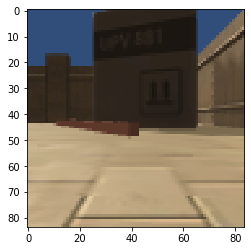

GoodGoalMulti  prob =  0.99983084
Ramp  prob =  0.002572661
Wall  prob =  0.00200234
CylinderTunnel  prob =  0.001871865
WallTransparent  prob =  0.0005576509
BadGoal  prob =  0.00010665878
HotZone  prob =  9.083184e-05
CylinderTunnelTransparent  prob =  9.946593e-06
GoodGoal  prob =  7.316859e-06
ULObject  prob =  1.5272194e-06
Cardbox  prob =  7.3771747e-07
DeathZone  prob =  1.3547664e-07


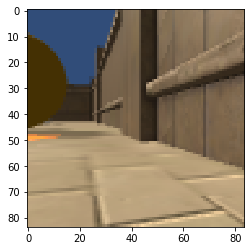

WallTransparent  prob =  0.84158045
Wall  prob =  0.43368825
Ramp  prob =  0.25155458
CylinderTunnel  prob =  0.00047254306
CylinderTunnelTransparent  prob =  2.0194469e-07
DeathZone  prob =  3.8940677e-09
ULObject  prob =  1.1930044e-09
Cardbox  prob =  6.4838274e-10
GoodGoal  prob =  3.7368525e-10
HotZone  prob =  1.0801634e-11
BadGoal  prob =  1.9075037e-12
GoodGoalMulti  prob =  1.1716817e-14


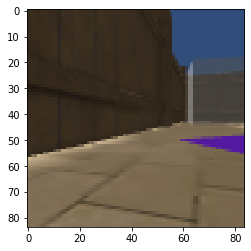

Wall  prob =  0.9130392
Ramp  prob =  0.8479314
CylinderTunnel  prob =  0.1220082
HotZone  prob =  1.563965e-10
GoodGoal  prob =  7.183861e-13
ULObject  prob =  7.1721043e-16
BadGoal  prob =  1.1844105e-18
DeathZone  prob =  3.3058614e-24
WallTransparent  prob =  1.0055226e-32
GoodGoalMulti  prob =  3.1509541e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


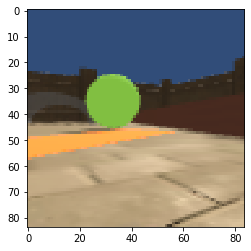

Ramp  prob =  0.99775165
Wall  prob =  0.18141313
CylinderTunnel  prob =  0.042760406
ULObject  prob =  4.4978214e-23
Cardbox  prob =  4.6909575e-27
HotZone  prob =  1.0120556e-27
BadGoal  prob =  3.4765002e-28
GoodGoal  prob =  2.5042642e-31
DeathZone  prob =  2.2475379e-34
WallTransparent  prob =  1.0941001e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


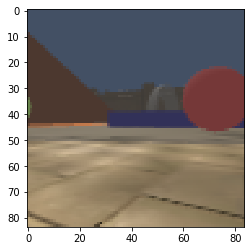

BadGoal  prob =  0.45018157
CylinderTunnel  prob =  0.06651419
Ramp  prob =  0.0027689515
Wall  prob =  0.0010365394
ULObject  prob =  1.8978813e-10
DeathZone  prob =  7.954408e-12
GoodGoal  prob =  5.6431536e-13
WallTransparent  prob =  1.977596e-13
Cardbox  prob =  7.410643e-17
HotZone  prob =  1.8550564e-17
GoodGoalMulti  prob =  1.0260611e-28
CylinderTunnelTransparent  prob =  4.64448e-29


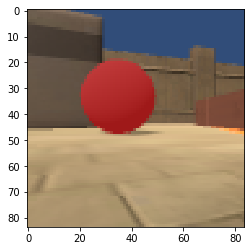

Cardbox  prob =  0.57657623
ULObject  prob =  0.51975936
HotZone  prob =  0.4878221
DeathZone  prob =  0.47497475
Ramp  prob =  0.4522317
Wall  prob =  0.39813986
WallTransparent  prob =  0.37373036
CylinderTunnelTransparent  prob =  0.3309698
CylinderTunnel  prob =  0.329877
GoodGoal  prob =  0.08702612
GoodGoalMulti  prob =  0.07970173
BadGoal  prob =  0.07223543


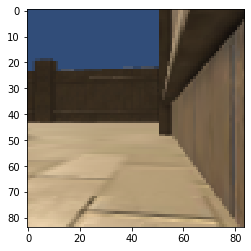

CylinderTunnel  prob =  0.991334
Ramp  prob =  0.5379144
Wall  prob =  0.027799455
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


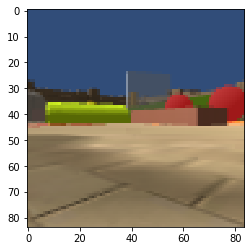

Ramp  prob =  0.6934622
Wall  prob =  0.35607317
CylinderTunnel  prob =  0.04669955
Cardbox  prob =  1.1412337e-09
HotZone  prob =  2.2863264e-15
GoodGoal  prob =  6.096181e-16
BadGoal  prob =  5.8545686e-17
DeathZone  prob =  2.920543e-23
ULObject  prob =  4.401543e-25
GoodGoalMulti  prob =  3.0937356e-30
WallTransparent  prob =  4.767874e-31
CylinderTunnelTransparent  prob =  0.0


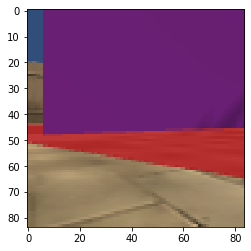

Ramp  prob =  0.42764503
HotZone  prob =  0.40318215
WallTransparent  prob =  0.38435712
Wall  prob =  0.3644179
DeathZone  prob =  0.32293946
CylinderTunnel  prob =  0.3028487
ULObject  prob =  0.29440463
CylinderTunnelTransparent  prob =  0.22256744
Cardbox  prob =  0.044292364
GoodGoalMulti  prob =  0.014582648
GoodGoal  prob =  0.013102303
BadGoal  prob =  0.009524231


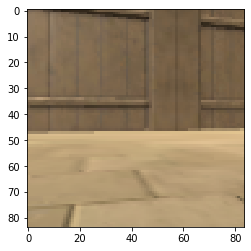

GoodGoalMulti  prob =  1.0
BadGoal  prob =  8.4645016e-08
CylinderTunnel  prob =  7.821742e-08
CylinderTunnelTransparent  prob =  1.4883982e-09
Cardbox  prob =  5.2765653e-10
GoodGoal  prob =  9.667301e-15
Ramp  prob =  3.6269604e-15
HotZone  prob =  2.7624792e-15
WallTransparent  prob =  5.2550706e-18
Wall  prob =  3.932534e-18
DeathZone  prob =  9.281753e-22
ULObject  prob =  2.8185522e-32


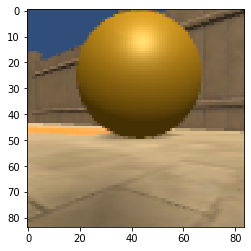

CylinderTunnel  prob =  0.35412753
Ramp  prob =  0.284126
Wall  prob =  0.2823523
ULObject  prob =  0.19602838
HotZone  prob =  0.08269268
WallTransparent  prob =  0.06377945
DeathZone  prob =  0.04502846
Cardbox  prob =  0.041541312
CylinderTunnelTransparent  prob =  0.04149856
GoodGoal  prob =  0.017714098
BadGoal  prob =  0.013833874
GoodGoalMulti  prob =  0.0052977093


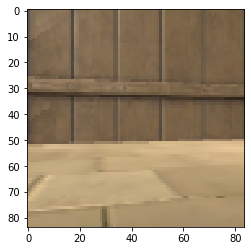

Ramp  prob =  0.41965675
Wall  prob =  0.023917122
DeathZone  prob =  0.0006216526
BadGoal  prob =  0.00043104205
CylinderTunnel  prob =  0.0003712088
GoodGoal  prob =  1.4045006e-07
WallTransparent  prob =  1.7538686e-09
Cardbox  prob =  1.2894427e-10
ULObject  prob =  1.2508025e-15
HotZone  prob =  4.8625093e-22
CylinderTunnelTransparent  prob =  5.294268e-25
GoodGoalMulti  prob =  4.52904e-29


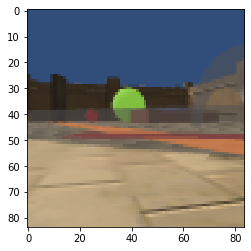

ULObject  prob =  0.53240067
DeathZone  prob =  0.4881419
Wall  prob =  0.28626716
Ramp  prob =  0.2747635
HotZone  prob =  0.26786363
BadGoal  prob =  0.1860096
CylinderTunnel  prob =  0.18095154
WallTransparent  prob =  0.1653037
CylinderTunnelTransparent  prob =  0.117337
Cardbox  prob =  0.015412696
GoodGoal  prob =  0.009036005
GoodGoalMulti  prob =  0.003784084


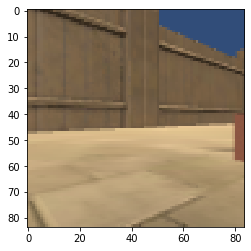

Wall  prob =  0.91439205
Ramp  prob =  0.7757958
CylinderTunnel  prob =  0.58361834
Cardbox  prob =  1.2054427e-09
HotZone  prob =  4.3263726e-11
ULObject  prob =  9.043079e-15
GoodGoal  prob =  3.5305568e-15
BadGoal  prob =  1.1899327e-15
GoodGoalMulti  prob =  7.465368e-19
DeathZone  prob =  1.6748156e-19
WallTransparent  prob =  1.099823e-24
CylinderTunnelTransparent  prob =  9.087231e-39


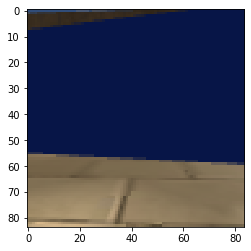

Ramp  prob =  0.9123062
Wall  prob =  0.78212774
CylinderTunnel  prob =  0.0054731793
HotZone  prob =  9.927443e-12
BadGoal  prob =  1.6713611e-21
GoodGoal  prob =  1.3444166e-21
Cardbox  prob =  1.2832038e-21
WallTransparent  prob =  4.816938e-25
GoodGoalMulti  prob =  1.5585721e-25
ULObject  prob =  1.2421079e-27
DeathZone  prob =  2.7713996e-29
CylinderTunnelTransparent  prob =  0.0


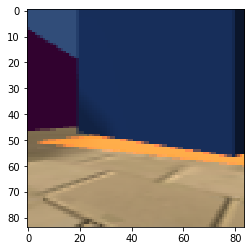

ULObject
Ramp  prob =  0.79194754
Wall  prob =  0.0061921747
HotZone  prob =  3.9803894e-12
CylinderTunnel  prob =  1.08063566e-14
ULObject  prob =  5.086831e-16
BadGoal  prob =  4.7581442e-20
DeathZone  prob =  1.5426759e-28
WallTransparent  prob =  5.056068e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


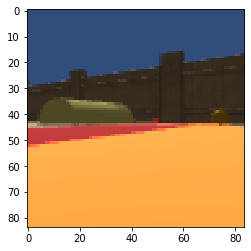

BadGoal  prob =  1.0
GoodGoal  prob =  4.177376e-05
CylinderTunnel  prob =  7.759326e-06
WallTransparent  prob =  3.9831704e-07
Ramp  prob =  9.767011e-08
Wall  prob =  1.3372188e-08
DeathZone  prob =  2.0513253e-09
HotZone  prob =  2.1407755e-10
Cardbox  prob =  8.112258e-11
ULObject  prob =  1.87567e-14
GoodGoalMulti  prob =  1.6136598e-14
CylinderTunnelTransparent  prob =  1.6222152e-20


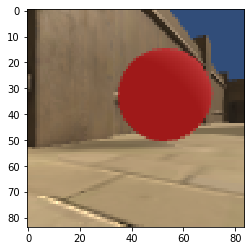

CylinderTunnel  prob =  0.9785821
Ramp  prob =  0.46596363
Wall  prob =  0.02429388
WallTransparent  prob =  1.8902378e-13
GoodGoalMulti  prob =  4.263615e-18
GoodGoal  prob =  4.584546e-20
BadGoal  prob =  2.3438e-20
CylinderTunnelTransparent  prob =  6.8869584e-24
HotZone  prob =  4.436486e-26
Cardbox  prob =  1.6185201e-26
DeathZone  prob =  8.0066475e-31
ULObject  prob =  1.0611607e-32


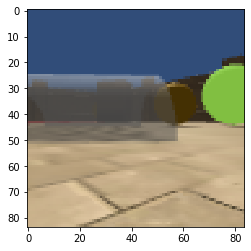

Ramp  prob =  0.37168396
Wall  prob =  0.32283103
HotZone  prob =  0.3221419
WallTransparent  prob =  0.31000304
ULObject  prob =  0.28648257
CylinderTunnel  prob =  0.27801868
DeathZone  prob =  0.27590108
CylinderTunnelTransparent  prob =  0.1854391
Cardbox  prob =  0.04360875
GoodGoalMulti  prob =  0.038140297
GoodGoal  prob =  0.026810352
BadGoal  prob =  0.017318735


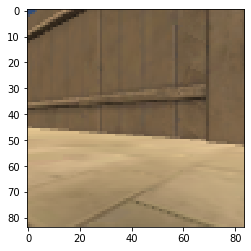

ULObject  prob =  0.9979128
Ramp  prob =  0.23788853
Wall  prob =  0.22414747
CylinderTunnel  prob =  0.043229647
HotZone  prob =  7.846164e-06
BadGoal  prob =  6.896215e-08
DeathZone  prob =  4.7400203e-08
WallTransparent  prob =  7.972883e-11
GoodGoal  prob =  2.7800227e-11
Cardbox  prob =  9.329089e-18
GoodGoalMulti  prob =  4.698698e-18
CylinderTunnelTransparent  prob =  2.2602692e-21


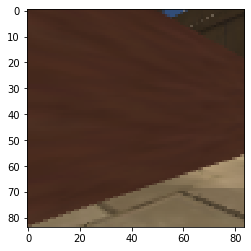

CylinderTunnel  prob =  0.006752607
Ramp  prob =  0.001831124
Wall  prob =  0.00016596614
GoodGoal  prob =  2.6539168e-05
BadGoal  prob =  1.0862613e-13
WallTransparent  prob =  1.5706491e-14
HotZone  prob =  1.3089646e-17
GoodGoalMulti  prob =  2.336392e-19
Cardbox  prob =  9.59039e-22
DeathZone  prob =  3.2900634e-22
ULObject  prob =  4.0716586e-27
CylinderTunnelTransparent  prob =  6.11739e-35


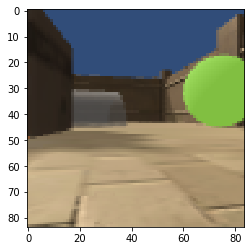

Ramp  prob =  0.8769014
CylinderTunnel  prob =  0.83899665
Wall  prob =  0.24389808
Cardbox  prob =  8.853396e-08
BadGoal  prob =  2.354114e-12
WallTransparent  prob =  5.5684905e-13
CylinderTunnelTransparent  prob =  3.2848236e-13
GoodGoal  prob =  4.6573556e-16
ULObject  prob =  1.264822e-16
GoodGoalMulti  prob =  5.9567546e-17
HotZone  prob =  2.2131427e-17
DeathZone  prob =  6.7566077e-18


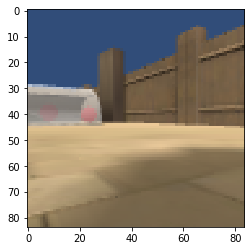

DeathZone  prob =  0.99981004
Ramp  prob =  2.4461624e-05
Wall  prob =  7.1379513e-06
ULObject  prob =  1.6634808e-09
CylinderTunnel  prob =  1.3728613e-10
WallTransparent  prob =  1.70581e-12
GoodGoal  prob =  5.921514e-13
BadGoal  prob =  1.5505868e-14
HotZone  prob =  1.8535126e-19
Cardbox  prob =  4.363085e-29
CylinderTunnelTransparent  prob =  1.1684089e-31
GoodGoalMulti  prob =  9.8281114e-32


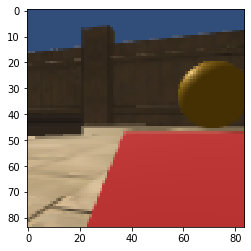

GoodGoalMulti  prob =  0.25939474
CylinderTunnel  prob =  2.1823154e-05
CylinderTunnelTransparent  prob =  4.0796535e-06
Ramp  prob =  2.211884e-06
Wall  prob =  4.8229737e-07
WallTransparent  prob =  3.434427e-08
BadGoal  prob =  3.793996e-15
Cardbox  prob =  1.2284033e-15
GoodGoal  prob =  2.0918862e-18
HotZone  prob =  1.9792135e-18
ULObject  prob =  6.813945e-24
DeathZone  prob =  2.6828726e-24


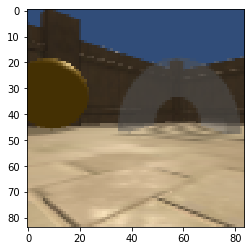

ULObject  prob =  0.17595404
DeathZone  prob =  0.16203308
CylinderTunnel  prob =  0.14243068
Ramp  prob =  0.1392131
WallTransparent  prob =  0.13017614
GoodGoal  prob =  0.12874652
Wall  prob =  0.12845507
HotZone  prob =  0.124146104
CylinderTunnelTransparent  prob =  0.12329309
BadGoal  prob =  0.10274192
Cardbox  prob =  0.08927842
GoodGoalMulti  prob =  0.062024586


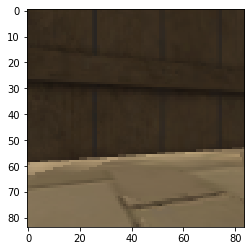

ULObject  prob =  0.053946964
WallTransparent  prob =  0.04259739
Wall  prob =  0.03976315
Ramp  prob =  0.039391823
CylinderTunnel  prob =  0.038551334
CylinderTunnelTransparent  prob =  0.034273263
DeathZone  prob =  0.030979192
Cardbox  prob =  0.023886511
HotZone  prob =  0.020638209
BadGoal  prob =  0.019566
GoodGoalMulti  prob =  0.010491516
GoodGoal  prob =  0.009920857


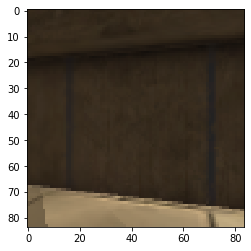

HotZone  prob =  0.2680391
DeathZone  prob =  0.25254458
ULObject  prob =  0.2245738
Ramp  prob =  0.22452763
WallTransparent  prob =  0.2043923
Wall  prob =  0.19998184
CylinderTunnel  prob =  0.18163994
CylinderTunnelTransparent  prob =  0.14924577
Cardbox  prob =  0.089353725
GoodGoal  prob =  0.041936032
BadGoal  prob =  0.041915294
GoodGoalMulti  prob =  0.04131433


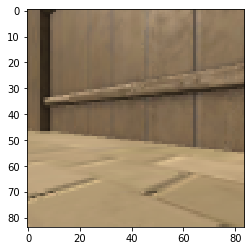

Ramp  prob =  0.8920294
CylinderTunnel  prob =  0.72810984
Wall  prob =  0.60661864
BadGoal  prob =  7.366541e-05
DeathZone  prob =  1.056786e-09
ULObject  prob =  9.772965e-10
GoodGoal  prob =  2.7161767e-12
HotZone  prob =  6.4911394e-14
WallTransparent  prob =  4.449603e-19
Cardbox  prob =  4.0405266e-20
GoodGoalMulti  prob =  2.3132955e-29
CylinderTunnelTransparent  prob =  0.0


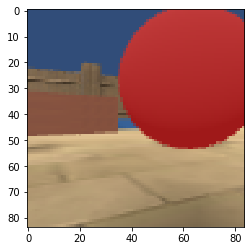

CylinderTunnel  prob =  0.09528779
Ramp  prob =  0.06973919
Wall  prob =  0.064622104
ULObject  prob =  0.05485451
WallTransparent  prob =  0.05385528
HotZone  prob =  0.044984158
DeathZone  prob =  0.03642059
CylinderTunnelTransparent  prob =  0.033279255
BadGoal  prob =  0.01903902
GoodGoal  prob =  0.013784477
GoodGoalMulti  prob =  0.012941994
Cardbox  prob =  0.0087176785


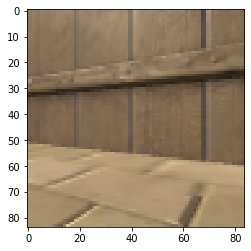

Ramp  prob =  0.9685127
CylinderTunnel  prob =  0.4327672
Wall  prob =  0.049503233
BadGoal  prob =  3.554435e-15
ULObject  prob =  1.0657448e-17
GoodGoal  prob =  1.3977008e-20
DeathZone  prob =  4.772102e-21
WallTransparent  prob =  1.3253118e-28
HotZone  prob =  1.2611446e-33
Cardbox  prob =  3.6216026e-34
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


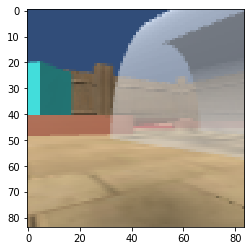

CylinderTunnel  prob =  0.9622396
Wall  prob =  0.6393141
Ramp  prob =  0.4386522
Cardbox  prob =  8.49968e-14
HotZone  prob =  5.1632668e-18
BadGoal  prob =  1.18286324e-23
GoodGoal  prob =  7.179877e-24
ULObject  prob =  8.663772e-28
GoodGoalMulti  prob =  1.126537e-30
DeathZone  prob =  1.9159134e-33
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


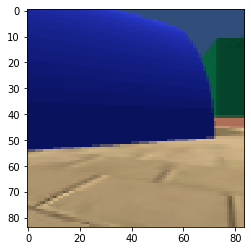

Ramp  prob =  0.9964893
Wall  prob =  0.9823393
HotZone  prob =  0.0011157591
CylinderTunnel  prob =  0.00017970265
Cardbox  prob =  1.6776512e-12
ULObject  prob =  4.434806e-13
BadGoal  prob =  3.270293e-22
GoodGoal  prob =  6.872e-24
DeathZone  prob =  7.7962014e-26
GoodGoalMulti  prob =  9.765266e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


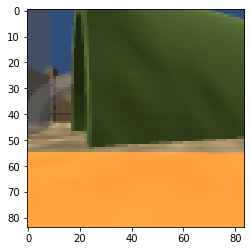

GoodGoal  prob =  0.087016314
CylinderTunnel  prob =  1.1578134e-05
BadGoal  prob =  2.2816462e-06
Ramp  prob =  3.6205694e-10
DeathZone  prob =  6.258458e-13
Wall  prob =  8.0423094e-16
Cardbox  prob =  1.5940948e-20
ULObject  prob =  2.462377e-22
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


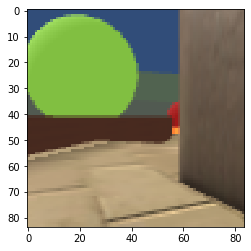

CylinderTunnel  prob =  0.99951077
Wall  prob =  0.78577816
Ramp  prob =  0.058806624
HotZone  prob =  1.4288058e-36
Cardbox  prob =  1.4714738e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


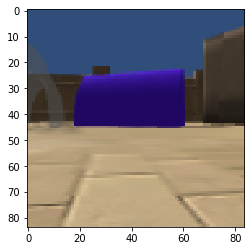

Ramp  prob =  0.80303836
CylinderTunnel  prob =  0.75311667
Wall  prob =  0.30128783
CylinderTunnelTransparent  prob =  5.318837e-12
WallTransparent  prob =  2.6172682e-12
BadGoal  prob =  2.765148e-14
Cardbox  prob =  3.3554102e-17
ULObject  prob =  1.4829168e-18
HotZone  prob =  1.7140731e-21
DeathZone  prob =  3.8457783e-25
GoodGoal  prob =  6.318134e-26
GoodGoalMulti  prob =  1.1111345e-29


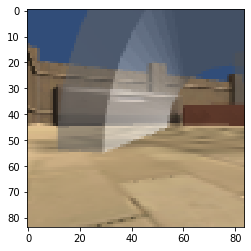

Ramp  prob =  0.96744823
Wall  prob =  0.7871288
CylinderTunnel  prob =  0.32555947
GoodGoal  prob =  8.569204e-29
HotZone  prob =  5.974157e-34
BadGoal  prob =  8.728844e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


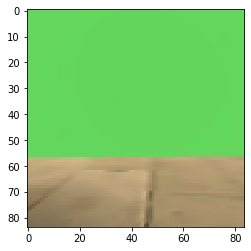

ULObject  prob =  0.9999273
Ramp  prob =  0.04502338
Wall  prob =  0.031717766
CylinderTunnel  prob =  0.010114697
DeathZone  prob =  2.5315114e-10
HotZone  prob =  8.66183e-11
BadGoal  prob =  3.679883e-12
GoodGoal  prob =  7.531882e-17
WallTransparent  prob =  7.013419e-17
Cardbox  prob =  6.9889877e-23
CylinderTunnelTransparent  prob =  2.8615585e-27
GoodGoalMulti  prob =  5.5581634e-29


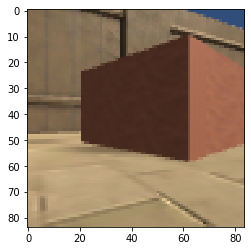

Ramp  prob =  1.0
Wall  prob =  1.5391093e-07
CylinderTunnel  prob =  6.2143314e-08
GoodGoal  prob =  2.546752e-29
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


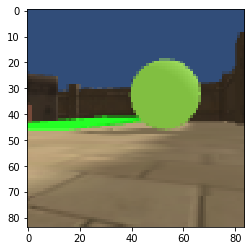

Wall  prob =  0.9801383
CylinderTunnel  prob =  0.49360907
Ramp  prob =  0.4138877
HotZone  prob =  4.74754e-19
BadGoal  prob =  4.8065038e-21
Cardbox  prob =  5.962423e-22
GoodGoal  prob =  1.9095839e-29
GoodGoalMulti  prob =  1.1674059e-32
ULObject  prob =  7.324958e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


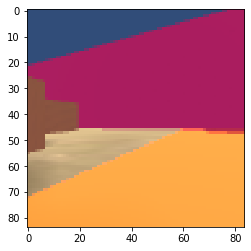

Ramp  prob =  0.96831137
Wall  prob =  0.8602108
CylinderTunnel  prob =  0.43564308
ULObject  prob =  1.5320402e-17
Cardbox  prob =  5.20664e-19
BadGoal  prob =  4.2521765e-20
DeathZone  prob =  7.152898e-23
GoodGoal  prob =  1.8004535e-24
WallTransparent  prob =  1.4431492e-25
HotZone  prob =  1.8863032e-26
GoodGoalMulti  prob =  1.1575161e-34
CylinderTunnelTransparent  prob =  7.060031e-36


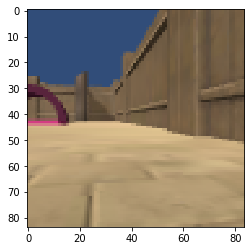

Ramp  prob =  0.038409583
GoodGoal  prob =  0.007998154
Wall  prob =  0.006203694
DeathZone  prob =  0.0020247735
CylinderTunnel  prob =  7.264524e-09
BadGoal  prob =  1.3204839e-18
ULObject  prob =  1.2145699e-21
WallTransparent  prob =  4.1865006e-31
HotZone  prob =  2.6640647e-33
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


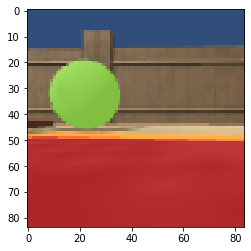

ULObject  prob =  0.3149383
WallTransparent  prob =  0.29618433
DeathZone  prob =  0.2764905
CylinderTunnelTransparent  prob =  0.25348547
Cardbox  prob =  0.2400583
Ramp  prob =  0.20770617
CylinderTunnel  prob =  0.2042427
Wall  prob =  0.20316492
HotZone  prob =  0.18612197
GoodGoalMulti  prob =  0.16757938
GoodGoal  prob =  0.0808656
BadGoal  prob =  0.041566543


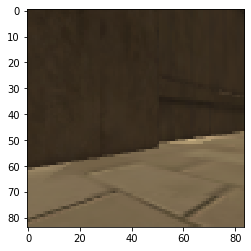

WallTransparent  prob =  0.43497837
Ramp  prob =  0.41887036
HotZone  prob =  0.37885362
Wall  prob =  0.37072068
ULObject  prob =  0.35753366
CylinderTunnel  prob =  0.35161582
DeathZone  prob =  0.34721404
CylinderTunnelTransparent  prob =  0.23467426
Cardbox  prob =  0.12280737
GoodGoalMulti  prob =  0.03410338
GoodGoal  prob =  0.028461628
BadGoal  prob =  0.023443459


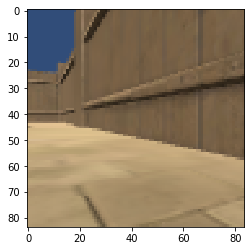

CylinderTunnel  prob =  0.86976635
Ramp  prob =  0.5186786
Wall  prob =  0.28066394
WallTransparent  prob =  3.3571317e-21
GoodGoal  prob =  9.860753e-23
HotZone  prob =  1.2879388e-32
BadGoal  prob =  2.1889435e-33
CylinderTunnelTransparent  prob =  5.738939e-34
ULObject  prob =  4.6251894e-37
DeathZone  prob =  5.859374e-39
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


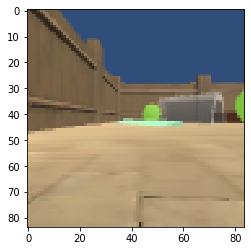

Cardbox  prob =  0.9999999
Ramp  prob =  0.0019465587
Wall  prob =  0.0015267573
CylinderTunnel  prob =  0.00041350722
BadGoal  prob =  5.233089e-13
GoodGoal  prob =  4.085231e-13
DeathZone  prob =  3.095096e-13
ULObject  prob =  2.0012927e-13
WallTransparent  prob =  8.5676346e-14
HotZone  prob =  1.3376791e-14
CylinderTunnelTransparent  prob =  1.1374837e-15
GoodGoalMulti  prob =  2.0288408e-18


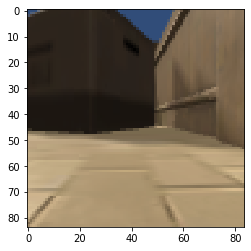

GoodGoalMulti  prob =  0.9941419
Wall  prob =  0.0032337953
Ramp  prob =  0.0025408356
CylinderTunnel  prob =  0.0023169497
WallTransparent  prob =  1.2523842e-13
HotZone  prob =  3.574772e-18
CylinderTunnelTransparent  prob =  2.093841e-19
GoodGoal  prob =  1.571892e-19
Cardbox  prob =  7.322085e-21
BadGoal  prob =  1.5418487e-25
ULObject  prob =  6.180783e-31
DeathZone  prob =  9.7801446e-36


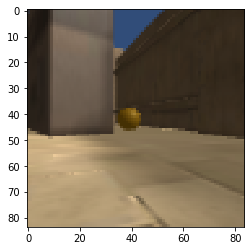

Wall  prob =  0.9364175
Ramp  prob =  0.45610875
CylinderTunnel  prob =  0.22550254
HotZone  prob =  0.0015955939
BadGoal  prob =  8.150404e-09
GoodGoalMulti  prob =  1.2499042e-10
GoodGoal  prob =  7.0188934e-13
WallTransparent  prob =  6.9173217e-15
Cardbox  prob =  7.0356535e-19
ULObject  prob =  1.6655049e-22
DeathZone  prob =  9.087998e-23
CylinderTunnelTransparent  prob =  0.0


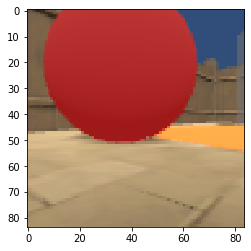

Ramp  prob =  0.9886851
CylinderTunnel  prob =  0.25309175
Wall  prob =  0.22130266
GoodGoal  prob =  1.506398e-15
WallTransparent  prob =  3.7677376e-27
BadGoal  prob =  1.2504781e-30
HotZone  prob =  3.66153e-32
GoodGoalMulti  prob =  9.052789e-35
DeathZone  prob =  4.7739226e-36
ULObject  prob =  3.302625e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


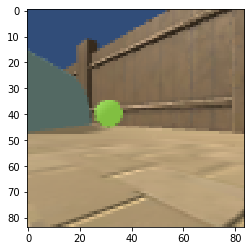

Wall  prob =  0.951746
Ramp  prob =  0.8951183
CylinderTunnel  prob =  0.45158702
HotZone  prob =  8.6848634e-10
Cardbox  prob =  2.3703296e-12
GoodGoal  prob =  4.1099025e-14
BadGoal  prob =  3.861463e-14
ULObject  prob =  1.8756018e-14
DeathZone  prob =  5.4577863e-17
GoodGoalMulti  prob =  1.9901885e-21
WallTransparent  prob =  3.6108215e-23
CylinderTunnelTransparent  prob =  0.0


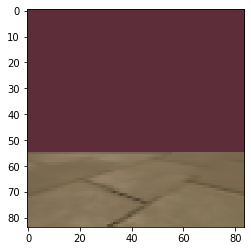

HotZone  prob =  0.4124123
DeathZone  prob =  0.3725026
WallTransparent  prob =  0.35070494
ULObject  prob =  0.323101
Ramp  prob =  0.31931713
Wall  prob =  0.3049316
CylinderTunnelTransparent  prob =  0.26776314
CylinderTunnel  prob =  0.25698522
Cardbox  prob =  0.0659642
GoodGoalMulti  prob =  0.049296223
GoodGoal  prob =  0.036657523
BadGoal  prob =  0.015299026


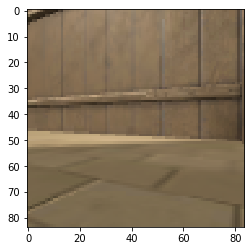

Ramp  prob =  0.9982248
Wall  prob =  0.9615699
CylinderTunnel  prob =  1.02994e-05
GoodGoal  prob =  1.0377934e-25
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


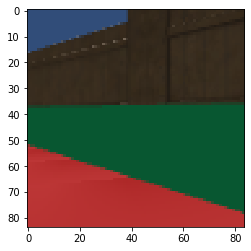

CylinderTunnel  prob =  0.88870376
Ramp  prob =  0.8330265
Wall  prob =  0.79000527
BadGoal  prob =  1.7969502e-06
Cardbox  prob =  9.564658e-09
WallTransparent  prob =  4.499175e-09
ULObject  prob =  3.8361243e-09
HotZone  prob =  1.5355923e-09
CylinderTunnelTransparent  prob =  1.9206411e-10
GoodGoal  prob =  9.952322e-11
GoodGoalMulti  prob =  3.4285384e-11
DeathZone  prob =  2.5622275e-13


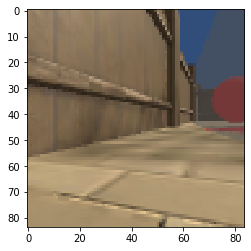

CylinderTunnel  prob =  0.99999726
Ramp  prob =  0.021605695
Wall  prob =  0.001958515
BadGoal  prob =  4.258752e-27
GoodGoal  prob =  1.1028168e-27
HotZone  prob =  1.6320621e-32
Cardbox  prob =  2.5777673e-35
GoodGoalMulti  prob =  5.536514e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


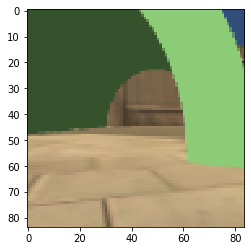

GoodGoalMulti  prob =  0.99999964
WallTransparent  prob =  0.0001193459
Wall  prob =  3.0279647e-05
Ramp  prob =  1.4951794e-05
CylinderTunnel  prob =  2.9216849e-06
HotZone  prob =  2.5197261e-08
GoodGoal  prob =  1.0702965e-08
BadGoal  prob =  3.942804e-09
CylinderTunnelTransparent  prob =  2.0379323e-10
Cardbox  prob =  1.7772556e-13
DeathZone  prob =  4.9446643e-14
ULObject  prob =  1.4806396e-17


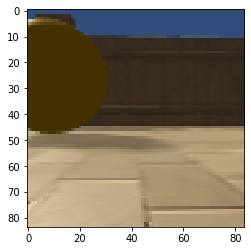

HotZone  prob =  0.999961
Ramp  prob =  0.013097705
Wall  prob =  0.0043765525
CylinderTunnel  prob =  1.5029942e-15
BadGoal  prob =  3.9366648e-24
WallTransparent  prob =  1.1130075e-25
DeathZone  prob =  2.2589101e-26
GoodGoal  prob =  1.5304912e-26
Cardbox  prob =  2.5696654e-29
ULObject  prob =  1.0265187e-29
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


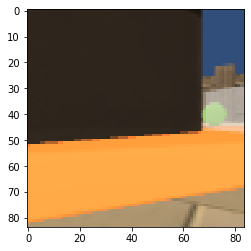

DeathZone  prob =  1.0
Ramp  prob =  5.9142026e-06
Wall  prob =  8.1489304e-08
ULObject  prob =  2.89541e-13
GoodGoal  prob =  8.6180324e-14
CylinderTunnel  prob =  1.887088e-18
BadGoal  prob =  3.5611112e-23
WallTransparent  prob =  1.090294e-25
HotZone  prob =  7.6287065e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


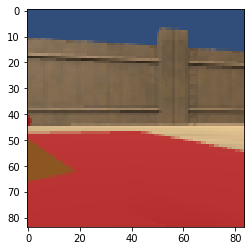

ULObject  prob =  0.9999571
Wall  prob =  0.059722774
Ramp  prob =  0.0314117
CylinderTunnel  prob =  0.0014419641
DeathZone  prob =  4.774118e-23
HotZone  prob =  2.9774155e-25
BadGoal  prob =  3.3828197e-27
GoodGoal  prob =  7.9566715e-34
WallTransparent  prob =  3.6085567e-34
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


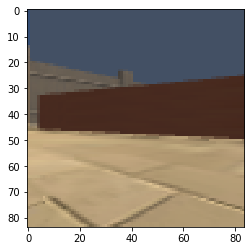

CylinderTunnel  prob =  1.0
Ramp  prob =  3.7322053e-19
ULObject  prob =  3.1634314e-22
Wall  prob =  5.170641e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


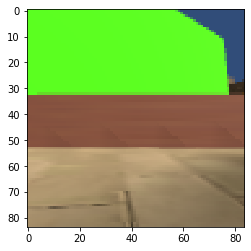

Ramp  prob =  0.42246276
HotZone  prob =  0.3844297
WallTransparent  prob =  0.38169932
Wall  prob =  0.37793556
DeathZone  prob =  0.32990006
CylinderTunnel  prob =  0.28906858
ULObject  prob =  0.28213656
CylinderTunnelTransparent  prob =  0.24656202
Cardbox  prob =  0.069564395
GoodGoalMulti  prob =  0.029285481
GoodGoal  prob =  0.020984676
BadGoal  prob =  0.02070912


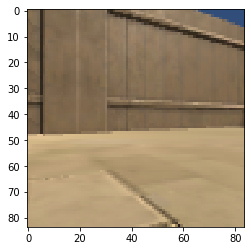

Ramp  prob =  0.9568157
Wall  prob =  0.7891401
CylinderTunnel  prob =  0.015276299
HotZone  prob =  0.0057564164
BadGoal  prob =  2.9585273e-12
ULObject  prob =  3.3799105e-16
DeathZone  prob =  2.3103872e-20
GoodGoal  prob =  9.827337e-22
WallTransparent  prob =  7.220283e-23
GoodGoalMulti  prob =  2.5070302e-28
Cardbox  prob =  2.483737e-28
CylinderTunnelTransparent  prob =  0.0


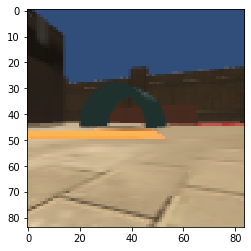

CylinderTunnel  prob =  0.99948174
Ramp  prob =  0.83204883
Wall  prob =  0.0006086108
BadGoal  prob =  9.431479e-15
GoodGoal  prob =  7.785451e-24
HotZone  prob =  3.9547547e-25
ULObject  prob =  2.3527896e-31
WallTransparent  prob =  4.287487e-36
DeathZone  prob =  8.536896e-38
GoodGoalMulti  prob =  4.801146e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


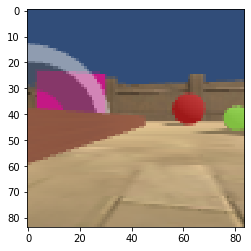

CylinderTunnel  prob =  0.78278154
Ramp  prob =  0.6387654
Wall  prob =  0.14018178
HotZone  prob =  8.856082e-19
BadGoal  prob =  3.2794784e-20
GoodGoal  prob =  2.6858806e-26
ULObject  prob =  1.2509212e-31
GoodGoalMulti  prob =  6.849621e-32
WallTransparent  prob =  4.7442317e-32
DeathZone  prob =  1.2025536e-32
Cardbox  prob =  5.229254e-33
CylinderTunnelTransparent  prob =  0.0


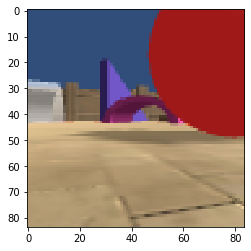

Cardbox  prob =  0.9995141
CylinderTunnel  prob =  0.033111334
Ramp  prob =  0.011162436
Wall  prob =  0.009792533
WallTransparent  prob =  7.878053e-06
HotZone  prob =  4.603897e-06
ULObject  prob =  4.513002e-07
CylinderTunnelTransparent  prob =  5.5117397e-08
GoodGoalMulti  prob =  1.722928e-08
DeathZone  prob =  4.3970982e-09
BadGoal  prob =  3.1801677e-09
GoodGoal  prob =  1.4778748e-09


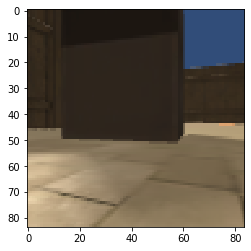

CylinderTunnel  prob =  0.9926165
Ramp  prob =  0.30885738
Wall  prob =  0.29426917
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


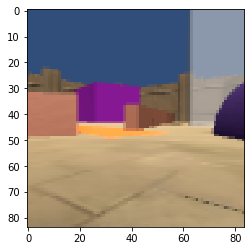

Ramp  prob =  0.91242456
Wall  prob =  0.7724173
CylinderTunnel  prob =  0.6638836
HotZone  prob =  2.149222e-08
ULObject  prob =  1.4908551e-10
BadGoal  prob =  2.0130862e-11
GoodGoal  prob =  6.0134822e-12
Cardbox  prob =  1.1905793e-12
DeathZone  prob =  2.31154e-14
WallTransparent  prob =  4.453628e-19
GoodGoalMulti  prob =  1.0607023e-19
CylinderTunnelTransparent  prob =  1.731344e-35


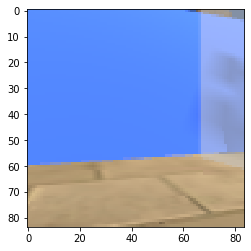

CylinderTunnel  prob =  0.9989919
Ramp  prob =  0.31460902
Wall  prob =  0.106316626
ULObject  prob =  9.810773e-31
HotZone  prob =  1.2011036e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


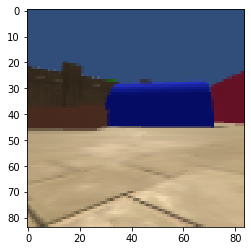

DeathZone  prob =  0.41587153
Ramp  prob =  0.4102358
HotZone  prob =  0.38903248
ULObject  prob =  0.38551915
Wall  prob =  0.38358223
WallTransparent  prob =  0.37511808
CylinderTunnel  prob =  0.36426097
CylinderTunnelTransparent  prob =  0.33443806
Cardbox  prob =  0.1325234
GoodGoalMulti  prob =  0.09385443
BadGoal  prob =  0.04707856
GoodGoal  prob =  0.045345046


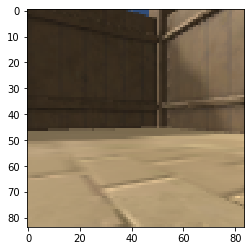

CylinderTunnel  prob =  0.8134941
Wall  prob =  0.7945355
Ramp  prob =  0.2534433
Cardbox  prob =  8.636466e-17
GoodGoal  prob =  3.3718343e-17
BadGoal  prob =  4.0041655e-18
HotZone  prob =  1.855098e-18
GoodGoalMulti  prob =  1.386502e-19
WallTransparent  prob =  2.3380749e-21
ULObject  prob =  5.5400543e-25
DeathZone  prob =  4.8424315e-27
CylinderTunnelTransparent  prob =  9.441709e-36


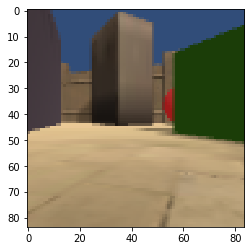

WallTransparent  prob =  0.4974139
Ramp  prob =  0.4908905
Wall  prob =  0.48953894
HotZone  prob =  0.48471507
DeathZone  prob =  0.46185294
ULObject  prob =  0.42684138
CylinderTunnel  prob =  0.3621335
CylinderTunnelTransparent  prob =  0.31609255
Cardbox  prob =  0.09344489
GoodGoal  prob =  0.026568338
GoodGoalMulti  prob =  0.0252321
BadGoal  prob =  0.024047565


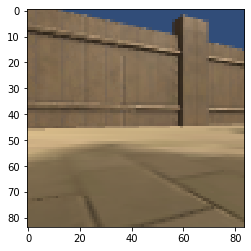

DeathZone  prob =  1.0
Ramp  prob =  2.0979815e-05
Wall  prob =  7.357355e-08
ULObject  prob =  8.9971953e-11
GoodGoal  prob =  6.9022337e-18
CylinderTunnel  prob =  1.0202698e-19
BadGoal  prob =  2.4425928e-20
WallTransparent  prob =  7.483508e-25
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


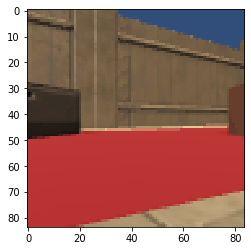

ULObject  prob =  0.7399933
Ramp  prob =  0.30148864
CylinderTunnel  prob =  0.2730051
Wall  prob =  0.042060778
HotZone  prob =  7.098059e-08
DeathZone  prob =  1.1693332e-10
BadGoal  prob =  3.0191355e-12
GoodGoal  prob =  9.484692e-16
WallTransparent  prob =  2.7935672e-18
Cardbox  prob =  8.370788e-23
GoodGoalMulti  prob =  8.39238e-28
CylinderTunnelTransparent  prob =  9.497245e-33


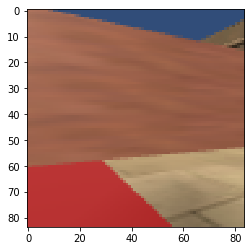

ULObject  prob =  0.99999416
Wall  prob =  0.0013693502
Ramp  prob =  0.0010243347
CylinderTunnel  prob =  6.3619764e-06
BadGoal  prob =  1.6946288e-08
DeathZone  prob =  1.0062355e-11
HotZone  prob =  8.050949e-20
WallTransparent  prob =  2.4655138e-24
GoodGoal  prob =  1.8207389e-24
Cardbox  prob =  5.9121235e-36
CylinderTunnelTransparent  prob =  2.6348507e-37
GoodGoalMulti  prob =  0.0


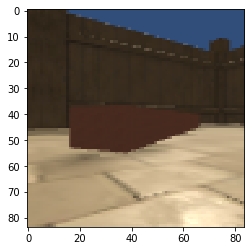

CylinderTunnel  prob =  0.8997462
Ramp  prob =  0.26422167
Wall  prob =  0.07919824
GoodGoal  prob =  1.7196047e-09
BadGoal  prob =  1.1573076e-13
HotZone  prob =  4.077917e-15
DeathZone  prob =  2.330699e-23
Cardbox  prob =  3.2870743e-24
ULObject  prob =  3.9117532e-25
WallTransparent  prob =  1.3514733e-26
GoodGoalMulti  prob =  1.2880692e-28
CylinderTunnelTransparent  prob =  0.0


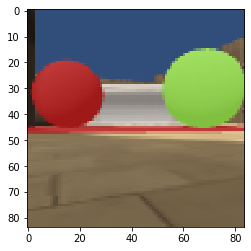

Ramp  prob =  0.9328275
Wall  prob =  0.7973908
CylinderTunnel  prob =  0.0009548827
DeathZone  prob =  4.101375e-10
ULObject  prob =  1.8543296e-15
BadGoal  prob =  9.87788e-16
WallTransparent  prob =  8.2197845e-16
Cardbox  prob =  7.630756e-18
GoodGoal  prob =  1.6346927e-23
CylinderTunnelTransparent  prob =  7.490534e-25
HotZone  prob =  7.4836243e-32
GoodGoalMulti  prob =  0.0


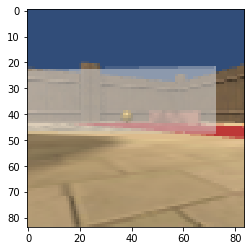

BadGoal  prob =  0.9999999
GoodGoal  prob =  0.00095305586
CylinderTunnel  prob =  1.312583e-06
Ramp  prob =  2.4762981e-08
Wall  prob =  1.7291105e-08
HotZone  prob =  1.2468886e-08
DeathZone  prob =  1.3980634e-09
GoodGoalMulti  prob =  6.2484606e-10
Cardbox  prob =  8.6847337e-13
WallTransparent  prob =  2.6690516e-16
ULObject  prob =  1.9980923e-21
CylinderTunnelTransparent  prob =  1.8770024e-24


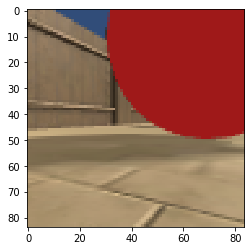

ULObject  prob =  0.9996418
CylinderTunnel  prob =  0.011449373
Ramp  prob =  0.0023592543
Wall  prob =  0.0020271896
DeathZone  prob =  1.8302584e-09
BadGoal  prob =  2.5917593e-12
HotZone  prob =  2.3940224e-14
WallTransparent  prob =  1.8557713e-17
GoodGoal  prob =  1.2121749e-17
Cardbox  prob =  2.4620952e-22
CylinderTunnelTransparent  prob =  2.1447601e-29
GoodGoalMulti  prob =  2.2260792e-33


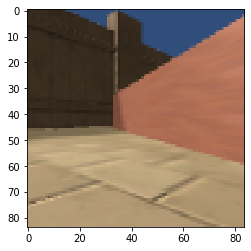

DeathZone  prob =  0.54678255
HotZone  prob =  0.54639935
ULObject  prob =  0.5453788
WallTransparent  prob =  0.54093057
Ramp  prob =  0.51408374
Wall  prob =  0.49876958
CylinderTunnel  prob =  0.45355654
CylinderTunnelTransparent  prob =  0.34219187
Cardbox  prob =  0.13878997
BadGoal  prob =  0.032706954
GoodGoalMulti  prob =  0.028962037
GoodGoal  prob =  0.018368151


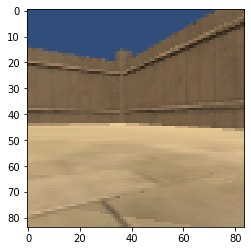

CylinderTunnel  prob =  0.99999857
Ramp  prob =  0.0054790536
Wall  prob =  0.00030464234
Cardbox  prob =  1.9437933e-32
BadGoal  prob =  9.6719345e-33
HotZone  prob =  5.336991e-33
ULObject  prob =  5.213503e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


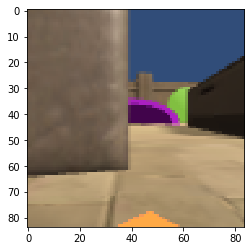

DeathZone  prob =  0.99672616
Ramp  prob =  0.2636095
Wall  prob =  0.010623394
CylinderTunnel  prob =  2.4970137e-09
WallTransparent  prob =  1.9220684e-12
ULObject  prob =  1.1898937e-12
BadGoal  prob =  5.1821443e-13
GoodGoal  prob =  2.0278824e-17
CylinderTunnelTransparent  prob =  2.5201943e-29
HotZone  prob =  6.460069e-35
Cardbox  prob =  2.6235288e-36
GoodGoalMulti  prob =  0.0


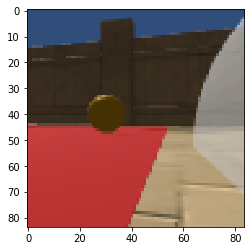

GoodGoal
Ramp  prob =  0.92743325
CylinderTunnel  prob =  0.6412519
Wall  prob =  0.30965272
HotZone  prob =  4.449275e-29
BadGoal  prob =  1.0670746e-33
GoodGoal  prob =  2.312792e-37
ULObject  prob =  1.3401602e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


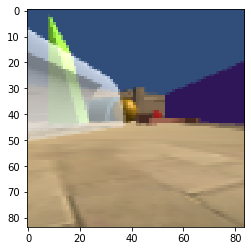

ULObject  prob =  0.9981559
Ramp  prob =  0.40003106
Wall  prob =  0.1763314
CylinderTunnel  prob =  0.00856486
HotZone  prob =  1.4829436e-20
BadGoal  prob =  8.862096e-27
DeathZone  prob =  1.2239522e-27
WallTransparent  prob =  2.2668521e-33
GoodGoal  prob =  5.58858e-39
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


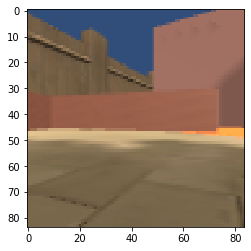

HotZone  prob =  0.4547105
WallTransparent  prob =  0.4537007
DeathZone  prob =  0.44239774
CylinderTunnel  prob =  0.42123583
CylinderTunnelTransparent  prob =  0.40833586
ULObject  prob =  0.40723214
Ramp  prob =  0.3978242
Wall  prob =  0.37577423
Cardbox  prob =  0.21758851
GoodGoal  prob =  0.14392655
GoodGoalMulti  prob =  0.14112121
BadGoal  prob =  0.08716591


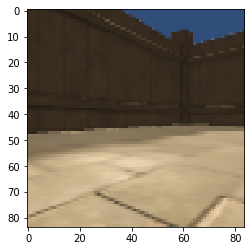

Ramp  prob =  0.9373361
CylinderTunnel  prob =  0.6237206
Wall  prob =  0.16760094
HotZone  prob =  1.3554869e-12
BadGoal  prob =  1.792997e-16
Cardbox  prob =  2.6166264e-18
ULObject  prob =  7.409049e-20
GoodGoal  prob =  5.433432e-20
WallTransparent  prob =  8.2505455e-22
DeathZone  prob =  3.0777714e-24
GoodGoalMulti  prob =  1.2412257e-29
CylinderTunnelTransparent  prob =  0.0


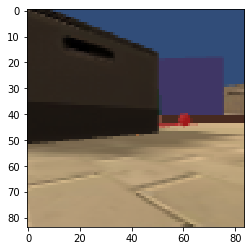

ULObject  prob =  0.96231174
CylinderTunnel  prob =  0.4071262
Wall  prob =  0.13029665
Ramp  prob =  0.12612751
BadGoal  prob =  0.019407049
HotZone  prob =  0.008911064
DeathZone  prob =  0.0043462366
WallTransparent  prob =  0.001101692
GoodGoalMulti  prob =  0.0010341041
GoodGoal  prob =  0.000549365
Cardbox  prob =  0.0005383236
CylinderTunnelTransparent  prob =  0.000534172


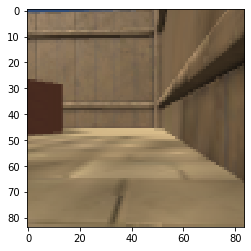

Ramp  prob =  0.53045857
DeathZone  prob =  0.52153677
WallTransparent  prob =  0.4954338
Wall  prob =  0.48158512
HotZone  prob =  0.477098
ULObject  prob =  0.470066
CylinderTunnel  prob =  0.3957281
CylinderTunnelTransparent  prob =  0.35550582
Cardbox  prob =  0.10778053
GoodGoalMulti  prob =  0.0314061
BadGoal  prob =  0.027021684
GoodGoal  prob =  0.018448342


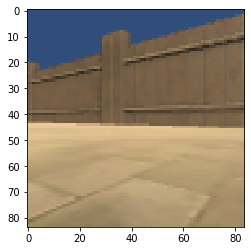

CylinderTunnel  prob =  0.9925513
Ramp  prob =  0.9661925
Wall  prob =  0.78764707
GoodGoal  prob =  2.0306531e-10
HotZone  prob =  1.3562483e-14
Cardbox  prob =  8.3878544e-16
BadGoal  prob =  1.4522127e-16
ULObject  prob =  3.843324e-20
DeathZone  prob =  2.1664952e-20
GoodGoalMulti  prob =  1.0159114e-28
WallTransparent  prob =  8.274134e-34
CylinderTunnelTransparent  prob =  0.0


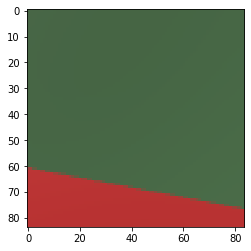

CylinderTunnel  prob =  0.99999404
Wall  prob =  0.059520684
Ramp  prob =  0.005724422
BadGoal  prob =  2.8466745e-35
HotZone  prob =  5.2991833e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


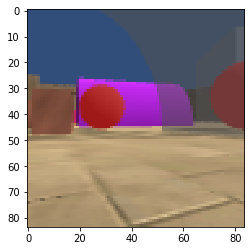

HotZone  prob =  0.999995
Ramp  prob =  2.361098e-08
ULObject  prob =  5.9609384e-09
Wall  prob =  8.140759e-12
BadGoal  prob =  8.460614e-15
Cardbox  prob =  1.4931244e-16
DeathZone  prob =  3.33648e-18
CylinderTunnel  prob =  7.028464e-19
WallTransparent  prob =  2.4776897e-21
GoodGoal  prob =  1.608215e-29
GoodGoalMulti  prob =  5.371697e-39
CylinderTunnelTransparent  prob =  0.0


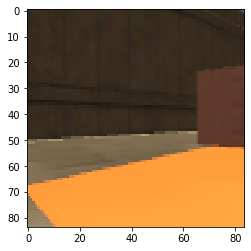

CylinderTunnel  prob =  0.83013165
Wall  prob =  0.47607926
Ramp  prob =  0.26062953
BadGoal  prob =  6.5256662e-09
HotZone  prob =  2.2367778e-19
GoodGoal  prob =  7.469662e-21
WallTransparent  prob =  3.483296e-21
Cardbox  prob =  2.9678731e-21
DeathZone  prob =  1.6118128e-23
ULObject  prob =  6.0793103e-27
GoodGoalMulti  prob =  3.214869e-28
CylinderTunnelTransparent  prob =  8.675832e-38


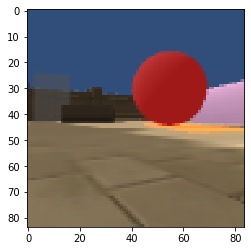

WallTransparent  prob =  0.4326217
Ramp  prob =  0.41491842
HotZone  prob =  0.4116246
DeathZone  prob =  0.3915422
Wall  prob =  0.37753415
CylinderTunnelTransparent  prob =  0.3674566
CylinderTunnel  prob =  0.34944007
ULObject  prob =  0.33972415
Cardbox  prob =  0.23210472
GoodGoalMulti  prob =  0.19996816
GoodGoal  prob =  0.15691459
BadGoal  prob =  0.11055928


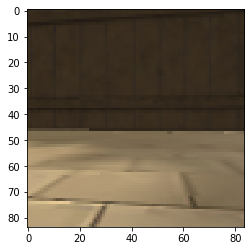

Ramp  prob =  0.98194665
Wall  prob =  0.6782254
CylinderTunnel  prob =  7.3837386e-06
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


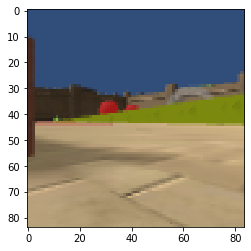

BadGoal  prob =  0.9963767
CylinderTunnel  prob =  0.008080931
Ramp  prob =  1.9862887e-07
Wall  prob =  1.8268454e-07
Cardbox  prob =  7.4120265e-10
GoodGoalMulti  prob =  3.342978e-10
GoodGoal  prob =  1.2837544e-10
WallTransparent  prob =  3.699223e-11
DeathZone  prob =  1.3820975e-12
HotZone  prob =  5.2698107e-16
CylinderTunnelTransparent  prob =  2.0321063e-21
ULObject  prob =  7.109505e-24


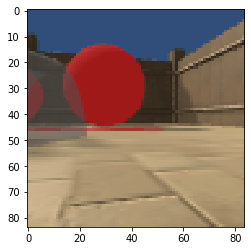

Ramp  prob =  0.99980325
Wall  prob =  0.033986844
CylinderTunnel  prob =  4.4554768e-06
DeathZone  prob =  2.9784928e-11
BadGoal  prob =  1.257093e-22
ULObject  prob =  1.2558374e-22
WallTransparent  prob =  2.3665257e-31
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


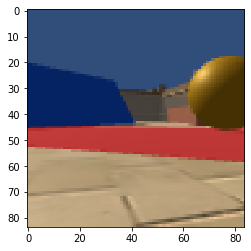

BadGoal  prob =  0.111772746
Ramp  prob =  0.10145466
ULObject  prob =  0.095842175
Wall  prob =  0.09575569
DeathZone  prob =  0.09541352
CylinderTunnel  prob =  0.082274735
CylinderTunnelTransparent  prob =  0.07513153
HotZone  prob =  0.06938514
GoodGoal  prob =  0.06839571
WallTransparent  prob =  0.059499945
Cardbox  prob =  0.029037604
GoodGoalMulti  prob =  0.021656455


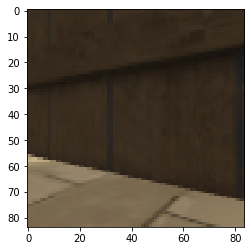

HotZone  prob =  0.3525222
GoodGoalMulti  prob =  0.3386555
WallTransparent  prob =  0.29116744
ULObject  prob =  0.2878451
Cardbox  prob =  0.2799009
DeathZone  prob =  0.23976955
CylinderTunnel  prob =  0.20394519
Ramp  prob =  0.1932025
CylinderTunnelTransparent  prob =  0.15653029
Wall  prob =  0.15015458
GoodGoal  prob =  0.099603005
BadGoal  prob =  0.035466794


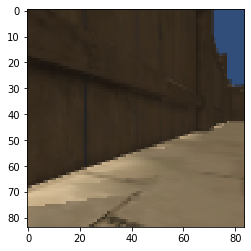

CylinderTunnel  prob =  0.9990584
Ramp  prob =  0.1896628
Wall  prob =  0.030164592
Cardbox  prob =  1.2964461e-18
BadGoal  prob =  2.5578446e-19
HotZone  prob =  4.7093522e-20
GoodGoal  prob =  1.2582487e-23
ULObject  prob =  4.6758276e-26
GoodGoalMulti  prob =  1.5824088e-26
WallTransparent  prob =  8.746296e-27
DeathZone  prob =  1.1380918e-29
CylinderTunnelTransparent  prob =  9.808114e-39


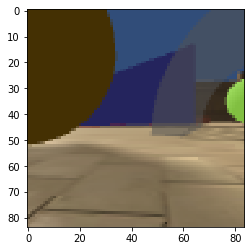

Cardbox  prob =  0.70105183
GoodGoalMulti  prob =  0.45228243
BadGoal  prob =  0.00047738221
CylinderTunnelTransparent  prob =  0.00021022798
DeathZone  prob =  2.4457428e-05
CylinderTunnel  prob =  1.839829e-05
GoodGoal  prob =  1.7186949e-05
HotZone  prob =  7.0858023e-06
ULObject  prob =  2.2653538e-07
Ramp  prob =  8.7261e-08
WallTransparent  prob =  6.963825e-08
Wall  prob =  1.3873245e-08


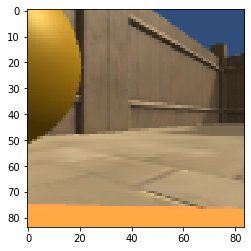

CylinderTunnelTransparent  prob =  0.14432165
WallTransparent  prob =  0.10252289
Ramp  prob =  0.09608299
GoodGoalMulti  prob =  0.09561851
CylinderTunnel  prob =  0.088088796
DeathZone  prob =  0.082654834
HotZone  prob =  0.08056792
GoodGoal  prob =  0.07505509
Wall  prob =  0.06418998
ULObject  prob =  0.025712434
Cardbox  prob =  0.018820781
BadGoal  prob =  0.0128023075


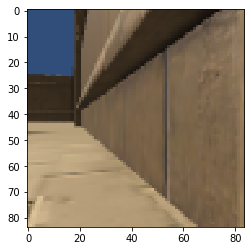

Ramp  prob =  0.97783
CylinderTunnel  prob =  0.73984694
Wall  prob =  0.040894613
ULObject  prob =  4.468287e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


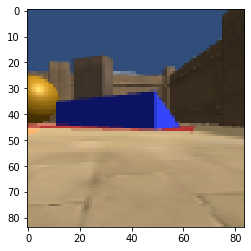

Ramp  prob =  0.41704914
WallTransparent  prob =  0.39061555
HotZone  prob =  0.383177
Wall  prob =  0.38250494
DeathZone  prob =  0.3402128
CylinderTunnel  prob =  0.33463395
ULObject  prob =  0.31517887
CylinderTunnelTransparent  prob =  0.24538891
Cardbox  prob =  0.063584045
GoodGoalMulti  prob =  0.013578873
GoodGoal  prob =  0.012853374
BadGoal  prob =  0.011468472


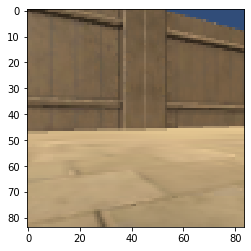

HotZone  prob =  0.43645734
Ramp  prob =  0.40797243
WallTransparent  prob =  0.3687524
Wall  prob =  0.35543117
DeathZone  prob =  0.35184205
ULObject  prob =  0.32041892
CylinderTunnel  prob =  0.3040619
CylinderTunnelTransparent  prob =  0.23488879
Cardbox  prob =  0.07518417
GoodGoalMulti  prob =  0.028534817
GoodGoal  prob =  0.014541195
BadGoal  prob =  0.010699925


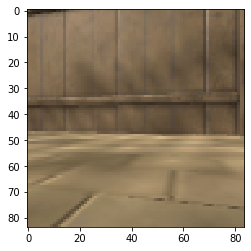

Wall  prob =  0.88788015
CylinderTunnel  prob =  0.8625125
Ramp  prob =  0.3441523
GoodGoalMulti  prob =  4.352465e-28
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


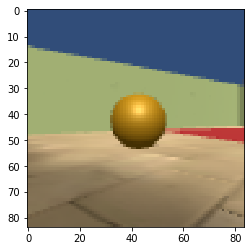

Wall  prob =  0.6493426
CylinderTunnel  prob =  0.019485123
Ramp  prob =  0.011816031
Cardbox  prob =  2.2131419e-10
HotZone  prob =  9.788757e-12
ULObject  prob =  7.541181e-21
BadGoal  prob =  1.2532941e-25
GoodGoal  prob =  9.895739e-27
DeathZone  prob =  6.4277394e-29
WallTransparent  prob =  9.515096e-31
GoodGoalMulti  prob =  9.795346e-35
CylinderTunnelTransparent  prob =  0.0


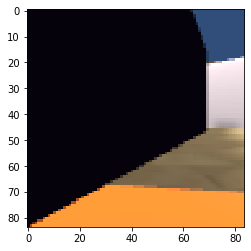

BadGoal  prob =  0.9230692
CylinderTunnel  prob =  0.04584195
Ramp  prob =  0.013600863
Wall  prob =  0.0011475453
ULObject  prob =  3.551642e-08
GoodGoal  prob =  2.673546e-12
DeathZone  prob =  9.852117e-13
HotZone  prob =  1.3658887e-16
WallTransparent  prob =  3.4009776e-17
CylinderTunnelTransparent  prob =  1.1106768e-29
Cardbox  prob =  3.426604e-33
GoodGoalMulti  prob =  2.427473e-33


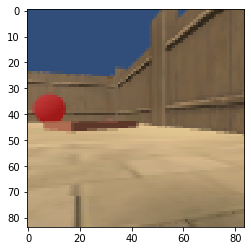

Cardbox  prob =  0.9999666
CylinderTunnel  prob =  0.015350998
Wall  prob =  0.0101106735
Ramp  prob =  0.0034398506
WallTransparent  prob =  5.468577e-05
CylinderTunnelTransparent  prob =  3.503752e-05
BadGoal  prob =  2.1502724e-07
HotZone  prob =  1.11237874e-07
ULObject  prob =  2.3290992e-08
GoodGoal  prob =  4.6258024e-09
DeathZone  prob =  3.3535303e-09
GoodGoalMulti  prob =  2.3422981e-09


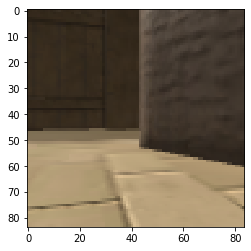

HotZone  prob =  0.999998
Ramp  prob =  0.07921775
Wall  prob =  0.005745943
CylinderTunnel  prob =  1.9638586e-05
BadGoal  prob =  1.4537238e-07
Cardbox  prob =  6.5643185e-08
DeathZone  prob =  4.6200532e-09
GoodGoal  prob =  1.7623796e-09
ULObject  prob =  3.888433e-10
WallTransparent  prob =  3.0482186e-11
GoodGoalMulti  prob =  6.414446e-12
CylinderTunnelTransparent  prob =  3.094159e-16


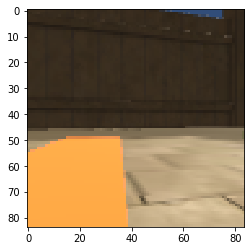

Ramp  prob =  0.97761077
Wall  prob =  0.9226744
CylinderTunnel  prob =  0.04840573
HotZone  prob =  0.048338898
ULObject  prob =  9.985921e-11
BadGoal  prob =  6.5530068e-24
DeathZone  prob =  2.857734e-24
GoodGoal  prob =  2.768061e-29
Cardbox  prob =  7.875843e-31
WallTransparent  prob =  1.6258054e-31
GoodGoalMulti  prob =  2.7093086e-36
CylinderTunnelTransparent  prob =  0.0


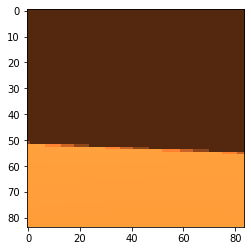

Ramp  prob =  0.9481235
Wall  prob =  0.74066055
CylinderTunnel  prob =  0.034644403
HotZone  prob =  1.9678481e-23
BadGoal  prob =  3.5426887e-28
GoodGoal  prob =  3.634136e-29
Cardbox  prob =  1.6147172e-31
ULObject  prob =  2.4036257e-33
DeathZone  prob =  5.259366e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


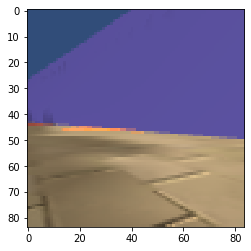

WallTransparent  prob =  0.16825137
GoodGoalMulti  prob =  0.1561245
Wall  prob =  0.11742681
Ramp  prob =  0.105237454
CylinderTunnel  prob =  0.102509946
CylinderTunnelTransparent  prob =  0.096309066
HotZone  prob =  0.05007144
Cardbox  prob =  0.04519078
ULObject  prob =  0.021631787
BadGoal  prob =  0.020881448
DeathZone  prob =  0.012512634
GoodGoal  prob =  0.010659036


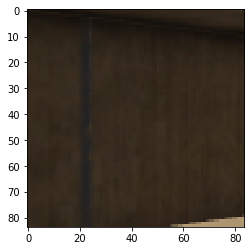

Cardbox  prob =  0.81087893
WallTransparent  prob =  0.31627852
CylinderTunnelTransparent  prob =  0.2825104
ULObject  prob =  0.2619902
Wall  prob =  0.2522849
Ramp  prob =  0.22947705
HotZone  prob =  0.22451733
CylinderTunnel  prob =  0.22445412
DeathZone  prob =  0.17242339
GoodGoalMulti  prob =  0.10312621
GoodGoal  prob =  0.054381415
BadGoal  prob =  0.048418116


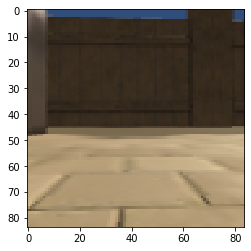

CylinderTunnel  prob =  0.9999864
Ramp  prob =  0.31738448
Wall  prob =  0.019365903
HotZone  prob =  3.469207e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


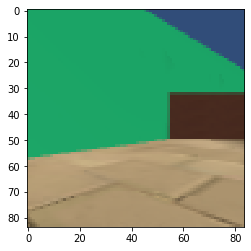

Wall  prob =  0.92247564
Ramp  prob =  0.8557173
CylinderTunnel  prob =  0.6418348
HotZone  prob =  1.81447e-10
GoodGoal  prob =  3.186081e-13
BadGoal  prob =  9.552269e-15
Cardbox  prob =  7.316491e-16
ULObject  prob =  1.3571527e-16
DeathZone  prob =  3.7263155e-19
GoodGoalMulti  prob =  3.529238e-22
WallTransparent  prob =  3.0462425e-26
CylinderTunnelTransparent  prob =  0.0


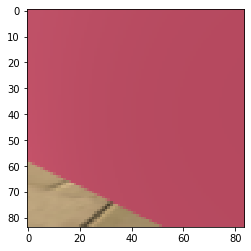

ULObject  prob =  0.11931812
Wall  prob =  0.01116709
Ramp  prob =  0.0105412295
CylinderTunnel  prob =  0.0001808304
BadGoal  prob =  2.9929963e-06
GoodGoal  prob =  7.211116e-08
DeathZone  prob =  1.4713496e-09
HotZone  prob =  3.5209669e-15
WallTransparent  prob =  1.5613054e-15
Cardbox  prob =  8.509191e-24
CylinderTunnelTransparent  prob =  1.1581038e-26
GoodGoalMulti  prob =  3.987439e-28


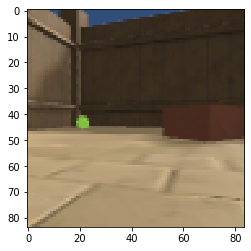

Wall  prob =  0.9682068
Ramp  prob =  0.8906628
CylinderTunnel  prob =  0.4690441
HotZone  prob =  2.8706118e-08
BadGoal  prob =  1.0116402e-09
GoodGoal  prob =  2.260065e-11
ULObject  prob =  4.6569033e-12
Cardbox  prob =  3.6529174e-12
GoodGoalMulti  prob =  1.7542407e-12
WallTransparent  prob =  1.0660261e-12
DeathZone  prob =  9.031289e-15
CylinderTunnelTransparent  prob =  2.757551e-23


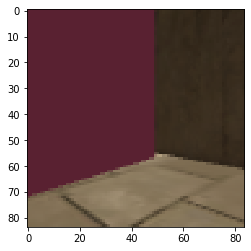

Ramp  prob =  0.9180314
Wall  prob =  0.5848032
CylinderTunnel  prob =  0.549058
HotZone  prob =  5.345383e-19
GoodGoal  prob =  7.883357e-24
BadGoal  prob =  5.635786e-24
ULObject  prob =  1.1146603e-25
WallTransparent  prob =  1.8103378e-30
Cardbox  prob =  3.2031426e-35
GoodGoalMulti  prob =  7.079287e-36
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


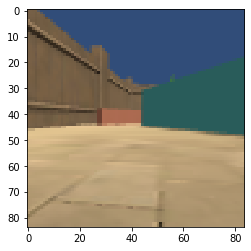

Ramp  prob =  0.9904884
CylinderTunnel  prob =  0.5257481
Wall  prob =  0.095230766
ULObject  prob =  7.0966924e-23
HotZone  prob =  3.7533264e-24
BadGoal  prob =  1.6108625e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


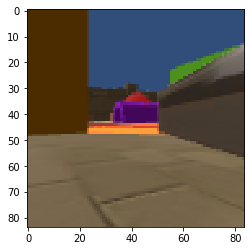

CylinderTunnel  prob =  0.060000107
Ramp  prob =  0.010992768
Wall  prob =  0.00075087434
CylinderTunnelTransparent  prob =  6.411305e-11
WallTransparent  prob =  2.9285693e-12
GoodGoalMulti  prob =  9.992097e-18
BadGoal  prob =  2.2662937e-30
HotZone  prob =  1.2682836e-35
Cardbox  prob =  4.3100466e-38
GoodGoal  prob =  2.353329e-38
ULObject  prob =  0.0
DeathZone  prob =  0.0


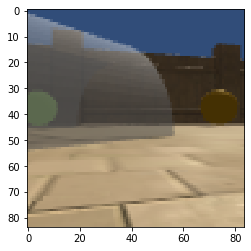

ULObject  prob =  0.46275654
CylinderTunnelTransparent  prob =  0.2670974
DeathZone  prob =  0.25655353
HotZone  prob =  0.21702094
CylinderTunnel  prob =  0.20146497
Wall  prob =  0.18047659
Ramp  prob =  0.17976548
WallTransparent  prob =  0.1393448
GoodGoalMulti  prob =  0.12655951
BadGoal  prob =  0.08419581
Cardbox  prob =  0.04840976
GoodGoal  prob =  0.028252508


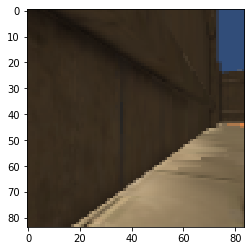

GoodGoal  prob =  0.99999464
Ramp  prob =  0.0560831
CylinderTunnel  prob =  0.0033368547
Wall  prob =  0.0009415698
DeathZone  prob =  7.078974e-18
ULObject  prob =  7.222604e-21
WallTransparent  prob =  3.3752404e-27
BadGoal  prob =  8.214531e-28
Cardbox  prob =  2.45072e-29
HotZone  prob =  7.739732e-31
GoodGoalMulti  prob =  1.1884684e-36
CylinderTunnelTransparent  prob =  0.0


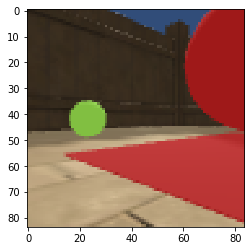

Ramp  prob =  0.4749349
Wall  prob =  0.44130668
HotZone  prob =  0.43736112
ULObject  prob =  0.38679454
CylinderTunnel  prob =  0.38643795
WallTransparent  prob =  0.38115466
DeathZone  prob =  0.3752805
CylinderTunnelTransparent  prob =  0.30119053
Cardbox  prob =  0.0949278
GoodGoalMulti  prob =  0.0772169
BadGoal  prob =  0.02915948
GoodGoal  prob =  0.023566013


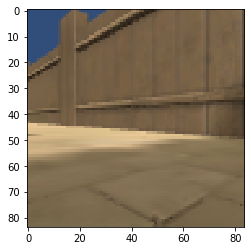

Wall  prob =  0.9643916
Ramp  prob =  0.8913509
CylinderTunnel  prob =  0.00093397434
HotZone  prob =  2.3471178e-14
BadGoal  prob =  3.728253e-32
WallTransparent  prob =  3.6969712e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


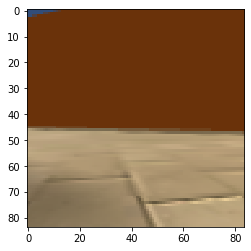

Ramp  prob =  0.99963987
CylinderTunnel  prob =  0.047023274
Wall  prob =  0.020412037
GoodGoal  prob =  5.5416737e-28
GoodGoalMulti  prob =  7.9347426e-30
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


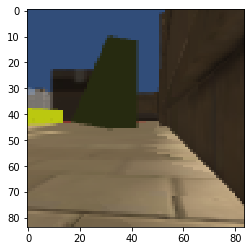

HotZone  prob =  0.8680484
DeathZone  prob =  0.14226283
WallTransparent  prob =  0.099652745
Ramp  prob =  0.074789144
Cardbox  prob =  0.052803237
Wall  prob =  0.048775423
CylinderTunnel  prob =  0.025628593
ULObject  prob =  0.011668316
CylinderTunnelTransparent  prob =  0.010579704
GoodGoalMulti  prob =  0.007776915
GoodGoal  prob =  0.0042564054
BadGoal  prob =  0.0020637382


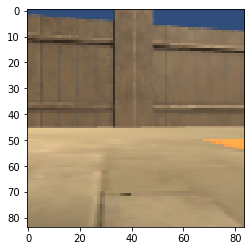

CylinderTunnel  prob =  0.9981096
Wall  prob =  0.30160898
Ramp  prob =  0.23285249
Cardbox  prob =  1.666168e-12
BadGoal  prob =  1.490206e-15
GoodGoalMulti  prob =  1.7925506e-18
HotZone  prob =  1.7111425e-18
GoodGoal  prob =  7.113647e-19
CylinderTunnelTransparent  prob =  3.742699e-19
WallTransparent  prob =  4.8708845e-21
ULObject  prob =  1.3629392e-21
DeathZone  prob =  2.0441533e-25


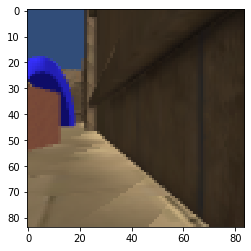

Ramp  prob =  0.97229946
CylinderTunnel  prob =  0.85140127
Wall  prob =  0.004441328
HotZone  prob =  1.415266e-21
GoodGoal  prob =  3.5355567e-30
BadGoal  prob =  3.8210367e-32
GoodGoalMulti  prob =  1.7079739e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


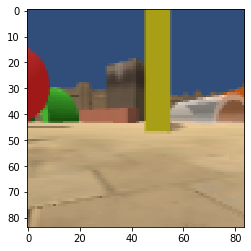

Ramp  prob =  0.35335803
HotZone  prob =  0.32004875
DeathZone  prob =  0.30748996
Wall  prob =  0.2988141
ULObject  prob =  0.2909592
CylinderTunnel  prob =  0.27329943
WallTransparent  prob =  0.26891205
CylinderTunnelTransparent  prob =  0.16487308
Cardbox  prob =  0.07171073
GoodGoalMulti  prob =  0.040970314
GoodGoal  prob =  0.024830204
BadGoal  prob =  0.018933669


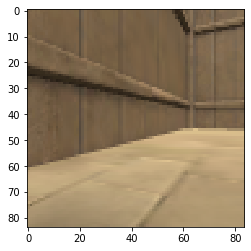

HotZone  prob =  0.99998844
Ramp  prob =  6.0035454e-05
Wall  prob =  8.219555e-06
Cardbox  prob =  1.964341e-09
CylinderTunnel  prob =  1.1300916e-16
ULObject  prob =  5.7758134e-19
DeathZone  prob =  1.237261e-19
WallTransparent  prob =  4.5731006e-22
BadGoal  prob =  8.2760426e-23
GoodGoal  prob =  1.2050028e-29
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


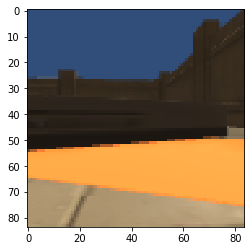

CylinderTunnel  prob =  0.99689215
Wall  prob =  0.9569314
Ramp  prob =  0.13601601
HotZone  prob =  7.9144964e-28
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


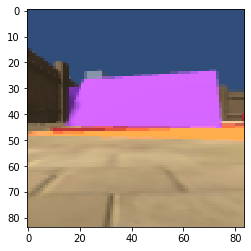

CylinderTunnelTransparent  prob =  0.9999739
CylinderTunnel  prob =  0.005601488
Wall  prob =  0.0030027595
Ramp  prob =  0.0018999451
WallTransparent  prob =  0.0008661774
BadGoal  prob =  9.177073e-09
GoodGoalMulti  prob =  1.1168636e-09
Cardbox  prob =  2.9251768e-11
HotZone  prob =  2.767004e-11
DeathZone  prob =  2.1676777e-12
ULObject  prob =  1.00479995e-13
GoodGoal  prob =  5.94727e-15


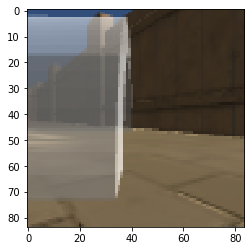

Ramp  prob =  0.9973309
Wall  prob =  0.033447616
CylinderTunnel  prob =  1.8173683e-05
DeathZone  prob =  2.2529632e-07
ULObject  prob =  1.7398284e-09
BadGoal  prob =  5.281536e-19
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


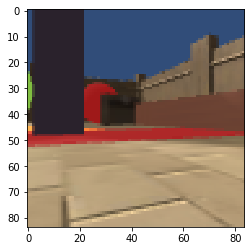

Ramp  prob =  0.88667715
CylinderTunnel  prob =  0.09759158
Wall  prob =  0.052999336
ULObject  prob =  8.050487e-09
HotZone  prob =  8.6009247e-32
BadGoal  prob =  2.2923288e-35
GoodGoal  prob =  2.2859094e-36
DeathZone  prob =  8.9711675e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


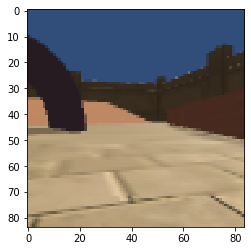

CylinderTunnel  prob =  0.9901968
Ramp  prob =  0.6139325
Wall  prob =  0.033906803
BadGoal  prob =  2.1740428e-15
ULObject  prob =  3.965858e-18
HotZone  prob =  1.1955626e-20
Cardbox  prob =  5.491752e-22
GoodGoal  prob =  8.398166e-23
WallTransparent  prob =  2.9622487e-23
DeathZone  prob =  2.2577825e-25
CylinderTunnelTransparent  prob =  1.21121e-30
GoodGoalMulti  prob =  1.0652906e-30


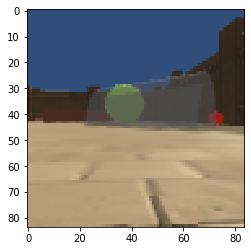

CylinderTunnel  prob =  0.9407272
Ramp  prob =  0.7866072
Wall  prob =  0.08987618
BadGoal  prob =  2.9682973e-10
HotZone  prob =  2.7125953e-11
GoodGoal  prob =  6.6680715e-16
GoodGoalMulti  prob =  1.6293473e-20
WallTransparent  prob =  2.5151432e-21
ULObject  prob =  1.6211503e-21
Cardbox  prob =  3.2500817e-23
DeathZone  prob =  1.1677224e-24
CylinderTunnelTransparent  prob =  0.0


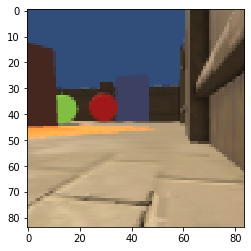

Wall  prob =  0.9100122
Ramp  prob =  0.8327167
CylinderTunnel  prob =  0.7278112
HotZone  prob =  1.8113693e-09
Cardbox  prob =  7.696064e-14
GoodGoal  prob =  4.8634175e-15
ULObject  prob =  9.030491e-16
BadGoal  prob =  7.521004e-16
DeathZone  prob =  1.6151213e-19
GoodGoalMulti  prob =  1.0205758e-22
WallTransparent  prob =  9.251511e-26
CylinderTunnelTransparent  prob =  0.0


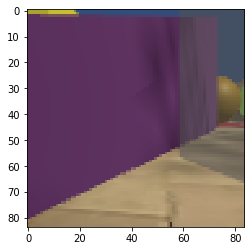

ULObject  prob =  0.5136362
Ramp  prob =  0.47352666
WallTransparent  prob =  0.4671535
HotZone  prob =  0.45129517
Wall  prob =  0.43462664
CylinderTunnelTransparent  prob =  0.4335137
DeathZone  prob =  0.37948993
CylinderTunnel  prob =  0.3692922
GoodGoalMulti  prob =  0.20781627
Cardbox  prob =  0.1910529
GoodGoal  prob =  0.16771103
BadGoal  prob =  0.1453801


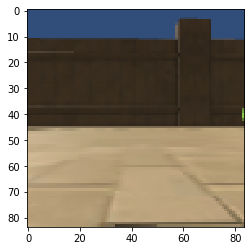

Ramp  prob =  0.9666199
CylinderTunnel  prob =  0.95620364
Wall  prob =  0.0008302171
BadGoal  prob =  6.9507045e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


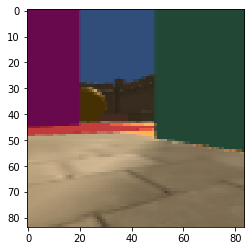

GoodGoal  prob =  0.53398556
CylinderTunnel  prob =  0.07785648
Ramp  prob =  0.004858409
Wall  prob =  0.0002230741
BadGoal  prob =  1.4765166e-07
DeathZone  prob =  8.373957e-10
Cardbox  prob =  7.9439154e-16
ULObject  prob =  1.6218403e-17
HotZone  prob =  1.6608766e-18
WallTransparent  prob =  7.505598e-20
GoodGoalMulti  prob =  2.1250722e-25
CylinderTunnelTransparent  prob =  0.0


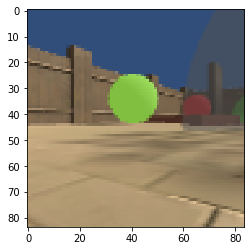

Cardbox  prob =  0.99979967
CylinderTunnel  prob =  0.012139574
Wall  prob =  0.009855239
Ramp  prob =  0.009528874
WallTransparent  prob =  1.229549e-06
CylinderTunnelTransparent  prob =  2.8465724e-08
BadGoal  prob =  5.560415e-09
HotZone  prob =  1.9559009e-11
ULObject  prob =  5.0668335e-13
GoodGoal  prob =  2.1010124e-13
DeathZone  prob =  6.662561e-14
GoodGoalMulti  prob =  4.758594e-14


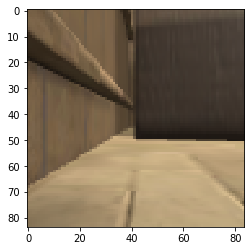

Ramp  prob =  0.25106442
Wall  prob =  0.22201125
CylinderTunnel  prob =  0.08351035
ULObject  prob =  9.067532e-08
Cardbox  prob =  1.03822255e-22
HotZone  prob =  2.2307783e-27
DeathZone  prob =  3.3004613e-28
BadGoal  prob =  1.9920271e-28
GoodGoal  prob =  2.4397747e-32
WallTransparent  prob =  1.7997638e-35
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


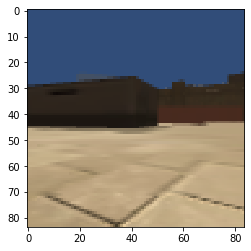

CylinderTunnel  prob =  1.0
Ramp  prob =  0.037302874
Wall  prob =  0.00025024018
BadGoal  prob =  5.6873234e-14
GoodGoal  prob =  1.623827e-25
ULObject  prob =  8.0277315e-28
HotZone  prob =  8.2090725e-30
Cardbox  prob =  3.762375e-30
DeathZone  prob =  1.5990915e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


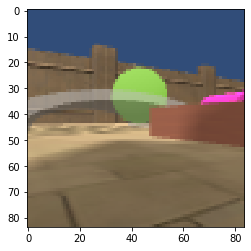

CylinderTunnel  prob =  0.99394023
Ramp  prob =  0.95804256
Wall  prob =  0.014044941
BadGoal  prob =  4.3680885e-18
GoodGoal  prob =  1.4615414e-19
ULObject  prob =  2.4775333e-25
Cardbox  prob =  1.1964121e-26
DeathZone  prob =  4.1527524e-29
HotZone  prob =  1.8390148e-30
GoodGoalMulti  prob =  2.699019e-32
WallTransparent  prob =  1.2290014e-33
CylinderTunnelTransparent  prob =  1.3712714e-38


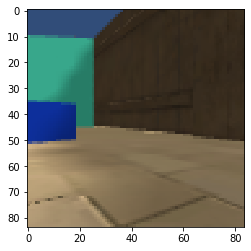

ULObject  prob =  0.99998236
Ramp  prob =  0.0058939173
Wall  prob =  0.005484828
CylinderTunnel  prob =  0.0020211423
DeathZone  prob =  9.073262e-11
BadGoal  prob =  2.677035e-13
HotZone  prob =  1.7481458e-15
WallTransparent  prob =  3.2430309e-18
GoodGoal  prob =  8.395456e-20
Cardbox  prob =  5.071203e-28
CylinderTunnelTransparent  prob =  1.2156909e-30
GoodGoalMulti  prob =  1.629293e-33


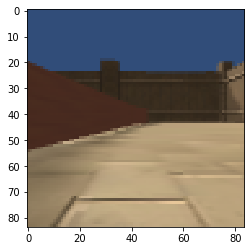

DeathZone  prob =  1.0
Ramp  prob =  0.17522764
Wall  prob =  0.00028057507
CylinderTunnel  prob =  1.4367758e-12
ULObject  prob =  2.8886842e-14
BadGoal  prob =  7.194426e-19
WallTransparent  prob =  3.062865e-22
GoodGoal  prob =  2.843086e-25
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


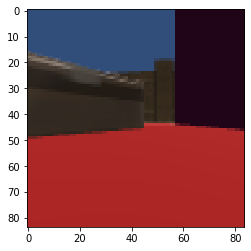

BadGoal
Ramp  prob =  0.8124027
Wall  prob =  0.60540813
CylinderTunnel  prob =  0.47175363
ULObject  prob =  8.934213e-15
BadGoal  prob =  5.2297013e-15
HotZone  prob =  1.1562512e-16
DeathZone  prob =  1.0801114e-23
GoodGoal  prob =  2.7962733e-27
WallTransparent  prob =  3.3407807e-28
Cardbox  prob =  9.75235e-29
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


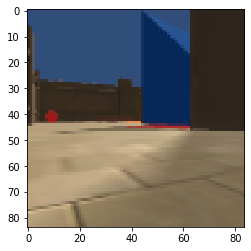

CylinderTunnel  prob =  0.9994966
Wall  prob =  0.43428212
Ramp  prob =  0.022179198
GoodGoalMulti  prob =  1.0815209e-13
HotZone  prob =  4.912563e-32
WallTransparent  prob =  2.8166362e-34
GoodGoal  prob =  2.2646869e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0


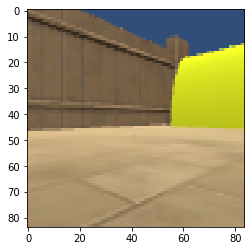

DeathZone  prob =  0.4134219
ULObject  prob =  0.41215408
CylinderTunnelTransparent  prob =  0.38175058
WallTransparent  prob =  0.37979603
CylinderTunnel  prob =  0.3639182
HotZone  prob =  0.36001813
Ramp  prob =  0.34546393
Wall  prob =  0.33618516
Cardbox  prob =  0.26564655
GoodGoalMulti  prob =  0.16036747
GoodGoal  prob =  0.1042186
BadGoal  prob =  0.082507044


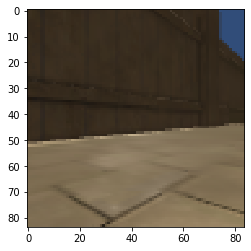

ULObject  prob =  0.16248155
Wall  prob =  0.1487207
DeathZone  prob =  0.14687584
Ramp  prob =  0.14663091
WallTransparent  prob =  0.1288996
CylinderTunnelTransparent  prob =  0.1187427
GoodGoal  prob =  0.118187465
HotZone  prob =  0.11430942
CylinderTunnel  prob =  0.11165276
BadGoal  prob =  0.094036885
GoodGoalMulti  prob =  0.065703325
Cardbox  prob =  0.0480903


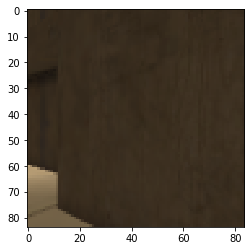

Ramp  prob =  0.9830547
CylinderTunnel  prob =  0.27906767
Wall  prob =  0.10420189
GoodGoal  prob =  6.009488e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


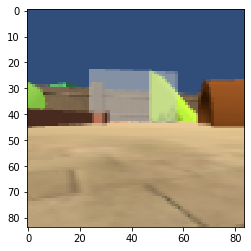

ULObject  prob =  0.98611814
Ramp  prob =  0.9029747
Wall  prob =  0.06829506
CylinderTunnel  prob =  0.02825794
DeathZone  prob =  4.1799404e-13
BadGoal  prob =  8.469384e-18
HotZone  prob =  1.8579502e-20
GoodGoal  prob =  9.498609e-28
WallTransparent  prob =  2.9106862e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


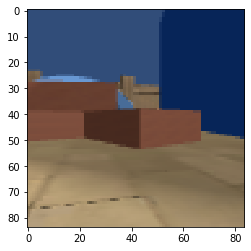

CylinderTunnel  prob =  0.9760381
Ramp  prob =  0.72065705
Wall  prob =  0.10377445
BadGoal  prob =  3.443772e-07
Cardbox  prob =  2.618367e-12
WallTransparent  prob =  1.68965e-14
HotZone  prob =  4.020411e-15
ULObject  prob =  8.110636e-18
DeathZone  prob =  1.0712346e-18
GoodGoal  prob =  8.0311074e-19
GoodGoalMulti  prob =  9.035911e-29
CylinderTunnelTransparent  prob =  8.332595e-29


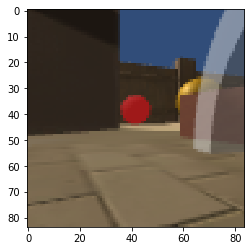

BadGoal  prob =  0.80861443
CylinderTunnel  prob =  0.70420474
Ramp  prob =  0.05968623
Wall  prob =  0.0080060465
GoodGoal  prob =  0.0047152373
HotZone  prob =  1.6899789e-10
Cardbox  prob =  2.7235224e-12
DeathZone  prob =  5.565008e-13
GoodGoalMulti  prob =  1.2333865e-13
WallTransparent  prob =  8.5518835e-17
ULObject  prob =  3.2986373e-20
CylinderTunnelTransparent  prob =  1.8837408e-36


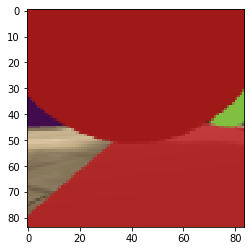

CylinderTunnel  prob =  0.9173846
Ramp  prob =  0.765702
Wall  prob =  0.44419912
BadGoal  prob =  7.939369e-24
GoodGoalMulti  prob =  3.8402495e-26
HotZone  prob =  1.0235011e-27
GoodGoal  prob =  1.3095116e-28
WallTransparent  prob =  5.7391063e-29
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


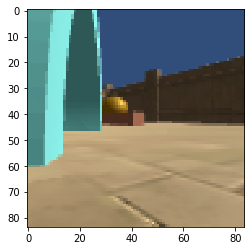

Cardbox  prob =  0.9999982
Wall  prob =  0.0026208714
Ramp  prob =  0.0022289855
CylinderTunnel  prob =  0.0019479647
WallTransparent  prob =  1.0411368e-05
ULObject  prob =  1.0300746e-05
BadGoal  prob =  2.3494263e-06
DeathZone  prob =  2.3306873e-06
HotZone  prob =  1.4471743e-06
CylinderTunnelTransparent  prob =  1.2370234e-06
GoodGoal  prob =  1.9913871e-07
GoodGoalMulti  prob =  5.0404614e-09


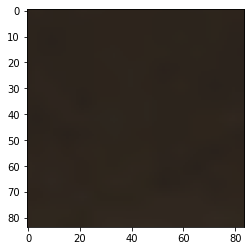

Ramp  prob =  0.9982363
Wall  prob =  0.9828705
CylinderTunnel  prob =  0.00516944
HotZone  prob =  3.8474775e-07
ULObject  prob =  9.222386e-15
BadGoal  prob =  7.295601e-20
GoodGoal  prob =  1.2431788e-20
Cardbox  prob =  7.242482e-25
GoodGoalMulti  prob =  8.041033e-28
DeathZone  prob =  6.986133e-31
WallTransparent  prob =  2.4108962e-35
CylinderTunnelTransparent  prob =  0.0


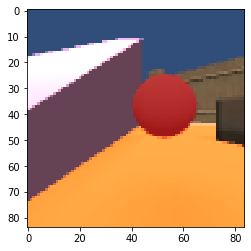

ULObject  prob =  0.28913713
Cardbox  prob =  0.26096398
HotZone  prob =  0.25834635
DeathZone  prob =  0.2545697
WallTransparent  prob =  0.23747568
Ramp  prob =  0.19721502
CylinderTunnelTransparent  prob =  0.1893031
Wall  prob =  0.18922405
CylinderTunnel  prob =  0.17420581
GoodGoalMulti  prob =  0.11623635
BadGoal  prob =  0.0907357
GoodGoal  prob =  0.055050116


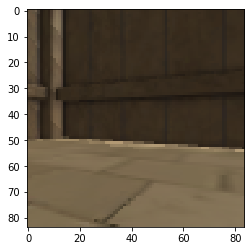

Wall  prob =  0.44454837
Ramp  prob =  0.37603936
CylinderTunnel  prob =  0.13769579
ULObject  prob =  9.096241e-07
HotZone  prob =  8.341686e-15
BadGoal  prob =  7.384367e-18
DeathZone  prob =  5.420561e-18
WallTransparent  prob =  3.542394e-19
GoodGoal  prob =  2.1432149e-21
GoodGoalMulti  prob =  1.2161763e-25
Cardbox  prob =  4.5658007e-28
CylinderTunnelTransparent  prob =  3.9819247e-34


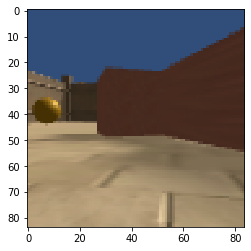

Cardbox  prob =  0.99892944
CylinderTunnel  prob =  0.134005
CylinderTunnelTransparent  prob =  0.10181358
Ramp  prob =  0.070046194
Wall  prob =  0.06513065
WallTransparent  prob =  0.043916307
GoodGoalMulti  prob =  0.002439898
ULObject  prob =  0.0015652449
BadGoal  prob =  0.00087555073
HotZone  prob =  0.00069926854
DeathZone  prob =  0.00037474776
GoodGoal  prob =  0.00021152887


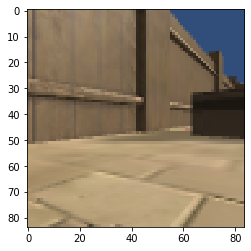

GoodGoal  prob =  0.9662238
Ramp  prob =  0.6931485
CylinderTunnel  prob =  0.59974873
Wall  prob =  0.1345954
WallTransparent  prob =  8.549843e-21
HotZone  prob =  1.2567821e-21
GoodGoalMulti  prob =  1.8333251e-25
BadGoal  prob =  1.0372195e-25
DeathZone  prob =  9.172225e-28
ULObject  prob =  4.878861e-29
Cardbox  prob =  3.126192e-39
CylinderTunnelTransparent  prob =  0.0


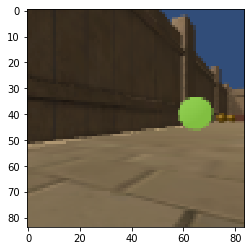

ULObject  prob =  0.8402175
BadGoal  prob =  0.80979043
Ramp  prob =  0.22031541
Wall  prob =  0.211007
CylinderTunnel  prob =  0.21062015
DeathZone  prob =  0.1428405
Cardbox  prob =  0.09303252
CylinderTunnelTransparent  prob =  0.07346377
HotZone  prob =  0.058650628
WallTransparent  prob =  0.048832014
GoodGoal  prob =  0.017286772
GoodGoalMulti  prob =  0.0052911877


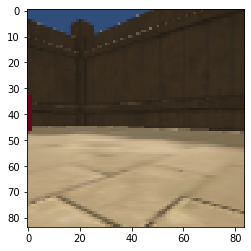

Ramp  prob =  0.9147649
Wall  prob =  0.5556123
CylinderTunnel  prob =  0.043770306
ULObject  prob =  1.9969936e-07
HotZone  prob =  1.8637519e-25
BadGoal  prob =  1.1412755e-27
DeathZone  prob =  1.4767853e-34
GoodGoal  prob =  1.2157242e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


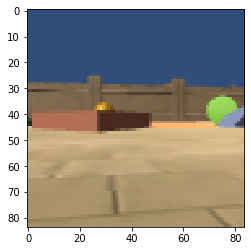

WallTransparent  prob =  0.9995388
CylinderTunnelTransparent  prob =  0.2815945
Ramp  prob =  0.025819154
Wall  prob =  0.020566283
CylinderTunnel  prob =  0.00096677686
Cardbox  prob =  1.5533895e-07
BadGoal  prob =  3.2253553e-08
GoodGoalMulti  prob =  2.6113197e-08
HotZone  prob =  9.271578e-11
GoodGoal  prob =  5.6713735e-12
DeathZone  prob =  4.3103173e-12
ULObject  prob =  3.1527e-13


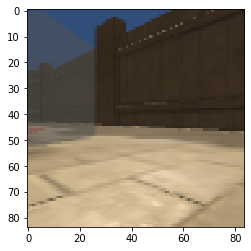

BadGoal  prob =  0.99989736
CylinderTunnel  prob =  0.0003368881
Ramp  prob =  0.00023414944
Wall  prob =  1.0221599e-05
GoodGoal  prob =  8.524361e-06
WallTransparent  prob =  9.067203e-08
DeathZone  prob =  5.0107674e-12
Cardbox  prob =  3.4075407e-14
GoodGoalMulti  prob =  1.0238281e-14
HotZone  prob =  1.2113163e-15
ULObject  prob =  1.3028658e-19
CylinderTunnelTransparent  prob =  2.79527e-20


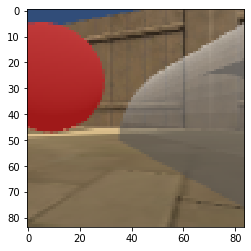

Cardbox  prob =  0.9999753
Wall  prob =  0.00058793765
Ramp  prob =  0.00034528546
CylinderTunnel  prob =  7.582308e-05
WallTransparent  prob =  6.504256e-05
CylinderTunnelTransparent  prob =  1.1532719e-07
ULObject  prob =  2.2860831e-14
HotZone  prob =  7.119467e-16
BadGoal  prob =  1.5510526e-16
DeathZone  prob =  1.3478439e-18
GoodGoal  prob =  3.771866e-19
GoodGoalMulti  prob =  6.316756e-20


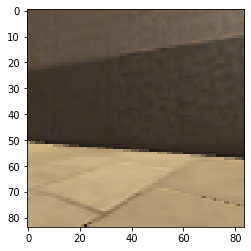

CylinderTunnel  prob =  0.20263161
Wall  prob =  0.18327233
Ramp  prob =  0.17506117
ULObject  prob =  0.13676311
HotZone  prob =  0.09156205
WallTransparent  prob =  0.084848836
DeathZone  prob =  0.07685348
CylinderTunnelTransparent  prob =  0.05478711
GoodGoal  prob =  0.015069138
Cardbox  prob =  0.014857311
BadGoal  prob =  0.013124427
GoodGoalMulti  prob =  0.009204694


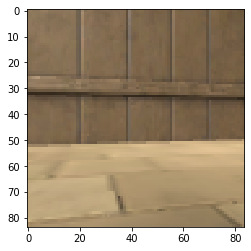

Ramp  prob =  0.94954336
Wall  prob =  0.6277141
HotZone  prob =  0.007934735
CylinderTunnel  prob =  7.79837e-08
BadGoal  prob =  1.816337e-28
Cardbox  prob =  1.585147e-32
ULObject  prob =  1.1965214e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


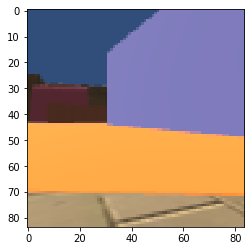

Ramp  prob =  0.4321629
WallTransparent  prob =  0.39908344
HotZone  prob =  0.39061767
Wall  prob =  0.38776124
CylinderTunnel  prob =  0.3366196
ULObject  prob =  0.33569223
DeathZone  prob =  0.33078822
CylinderTunnelTransparent  prob =  0.25995606
Cardbox  prob =  0.049942568
BadGoal  prob =  0.015191859
GoodGoalMulti  prob =  0.013612791
GoodGoal  prob =  0.013479469


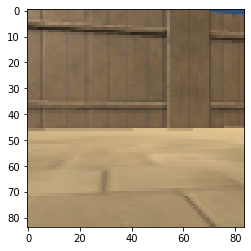

GoodGoal  prob =  1.0
Ramp  prob =  0.0003595676
CylinderTunnel  prob =  0.00021416935
Wall  prob =  7.519993e-05
BadGoal  prob =  5.489024e-09
HotZone  prob =  8.929506e-16
DeathZone  prob =  1.3643756e-20
ULObject  prob =  4.815953e-22
Cardbox  prob =  3.995321e-23
WallTransparent  prob =  3.4665124e-37
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


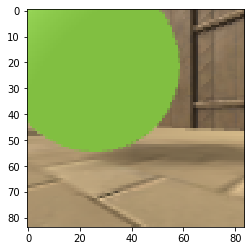

HotZone  prob =  0.37599885
WallTransparent  prob =  0.35876718
Ramp  prob =  0.35476708
DeathZone  prob =  0.3500325
ULObject  prob =  0.34506482
CylinderTunnel  prob =  0.2968287
Wall  prob =  0.296308
CylinderTunnelTransparent  prob =  0.27449304
Cardbox  prob =  0.12191181
GoodGoalMulti  prob =  0.0597087
BadGoal  prob =  0.03769738
GoodGoal  prob =  0.036500722


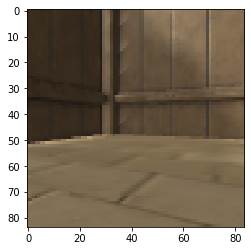

Wall  prob =  0.9619858
Ramp  prob =  0.9321363
CylinderTunnel  prob =  0.06425633
HotZone  prob =  2.3783584e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


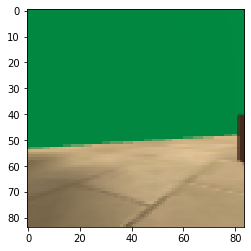

ULObject  prob =  0.7277718
BadGoal  prob =  0.49274927
Wall  prob =  0.29479542
Ramp  prob =  0.23713827
DeathZone  prob =  0.08490831
CylinderTunnel  prob =  0.07189755
WallTransparent  prob =  0.039862733
HotZone  prob =  0.032100573
GoodGoal  prob =  0.0040476527
CylinderTunnelTransparent  prob =  0.0014801302
GoodGoalMulti  prob =  0.00022739627
Cardbox  prob =  0.00020103867


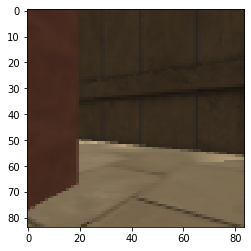

Ramp  prob =  0.9615263
Wall  prob =  0.461352
CylinderTunnel  prob =  0.15936254
HotZone  prob =  1.4246658e-26
GoodGoal  prob =  3.1607457e-27
BadGoal  prob =  3.7595762e-38
ULObject  prob =  2.1559144e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


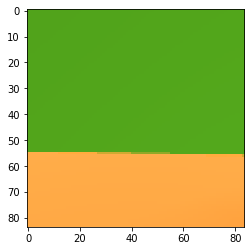

CylinderTunnel  prob =  0.94247955
Ramp  prob =  0.4715398
Wall  prob =  0.09857105
Cardbox  prob =  3.9445346e-35
BadGoal  prob =  6.1671984e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


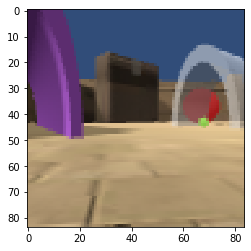

Ramp  prob =  0.9430077
Wall  prob =  0.68151516
CylinderTunnel  prob =  0.06336685
Cardbox  prob =  4.1486885e-05
HotZone  prob =  2.197533e-13
BadGoal  prob =  2.8207387e-15
GoodGoal  prob =  2.3293475e-16
ULObject  prob =  1.3363464e-16
DeathZone  prob =  1.6878372e-17
WallTransparent  prob =  2.6466773e-22
GoodGoalMulti  prob =  9.5246615e-28
CylinderTunnelTransparent  prob =  3.9825625e-34


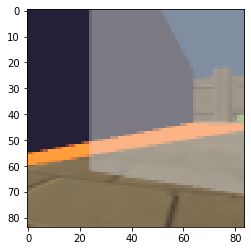

Ramp  prob =  0.9879943
Wall  prob =  0.48578256
CylinderTunnel  prob =  6.7404676e-10
DeathZone  prob =  5.4905913e-10
GoodGoal  prob =  9.668335e-15
BadGoal  prob =  6.147043e-23
WallTransparent  prob =  3.8029875e-26
ULObject  prob =  1.6677344e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


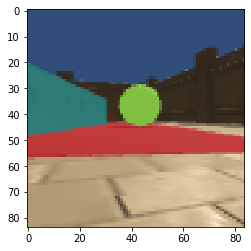

Ramp  prob =  0.9993315
Wall  prob =  0.24638624
CylinderTunnel  prob =  0.018080875
ULObject  prob =  1.6404902e-30
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


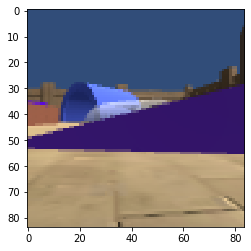

ULObject  prob =  0.34865695
HotZone  prob =  0.3267554
WallTransparent  prob =  0.3219904
DeathZone  prob =  0.29411346
CylinderTunnelTransparent  prob =  0.29358083
GoodGoalMulti  prob =  0.23363769
Cardbox  prob =  0.21719708
Ramp  prob =  0.216504
Wall  prob =  0.2141989
CylinderTunnel  prob =  0.20557657
GoodGoal  prob =  0.08673848
BadGoal  prob =  0.083411425


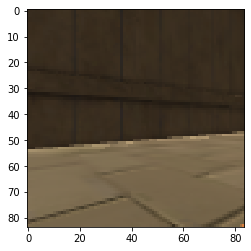

Ramp  prob =  0.96105754
Wall  prob =  0.7526627
CylinderTunnel  prob =  0.35123387
GoodGoal  prob =  2.5278115e-28
HotZone  prob =  1.0593083e-32
BadGoal  prob =  3.068102e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


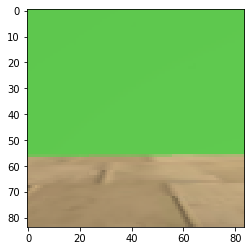

CylinderTunnel  prob =  0.23856588
Ramp  prob =  0.1862682
Wall  prob =  0.16122207
ULObject  prob =  2.9662913e-06
Cardbox  prob =  4.5483634e-07
BadGoal  prob =  3.4368718e-08
WallTransparent  prob =  3.0767354e-11
HotZone  prob =  1.0394643e-12
DeathZone  prob =  8.0463565e-13
GoodGoal  prob =  1.6452666e-14
CylinderTunnelTransparent  prob =  1.1065054e-17
GoodGoalMulti  prob =  2.863876e-18


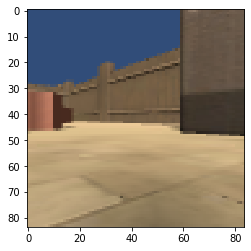

CylinderTunnel  prob =  0.7726719
Ramp  prob =  0.6391298
Wall  prob =  0.0031688064
GoodGoal  prob =  4.599116e-14
BadGoal  prob =  5.1082668e-21
HotZone  prob =  1.1806546e-30
GoodGoalMulti  prob =  4.4137947e-35
DeathZone  prob =  7.087177e-36
WallTransparent  prob =  7.85814e-38
Cardbox  prob =  2.9648942e-38
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0


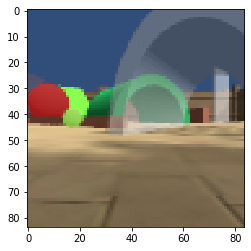

WallTransparent  prob =  0.27225506
HotZone  prob =  0.26709458
ULObject  prob =  0.24606934
CylinderTunnelTransparent  prob =  0.22792217
GoodGoalMulti  prob =  0.2237343
DeathZone  prob =  0.22163549
Ramp  prob =  0.20246767
CylinderTunnel  prob =  0.20045687
Wall  prob =  0.18597388
Cardbox  prob =  0.17451522
GoodGoal  prob =  0.101015985
BadGoal  prob =  0.09871176


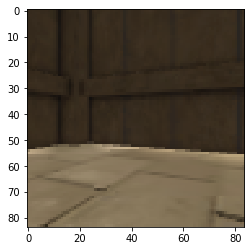

Ramp  prob =  0.89195657
Wall  prob =  0.40270138
CylinderTunnel  prob =  0.27698246
HotZone  prob =  6.2512103e-15
BadGoal  prob =  3.1507185e-19
ULObject  prob =  2.7940346e-19
GoodGoal  prob =  4.7853156e-22
Cardbox  prob =  5.740807e-24
DeathZone  prob =  8.19873e-26
WallTransparent  prob =  2.9693362e-27
GoodGoalMulti  prob =  8.824699e-31
CylinderTunnelTransparent  prob =  0.0


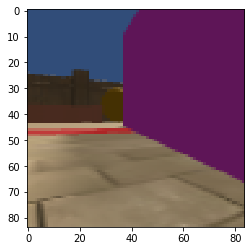

WallTransparent  prob =  0.057077184
Ramp  prob =  0.0335699
Wall  prob =  0.031673484
CylinderTunnelTransparent  prob =  0.031558856
CylinderTunnel  prob =  0.019079266
HotZone  prob =  0.009652332
ULObject  prob =  0.009431397
Cardbox  prob =  0.009173683
DeathZone  prob =  0.008170054
BadGoal  prob =  0.006191361
GoodGoal  prob =  0.003638069
GoodGoalMulti  prob =  0.0010756883


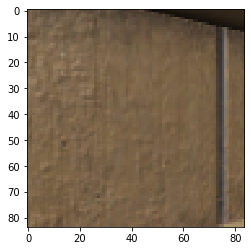

CylinderTunnel  prob =  0.86626583
Ramp  prob =  0.55061275
Wall  prob =  0.19286492
Cardbox  prob =  6.2949574e-29
BadGoal  prob =  5.0298558e-29
GoodGoal  prob =  8.446472e-34
WallTransparent  prob =  9.416634e-37
HotZone  prob =  4.7698612e-37
ULObject  prob =  2.825661e-37
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


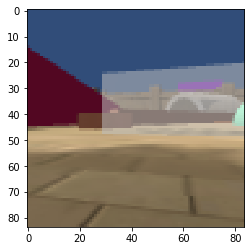

ULObject  prob =  0.78413683
BadGoal  prob =  0.50749516
Ramp  prob =  0.26334906
Wall  prob =  0.24417663
CylinderTunnel  prob =  0.21410744
DeathZone  prob =  0.09294048
Cardbox  prob =  0.046880547
HotZone  prob =  0.04047229
WallTransparent  prob =  0.035775915
GoodGoal  prob =  0.030132512
CylinderTunnelTransparent  prob =  0.01854186
GoodGoalMulti  prob =  0.0104667945


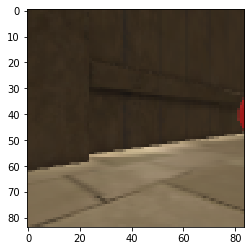

CylinderTunnel  prob =  0.9999993
Ramp  prob =  2.2276668e-05
Wall  prob =  1.4753014e-08
BadGoal  prob =  1.1684968e-18
GoodGoal  prob =  2.2272031e-23
Cardbox  prob =  5.582618e-30
ULObject  prob =  9.540247e-31
HotZone  prob =  8.628755e-33
GoodGoalMulti  prob =  6.526103e-35
DeathZone  prob =  2.6920124e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


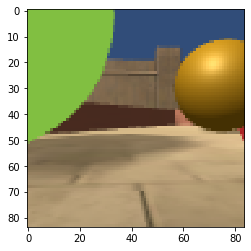

Ramp  prob =  0.8117334
Wall  prob =  0.07575612
CylinderTunnel  prob =  1.1746659e-08
GoodGoal  prob =  7.398484e-13
DeathZone  prob =  1.6541146e-14
BadGoal  prob =  3.7935355e-21
ULObject  prob =  1.5820889e-26
WallTransparent  prob =  1.2717721e-27
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


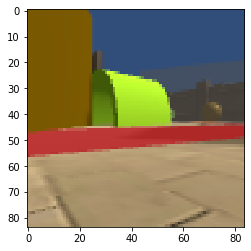

CylinderTunnel  prob =  0.9724931
Ramp  prob =  0.19060552
Wall  prob =  0.13763465
HotZone  prob =  2.775854e-14
Cardbox  prob =  1.1098757e-15
ULObject  prob =  8.3688294e-18
BadGoal  prob =  6.6488054e-20
GoodGoal  prob =  1.8415828e-24
WallTransparent  prob =  8.204388e-27
DeathZone  prob =  7.868148e-33
GoodGoalMulti  prob =  9.489413e-35
CylinderTunnelTransparent  prob =  0.0


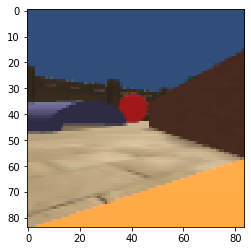

CylinderTunnel  prob =  0.57067925
Ramp  prob =  0.46586668
Wall  prob =  0.41401616
GoodGoal  prob =  2.0351287e-09
BadGoal  prob =  2.0750843e-18
HotZone  prob =  3.6657168e-20
GoodGoalMulti  prob =  9.276824e-24
DeathZone  prob =  3.1282912e-24
Cardbox  prob =  9.860319e-27
ULObject  prob =  5.63182e-28
WallTransparent  prob =  5.462773e-29
CylinderTunnelTransparent  prob =  0.0


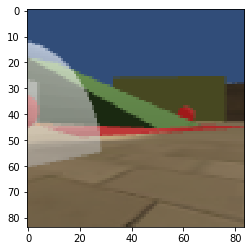

CylinderTunnelTransparent  prob =  0.9928598
WallTransparent  prob =  0.1164313
Ramp  prob =  0.017745871
Wall  prob =  0.0056963493
CylinderTunnel  prob =  0.00022796917
Cardbox  prob =  1.8870486e-14
BadGoal  prob =  4.726444e-15
ULObject  prob =  6.591451e-21
HotZone  prob =  5.3287617e-22
DeathZone  prob =  7.79333e-23
GoodGoal  prob =  2.51275e-25
GoodGoalMulti  prob =  4.2705463e-27


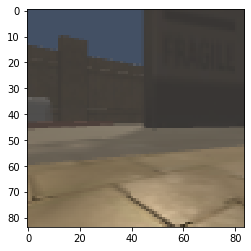

Ramp  prob =  0.9906821
Wall  prob =  0.8972357
DeathZone  prob =  2.8211389e-21
CylinderTunnel  prob =  1.8691946e-22
WallTransparent  prob =  8.134552e-34
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


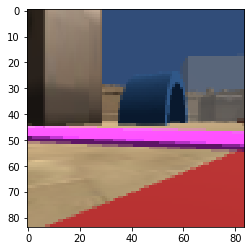

CylinderTunnel  prob =  0.9153042
Ramp  prob =  0.75967807
Wall  prob =  0.6096184
Cardbox  prob =  0.00031810172
WallTransparent  prob =  5.4585735e-06
CylinderTunnelTransparent  prob =  2.2887007e-06
BadGoal  prob =  1.354029e-09
HotZone  prob =  1.4182491e-10
ULObject  prob =  3.0771796e-12
GoodGoal  prob =  1.2571618e-12
GoodGoalMulti  prob =  2.1802446e-13
DeathZone  prob =  1.05352345e-13


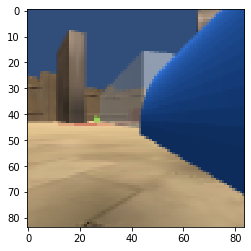

HotZone  prob =  0.26382196
Ramp  prob =  0.25181442
CylinderTunnel  prob =  0.2416515
ULObject  prob =  0.23840345
Wall  prob =  0.23269531
WallTransparent  prob =  0.20129465
DeathZone  prob =  0.19722919
CylinderTunnelTransparent  prob =  0.13673864
Cardbox  prob =  0.0310102
GoodGoalMulti  prob =  0.026671488
GoodGoal  prob =  0.014787192
BadGoal  prob =  0.005754187


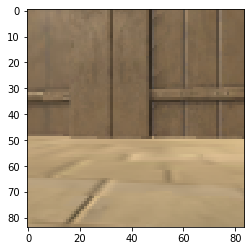

HotZone  prob =  0.99998283
Ramp  prob =  0.94330025
Wall  prob =  0.8238043
CylinderTunnel  prob =  4.3151875e-08
BadGoal  prob =  5.0758497e-20
Cardbox  prob =  3.935111e-20
DeathZone  prob =  4.6453643e-22
ULObject  prob =  2.1061655e-23
GoodGoal  prob =  4.186769e-25
WallTransparent  prob =  7.917482e-29
GoodGoalMulti  prob =  2.478485e-35
CylinderTunnelTransparent  prob =  0.0


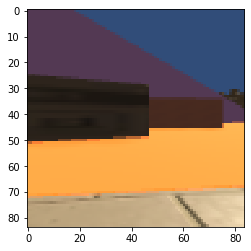

Wall  prob =  0.047539618
Ramp  prob =  0.04109564
CylinderTunnel  prob =  0.038747046
WallTransparent  prob =  0.033475306
BadGoal  prob =  0.021461263
CylinderTunnelTransparent  prob =  0.018296488
ULObject  prob =  0.016651044
HotZone  prob =  0.01575225
GoodGoal  prob =  0.013958492
DeathZone  prob =  0.0104968
GoodGoalMulti  prob =  0.006954806
Cardbox  prob =  0.006013384


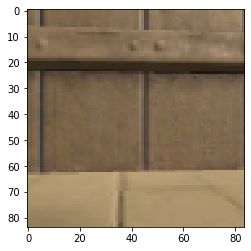

CylinderTunnel  prob =  0.7603711
Wall  prob =  0.74646676
Ramp  prob =  0.72518474
CylinderTunnelTransparent  prob =  0.04621214
Cardbox  prob =  0.004703419
WallTransparent  prob =  0.0012784998
BadGoal  prob =  3.0744766e-05
GoodGoalMulti  prob =  1.2600048e-05
GoodGoal  prob =  1.3109167e-06
HotZone  prob =  3.424322e-07
ULObject  prob =  2.3759776e-07
DeathZone  prob =  8.800023e-09


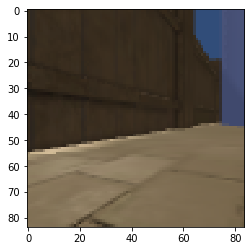

CylinderTunnel  prob =  0.9998393
Ramp  prob =  0.47250807
Wall  prob =  9.5217954e-05
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


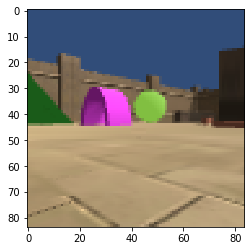

GoodGoalMulti  prob =  0.99993706
Wall  prob =  0.009699133
Ramp  prob =  0.0053289873
CylinderTunnel  prob =  0.001576372
WallTransparent  prob =  0.00081786385
HotZone  prob =  0.00013565901
GoodGoal  prob =  3.3236296e-07
BadGoal  prob =  3.0220977e-07
CylinderTunnelTransparent  prob =  7.6576214e-08
Cardbox  prob =  2.3628616e-10
DeathZone  prob =  3.0195058e-11
ULObject  prob =  1.7828485e-12


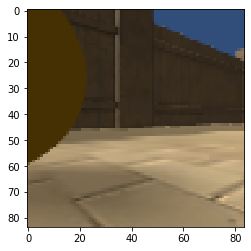

ULObject  prob =  0.99997437
CylinderTunnel  prob =  0.12034926
Wall  prob =  0.0034361782
Ramp  prob =  0.001376256
BadGoal  prob =  1.764714e-09
DeathZone  prob =  2.5321295e-10
HotZone  prob =  1.4904633e-13
WallTransparent  prob =  2.2492811e-17
GoodGoal  prob =  2.0411615e-17
Cardbox  prob =  2.0327148e-25
CylinderTunnelTransparent  prob =  3.5929795e-27
GoodGoalMulti  prob =  1.6036395e-28


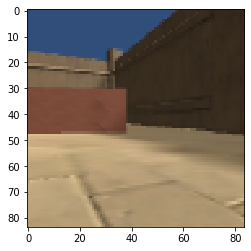

Wall  prob =  0.9927718
Ramp  prob =  0.9924171
CylinderTunnel  prob =  0.21009655
WallTransparent  prob =  3.1648524e-09
Cardbox  prob =  2.5365862e-10
BadGoal  prob =  3.1278998e-15
CylinderTunnelTransparent  prob =  3.8051814e-17
ULObject  prob =  6.295569e-18
GoodGoal  prob =  2.193338e-20
DeathZone  prob =  1.5327071e-24
HotZone  prob =  2.878378e-25
GoodGoalMulti  prob =  1.2612518e-31


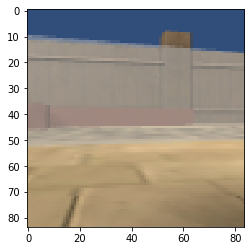

ULObject  prob =  0.99996996
Ramp  prob =  0.04554898
Wall  prob =  0.013355889
CylinderTunnel  prob =  0.0029141838
DeathZone  prob =  6.8860743e-07
BadGoal  prob =  1.7559522e-07
HotZone  prob =  5.914395e-08
WallTransparent  prob =  1.9377126e-12
GoodGoal  prob =  1.0132724e-12
Cardbox  prob =  2.1271945e-20
GoodGoalMulti  prob =  7.2513357e-23
CylinderTunnelTransparent  prob =  3.7216627e-23


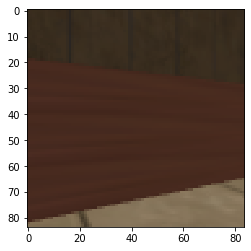

Ramp  prob =  0.88199466
CylinderTunnel  prob =  0.58792
Wall  prob =  0.5796926
HotZone  prob =  9.224203e-18
ULObject  prob =  1.5074238e-19
BadGoal  prob =  3.8582907e-21
Cardbox  prob =  2.0272012e-25
GoodGoal  prob =  1.0698504e-25
WallTransparent  prob =  1.2304593e-27
DeathZone  prob =  7.822495e-29
GoodGoalMulti  prob =  3.0507192e-34
CylinderTunnelTransparent  prob =  0.0


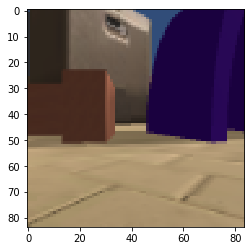

ULObject  prob =  0.99996924
Ramp  prob =  0.0064101536
Wall  prob =  0.0022912223
CylinderTunnel  prob =  1.2653342e-05
BadGoal  prob =  1.1188304e-11
DeathZone  prob =  3.802528e-16
HotZone  prob =  7.5089505e-27
WallTransparent  prob =  1.0883542e-31
GoodGoal  prob =  5.0260644e-34
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


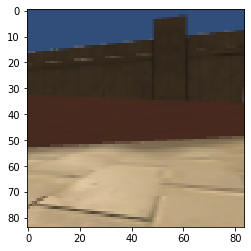

WallTransparent  prob =  0.066076845
Wall  prob =  0.060090136
Cardbox  prob =  0.048197273
Ramp  prob =  0.03799558
GoodGoalMulti  prob =  0.033242606
CylinderTunnelTransparent  prob =  0.02373019
CylinderTunnel  prob =  0.020425662
HotZone  prob =  0.011434331
ULObject  prob =  0.002466306
BadGoal  prob =  0.001211337
DeathZone  prob =  0.0010694951
GoodGoal  prob =  0.0008257377


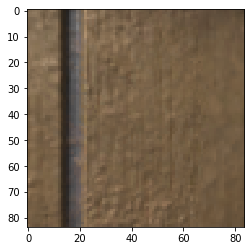

Ramp  prob =  0.22839141
Wall  prob =  0.2269096
CylinderTunnel  prob =  0.004137627
HotZone  prob =  0.0030817448
Cardbox  prob =  2.0460822e-08
ULObject  prob =  7.1640455e-10
BadGoal  prob =  4.603564e-11
DeathZone  prob =  2.506367e-12
WallTransparent  prob =  7.42299e-14
GoodGoal  prob =  8.482945e-15
GoodGoalMulti  prob =  4.447601e-19
CylinderTunnelTransparent  prob =  1.4439182e-20


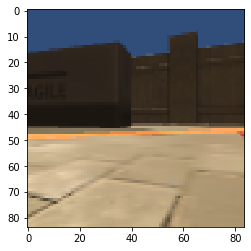

Ramp  prob =  0.73542196
Wall  prob =  0.006501648
CylinderTunnel  prob =  0.0035554876
DeathZone  prob =  4.6251357e-11
ULObject  prob =  9.761963e-12
BadGoal  prob =  5.083961e-12
GoodGoal  prob =  3.5366482e-12
WallTransparent  prob =  6.6132935e-19
HotZone  prob =  1.5529542e-22
Cardbox  prob =  2.1745767e-27
GoodGoalMulti  prob =  1.388228e-33
CylinderTunnelTransparent  prob =  0.0


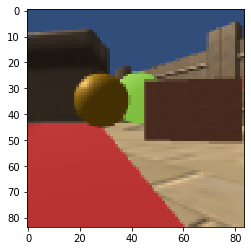

Ramp  prob =  0.8960244
CylinderTunnel  prob =  0.6266532
Wall  prob =  0.035914376
GoodGoal  prob =  1.5548998e-05
HotZone  prob =  6.596712e-20
BadGoal  prob =  1.3895292e-21
WallTransparent  prob =  1.0161533e-25
DeathZone  prob =  7.714979e-29
ULObject  prob =  3.0290172e-30
GoodGoalMulti  prob =  1.5039883e-35
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0


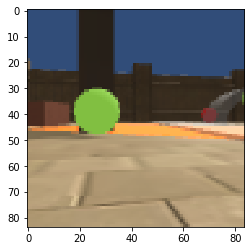

HotZone  prob =  0.9592798
Cardbox  prob =  0.81765485
Ramp  prob =  3.4553594e-13
ULObject  prob =  2.7529443e-14
Wall  prob =  5.9153215e-15
BadGoal  prob =  1.2100391e-19
DeathZone  prob =  3.710128e-21
WallTransparent  prob =  7.934563e-22
CylinderTunnel  prob =  5.913248e-22
GoodGoal  prob =  2.3974702e-27
GoodGoalMulti  prob =  1.7142965e-35
CylinderTunnelTransparent  prob =  0.0


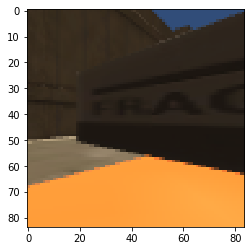

GoodGoalMulti
Ramp  prob =  0.75459343
Wall  prob =  0.0816814
CylinderTunnel  prob =  0.0050207926
GoodGoal  prob =  1.7967475e-14
WallTransparent  prob =  4.769384e-16
BadGoal  prob =  4.555544e-17
CylinderTunnelTransparent  prob =  6.016609e-25
HotZone  prob =  3.1205188e-25
DeathZone  prob =  9.109638e-27
Cardbox  prob =  4.019278e-29
ULObject  prob =  5.344802e-30
GoodGoalMulti  prob =  6.8594458e-34


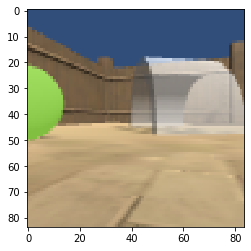

Cardbox  prob =  0.99987125
Ramp  prob =  0.02647123
CylinderTunnel  prob =  0.025492847
Wall  prob =  0.022764247
ULObject  prob =  2.8846193e-07
HotZone  prob =  1.3680875e-07
WallTransparent  prob =  9.389886e-08
GoodGoal  prob =  7.180071e-08
BadGoal  prob =  2.8936433e-09
GoodGoalMulti  prob =  2.3297557e-09
DeathZone  prob =  1.1768563e-09
CylinderTunnelTransparent  prob =  6.870607e-10


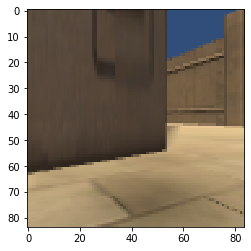

CylinderTunnel  prob =  0.8419284
Ramp  prob =  0.7680115
Wall  prob =  0.67411304
BadGoal  prob =  4.60083e-09
HotZone  prob =  1.2715317e-09
GoodGoalMulti  prob =  5.1089355e-11
GoodGoal  prob =  1.0063411e-11
WallTransparent  prob =  7.5541726e-12
ULObject  prob =  3.426361e-15
Cardbox  prob =  1.9059878e-15
CylinderTunnelTransparent  prob =  4.799096e-16
DeathZone  prob =  1.5316145e-16


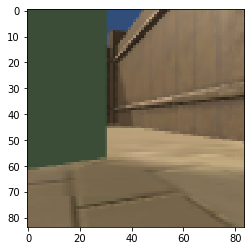

Ramp  prob =  0.86431986
Wall  prob =  0.7207023
CylinderTunnel  prob =  0.04059549
GoodGoal  prob =  0.027845139
WallTransparent  prob =  0.0004848253
BadGoal  prob =  3.034e-05
Cardbox  prob =  4.61648e-06
HotZone  prob =  1.1387227e-06
ULObject  prob =  7.2476354e-07
GoodGoalMulti  prob =  1.2796906e-07
DeathZone  prob =  1.2454107e-07
CylinderTunnelTransparent  prob =  1.0296077e-09


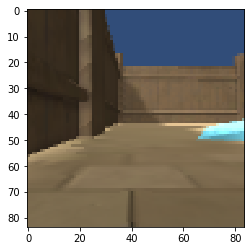

Ramp  prob =  0.9928953
Wall  prob =  0.34800068
CylinderTunnel  prob =  0.24163462
GoodGoal  prob =  3.634383e-23
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


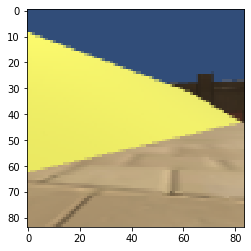

CylinderTunnel  prob =  0.99974424
Wall  prob =  0.1622635
Ramp  prob =  0.14648706
HotZone  prob =  5.5426224e-29
BadGoal  prob =  6.272706e-31
GoodGoal  prob =  4.4606624e-36
Cardbox  prob =  2.889528e-36
ULObject  prob =  2.180997e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


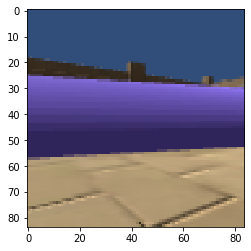

Cardbox  prob =  0.93935317
Ramp  prob =  0.3504692
Wall  prob =  0.32615033
CylinderTunnel  prob =  0.25537407
WallTransparent  prob =  0.20016187
CylinderTunnelTransparent  prob =  0.0853261
GoodGoalMulti  prob =  0.013678884
HotZone  prob =  0.011629841
DeathZone  prob =  0.0014237345
ULObject  prob =  0.000805758
GoodGoal  prob =  0.0002897636
BadGoal  prob =  0.00028654464


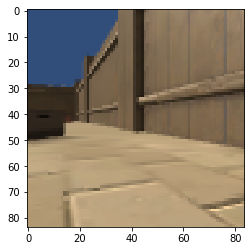

Ramp  prob =  0.34617895
Wall  prob =  0.09111384
GoodGoal  prob =  0.05027288
CylinderTunnel  prob =  5.9862066e-07
DeathZone  prob =  3.7546457e-08
WallTransparent  prob =  8.4714093e-13
ULObject  prob =  5.2243715e-17
HotZone  prob =  2.0433321e-20
BadGoal  prob =  6.4470393e-22
GoodGoalMulti  prob =  8.411868e-28
Cardbox  prob =  3.3827756e-30
CylinderTunnelTransparent  prob =  0.0


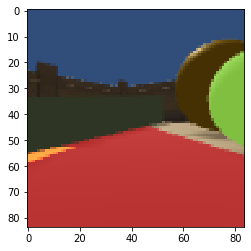

GoodGoalMulti  prob =  0.9981748
CylinderTunnel  prob =  0.025920924
Ramp  prob =  2.4845099e-06
Wall  prob =  1.0166846e-06
BadGoal  prob =  6.454834e-09
HotZone  prob =  2.2473955e-16
GoodGoal  prob =  8.923942e-19
WallTransparent  prob =  5.39619e-20
CylinderTunnelTransparent  prob =  5.176532e-21
Cardbox  prob =  1.4032924e-23
ULObject  prob =  2.3662809e-32
DeathZone  prob =  6.325178e-33


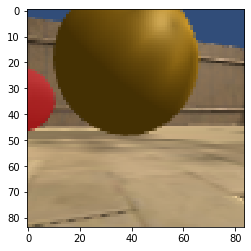

CylinderTunnel  prob =  0.9991192
Ramp  prob =  0.1745564
Wall  prob =  0.0770596
ULObject  prob =  1.1698504e-22
Cardbox  prob =  4.2785834e-28
HotZone  prob =  3.3865718e-30
BadGoal  prob =  5.10306e-31
GoodGoal  prob =  1.3891087e-31
WallTransparent  prob =  1.066334e-33
DeathZone  prob =  1.1433612e-37
GoodGoalMulti  prob =  3.765589e-39
CylinderTunnelTransparent  prob =  0.0


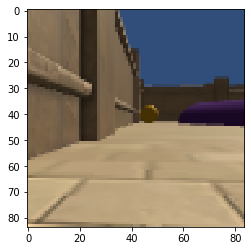

DeathZone  prob =  0.9997998
Ramp  prob =  0.7578461
Wall  prob =  0.014565938
GoodGoal  prob =  7.649833e-10
CylinderTunnel  prob =  2.959721e-10
ULObject  prob =  8.974077e-22
WallTransparent  prob =  1.8971241e-22
BadGoal  prob =  1.250585e-27
HotZone  prob =  1.2337604e-32
Cardbox  prob =  1.5522171e-33
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


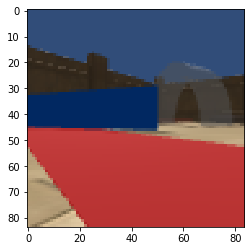

HotZone  prob =  0.36209917
Ramp  prob =  0.15824999
WallTransparent  prob =  0.14294896
DeathZone  prob =  0.13738757
ULObject  prob =  0.13688271
Wall  prob =  0.13017087
CylinderTunnel  prob =  0.123645276
CylinderTunnelTransparent  prob =  0.092419915
GoodGoalMulti  prob =  0.04969685
Cardbox  prob =  0.039379213
BadGoal  prob =  0.028626869
GoodGoal  prob =  0.026223138


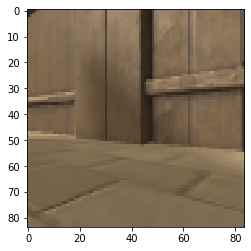

ULObject  prob =  0.28132153
DeathZone  prob =  0.18763044
Ramp  prob =  0.17550087
CylinderTunnel  prob =  0.15877248
HotZone  prob =  0.13363832
Wall  prob =  0.13194148
WallTransparent  prob =  0.13104367
CylinderTunnelTransparent  prob =  0.10068617
GoodGoal  prob =  0.08286374
GoodGoalMulti  prob =  0.081411354
Cardbox  prob =  0.06735939
BadGoal  prob =  0.06486104


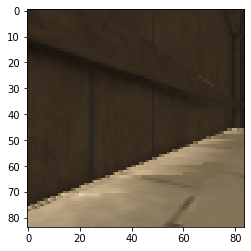

Wall  prob =  0.89493656
Ramp  prob =  0.8690225
CylinderTunnel  prob =  0.78467953
Cardbox  prob =  2.065578e-06
HotZone  prob =  9.569562e-14
GoodGoal  prob =  9.296345e-16
ULObject  prob =  4.2113438e-16
BadGoal  prob =  3.7535547e-17
DeathZone  prob =  6.007497e-20
GoodGoalMulti  prob =  6.7037804e-23
WallTransparent  prob =  1.0438756e-26
CylinderTunnelTransparent  prob =  0.0


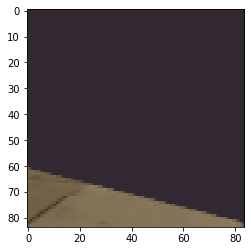

Ramp  prob =  0.87227106
CylinderTunnel  prob =  0.81725144
Wall  prob =  0.74137425
Cardbox  prob =  9.370587e-07
ULObject  prob =  6.99682e-11
HotZone  prob =  1.3621632e-12
BadGoal  prob =  3.4822856e-14
GoodGoal  prob =  1.2736402e-14
DeathZone  prob =  7.583546e-17
GoodGoalMulti  prob =  8.949544e-19
WallTransparent  prob =  2.989977e-20
CylinderTunnelTransparent  prob =  2.031479e-28


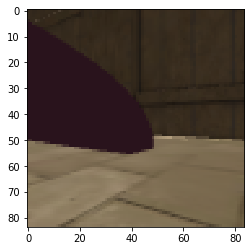

DeathZone  prob =  1.0
Ramp  prob =  0.6416726
Wall  prob =  0.003960184
CylinderTunnel  prob =  2.670572e-14
WallTransparent  prob =  4.2482085e-18
BadGoal  prob =  2.8629147e-18
ULObject  prob =  4.9793725e-24
GoodGoal  prob =  1.1529318e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


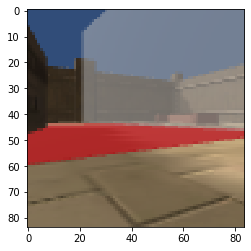

Ramp  prob =  0.5195717
Wall  prob =  0.47388232
WallTransparent  prob =  0.4671426
CylinderTunnel  prob =  0.37314838
ULObject  prob =  0.37011832
HotZone  prob =  0.36593765
DeathZone  prob =  0.3652682
CylinderTunnelTransparent  prob =  0.33118945
Cardbox  prob =  0.175175
GoodGoalMulti  prob =  0.11814326
GoodGoal  prob =  0.072460614
BadGoal  prob =  0.04920171


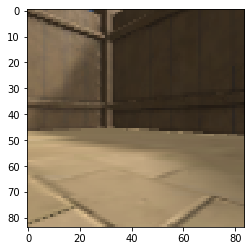

ULObject  prob =  0.99996805
Ramp  prob =  0.030892268
Wall  prob =  0.013975028
CylinderTunnel  prob =  0.0023314196
HotZone  prob =  3.6777436e-07
DeathZone  prob =  7.9527324e-10
BadGoal  prob =  2.8822508e-10
GoodGoal  prob =  4.6636092e-14
WallTransparent  prob =  5.0026808e-15
Cardbox  prob =  8.01204e-20
GoodGoalMulti  prob =  2.6391548e-23
CylinderTunnelTransparent  prob =  4.435963e-25


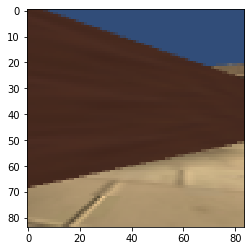

CylinderTunnel  prob =  0.848866
Ramp  prob =  0.18335725
Wall  prob =  0.00012934573
GoodGoal  prob =  2.8991417e-08
BadGoal  prob =  2.1991016e-09
DeathZone  prob =  1.0314121e-24
Cardbox  prob =  1.4123285e-26
HotZone  prob =  1.0081396e-29
ULObject  prob =  5.870693e-32
WallTransparent  prob =  4.833883e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


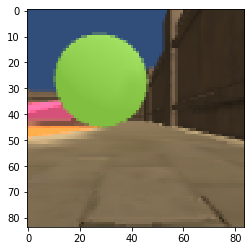

BadGoal  prob =  0.99486154
CylinderTunnel  prob =  0.0068168645
Wall  prob =  0.0025595678
Ramp  prob =  0.001180584
GoodGoal  prob =  7.264566e-06
ULObject  prob =  3.2667984e-09
HotZone  prob =  1.2683923e-09
WallTransparent  prob =  9.9700866e-11
DeathZone  prob =  6.260984e-11
Cardbox  prob =  6.2238948e-15
GoodGoalMulti  prob =  3.0176901e-16
CylinderTunnelTransparent  prob =  4.7458648e-23


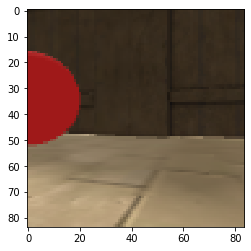

Ramp  prob =  0.9572821
Wall  prob =  0.15419762
CylinderTunnel  prob =  0.035173412
GoodGoal  prob =  1.313587e-09
DeathZone  prob =  2.2126276e-17
Cardbox  prob =  1.0569166e-21
HotZone  prob =  2.1578479e-23
ULObject  prob =  1.5171051e-25
BadGoal  prob =  1.2196497e-28
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


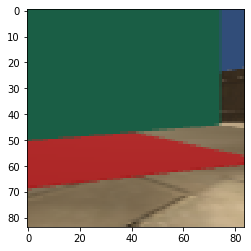

DeathZone  prob =  0.25252375
ULObject  prob =  0.23357342
HotZone  prob =  0.23206973
Wall  prob =  0.22785082
Ramp  prob =  0.22224163
WallTransparent  prob =  0.19710426
CylinderTunnel  prob =  0.17094715
GoodGoal  prob =  0.14358623
CylinderTunnelTransparent  prob =  0.12889367
Cardbox  prob =  0.09774395
GoodGoalMulti  prob =  0.08479998
BadGoal  prob =  0.068009935


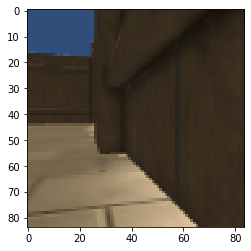

Ramp  prob =  0.8370134
Wall  prob =  0.1322337
CylinderTunnel  prob =  0.022751972
HotZone  prob =  7.863897e-23
BadGoal  prob =  6.1179522e-27
GoodGoalMulti  prob =  9.0268156e-29
GoodGoal  prob =  1.4367838e-31
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


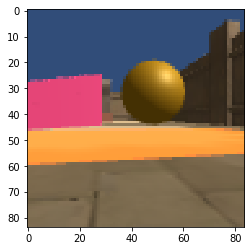

CylinderTunnel  prob =  0.98619497
Ramp  prob =  0.9691537
Wall  prob =  0.009478932
Cardbox  prob =  1.5294547e-23
HotZone  prob =  6.522091e-29
BadGoal  prob =  3.7668716e-29
ULObject  prob =  2.6016623e-29
GoodGoal  prob =  4.0602346e-31
DeathZone  prob =  5.638259e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


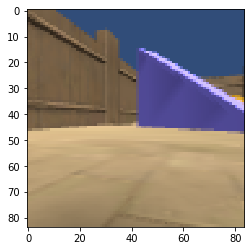

Ramp  prob =  0.3915991
HotZone  prob =  0.3380965
WallTransparent  prob =  0.33680618
Wall  prob =  0.33354312
CylinderTunnel  prob =  0.28360125
DeathZone  prob =  0.27401286
ULObject  prob =  0.25410324
CylinderTunnelTransparent  prob =  0.19742791
Cardbox  prob =  0.047109753
GoodGoalMulti  prob =  0.019314833
BadGoal  prob =  0.013340435
GoodGoal  prob =  0.012771104


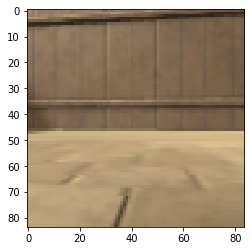

Wall  prob =  0.88642925
Ramp  prob =  0.81433254
CylinderTunnel  prob =  0.7070737
HotZone  prob =  1.2143269e-17
GoodGoal  prob =  9.4960754e-20
BadGoal  prob =  1.6437363e-21
Cardbox  prob =  2.3652321e-26
ULObject  prob =  7.70918e-30
DeathZone  prob =  3.9746267e-33
GoodGoalMulti  prob =  1.6393913e-35
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


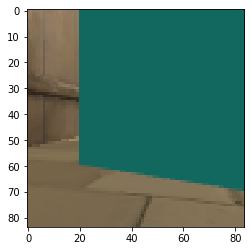

Wall  prob =  0.49583125
Ramp  prob =  0.3917616
CylinderTunnel  prob =  0.17405994
Cardbox  prob =  0.102002695
DeathZone  prob =  6.9960806e-06
ULObject  prob =  4.45165e-06
BadGoal  prob =  3.1279055e-07
GoodGoal  prob =  6.669355e-09
WallTransparent  prob =  6.0460157e-09
HotZone  prob =  1.4071216e-09
CylinderTunnelTransparent  prob =  8.2534875e-11
GoodGoalMulti  prob =  1.7475073e-13


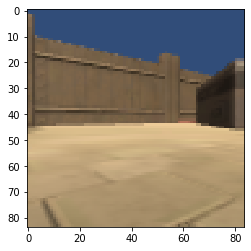

Ramp  prob =  0.40732935
WallTransparent  prob =  0.38155928
Wall  prob =  0.38085583
HotZone  prob =  0.37979084
DeathZone  prob =  0.3575453
CylinderTunnel  prob =  0.32114884
ULObject  prob =  0.30008945
CylinderTunnelTransparent  prob =  0.25413007
Cardbox  prob =  0.064906925
BadGoal  prob =  0.016505644
GoodGoalMulti  prob =  0.015940433
GoodGoal  prob =  0.014362571


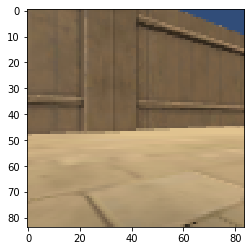

ULObject  prob =  0.60427713
Ramp  prob =  0.55954295
WallTransparent  prob =  0.5568554
HotZone  prob =  0.55162996
DeathZone  prob =  0.5272261
Wall  prob =  0.5225536
CylinderTunnelTransparent  prob =  0.40056854
CylinderTunnel  prob =  0.3947309
Cardbox  prob =  0.1476017
BadGoal  prob =  0.025287928
GoodGoal  prob =  0.024695093
GoodGoalMulti  prob =  0.0208305


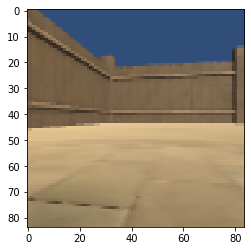

WallTransparent  prob =  0.335007
HotZone  prob =  0.3238163
ULObject  prob =  0.3190408
Ramp  prob =  0.31283116
DeathZone  prob =  0.304845
Wall  prob =  0.28750297
CylinderTunnel  prob =  0.27659208
CylinderTunnelTransparent  prob =  0.27094215
GoodGoalMulti  prob =  0.19974437
Cardbox  prob =  0.19959204
GoodGoal  prob =  0.08448907
BadGoal  prob =  0.07542793


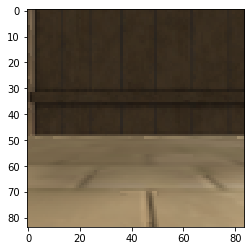

Ramp  prob =  0.99975723
CylinderTunnel  prob =  0.13315673
Wall  prob =  0.12655084
ULObject  prob =  6.075205e-20
DeathZone  prob =  2.4180712e-20
BadGoal  prob =  2.6720842e-26
GoodGoal  prob =  1.4906505e-36
HotZone  prob =  1.4699879e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


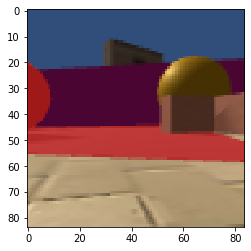

ULObject  prob =  0.99958664
Ramp  prob =  0.08506315
Wall  prob =  0.053438727
CylinderTunnel  prob =  0.027057903
DeathZone  prob =  6.7694636e-08
HotZone  prob =  5.3954583e-09
BadGoal  prob =  6.7610567e-10
WallTransparent  prob =  2.841183e-14
GoodGoal  prob =  1.1317013e-15
Cardbox  prob =  3.8568026e-22
CylinderTunnelTransparent  prob =  7.37947e-25
GoodGoalMulti  prob =  9.079525e-27


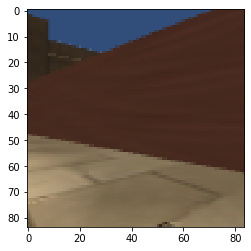

Ramp  prob =  0.99249274
Wall  prob =  0.66129845
CylinderTunnel  prob =  2.6068168e-05
HotZone  prob =  3.1331152e-07
GoodGoal  prob =  1.3444184e-26
BadGoal  prob =  2.7932759e-28
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


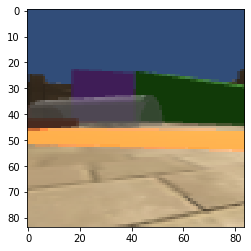

Wall  prob =  0.9554935
Ramp  prob =  0.7493808
CylinderTunnel  prob =  0.053266387
Cardbox  prob =  4.2132635e-20
HotZone  prob =  3.6117084e-35
BadGoal  prob =  1.7129555e-36
GoodGoal  prob =  8.471006e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


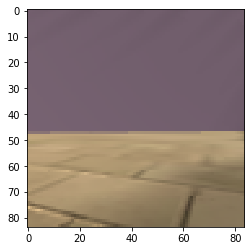

Ramp  prob =  0.42782047
HotZone  prob =  0.39310113
WallTransparent  prob =  0.36353335
Wall  prob =  0.35714987
DeathZone  prob =  0.3296333
CylinderTunnel  prob =  0.32215452
ULObject  prob =  0.30642995
CylinderTunnelTransparent  prob =  0.252331
Cardbox  prob =  0.054230735
GoodGoalMulti  prob =  0.011709421
GoodGoal  prob =  0.010671162
BadGoal  prob =  0.009515391


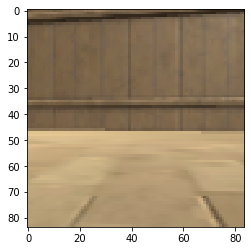

ULObject  prob =  0.09646936
CylinderTunnel  prob =  0.053955205
Wall  prob =  0.052128494
Ramp  prob =  0.04865688
HotZone  prob =  0.04422817
WallTransparent  prob =  0.041180197
Cardbox  prob =  0.032593857
DeathZone  prob =  0.02591576
GoodGoalMulti  prob =  0.024251882
CylinderTunnelTransparent  prob =  0.024198657
GoodGoal  prob =  0.011462867
BadGoal  prob =  0.008555463


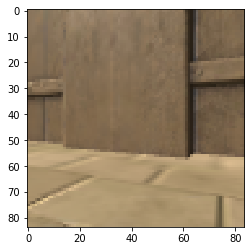

CylinderTunnel  prob =  0.98627937
Ramp  prob =  0.033565946
BadGoal  prob =  0.018433392
Wall  prob =  0.0056911553
HotZone  prob =  2.077157e-09
Cardbox  prob =  2.769482e-10
DeathZone  prob =  2.0908723e-11
ULObject  prob =  1.3785328e-12
GoodGoal  prob =  6.5505565e-13
WallTransparent  prob =  1.1875663e-14
GoodGoalMulti  prob =  2.360837e-23
CylinderTunnelTransparent  prob =  2.3635017e-25


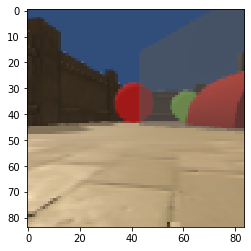

DeathZone  prob =  0.9982986
ULObject  prob =  0.4647631
Wall  prob =  0.0013108173
BadGoal  prob =  0.0012866588
Ramp  prob =  0.0011639505
CylinderTunnel  prob =  2.3988805e-06
GoodGoal  prob =  2.6225385e-07
WallTransparent  prob =  2.5888003e-08
HotZone  prob =  2.368337e-08
Cardbox  prob =  5.6587342e-11
CylinderTunnelTransparent  prob =  1.890777e-11
GoodGoalMulti  prob =  1.5527466e-15


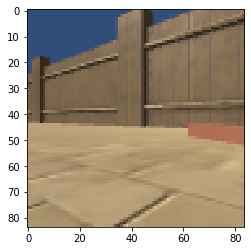

Ramp  prob =  0.9906294
CylinderTunnel  prob =  0.23843558
Wall  prob =  0.01278255
Cardbox  prob =  7.835311e-28
BadGoal  prob =  4.486572e-34
ULObject  prob =  1.5059977e-35
HotZone  prob =  7.786889e-36
GoodGoal  prob =  1.1853714e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


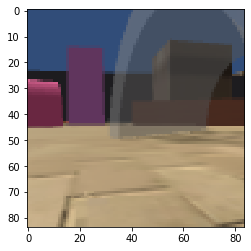

BadGoal  prob =  0.06230292
CylinderTunnel  prob =  0.043268498
Ramp  prob =  0.027418878
Wall  prob =  0.000857633
DeathZone  prob =  3.024594e-05
ULObject  prob =  2.4046183e-06
GoodGoal  prob =  2.4031397e-06
WallTransparent  prob =  2.4877673e-09
HotZone  prob =  1.4794881e-09
Cardbox  prob =  9.235591e-11
GoodGoalMulti  prob =  4.8009294e-15
CylinderTunnelTransparent  prob =  1.0181316e-26


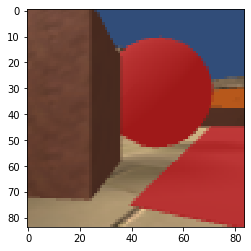

Ramp  prob =  0.4628744
Wall  prob =  0.07973474
DeathZone  prob =  8.837509e-07
HotZone  prob =  2.7731582e-08
CylinderTunnel  prob =  1.22691935e-14
BadGoal  prob =  5.6659175e-18
ULObject  prob =  5.3764796e-22
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


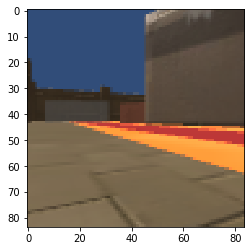

ULObject  prob =  0.5672078
Ramp  prob =  0.43048713
Wall  prob =  0.4138789
CylinderTunnel  prob =  0.35895237
DeathZone  prob =  0.3476953
HotZone  prob =  0.31539094
WallTransparent  prob =  0.26102698
CylinderTunnelTransparent  prob =  0.23069496
BadGoal  prob =  0.15649211
Cardbox  prob =  0.04863889
GoodGoalMulti  prob =  0.02225152
GoodGoal  prob =  0.018511185


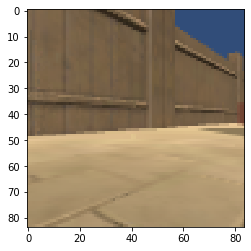

Cardbox  prob =  0.99923563
Ramp  prob =  0.12696308
CylinderTunnel  prob =  0.10942972
Wall  prob =  0.073484644
GoodGoal  prob =  3.9884567e-06
BadGoal  prob =  8.8196583e-07
ULObject  prob =  1.4260264e-07
DeathZone  prob =  5.787668e-08
HotZone  prob =  1.2372679e-08
WallTransparent  prob =  9.35854e-09
CylinderTunnelTransparent  prob =  1.1435063e-09
GoodGoalMulti  prob =  6.727393e-10


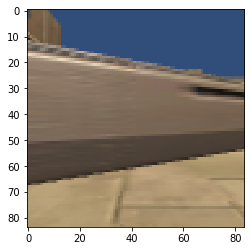

Wall  prob =  0.9461081
Ramp  prob =  0.8738991
HotZone  prob =  0.0013224083
CylinderTunnel  prob =  0.00012419303
GoodGoal  prob =  1.2406797e-05
BadGoal  prob =  1.4092157e-14
ULObject  prob =  4.760756e-21
DeathZone  prob =  4.7978058e-27
Cardbox  prob =  3.1046287e-27
GoodGoalMulti  prob =  1.7539999e-27
WallTransparent  prob =  7.9080824e-32
CylinderTunnelTransparent  prob =  0.0


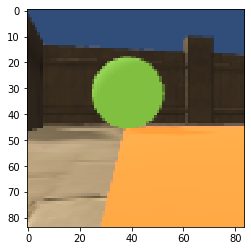

GoodGoal  prob =  0.9998411
CylinderTunnel  prob =  0.0005686529
Wall  prob =  8.628964e-06
Ramp  prob =  8.4327985e-06
BadGoal  prob =  3.5828666e-11
HotZone  prob =  1.14651e-15
DeathZone  prob =  6.250799e-17
ULObject  prob =  4.303303e-19
WallTransparent  prob =  2.0257926e-19
Cardbox  prob =  3.5455928e-22
GoodGoalMulti  prob =  1.2942568e-26
CylinderTunnelTransparent  prob =  0.0


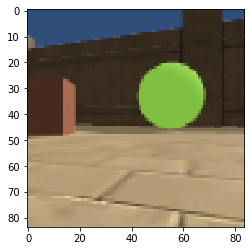

ULObject  prob =  0.9999926
Wall  prob =  0.004104938
Ramp  prob =  0.0037912487
CylinderTunnel  prob =  0.00025963035
DeathZone  prob =  5.611989e-11
BadGoal  prob =  4.396454e-12
HotZone  prob =  1.7174926e-14
WallTransparent  prob =  1.7453585e-17
GoodGoal  prob =  2.4574248e-20
Cardbox  prob =  4.015114e-27
CylinderTunnelTransparent  prob =  9.28253e-30
GoodGoalMulti  prob =  5.734605e-34


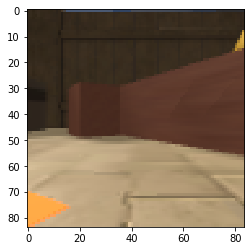

Ramp  prob =  0.8981102
CylinderTunnel  prob =  0.8312308
Wall  prob =  0.6843434
BadGoal  prob =  1.5214529e-16
Cardbox  prob =  1.5041103e-18
GoodGoal  prob =  6.192358e-20
HotZone  prob =  4.106207e-20
WallTransparent  prob =  1.14913425e-20
ULObject  prob =  5.926026e-23
GoodGoalMulti  prob =  2.7228123e-26
DeathZone  prob =  1.0029399e-26
CylinderTunnelTransparent  prob =  2.720923e-33


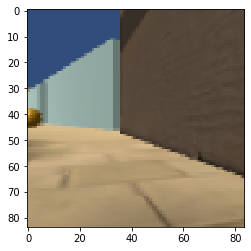

GoodGoalMulti  prob =  0.1745212
WallTransparent  prob =  0.15927678
Wall  prob =  0.084209
CylinderTunnelTransparent  prob =  0.083170705
HotZone  prob =  0.07667675
Ramp  prob =  0.07124675
Cardbox  prob =  0.051842123
CylinderTunnel  prob =  0.049943805
BadGoal  prob =  0.032217983
ULObject  prob =  0.024538366
DeathZone  prob =  0.018225212
GoodGoal  prob =  0.015103482


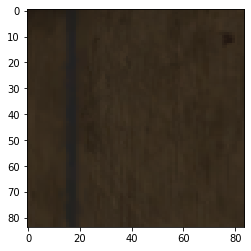

HotZone  prob =  0.9999366
Ramp  prob =  0.001662245
Wall  prob =  0.0012716945
CylinderTunnel  prob =  3.945935e-12
ULObject  prob =  7.0429714e-15
DeathZone  prob =  5.8660344e-18
BadGoal  prob =  9.354668e-20
WallTransparent  prob =  3.128054e-23
Cardbox  prob =  3.017397e-27
GoodGoal  prob =  1.183908e-27
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


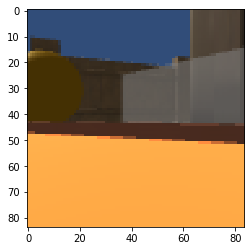

Ramp  prob =  0.99703395
CylinderTunnel  prob =  0.35409313
Wall  prob =  0.09587586
WallTransparent  prob =  1.1990674e-10
BadGoal  prob =  7.0862092e-12
CylinderTunnelTransparent  prob =  5.692329e-17
Cardbox  prob =  2.8717963e-18
GoodGoal  prob =  1.0735822e-19
HotZone  prob =  5.3925245e-21
ULObject  prob =  2.916123e-23
GoodGoalMulti  prob =  7.0789105e-28
DeathZone  prob =  4.078819e-30


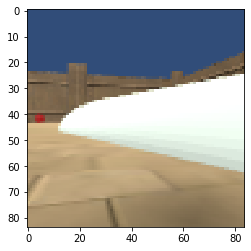

ULObject  prob =  0.9998708
CylinderTunnel  prob =  0.029692633
Wall  prob =  0.00948772
Ramp  prob =  0.00831544
BadGoal  prob =  9.891909e-08
DeathZone  prob =  3.30708e-08
HotZone  prob =  1.9818932e-13
GoodGoal  prob =  5.1612394e-14
WallTransparent  prob =  5.1298335e-14
Cardbox  prob =  1.7654618e-16
CylinderTunnelTransparent  prob =  5.200446e-19
GoodGoalMulti  prob =  1.28476e-23


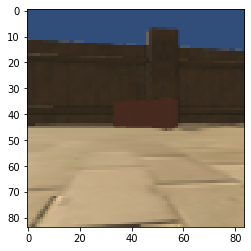

CylinderTunnel  prob =  0.9997595
Ramp  prob =  0.08691614
Wall  prob =  0.004867138
GoodGoalMulti  prob =  2.4180256e-12
HotZone  prob =  1.3298372e-16
WallTransparent  prob =  2.9317445e-19
BadGoal  prob =  1.15832815e-20
GoodGoal  prob =  1.0315587e-22
ULObject  prob =  1.718372e-24
Cardbox  prob =  9.640833e-28
CylinderTunnelTransparent  prob =  5.100163e-30
DeathZone  prob =  4.482969e-31


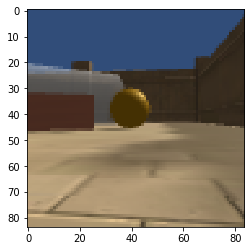

Ramp  prob =  0.98990434
CylinderTunnel  prob =  0.96970963
Wall  prob =  0.32597557
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


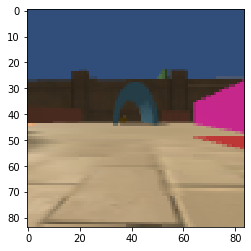

CylinderTunnel  prob =  0.9944981
Ramp  prob =  0.4485749
Wall  prob =  0.2708456
Cardbox  prob =  4.437183e-32
BadGoal  prob =  3.835507e-33
HotZone  prob =  1.4515181e-34
GoodGoal  prob =  1.0051514e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


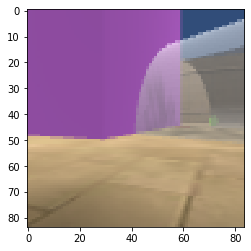

HotZone  prob =  0.3294659
ULObject  prob =  0.2666391
DeathZone  prob =  0.25607884
Ramp  prob =  0.18710323
WallTransparent  prob =  0.17768525
Wall  prob =  0.1594962
Cardbox  prob =  0.15728831
CylinderTunnel  prob =  0.15347302
CylinderTunnelTransparent  prob =  0.13208991
BadGoal  prob =  0.10443753
GoodGoalMulti  prob =  0.10118524
GoodGoal  prob =  0.08410149


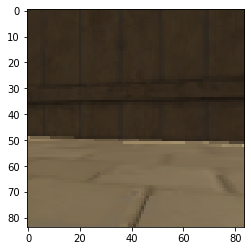

GoodGoal  prob =  0.99999976
CylinderTunnel  prob =  0.00027374123
Ramp  prob =  0.00023123797
Wall  prob =  0.0001617693
WallTransparent  prob =  1.5133126e-11
BadGoal  prob =  1.1839488e-12
DeathZone  prob =  1.4261379e-13
HotZone  prob =  1.9120064e-19
ULObject  prob =  2.977298e-20
GoodGoalMulti  prob =  1.3593713e-22
Cardbox  prob =  4.3172635e-26
CylinderTunnelTransparent  prob =  2.3838807e-28


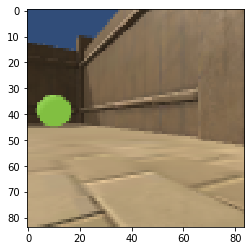

Ramp  prob =  0.99298286
CylinderTunnel  prob =  0.4757176
Wall  prob =  0.009111511
GoodGoal  prob =  2.5727255e-29
WallTransparent  prob =  1.8840857e-36
BadGoal  prob =  1.015655e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


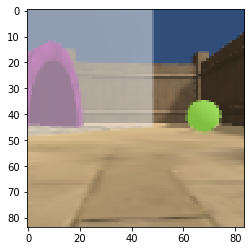

Ramp  prob =  0.9684956
Wall  prob =  0.68680257
CylinderTunnel  prob =  0.08301883
ULObject  prob =  0.009691758
HotZone  prob =  0.00038213216
DeathZone  prob =  0.00037225548
BadGoal  prob =  3.3793213e-10
GoodGoal  prob =  4.295249e-12
WallTransparent  prob =  4.0050312e-13
Cardbox  prob =  5.476267e-16
GoodGoalMulti  prob =  2.0277025e-19
CylinderTunnelTransparent  prob =  8.534105e-21


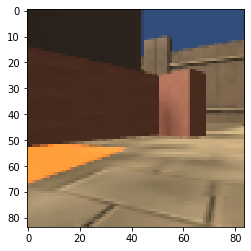

Cardbox  prob =  0.99998176
Ramp  prob =  0.051794473
Wall  prob =  0.033366993
CylinderTunnel  prob =  0.02542504
WallTransparent  prob =  0.00014066965
GoodGoal  prob =  2.9557825e-05
DeathZone  prob =  2.2984097e-05
CylinderTunnelTransparent  prob =  1.3708415e-05
ULObject  prob =  1.1783486e-05
HotZone  prob =  4.109416e-06
BadGoal  prob =  3.5964913e-06
GoodGoalMulti  prob =  6.355879e-08


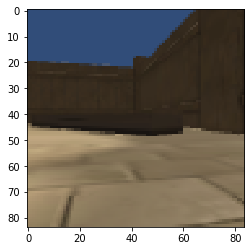

HotZone  prob =  1.0
Ramp  prob =  1.2043097e-07
Wall  prob =  2.8544422e-10
Cardbox  prob =  5.073114e-11
ULObject  prob =  5.97772e-13
WallTransparent  prob =  5.764283e-18
DeathZone  prob =  3.1175194e-18
CylinderTunnel  prob =  1.1459879e-18
BadGoal  prob =  3.8660933e-24
GoodGoal  prob =  2.4206084e-28
GoodGoalMulti  prob =  1.0065732e-34
CylinderTunnelTransparent  prob =  0.0


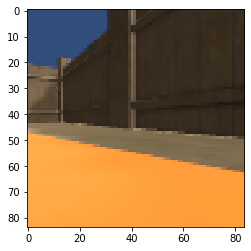

HotZone  prob =  0.9999963
Ramp  prob =  5.836049e-06
Wall  prob =  1.0396151e-08
ULObject  prob =  5.1860183e-10
Cardbox  prob =  3.426551e-11
CylinderTunnel  prob =  1.154261e-13
BadGoal  prob =  2.1866018e-15
WallTransparent  prob =  2.1306099e-16
DeathZone  prob =  3.8814755e-17
GoodGoal  prob =  4.826759e-18
GoodGoalMulti  prob =  2.5835347e-21
CylinderTunnelTransparent  prob =  3.092782e-36


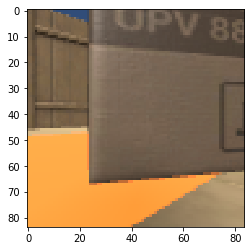

DeathZone  prob =  0.51309574
Ramp  prob =  0.22683486
ULObject  prob =  0.0022188902
Wall  prob =  0.0006015065
CylinderTunnel  prob =  1.5437747e-08
BadGoal  prob =  3.5737612e-19
GoodGoal  prob =  1.5459563e-29
HotZone  prob =  1.571216e-32
WallTransparent  prob =  3.8734677e-35
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


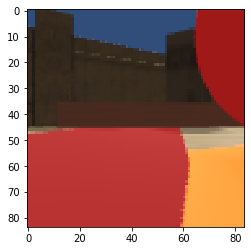

ULObject  prob =  0.098404504
CylinderTunnel  prob =  0.08442369
Ramp  prob =  0.079563
Wall  prob =  0.067156665
BadGoal  prob =  0.042870693
GoodGoal  prob =  0.04093082
HotZone  prob =  0.037189133
DeathZone  prob =  0.031675555
WallTransparent  prob =  0.030447405
GoodGoalMulti  prob =  0.023853986
CylinderTunnelTransparent  prob =  0.016606301
Cardbox  prob =  0.014820748


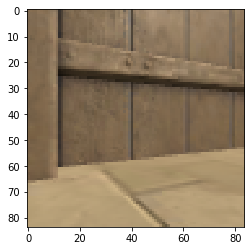

GoodGoalMulti  prob =  0.9999912
CylinderTunnel  prob =  0.017112533
Ramp  prob =  0.008183539
Wall  prob =  0.0039911177
WallTransparent  prob =  3.473787e-18
HotZone  prob =  3.893719e-20
GoodGoal  prob =  3.465306e-24
CylinderTunnelTransparent  prob =  1.6019418e-33
BadGoal  prob =  3.1221934e-35
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


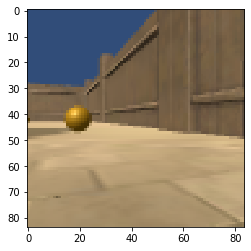

DeathZone
Cardbox  prob =  0.99999
Wall  prob =  0.001444581
CylinderTunnel  prob =  0.0012202623
Ramp  prob =  0.0009291924
CylinderTunnelTransparent  prob =  2.0876365e-07
WallTransparent  prob =  5.840375e-08
BadGoal  prob =  3.703418e-10
DeathZone  prob =  3.6861646e-11
GoodGoalMulti  prob =  2.6430046e-11
GoodGoal  prob =  1.2777809e-11
HotZone  prob =  6.769915e-12
ULObject  prob =  1.0683974e-12


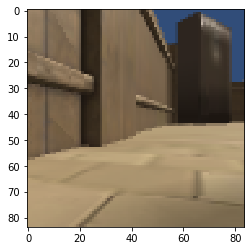

HotZone  prob =  0.38916576
Ramp  prob =  0.35823968
DeathZone  prob =  0.35718516
Wall  prob =  0.33086905
WallTransparent  prob =  0.2945118
ULObject  prob =  0.271395
CylinderTunnel  prob =  0.25774956
CylinderTunnelTransparent  prob =  0.22978121
Cardbox  prob =  0.06524491
GoodGoal  prob =  0.02609931
GoodGoalMulti  prob =  0.020496901
BadGoal  prob =  0.019265633


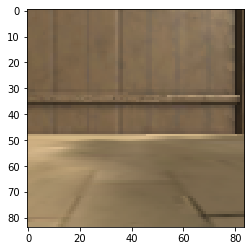

CylinderTunnel  prob =  0.9696963
Ramp  prob =  0.91240144
Wall  prob =  0.031048287
BadGoal  prob =  9.328087e-27
HotZone  prob =  5.3502285e-30
WallTransparent  prob =  4.5841553e-30
ULObject  prob =  4.87402e-31
Cardbox  prob =  2.0854631e-34
CylinderTunnelTransparent  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


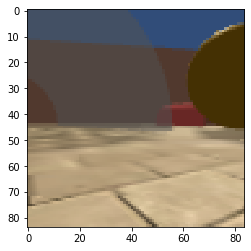

ULObject  prob =  0.9965468
Wall  prob =  0.19745864
Ramp  prob =  0.088972904
CylinderTunnel  prob =  0.029197438
HotZone  prob =  1.2603617e-07
DeathZone  prob =  2.4128186e-09
BadGoal  prob =  1.3314866e-09
WallTransparent  prob =  3.6527484e-13
GoodGoal  prob =  2.2420214e-13
Cardbox  prob =  2.5743806e-17
GoodGoalMulti  prob =  1.39583e-21
CylinderTunnelTransparent  prob =  3.1535155e-22


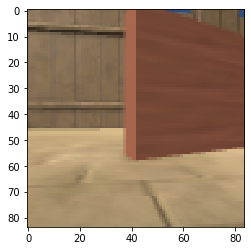

Cardbox  prob =  0.93614656
WallTransparent  prob =  0.42220053
CylinderTunnelTransparent  prob =  0.32850698
ULObject  prob =  0.1654662
Wall  prob =  0.16480336
Ramp  prob =  0.15436883
HotZone  prob =  0.14747672
DeathZone  prob =  0.13789505
CylinderTunnel  prob =  0.13217567
GoodGoalMulti  prob =  0.0913612
BadGoal  prob =  0.0678723
GoodGoal  prob =  0.05003569


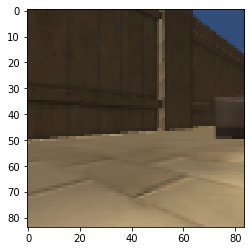

Wall  prob =  0.98895943
Ramp  prob =  0.7326242
CylinderTunnel  prob =  0.0028854623
HotZone  prob =  2.5934153e-16
BadGoal  prob =  1.7363845e-27
GoodGoal  prob =  2.9451371e-28
DeathZone  prob =  2.0199126e-34
ULObject  prob =  1.3338386e-34
GoodGoalMulti  prob =  2.256091e-36
Cardbox  prob =  9.719438e-38
WallTransparent  prob =  7.947945e-39
CylinderTunnelTransparent  prob =  0.0


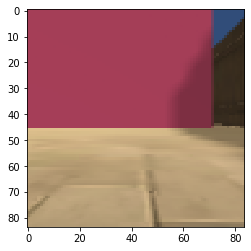

Ramp  prob =  0.873565
CylinderTunnel  prob =  0.8092013
Wall  prob =  0.7965958
HotZone  prob =  5.284365e-16
GoodGoal  prob =  1.0674753e-22
BadGoal  prob =  2.567319e-25
ULObject  prob =  9.003508e-27
Cardbox  prob =  2.7146873e-29
DeathZone  prob =  4.3138384e-34
GoodGoalMulti  prob =  3.7706142e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


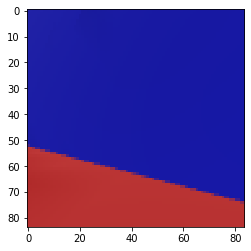

HotZone  prob =  0.44649962
WallTransparent  prob =  0.44171256
Ramp  prob =  0.42335722
DeathZone  prob =  0.41493565
ULObject  prob =  0.38045886
Wall  prob =  0.3800876
CylinderTunnel  prob =  0.354929
CylinderTunnelTransparent  prob =  0.35389894
Cardbox  prob =  0.2086038
GoodGoalMulti  prob =  0.068390824
BadGoal  prob =  0.050943285
GoodGoal  prob =  0.046857435


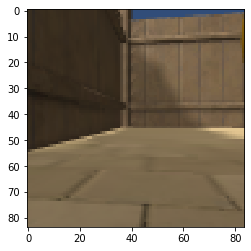

GoodGoalMulti  prob =  0.9999894
CylinderTunnel  prob =  0.028676081
Wall  prob =  0.0015378044
Ramp  prob =  0.0012364485
WallTransparent  prob =  3.6576044e-11
HotZone  prob =  2.9089797e-15
GoodGoal  prob =  4.665802e-16
BadGoal  prob =  2.7216602e-18
CylinderTunnelTransparent  prob =  1.1121965e-18
Cardbox  prob =  6.524187e-20
ULObject  prob =  1.0861196e-22
DeathZone  prob =  5.599338e-23


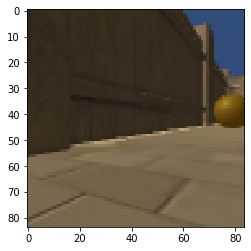

Ramp  prob =  0.8896191
Wall  prob =  0.8830238
CylinderTunnel  prob =  0.044791296
CylinderTunnelTransparent  prob =  0.004544371
WallTransparent  prob =  6.917254e-05
Cardbox  prob =  1.4784275e-09
BadGoal  prob =  1.7820223e-12
HotZone  prob =  2.8587835e-22
ULObject  prob =  7.2698644e-23
DeathZone  prob =  6.4834875e-23
GoodGoal  prob =  3.8076058e-25
GoodGoalMulti  prob =  1.07388975e-26


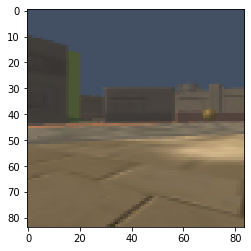

ULObject  prob =  0.9994149
Wall  prob =  0.33616328
Ramp  prob =  0.30415636
CylinderTunnel  prob =  7.377754e-05
DeathZone  prob =  3.0384136e-08
BadGoal  prob =  3.4866637e-11
HotZone  prob =  1.29483355e-20
WallTransparent  prob =  1.2323232e-21
GoodGoal  prob =  2.4933328e-22
Cardbox  prob =  9.195858e-31
CylinderTunnelTransparent  prob =  3.6959634e-34
GoodGoalMulti  prob =  0.0


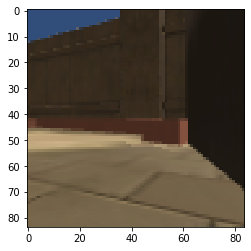

CylinderTunnel  prob =  0.91602933
Ramp  prob =  0.72027427
Wall  prob =  0.10403085
BadGoal  prob =  4.3808466e-14
GoodGoal  prob =  7.5447395e-16
HotZone  prob =  2.4121325e-17
WallTransparent  prob =  3.8322838e-21
GoodGoalMulti  prob =  9.580999e-28
DeathZone  prob =  9.743872e-29
ULObject  prob =  6.204128e-29
Cardbox  prob =  3.7466945e-36
CylinderTunnelTransparent  prob =  0.0


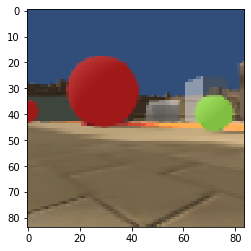

Wall  prob =  0.8467785
Ramp  prob =  0.8033054
CylinderTunnel  prob =  0.60148764
HotZone  prob =  5.550422e-13
Cardbox  prob =  1.3133054e-14
GoodGoal  prob =  1.2019121e-16
BadGoal  prob =  1.8096654e-18
ULObject  prob =  5.714201e-22
DeathZone  prob =  1.2571877e-24
GoodGoalMulti  prob =  8.671869e-29
WallTransparent  prob =  2.405594e-36
CylinderTunnelTransparent  prob =  0.0


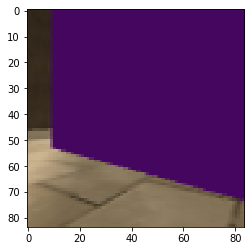

Ramp  prob =  0.41403273
ULObject  prob =  0.12388831
Wall  prob =  0.09099116
CylinderTunnel  prob =  0.020862386
BadGoal  prob =  1.5218604e-22
DeathZone  prob =  6.4810863e-24
HotZone  prob =  7.5432093e-25
WallTransparent  prob =  1.0462749e-27
GoodGoal  prob =  1.3706136e-29
Cardbox  prob =  1.0762258e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


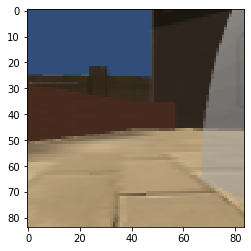

ULObject  prob =  0.9996364
CylinderTunnel  prob =  0.1817742
Ramp  prob =  0.020930562
Wall  prob =  0.0077639595
BadGoal  prob =  7.48437e-07
DeathZone  prob =  5.7551057e-07
HotZone  prob =  5.830316e-11
GoodGoal  prob =  1.4444522e-13
WallTransparent  prob =  5.669361e-16
Cardbox  prob =  1.24258815e-17
CylinderTunnelTransparent  prob =  1.5710645e-19
GoodGoalMulti  prob =  1.8160992e-23


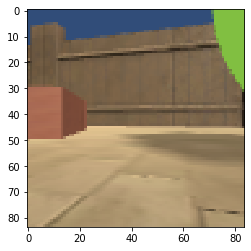

Wall  prob =  0.897003
Ramp  prob =  0.6712966
CylinderTunnel  prob =  0.22074689
HotZone  prob =  2.1015944e-27
Cardbox  prob =  6.6877635e-31
BadGoal  prob =  4.3407168e-32
GoodGoalMulti  prob =  3.2697132e-33
GoodGoal  prob =  3.8175942e-34
ULObject  prob =  1.853447e-36
WallTransparent  prob =  1.800264e-36
CylinderTunnelTransparent  prob =  0.0
DeathZone  prob =  0.0


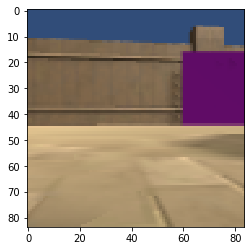

Ramp  prob =  0.45214924
HotZone  prob =  0.42649877
Wall  prob =  0.4149501
WallTransparent  prob =  0.39284375
ULObject  prob =  0.37081414
DeathZone  prob =  0.3656412
CylinderTunnel  prob =  0.34689936
CylinderTunnelTransparent  prob =  0.2378905
Cardbox  prob =  0.08034267
GoodGoalMulti  prob =  0.038161635
GoodGoal  prob =  0.019617982
BadGoal  prob =  0.016113363


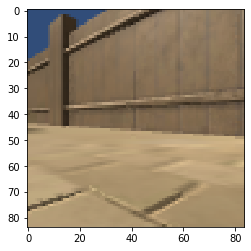

DeathZone  prob =  0.9587877
ULObject  prob =  0.18235151
Ramp  prob =  0.008561382
Wall  prob =  0.0041248496
BadGoal  prob =  6.8719496e-06
CylinderTunnel  prob =  2.1697551e-07
GoodGoal  prob =  1.2998125e-12
WallTransparent  prob =  2.509949e-13
HotZone  prob =  1.9633743e-13
CylinderTunnelTransparent  prob =  2.8445066e-18
Cardbox  prob =  1.4817278e-20
GoodGoalMulti  prob =  7.811265e-26


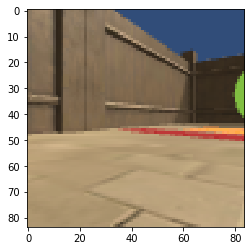

Ramp  prob =  0.0014319848
Wall  prob =  5.7119087e-05
CylinderTunnel  prob =  3.0742171e-06
HotZone  prob =  1.5761811e-09
BadGoal  prob =  2.344234e-16
WallTransparent  prob =  2.059973e-18
GoodGoal  prob =  1.3127394e-18
Cardbox  prob =  6.112189e-20
ULObject  prob =  5.848039e-21
DeathZone  prob =  2.2348384e-22
CylinderTunnelTransparent  prob =  1.5762307e-22
GoodGoalMulti  prob =  3.7400763e-32


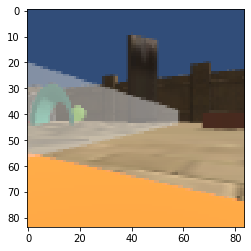

Ramp  prob =  0.4222978
HotZone  prob =  0.4065872
Wall  prob =  0.39771613
WallTransparent  prob =  0.37298462
DeathZone  prob =  0.34206718
CylinderTunnel  prob =  0.33128554
ULObject  prob =  0.32728145
CylinderTunnelTransparent  prob =  0.31205484
Cardbox  prob =  0.1667866
GoodGoalMulti  prob =  0.04120018
BadGoal  prob =  0.034712967
GoodGoal  prob =  0.031625126


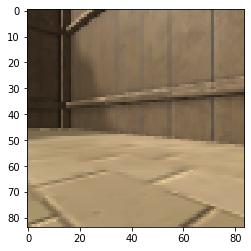

Ramp  prob =  0.99521625
Wall  prob =  0.2655798
CylinderTunnel  prob =  0.16885439
HotZone  prob =  1.5008613e-17
BadGoal  prob =  2.541175e-19
GoodGoal  prob =  1.0588496e-21
ULObject  prob =  4.253145e-22
DeathZone  prob =  6.4897926e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


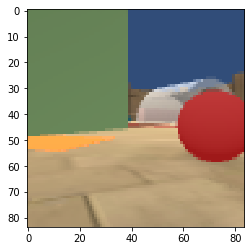

CylinderTunnel  prob =  0.99999833
Ramp  prob =  0.021918854
Wall  prob =  0.0001734869
BadGoal  prob =  1.3888954e-33
Cardbox  prob =  6.2268646e-37
GoodGoal  prob =  8.509354e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


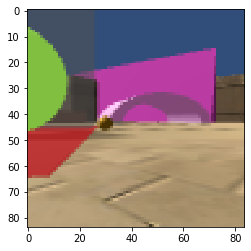

CylinderTunnel  prob =  0.99976295
ULObject  prob =  0.15720205
Ramp  prob =  0.020162834
Wall  prob =  0.00057970703
HotZone  prob =  6.1846055e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


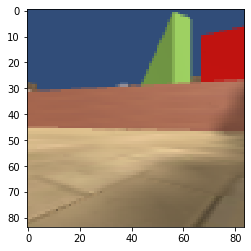

ULObject  prob =  0.3627678
DeathZone  prob =  0.3577351
HotZone  prob =  0.34580228
WallTransparent  prob =  0.34378365
Ramp  prob =  0.3176713
CylinderTunnelTransparent  prob =  0.3149882
Wall  prob =  0.30257508
CylinderTunnel  prob =  0.30202082
Cardbox  prob =  0.19456016
GoodGoalMulti  prob =  0.1314351
GoodGoal  prob =  0.08173291
BadGoal  prob =  0.078640655


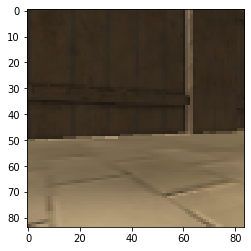

WallTransparent  prob =  0.07116557
GoodGoalMulti  prob =  0.03002327
Wall  prob =  0.022749867
Ramp  prob =  0.020254314
CylinderTunnel  prob =  0.01743433
Cardbox  prob =  0.012350867
CylinderTunnelTransparent  prob =  0.011477115
HotZone  prob =  0.0071312133
BadGoal  prob =  0.0027442048
ULObject  prob =  0.0022238132
GoodGoal  prob =  0.0014357243
DeathZone  prob =  0.0014328177


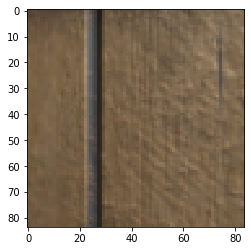

GoodGoal  prob =  0.99998975
Ramp  prob =  0.0055496907
CylinderTunnel  prob =  0.0020607177
Wall  prob =  0.00017655919
BadGoal  prob =  8.6420165e-05
DeathZone  prob =  1.9335092e-14
HotZone  prob =  6.182882e-16
ULObject  prob =  9.587122e-17
Cardbox  prob =  1.8030924e-17
GoodGoalMulti  prob =  3.1520555e-25
WallTransparent  prob =  1.02258116e-25
CylinderTunnelTransparent  prob =  0.0


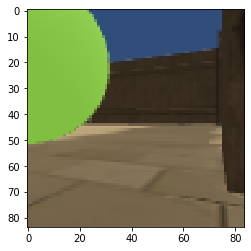

Ramp  prob =  0.98824745
DeathZone  prob =  0.16238627
Wall  prob =  0.010771126
CylinderTunnel  prob =  3.459086e-16
ULObject  prob =  3.3091265e-18
BadGoal  prob =  9.183506e-19
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


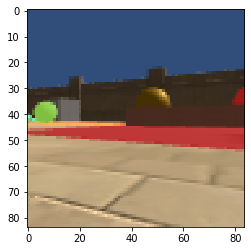

DeathZone  prob =  0.96800405
Ramp  prob =  0.00039477544
Wall  prob =  1.8919842e-05
BadGoal  prob =  5.765642e-12
CylinderTunnel  prob =  4.630668e-12
ULObject  prob =  2.1914222e-13
WallTransparent  prob =  7.400724e-18
GoodGoal  prob =  1.350683e-21
HotZone  prob =  2.4055809e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


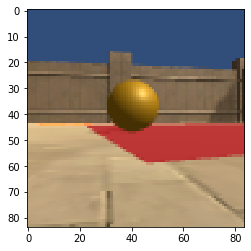

GoodGoalMulti  prob =  0.9999993
Wall  prob =  0.000955405
Ramp  prob =  0.0008927601
CylinderTunnel  prob =  0.00012202545
WallTransparent  prob =  2.3829475e-14
HotZone  prob =  1.1783137e-17
CylinderTunnelTransparent  prob =  2.4794527e-25
GoodGoal  prob =  3.5128558e-27
BadGoal  prob =  3.118843e-31
Cardbox  prob =  8.7266724e-33
DeathZone  prob =  8.72402e-38
ULObject  prob =  4.269445e-39


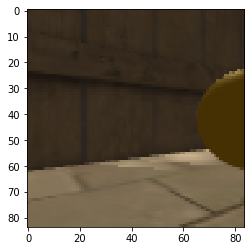

CylinderTunnel  prob =  0.9935587
Ramp  prob =  0.9544206
Wall  prob =  0.0011996112
CylinderTunnelTransparent  prob =  5.7157694e-15
BadGoal  prob =  6.323886e-22
WallTransparent  prob =  1.0444672e-22
Cardbox  prob =  1.0906445e-23
HotZone  prob =  5.78243e-33
GoodGoal  prob =  4.802662e-33
GoodGoalMulti  prob =  3.8468776e-33
ULObject  prob =  1.6877226e-38
DeathZone  prob =  0.0


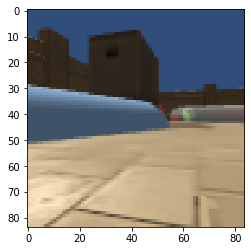

Ramp  prob =  0.99499834
Wall  prob =  0.05726851
CylinderTunnel  prob =  0.022053357
BadGoal  prob =  4.206722e-15
GoodGoal  prob =  2.4857566e-20
WallTransparent  prob =  2.0873142e-22
ULObject  prob =  1.9465168e-24
HotZone  prob =  1.0728287e-27
DeathZone  prob =  1.1956033e-28
Cardbox  prob =  6.140745e-36
GoodGoalMulti  prob =  1.2594978e-37
CylinderTunnelTransparent  prob =  0.0


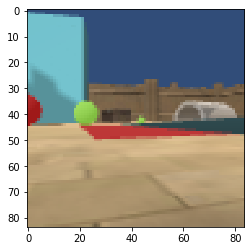

CylinderTunnel  prob =  0.96705943
Ramp  prob =  0.79079145
Wall  prob =  0.69240355
HotZone  prob =  9.7731764e-20
GoodGoal  prob =  8.317286e-22
BadGoal  prob =  1.02455295e-25
ULObject  prob =  2.1184681e-32
GoodGoalMulti  prob =  8.380997e-34
Cardbox  prob =  2.4159518e-34
DeathZone  prob =  6.430923e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0


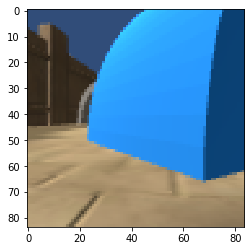

WallTransparent  prob =  0.41335386
ULObject  prob =  0.40254855
HotZone  prob =  0.39934155
CylinderTunnelTransparent  prob =  0.37655476
Ramp  prob =  0.36929885
DeathZone  prob =  0.3673765
Wall  prob =  0.32882178
CylinderTunnel  prob =  0.30696404
Cardbox  prob =  0.24611932
GoodGoalMulti  prob =  0.17126617
BadGoal  prob =  0.13476808
GoodGoal  prob =  0.122304656


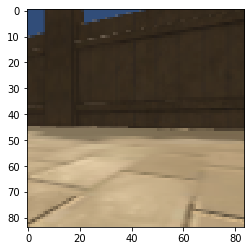

ULObject  prob =  0.9999999
Ramp  prob =  0.018580515
Wall  prob =  0.005757071
CylinderTunnel  prob =  3.079451e-09
BadGoal  prob =  9.589808e-10
DeathZone  prob =  7.1534216e-14
HotZone  prob =  8.762383e-29
WallTransparent  prob =  9.798024e-30
GoodGoal  prob =  1.1764941e-33
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


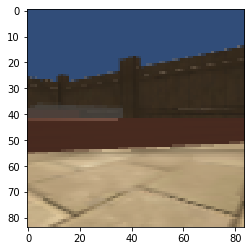

Ramp  prob =  0.75411445
Wall  prob =  0.0030101517
CylinderTunnel  prob =  3.7630633e-07
GoodGoal  prob =  9.491207e-12
ULObject  prob =  4.953824e-13
DeathZone  prob =  1.8756715e-16
BadGoal  prob =  2.601002e-18
Cardbox  prob =  1.3146875e-20
WallTransparent  prob =  5.2505517e-22
HotZone  prob =  6.675193e-25
GoodGoalMulti  prob =  4.2660057e-26
CylinderTunnelTransparent  prob =  0.0


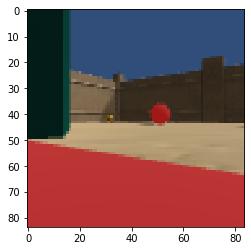

HotZone  prob =  0.99999976
Ramp  prob =  2.4111855e-09
Cardbox  prob =  1.986177e-13
ULObject  prob =  1.8240476e-13
Wall  prob =  8.4252714e-14
DeathZone  prob =  4.6654975e-17
CylinderTunnel  prob =  1.261837e-19
WallTransparent  prob =  4.9459698e-20
BadGoal  prob =  1.5979165e-22
GoodGoalMulti  prob =  2.9246438e-24
GoodGoal  prob =  8.852171e-25
CylinderTunnelTransparent  prob =  1.9996926e-37


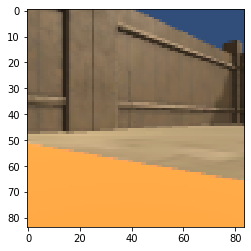

Ramp  prob =  0.6381554
HotZone  prob =  0.2856337
Wall  prob =  0.016269354
CylinderTunnel  prob =  7.555095e-12
ULObject  prob =  4.739971e-21
BadGoal  prob =  1.5304709e-22
DeathZone  prob =  3.439138e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


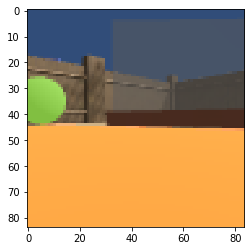

Wall  prob =  0.9808333
Ramp  prob =  0.8104191
CylinderTunnel  prob =  0.64795524
BadGoal  prob =  1.0184948e-30
WallTransparent  prob =  3.1571207e-33
Cardbox  prob =  2.2597724e-33
GoodGoalMulti  prob =  3.1877318e-37
CylinderTunnelTransparent  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


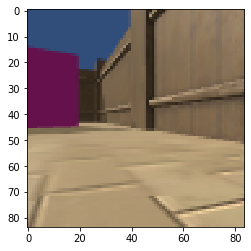

ULObject  prob =  0.9999908
Ramp  prob =  0.0016338597
Wall  prob =  0.0011863259
CylinderTunnel  prob =  1.6045871e-05
BadGoal  prob =  2.0128195e-09
DeathZone  prob =  6.489781e-13
HotZone  prob =  5.8373722e-18
WallTransparent  prob =  1.5534756e-22
GoodGoal  prob =  1.7044263e-25
Cardbox  prob =  7.57425e-36
CylinderTunnelTransparent  prob =  6.5830267e-38
GoodGoalMulti  prob =  0.0


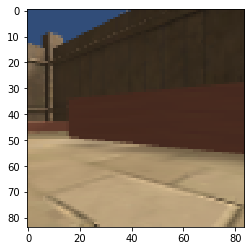

Ramp  prob =  0.9636426
Wall  prob =  0.7601216
CylinderTunnel  prob =  0.26792267
HotZone  prob =  1.3692363e-18
GoodGoal  prob =  1.6952703e-25
ULObject  prob =  1.5487846e-28
BadGoal  prob =  3.4132257e-29
DeathZone  prob =  2.7080892e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


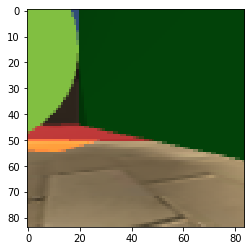

DeathZone  prob =  1.0
Ramp  prob =  2.5090444e-06
Wall  prob =  1.1054072e-08
ULObject  prob =  3.684369e-09
BadGoal  prob =  2.0656228e-18
WallTransparent  prob =  1.8499735e-19
GoodGoal  prob =  8.699433e-22
CylinderTunnel  prob =  4.9532314e-23
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


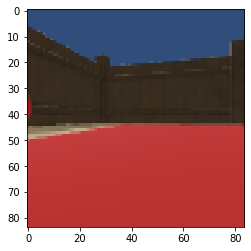

WallTransparent  prob =  0.42410025
HotZone  prob =  0.4229547
Ramp  prob =  0.41987765
Wall  prob =  0.37479362
ULObject  prob =  0.37478855
CylinderTunnel  prob =  0.3336641
DeathZone  prob =  0.32530504
CylinderTunnelTransparent  prob =  0.26740122
Cardbox  prob =  0.20360427
GoodGoalMulti  prob =  0.03494615
GoodGoal  prob =  0.022575414
BadGoal  prob =  0.022306528


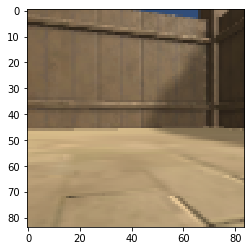

HotZone  prob =  0.99999964
Ramp  prob =  0.8238754
Wall  prob =  0.5517278
CylinderTunnel  prob =  2.4097467e-06
Cardbox  prob =  3.8768676e-20
ULObject  prob =  1.7438302e-22
BadGoal  prob =  1.0596977e-22
GoodGoal  prob =  6.858659e-27
WallTransparent  prob =  3.516286e-28
DeathZone  prob =  2.040284e-30
GoodGoalMulti  prob =  5.3883434e-31
CylinderTunnelTransparent  prob =  0.0


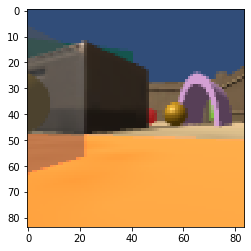

BadGoal  prob =  0.97909
ULObject  prob =  0.48471087
HotZone  prob =  0.086650595
Ramp  prob =  0.052321207
Wall  prob =  0.04648014
DeathZone  prob =  0.03462341
CylinderTunnel  prob =  0.026676452
GoodGoal  prob =  0.018207652
WallTransparent  prob =  0.0042013363
Cardbox  prob =  0.0006289692
GoodGoalMulti  prob =  0.00052378443
CylinderTunnelTransparent  prob =  0.00047882687


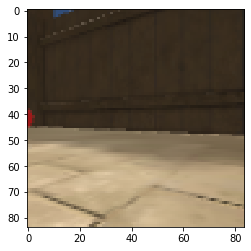

Ramp  prob =  0.96449006
CylinderTunnel  prob =  0.8900555
Wall  prob =  0.7828032
WallTransparent  prob =  7.212971e-20
BadGoal  prob =  5.656919e-23
Cardbox  prob =  8.0334294e-28
GoodGoal  prob =  1.3205578e-28
HotZone  prob =  8.438474e-29
CylinderTunnelTransparent  prob =  5.256826e-29
ULObject  prob =  2.609401e-32
GoodGoalMulti  prob =  3.5159632e-36
DeathZone  prob =  8.635521e-37


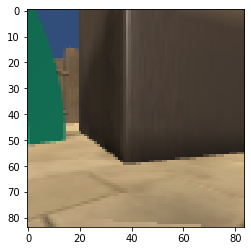

ULObject  prob =  0.19098537
DeathZone  prob =  0.17614198
GoodGoal  prob =  0.14720239
CylinderTunnel  prob =  0.13968866
Ramp  prob =  0.12864095
WallTransparent  prob =  0.118282124
Cardbox  prob =  0.11714145
Wall  prob =  0.11592834
HotZone  prob =  0.101974666
CylinderTunnelTransparent  prob =  0.10039265
BadGoal  prob =  0.0911394
GoodGoalMulti  prob =  0.08022975


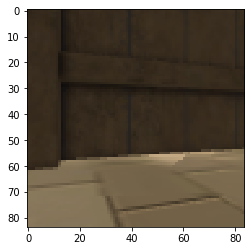

Ramp  prob =  0.43932608
DeathZone  prob =  0.4356746
HotZone  prob =  0.43101913
Wall  prob =  0.42017975
ULObject  prob =  0.36579734
CylinderTunnel  prob =  0.3545822
WallTransparent  prob =  0.34073362
CylinderTunnelTransparent  prob =  0.32094547
Cardbox  prob =  0.17530215
GoodGoalMulti  prob =  0.061813973
BadGoal  prob =  0.047592744
GoodGoal  prob =  0.03759735


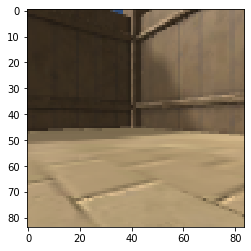

ULObject  prob =  0.11248093
GoodGoal  prob =  0.092477866
DeathZone  prob =  0.08861114
Ramp  prob =  0.08581456
BadGoal  prob =  0.068025775
Wall  prob =  0.06737274
CylinderTunnel  prob =  0.06619562
WallTransparent  prob =  0.06258779
HotZone  prob =  0.061236564
GoodGoalMulti  prob =  0.048915148
CylinderTunnelTransparent  prob =  0.04343469
Cardbox  prob =  0.038969222


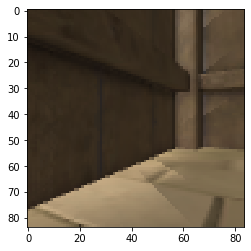

Ramp  prob =  0.008024362
Wall  prob =  0.0053965067
HotZone  prob =  5.4606617e-09
CylinderTunnel  prob =  2.9975025e-09
WallTransparent  prob =  4.2273213e-11
DeathZone  prob =  4.0655534e-11
Cardbox  prob =  3.0955918e-13
BadGoal  prob =  2.5730135e-19
ULObject  prob =  3.6752065e-22
GoodGoal  prob =  7.973442e-27
CylinderTunnelTransparent  prob =  6.5400378e-34
GoodGoalMulti  prob =  2.5486744e-38


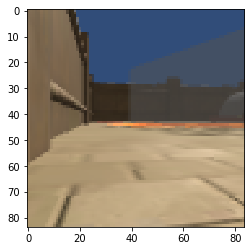

Ramp  prob =  0.19121046
Wall  prob =  0.16399273
CylinderTunnel  prob =  0.009258994
WallTransparent  prob =  5.748403e-08
ULObject  prob =  3.7756354e-09
BadGoal  prob =  1.1892714e-13
CylinderTunnelTransparent  prob =  8.814884e-14
HotZone  prob =  4.827346e-19
Cardbox  prob =  2.6932348e-20
DeathZone  prob =  3.890258e-21
GoodGoal  prob =  4.3306167e-22
GoodGoalMulti  prob =  1.1336344e-27


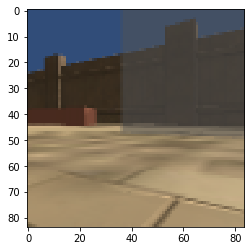

Ramp  prob =  0.32561362
HotZone  prob =  0.31161785
WallTransparent  prob =  0.2893733
ULObject  prob =  0.2821546
Wall  prob =  0.27208278
DeathZone  prob =  0.2700461
CylinderTunnel  prob =  0.2517567
CylinderTunnelTransparent  prob =  0.21589927
Cardbox  prob =  0.033964973
GoodGoalMulti  prob =  0.0166037
GoodGoal  prob =  0.015341696
BadGoal  prob =  0.008553772


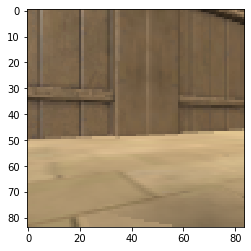

BadGoal  prob =  0.05939535
CylinderTunnel  prob =  0.008293983
ULObject  prob =  0.0020756293
Ramp  prob =  2.6296731e-05
Wall  prob =  6.9014645e-06
DeathZone  prob =  1.3052568e-06
WallTransparent  prob =  6.2188603e-16
GoodGoal  prob =  4.1605816e-16
HotZone  prob =  6.673081e-17
Cardbox  prob =  1.7071193e-26
CylinderTunnelTransparent  prob =  1.9412417e-27
GoodGoalMulti  prob =  3.4722332e-35


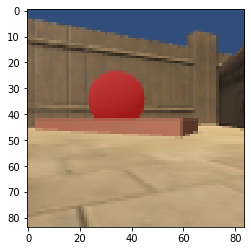

DeathZone  prob =  1.0
Ramp  prob =  0.0047898293
Wall  prob =  0.00020245252
ULObject  prob =  4.888346e-13
BadGoal  prob =  3.9371874e-18
CylinderTunnel  prob =  3.2752185e-18
WallTransparent  prob =  1.1161263e-21
GoodGoal  prob =  5.091954e-32
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


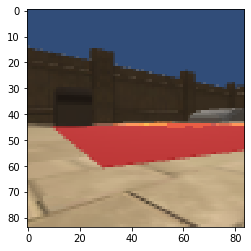

Ramp  prob =  0.9638543
CylinderTunnel  prob =  0.9011371
Wall  prob =  0.025683446
GoodGoalMulti  prob =  2.299676e-21
GoodGoal  prob =  6.931976e-24
HotZone  prob =  1.1438022e-29
WallTransparent  prob =  9.984427e-35
BadGoal  prob =  5.906327e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
DeathZone  prob =  0.0


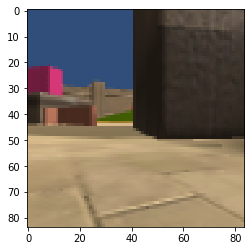

DeathZone  prob =  0.999899
Ramp  prob =  4.5935812e-07
Wall  prob =  9.6336876e-08
GoodGoal  prob =  8.459743e-11
CylinderTunnel  prob =  7.745685e-12
WallTransparent  prob =  4.853504e-14
ULObject  prob =  1.7731907e-15
GoodGoalMulti  prob =  1.9358827e-17
Cardbox  prob =  1.15887e-23
BadGoal  prob =  2.10784e-28
HotZone  prob =  1.3580663e-28
CylinderTunnelTransparent  prob =  0.0


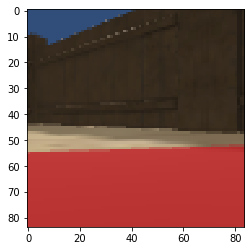

ULObject  prob =  0.99999845
CylinderTunnel  prob =  0.018547453
Wall  prob =  0.007368371
Ramp  prob =  0.005313931
DeathZone  prob =  9.627955e-16
BadGoal  prob =  3.6403428e-19
HotZone  prob =  1.6254983e-20
GoodGoal  prob =  3.1529215e-25
WallTransparent  prob =  3.5716752e-27
Cardbox  prob =  4.485159e-31
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


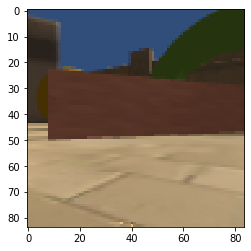

Wall  prob =  0.07674257
Ramp  prob =  0.071686134
WallTransparent  prob =  0.06264352
CylinderTunnel  prob =  0.049029253
CylinderTunnelTransparent  prob =  0.035881035
HotZone  prob =  0.024008974
GoodGoal  prob =  0.022756495
DeathZone  prob =  0.02124654
BadGoal  prob =  0.020177493
ULObject  prob =  0.018453998
GoodGoalMulti  prob =  0.012121591
Cardbox  prob =  0.0049986592


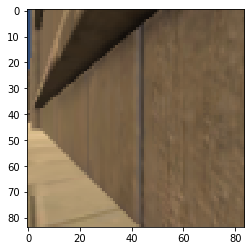

Ramp  prob =  0.97408164
Wall  prob =  0.7186624
CylinderTunnel  prob =  0.00031819183
HotZone  prob =  2.2309272e-12
GoodGoal  prob =  1.849649e-34
WallTransparent  prob =  5.843774e-38
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


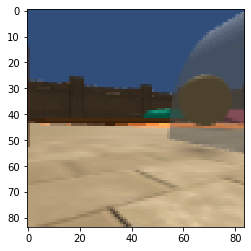

Ramp  prob =  0.9925057
Wall  prob =  0.16751209
CylinderTunnel  prob =  0.11389897
ULObject  prob =  1.5330112e-24
HotZone  prob =  2.433316e-31
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


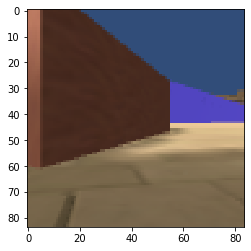

DeathZone  prob =  0.9999958
ULObject  prob =  0.54808855
Ramp  prob =  0.13444988
Wall  prob =  0.00028042585
CylinderTunnel  prob =  7.991925e-08
BadGoal  prob =  2.2577392e-14
GoodGoal  prob =  4.5414697e-18
WallTransparent  prob =  1.0636201e-18
HotZone  prob =  1.1625862e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


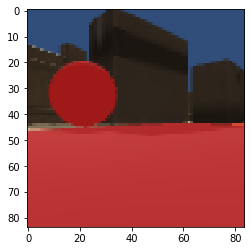

DeathZone  prob =  0.99993265
GoodGoal  prob =  9.7166515e-09
Ramp  prob =  4.628836e-10
Wall  prob =  2.6971914e-10
CylinderTunnel  prob =  2.2403959e-14
WallTransparent  prob =  2.1700583e-14
ULObject  prob =  1.7619422e-17
GoodGoalMulti  prob =  4.772471e-19
Cardbox  prob =  2.1672897e-19
BadGoal  prob =  5.1876425e-28
HotZone  prob =  1.4167025e-29
CylinderTunnelTransparent  prob =  0.0


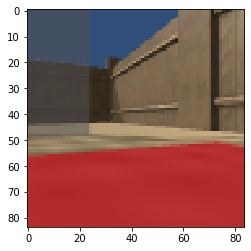

GoodGoalMulti  prob =  0.9830657
CylinderTunnel  prob =  0.2347987
Ramp  prob =  0.2053994
Wall  prob =  0.18078172
GoodGoal  prob =  9.9696364e-05
WallTransparent  prob =  6.5846225e-06
HotZone  prob =  1.951274e-06
Cardbox  prob =  9.415025e-09
BadGoal  prob =  8.504534e-09
CylinderTunnelTransparent  prob =  5.807625e-09
DeathZone  prob =  9.894806e-10
ULObject  prob =  8.8564445e-10


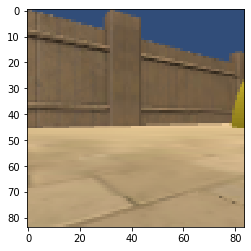

ULObject  prob =  0.9796893
Wall  prob =  0.40858728
CylinderTunnel  prob =  0.276647
Ramp  prob =  0.23484558
BadGoal  prob =  0.028323455
DeathZone  prob =  0.0062846323
HotZone  prob =  0.0011150833
GoodGoal  prob =  0.00080257107
WallTransparent  prob =  0.00020119803
Cardbox  prob =  4.370052e-05
CylinderTunnelTransparent  prob =  2.7586077e-05
GoodGoalMulti  prob =  6.9447096e-06


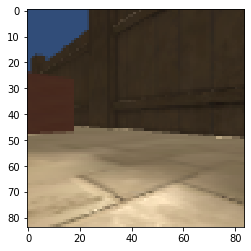

ULObject  prob =  0.35187402
DeathZone  prob =  0.25101605
Wall  prob =  0.20812331
Ramp  prob =  0.20293278
CylinderTunnel  prob =  0.17762788
WallTransparent  prob =  0.15559822
HotZone  prob =  0.15415365
BadGoal  prob =  0.12143151
Cardbox  prob =  0.096088365
GoodGoal  prob =  0.094188705
CylinderTunnelTransparent  prob =  0.0887732
GoodGoalMulti  prob =  0.08072786


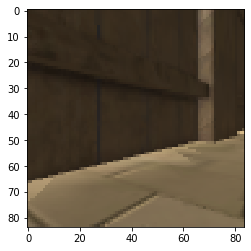

HotZone
Cardbox  prob =  0.9739159
Wall  prob =  0.39735314
Ramp  prob =  0.2843758
CylinderTunnel  prob =  0.060312152
HotZone  prob =  1.5707947e-08
ULObject  prob =  1.0020427e-08
BadGoal  prob =  3.9283092e-09
WallTransparent  prob =  1.4468762e-09
GoodGoal  prob =  7.4020806e-10
DeathZone  prob =  3.7256913e-11
GoodGoalMulti  prob =  3.2638165e-12
CylinderTunnelTransparent  prob =  1.6112738e-13


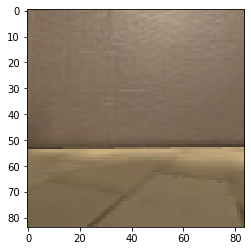

Ramp  prob =  0.8795794
Wall  prob =  0.7559397
CylinderTunnel  prob =  0.24727358
HotZone  prob =  0.0013777929
GoodGoal  prob =  4.2369656e-08
BadGoal  prob =  2.8248014e-20
ULObject  prob =  4.548337e-25
GoodGoalMulti  prob =  3.0699136e-25
DeathZone  prob =  2.9284033e-26
WallTransparent  prob =  5.2307664e-27
Cardbox  prob =  9.0315406e-35
CylinderTunnelTransparent  prob =  0.0


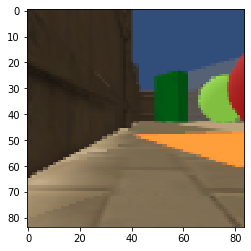

Ramp  prob =  0.95108914
Wall  prob =  0.31667972
CylinderTunnel  prob =  1.5739009e-06
HotZone  prob =  2.847613e-17
GoodGoalMulti  prob =  1.0505172e-29
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
DeathZone  prob =  0.0


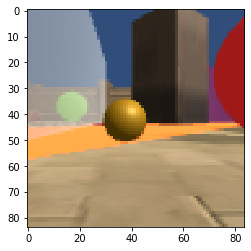

Wall  prob =  0.8594755
Ramp  prob =  0.81239074
CylinderTunnel  prob =  0.69439226
GoodGoal  prob =  0.0033459682
BadGoal  prob =  2.4859622e-07
HotZone  prob =  6.8275824e-08
ULObject  prob =  4.365414e-11
DeathZone  prob =  3.5679525e-11
Cardbox  prob =  7.2449616e-12
GoodGoalMulti  prob =  2.0190186e-12
WallTransparent  prob =  2.0624039e-13
CylinderTunnelTransparent  prob =  5.2616233e-28


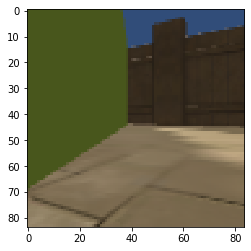

ULObject  prob =  0.99998736
Wall  prob =  0.014969884
Ramp  prob =  0.0143648675
CylinderTunnel  prob =  0.00022397326
DeathZone  prob =  1.0059515e-07
BadGoal  prob =  5.215853e-08
HotZone  prob =  2.6281172e-13
WallTransparent  prob =  1.7994525e-15
GoodGoal  prob =  9.347757e-18
Cardbox  prob =  2.203092e-26
CylinderTunnelTransparent  prob =  1.7522485e-26
GoodGoalMulti  prob =  2.5414334e-29


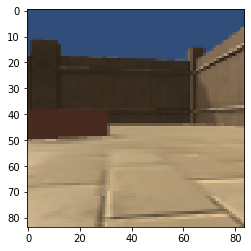

Ramp  prob =  0.9783386
Wall  prob =  0.76248246
CylinderTunnel  prob =  0.00804165
ULObject  prob =  9.606298e-11
DeathZone  prob =  1.0278181e-13
Cardbox  prob =  6.3743376e-14
BadGoal  prob =  2.4857214e-18
HotZone  prob =  1.1034482e-19
WallTransparent  prob =  4.8592883e-20
GoodGoal  prob =  4.3390544e-20
CylinderTunnelTransparent  prob =  5.3533967e-36
GoodGoalMulti  prob =  5.7999147e-37


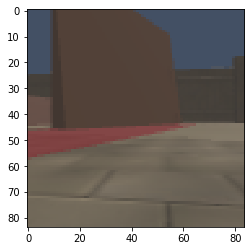

GoodGoal  prob =  0.062415328
CylinderTunnel  prob =  0.0066467617
Ramp  prob =  0.00082804955
Wall  prob =  3.8771093e-05
BadGoal  prob =  5.140602e-06
HotZone  prob =  7.8593145e-14
DeathZone  prob =  9.107332e-15
GoodGoalMulti  prob =  5.8624417e-15
Cardbox  prob =  5.179036e-15
WallTransparent  prob =  8.726534e-19
ULObject  prob =  1.4564919e-21
CylinderTunnelTransparent  prob =  0.0


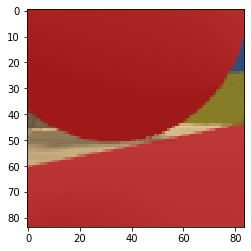

Ramp  prob =  0.85009575
Wall  prob =  0.013271907
ULObject  prob =  0.0034520698
CylinderTunnel  prob =  6.532688e-05
DeathZone  prob =  1.1434214e-16
BadGoal  prob =  1.9563192e-18
HotZone  prob =  1.4920869e-25
GoodGoal  prob =  1.6349159e-32
WallTransparent  prob =  8.741027e-34
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


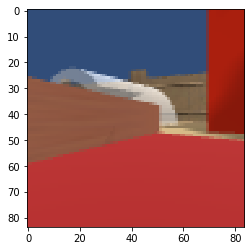

Ramp  prob =  0.9437962
CylinderTunnel  prob =  0.9298243
Wall  prob =  0.0010821904
HotZone  prob =  5.3607644e-32
BadGoal  prob =  2.1921502e-35
GoodGoal  prob =  5.8907362e-36
ULObject  prob =  4.2698873e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


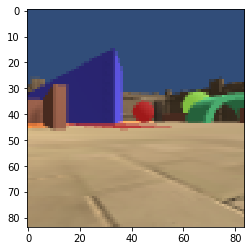

Ramp  prob =  0.707162
Wall  prob =  0.15293068
HotZone  prob =  1.2075915e-05
CylinderTunnel  prob =  3.6830644e-07
GoodGoal  prob =  3.8300495e-20
BadGoal  prob =  1.8273422e-24
ULObject  prob =  1.8078866e-24
DeathZone  prob =  8.0616936e-38
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


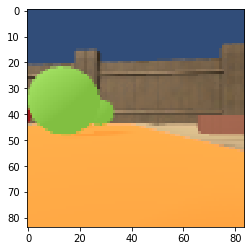

Cardbox  prob =  0.27591217
WallTransparent  prob =  0.26205015
HotZone  prob =  0.2520771
Ramp  prob =  0.24752107
CylinderTunnelTransparent  prob =  0.246276
ULObject  prob =  0.23146403
CylinderTunnel  prob =  0.22845012
DeathZone  prob =  0.21809433
Wall  prob =  0.20343398
GoodGoalMulti  prob =  0.11364924
BadGoal  prob =  0.08914834
GoodGoal  prob =  0.088703044


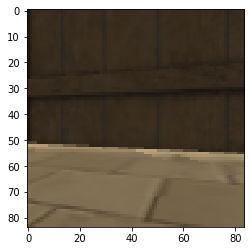

CylinderTunnel  prob =  0.9881838
Ramp  prob =  0.9533118
Wall  prob =  0.0010991618
ULObject  prob =  0.0001110216
DeathZone  prob =  2.3068954e-31
BadGoal  prob =  1.6748621e-32
HotZone  prob =  2.8211618e-35
GoodGoal  prob =  5.183914e-39
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


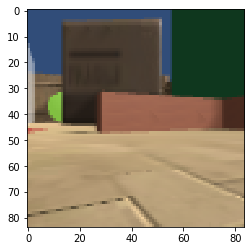

Wall  prob =  0.9077107
Ramp  prob =  0.7782933
CylinderTunnel  prob =  0.18375094
DeathZone  prob =  4.8615766e-13
ULObject  prob =  2.9033718e-14
HotZone  prob =  1.9944136e-14
BadGoal  prob =  1.9254046e-15
GoodGoal  prob =  6.945239e-16
WallTransparent  prob =  1.0054669e-21
Cardbox  prob =  7.827747e-22
GoodGoalMulti  prob =  3.5713307e-29
CylinderTunnelTransparent  prob =  0.0


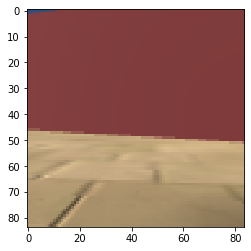

Ramp  prob =  0.9611697
Wall  prob =  0.59188473
CylinderTunnel  prob =  0.039130837
DeathZone  prob =  1.0742395e-06
ULObject  prob =  6.318649e-07
BadGoal  prob =  1.4047571e-12
HotZone  prob =  7.772053e-13
GoodGoal  prob =  9.55203e-19
WallTransparent  prob =  2.7505318e-24
Cardbox  prob =  6.669645e-32
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


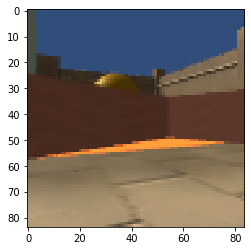

CylinderTunnel  prob =  0.9997733
Ramp  prob =  0.017130492
Wall  prob =  1.263269e-07
BadGoal  prob =  7.2391364e-11
GoodGoal  prob =  1.0331353e-12
HotZone  prob =  6.1321397e-18
WallTransparent  prob =  1.3872483e-26
DeathZone  prob =  2.676868e-27
ULObject  prob =  6.19708e-29
Cardbox  prob =  1.3389042e-29
GoodGoalMulti  prob =  1.0143615e-30
CylinderTunnelTransparent  prob =  0.0


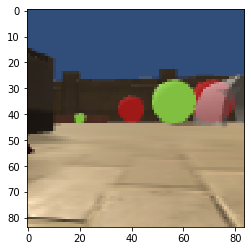

Ramp  prob =  0.98620903
CylinderTunnel  prob =  0.6415772
Wall  prob =  0.43953505
ULObject  prob =  2.5920438e-10
BadGoal  prob =  8.926232e-32
HotZone  prob =  2.2854954e-32
DeathZone  prob =  3.2549645e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


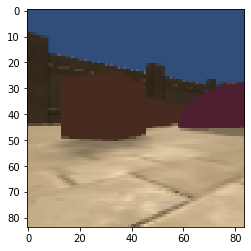

HotZone  prob =  0.08609323
ULObject  prob =  0.085830495
DeathZone  prob =  0.064104214
CylinderTunnel  prob =  0.050399702
WallTransparent  prob =  0.046461232
Ramp  prob =  0.042770483
Wall  prob =  0.040359065
CylinderTunnelTransparent  prob =  0.030855013
BadGoal  prob =  0.017973134
GoodGoal  prob =  0.01698277
Cardbox  prob =  0.013768967
GoodGoalMulti  prob =  0.008302388


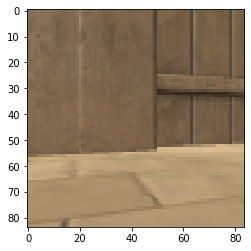

HotZone  prob =  0.8781889
Cardbox  prob =  0.018680386
ULObject  prob =  1.7871649e-09
WallTransparent  prob =  3.3556127e-11
Ramp  prob =  4.98366e-12
DeathZone  prob =  1.4326054e-12
Wall  prob =  1.1498964e-14
BadGoal  prob =  5.884101e-17
GoodGoalMulti  prob =  1.4115864e-17
CylinderTunnel  prob =  7.543926e-18
GoodGoal  prob =  2.630155e-19
CylinderTunnelTransparent  prob =  5.79482e-25


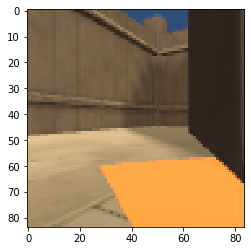

Ramp  prob =  0.95615107
Wall  prob =  0.15037706
HotZone  prob =  5.5638615e-05
CylinderTunnel  prob =  2.917356e-07
ULObject  prob =  5.1081212e-17
BadGoal  prob =  6.1037013e-22
DeathZone  prob =  4.294997e-30
WallTransparent  prob =  4.8610443e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


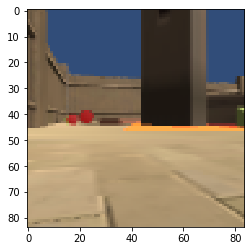

Ramp  prob =  0.98525304
CylinderTunnel  prob =  0.4125834
Wall  prob =  0.048841737
HotZone  prob =  7.943768e-15
BadGoal  prob =  1.2160616e-23
GoodGoal  prob =  2.0098982e-26
ULObject  prob =  1.3966218e-31
WallTransparent  prob =  1.842709e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


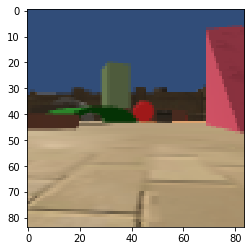

Ramp  prob =  0.407331
HotZone  prob =  0.4019291
Wall  prob =  0.3584906
WallTransparent  prob =  0.35620037
CylinderTunnel  prob =  0.3173789
DeathZone  prob =  0.31299835
ULObject  prob =  0.27714276
CylinderTunnelTransparent  prob =  0.21876024
Cardbox  prob =  0.050612405
GoodGoalMulti  prob =  0.011305233
GoodGoal  prob =  0.009373996
BadGoal  prob =  0.008555539


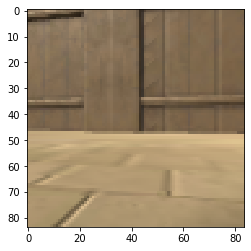

Ramp  prob =  0.9999819
CylinderTunnel  prob =  0.0010927364
Wall  prob =  9.112195e-05
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


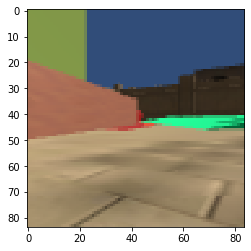

Ramp  prob =  0.6485063
Wall  prob =  0.13366412
CylinderTunnel  prob =  0.042553034
ULObject  prob =  2.6332891e-10
BadGoal  prob =  1.2607762e-15
DeathZone  prob =  3.1811056e-18
HotZone  prob =  1.06288954e-19
GoodGoal  prob =  5.4664353e-24
WallTransparent  prob =  2.0268125e-27
Cardbox  prob =  1.0603665e-34
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


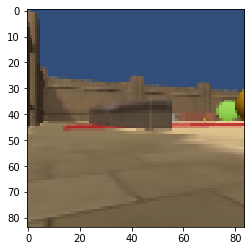

Ramp  prob =  0.59851134
Wall  prob =  0.29134744
CylinderTunnel  prob =  0.051526625
WallTransparent  prob =  0.0012971399
CylinderTunnelTransparent  prob =  0.0005059957
BadGoal  prob =  2.7858772e-07
HotZone  prob =  3.1103188e-08
DeathZone  prob =  2.4947049e-09
Cardbox  prob =  6.7664885e-10
ULObject  prob =  1.2480485e-10
GoodGoal  prob =  6.045572e-11
GoodGoalMulti  prob =  2.0660811e-17


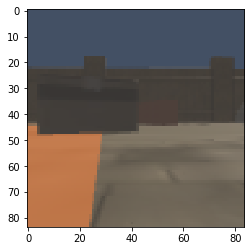

ULObject  prob =  0.99998355
Ramp  prob =  0.019944618
Wall  prob =  0.018455558
CylinderTunnel  prob =  0.012862058
BadGoal  prob =  9.050237e-08
DeathZone  prob =  2.2154376e-08
HotZone  prob =  3.7776737e-09
WallTransparent  prob =  3.5145042e-12
GoodGoal  prob =  3.3437383e-13
Cardbox  prob =  1.5921167e-16
GoodGoalMulti  prob =  8.470713e-17
CylinderTunnelTransparent  prob =  1.3612518e-19


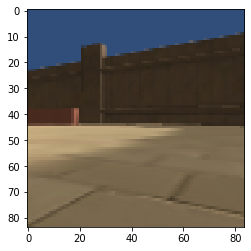

HotZone  prob =  0.4761206
Ramp  prob =  0.47241193
Wall  prob =  0.4488673
WallTransparent  prob =  0.44691542
ULObject  prob =  0.43300837
DeathZone  prob =  0.42102525
CylinderTunnel  prob =  0.38142762
CylinderTunnelTransparent  prob =  0.31108
Cardbox  prob =  0.08890969
BadGoal  prob =  0.017408969
GoodGoalMulti  prob =  0.016340924
GoodGoal  prob =  0.011347187


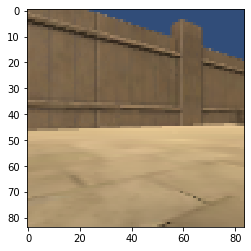

CylinderTunnel  prob =  0.05107556
Wall  prob =  0.050303817
Ramp  prob =  0.04983326
ULObject  prob =  0.04006944
WallTransparent  prob =  0.03772787
HotZone  prob =  0.037486378
DeathZone  prob =  0.022539781
CylinderTunnelTransparent  prob =  0.020405894
BadGoal  prob =  0.014586628
GoodGoal  prob =  0.012533065
GoodGoalMulti  prob =  0.0059291124
Cardbox  prob =  0.005085834


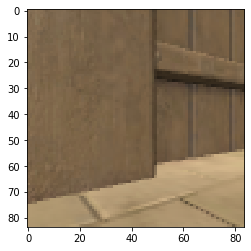

Ramp  prob =  0.43403745
HotZone  prob =  0.4323312
WallTransparent  prob =  0.4311728
DeathZone  prob =  0.4117821
Wall  prob =  0.4085443
ULObject  prob =  0.38001522
CylinderTunnel  prob =  0.36795682
CylinderTunnelTransparent  prob =  0.35229102
Cardbox  prob =  0.24617976
GoodGoalMulti  prob =  0.13694097
BadGoal  prob =  0.113607846
GoodGoal  prob =  0.11274099


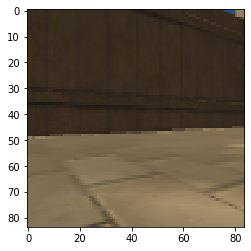

CylinderTunnel  prob =  1.0
Ramp  prob =  4.9382794e-12
ULObject  prob =  8.639677e-21
Wall  prob =  3.3129486e-21
BadGoal  prob =  1.0989909e-27
Cardbox  prob =  5.034404e-37
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


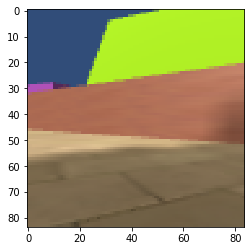

Ramp  prob =  0.9056736
Wall  prob =  0.12966116
HotZone  prob =  0.06332509
ULObject  prob =  1.2870477e-09
CylinderTunnel  prob =  1.05990425e-10
BadGoal  prob =  1.6166421e-21
DeathZone  prob =  1.5307458e-29
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


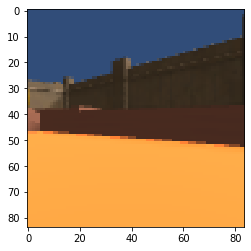

Ramp  prob =  0.9560251
CylinderTunnel  prob =  0.9172826
Wall  prob =  0.045735404
HotZone  prob =  1.3927086e-20
Cardbox  prob =  7.606088e-24
BadGoal  prob =  1.7001867e-24
ULObject  prob =  2.2754112e-26
GoodGoal  prob =  5.1099443e-28
WallTransparent  prob =  7.7957874e-33
DeathZone  prob =  3.8460522e-35
GoodGoalMulti  prob =  1.8412696e-36
CylinderTunnelTransparent  prob =  0.0


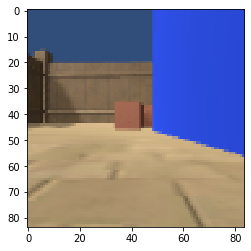

Cardbox  prob =  0.3992558
WallTransparent  prob =  0.39854836
CylinderTunnelTransparent  prob =  0.3225462
DeathZone  prob =  0.28891793
HotZone  prob =  0.27574316
ULObject  prob =  0.2574556
Ramp  prob =  0.24184683
Wall  prob =  0.22472927
GoodGoalMulti  prob =  0.21202734
CylinderTunnel  prob =  0.19188268
GoodGoal  prob =  0.1780409
BadGoal  prob =  0.055546552


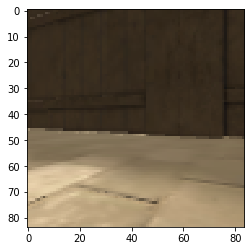

Cardbox  prob =  0.98929465
WallTransparent  prob =  0.18803354
CylinderTunnelTransparent  prob =  0.1556859
Wall  prob =  0.12566559
Ramp  prob =  0.10806707
CylinderTunnel  prob =  0.081453905
HotZone  prob =  0.0065911207
GoodGoalMulti  prob =  0.0062167537
ULObject  prob =  0.0028596937
DeathZone  prob =  0.000797946
BadGoal  prob =  0.0006964752
GoodGoal  prob =  0.00014325646


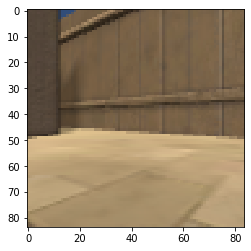

CylinderTunnel  prob =  0.8509841
Wall  prob =  0.84834564
Ramp  prob =  0.78524643
Cardbox  prob =  8.983996e-10
HotZone  prob =  2.288541e-24
BadGoal  prob =  1.0878309e-24
GoodGoal  prob =  2.5933035e-26
ULObject  prob =  1.04667875e-26
WallTransparent  prob =  1.7403293e-28
DeathZone  prob =  1.6776372e-32
GoodGoalMulti  prob =  3.258603e-35
CylinderTunnelTransparent  prob =  0.0


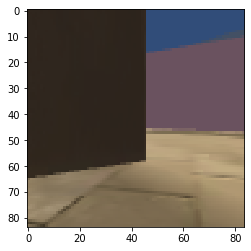

Ramp  prob =  0.92736614
Wall  prob =  0.848002
CylinderTunnel  prob =  0.4694208
HotZone  prob =  1.1288444e-12
BadGoal  prob =  1.1509083e-17
DeathZone  prob =  2.8295779e-21
ULObject  prob =  5.0448953e-24
GoodGoal  prob =  6.4397936e-28
WallTransparent  prob =  1.7533838e-35
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


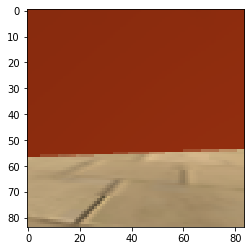

Ramp  prob =  0.122897305
CylinderTunnel  prob =  0.07742123
Wall  prob =  0.00041213122
GoodGoal  prob =  3.320685e-05
DeathZone  prob =  3.578099e-07
BadGoal  prob =  5.743115e-10
Cardbox  prob =  1.1798061e-11
HotZone  prob =  4.6823893e-14
ULObject  prob =  1.623802e-14
GoodGoalMulti  prob =  2.1030417e-16
WallTransparent  prob =  4.1342943e-20
CylinderTunnelTransparent  prob =  1.0282198e-36


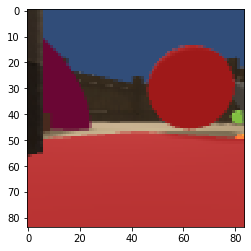

Ramp  prob =  0.89272106
Wall  prob =  0.16554587
CylinderTunnel  prob =  0.059779577
CylinderTunnelTransparent  prob =  9.649067e-07
BadGoal  prob =  7.864613e-09
WallTransparent  prob =  2.8512874e-09
GoodGoal  prob =  7.2527964e-17
DeathZone  prob =  4.021281e-17
HotZone  prob =  1.5700581e-19
Cardbox  prob =  2.9412646e-20
ULObject  prob =  5.264312e-21
GoodGoalMulti  prob =  6.744837e-26


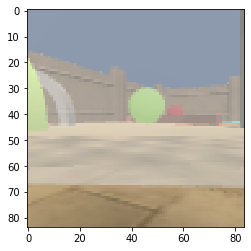

Ramp  prob =  0.4174935
Wall  prob =  0.11901768
CylinderTunnel  prob =  0.021579955
GoodGoal  prob =  4.628706e-09
BadGoal  prob =  7.6859205e-12
Cardbox  prob =  1.7107772e-14
GoodGoalMulti  prob =  1.0490069e-15
WallTransparent  prob =  3.6243444e-16
HotZone  prob =  7.1246224e-18
DeathZone  prob =  5.402475e-19
ULObject  prob =  2.9227366e-24
CylinderTunnelTransparent  prob =  2.9753328e-28


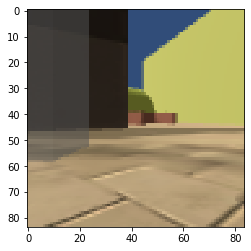

BadGoal  prob =  0.9999937
CylinderTunnel  prob =  0.00017134707
GoodGoal  prob =  8.340199e-06
Cardbox  prob =  6.0200346e-06
Ramp  prob =  2.9594227e-07
Wall  prob =  1.2732194e-07
DeathZone  prob =  5.777102e-08
HotZone  prob =  1.1412118e-09
GoodGoalMulti  prob =  7.016023e-11
WallTransparent  prob =  2.4736603e-11
ULObject  prob =  3.553345e-18
CylinderTunnelTransparent  prob =  5.493333e-26


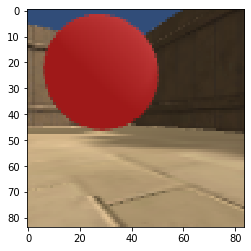

BadGoal  prob =  0.99860626
ULObject  prob =  0.012302773
Ramp  prob =  0.003509085
Wall  prob =  0.0020627955
CylinderTunnel  prob =  0.00019117685
DeathZone  prob =  5.9522444e-07
HotZone  prob =  1.594185e-10
GoodGoal  prob =  1.3468111e-10
WallTransparent  prob =  1.0562695e-10
Cardbox  prob =  1.0422937e-15
CylinderTunnelTransparent  prob =  1.9894173e-18
GoodGoalMulti  prob =  3.2920611e-21


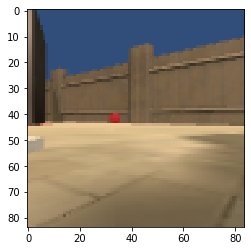

CylinderTunnel  prob =  0.98581886
Ramp  prob =  0.4242237
Wall  prob =  0.08817093
BadGoal  prob =  2.8955647e-09
HotZone  prob =  1.198383e-11
Cardbox  prob =  6.2604938e-15
WallTransparent  prob =  4.3162012e-15
GoodGoal  prob =  8.158486e-18
GoodGoalMulti  prob =  1.6869149e-19
ULObject  prob =  6.763947e-21
DeathZone  prob =  1.6363219e-22
CylinderTunnelTransparent  prob =  4.040803e-28


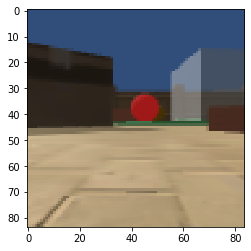

Wall  prob =  0.8605945
Ramp  prob =  0.85198224
CylinderTunnel  prob =  0.42920765
HotZone  prob =  2.701215e-23
GoodGoal  prob =  3.8668273e-26
BadGoal  prob =  7.5544456e-31
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
ULObject  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


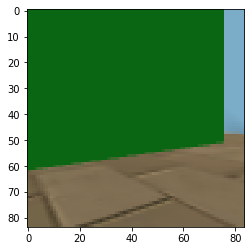

ULObject  prob =  0.9999999
CylinderTunnel  prob =  0.018189002
Ramp  prob =  0.0031746817
Wall  prob =  0.00029847023
DeathZone  prob =  1.152218e-31
BadGoal  prob =  6.1068114e-33
HotZone  prob =  2.749878e-34
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
GoodGoalMulti  prob =  0.0


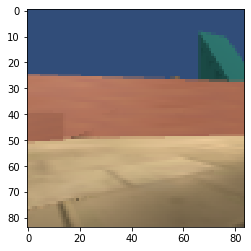

CylinderTunnelTransparent  prob =  0.041644167
CylinderTunnel  prob =  0.026585715
Ramp  prob =  0.020570815
GoodGoalMulti  prob =  0.0178101
Wall  prob =  0.0173175
ULObject  prob =  0.015645375
WallTransparent  prob =  0.014025218
HotZone  prob =  0.01373157
Cardbox  prob =  0.010784664
BadGoal  prob =  0.0046899887
DeathZone  prob =  0.00415653
GoodGoal  prob =  0.0018669209


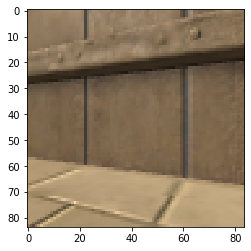

ULObject  prob =  0.9995567
Ramp  prob =  0.02969115
Wall  prob =  0.025767194
CylinderTunnel  prob =  0.0040928815
DeathZone  prob =  7.636869e-11
HotZone  prob =  1.3438215e-14
BadGoal  prob =  6.6071797e-15
WallTransparent  prob =  1.5438612e-18
GoodGoal  prob =  1.4478107e-22
Cardbox  prob =  1.1024575e-30
CylinderTunnelTransparent  prob =  9.478217e-31
GoodGoalMulti  prob =  1.4938155e-36


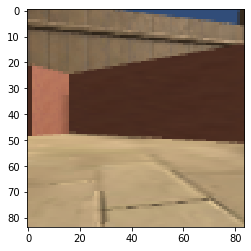

CylinderTunnel  prob =  0.9402904
Wall  prob =  0.87859786
Ramp  prob =  0.54984087
BadGoal  prob =  2.5777594e-11
HotZone  prob =  7.392302e-14
GoodGoal  prob =  6.9640455e-17
Cardbox  prob =  4.078346e-18
WallTransparent  prob =  1.1658471e-19
DeathZone  prob =  8.9443815e-21
GoodGoalMulti  prob =  4.916715e-21
ULObject  prob =  5.228919e-24
CylinderTunnelTransparent  prob =  0.0


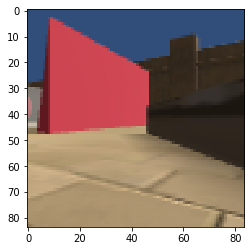

CylinderTunnel  prob =  0.9869431
Ramp  prob =  0.9149314
Wall  prob =  0.052438956
ULObject  prob =  2.6316725e-25
BadGoal  prob =  8.3188385e-30
GoodGoal  prob =  7.189913e-30
HotZone  prob =  4.9817086e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0


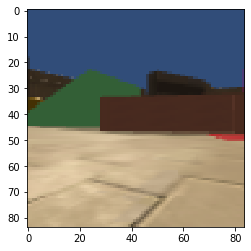

Wall  prob =  0.81600165
Ramp  prob =  0.7966303
CylinderTunnel  prob =  0.7279713
BadGoal  prob =  8.829932e-13
HotZone  prob =  7.0611773e-13
Cardbox  prob =  4.754811e-14
ULObject  prob =  1.1383735e-15
GoodGoal  prob =  9.064348e-16
WallTransparent  prob =  2.2238832e-16
GoodGoalMulti  prob =  2.2396918e-17
DeathZone  prob =  1.5209973e-20
CylinderTunnelTransparent  prob =  5.4593566e-29


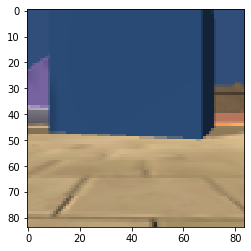

CylinderTunnel  prob =  0.69094586
Ramp  prob =  0.0025000554
Wall  prob =  6.0308757e-05
GoodGoal  prob =  2.1282856e-05
BadGoal  prob =  3.39198e-06
HotZone  prob =  6.1795128e-15
ULObject  prob =  1.9249545e-17
WallTransparent  prob =  2.1591956e-18
DeathZone  prob =  5.1750167e-19
Cardbox  prob =  1.0179284e-21
GoodGoalMulti  prob =  8.471622e-31
CylinderTunnelTransparent  prob =  0.0


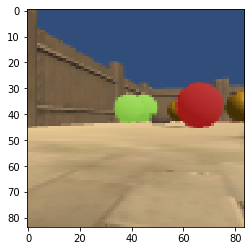

HotZone  prob =  0.9999995
Ramp  prob =  0.22059385
Wall  prob =  0.015710166
CylinderTunnel  prob =  3.2229796e-13
BadGoal  prob =  6.1882254e-20
DeathZone  prob =  3.072592e-28
GoodGoal  prob =  4.6630646e-30
WallTransparent  prob =  2.7627503e-32
ULObject  prob =  5.5976322e-37
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


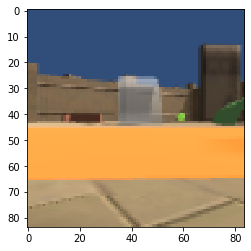

Wall  prob =  0.9801983
Ramp  prob =  0.6510055
CylinderTunnel  prob =  0.2843178
Cardbox  prob =  1.1787789e-21
GoodGoalMulti  prob =  3.4815938e-22
HotZone  prob =  1.1967784e-24
WallTransparent  prob =  2.935574e-25
GoodGoal  prob =  3.29866e-29
BadGoal  prob =  8.256521e-31
CylinderTunnelTransparent  prob =  8.89406e-36
ULObject  prob =  1.0330636e-36
DeathZone  prob =  5.2306e-37


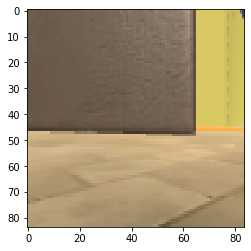

GoodGoal  prob =  1.0
Ramp  prob =  0.00025348918
CylinderTunnel  prob =  5.2337145e-05
Wall  prob =  1.8792838e-06
BadGoal  prob =  1.4511621e-10
HotZone  prob =  1.744278e-12
WallTransparent  prob =  6.104731e-13
ULObject  prob =  7.085163e-17
DeathZone  prob =  1.9602271e-17
GoodGoalMulti  prob =  3.217853e-19
Cardbox  prob =  2.8653846e-25
CylinderTunnelTransparent  prob =  6.8875245e-35


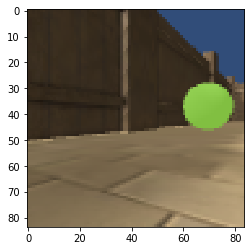

Ramp  prob =  0.36040545
ULObject  prob =  0.32328495
HotZone  prob =  0.31877154
DeathZone  prob =  0.31109977
WallTransparent  prob =  0.30815277
CylinderTunnel  prob =  0.30771166
Wall  prob =  0.28743967
CylinderTunnelTransparent  prob =  0.22286205
GoodGoalMulti  prob =  0.034970555
Cardbox  prob =  0.03419419
GoodGoal  prob =  0.026358075
BadGoal  prob =  0.014118013


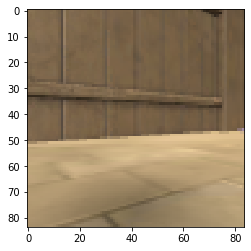

Wall  prob =  0.9988657
Ramp  prob =  0.9985689
CylinderTunnel  prob =  9.47608e-13
ULObject  prob =  2.8979233e-32
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoal  prob =  0.0
BadGoal  prob =  0.0
GoodGoalMulti  prob =  0.0
DeathZone  prob =  0.0
HotZone  prob =  0.0


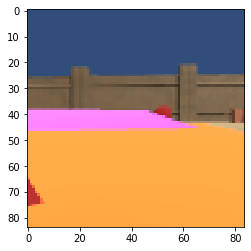

Ramp  prob =  0.9855532
Wall  prob =  0.8715821
HotZone  prob =  0.13933621
CylinderTunnel  prob =  1.0995119e-06
ULObject  prob =  3.9075593e-19
BadGoal  prob =  1.082078e-24
Cardbox  prob =  3.3106375e-28
GoodGoal  prob =  7.889496e-31
DeathZone  prob =  3.518374e-31
WallTransparent  prob =  3.7532748e-36
CylinderTunnelTransparent  prob =  0.0
GoodGoalMulti  prob =  0.0


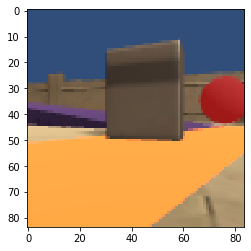

CylinderTunnel  prob =  0.9323805
Ramp  prob =  0.72573173
Wall  prob =  0.15154918
ULObject  prob =  5.4717177e-05
BadGoal  prob =  3.153687e-20
HotZone  prob =  5.5071867e-24
DeathZone  prob =  7.7150794e-26
GoodGoal  prob =  7.625181e-30
WallTransparent  prob =  3.6027597e-30
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


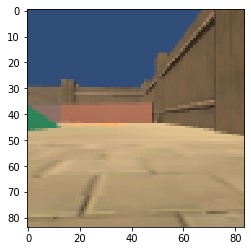

ULObject  prob =  0.38888404
WallTransparent  prob =  0.38546908
HotZone  prob =  0.38053045
DeathZone  prob =  0.35538
CylinderTunnelTransparent  prob =  0.33497193
Ramp  prob =  0.31878296
Wall  prob =  0.2964889
Cardbox  prob =  0.28486723
CylinderTunnel  prob =  0.27505836
GoodGoalMulti  prob =  0.26833522
GoodGoal  prob =  0.12947595
BadGoal  prob =  0.06679723


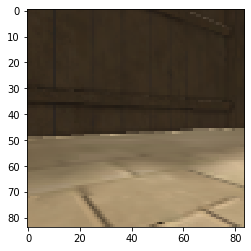

Ramp  prob =  0.9754646
Wall  prob =  0.3441745
CylinderTunnel  prob =  0.17279267
BadGoal  prob =  6.781217e-25
HotZone  prob =  2.1491522e-27
WallTransparent  prob =  1.1654721e-29
GoodGoal  prob =  2.3915656e-30
Cardbox  prob =  6.285127e-34
ULObject  prob =  7.687458e-35
GoodGoalMulti  prob =  2.0614544e-37
DeathZone  prob =  7.891872e-39
CylinderTunnelTransparent  prob =  0.0


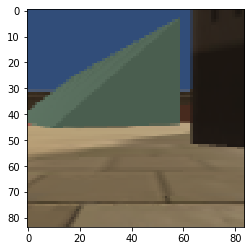

DeathZone  prob =  0.7552763
Ramp  prob =  0.02459009
ULObject  prob =  0.010543333
Wall  prob =  8.05136e-05
BadGoal  prob =  4.885758e-06
CylinderTunnel  prob =  4.0825958e-14
WallTransparent  prob =  8.6622864e-20
GoodGoal  prob =  2.020928e-36
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0
HotZone  prob =  0.0


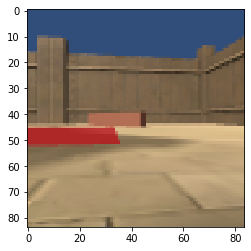

CylinderTunnel  prob =  0.92193353
Ramp  prob =  0.88616145
Wall  prob =  0.047712706
ULObject  prob =  1.6282886e-08
BadGoal  prob =  6.691203e-25
HotZone  prob =  1.0945028e-25
DeathZone  prob =  2.6921878e-27
GoodGoal  prob =  4.355204e-36
WallTransparent  prob =  0.0
CylinderTunnelTransparent  prob =  0.0
Cardbox  prob =  0.0
GoodGoalMulti  prob =  0.0


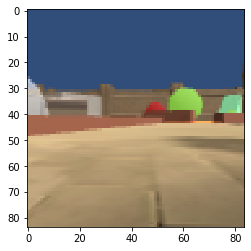

Ramp  prob =  0.37966824
CylinderTunnel  prob =  0.34242302
Wall  prob =  0.11950205
GoodGoal  prob =  0.01665715
ULObject  prob =  1.2953638e-10
HotZone  prob =  3.7030986e-11
Cardbox  prob =  2.8730228e-11
WallTransparent  prob =  1.45231605e-11
DeathZone  prob =  1.3230066e-12
BadGoal  prob =  3.3903495e-13
GoodGoalMulti  prob =  1.0731223e-14
CylinderTunnelTransparent  prob =  3.1488682e-19


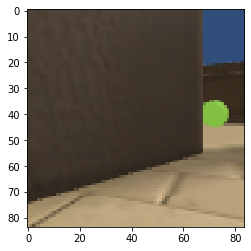

Wall  prob =  0.8981675
Ramp  prob =  0.78230655
CylinderTunnel  prob =  0.5831913
HotZone  prob =  1.0639425e-07
Cardbox  prob =  9.031139e-10
BadGoal  prob =  8.381707e-10
GoodGoal  prob =  3.9477763e-10
ULObject  prob =  1.6785842e-10
DeathZone  prob =  3.1241305e-12
GoodGoalMulti  prob =  1.0227725e-17
WallTransparent  prob =  2.8090836e-18
CylinderTunnelTransparent  prob =  3.6843486e-35


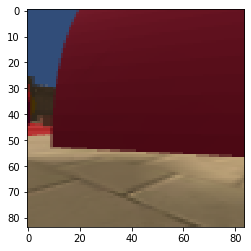

CylinderTunnel  prob =  0.1360407
ULObject  prob =  0.10966913
Wall  prob =  0.08377546
Ramp  prob =  0.08090571
HotZone  prob =  0.06747429
WallTransparent  prob =  0.060026057
DeathZone  prob =  0.057682868
CylinderTunnelTransparent  prob =  0.039068524
GoodGoal  prob =  0.03744605
GoodGoalMulti  prob =  0.03014028
Cardbox  prob =  0.02995866
BadGoal  prob =  0.016497318


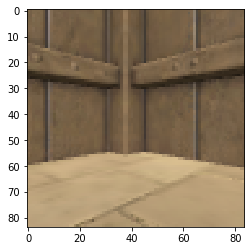

HotZone  prob =  0.99832314
Ramp  prob =  0.32040685
Wall  prob =  0.0028665124
CylinderTunnel  prob =  3.1066714e-09
ULObject  prob =  2.3962267e-12
DeathZone  prob =  1.0906718e-19
BadGoal  prob =  8.615689e-20
GoodGoal  prob =  1.1922783e-21
WallTransparent  prob =  7.9395846e-23
Cardbox  prob =  1.8142831e-25
CylinderTunnelTransparent  prob =  2.2598442e-38
GoodGoalMulti  prob =  0.0


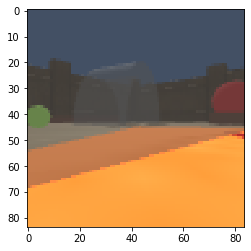

In [7]:
import numpy as np

from matplotlib import pyplot as plt
%matplotlib inline

for class_id, object_class in enumerate(CLASSES):
        #cfg = make_config([object_class], BATCH_SIZE)
        #cfg = make_config(CLASSES, BATCH_SIZE)
        obs = wrapped_env.reset()
        log_probs = classifier(obs)
        probs = torch.sigmoid(log_probs.cpu().detach()).numpy()
        print(object_class)
        for i, img in enumerate(obs):
            img = img.cpu().numpy()
            plt.imshow(img.transpose(1, 2, 0))
            #print(classes_in_arena[i])
            indexes = np.argsort(-probs[i])
            for ind in indexes:
                print(CLASSES[ind], ' prob = ',probs[i][ind])
            plt.pause(0.1)



In [ ]:
len(CLASSES)